## Evaluation & Exploration

In [153]:
import pandas as pd
import torch
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sentence_transformers import SentenceTransformer, LoggingHandler, losses, models, util
from sentence_transformers.readers import InputExample
from sentence_transformers.evaluation import EmbeddingSimilarityEvaluator

### Explore data

In [23]:
# prepare corpus
dataset = pd.read_csv('data.csv')
dataset.shape

(17055, 5)

In [174]:
# basic corpus analysis
corpus_label_counts = dataset.value_counts(['label'])
corpus_label_counts

label            
restaurant-search    3042
movie-search         2669
flight-search        2293
music-search         1527
pizza-order          1376
coffee-order         1260
movie-ticket         1213
auto-repair-appt     1098
food-order           1009
ride-book             997
restaurant-book       571
dtype: int64

In [183]:
# train_dev_test_split = [0.6, 0.2, 0.2]
train_corpus, dev_corpus, test_corpus = [], [], []
for idx in corpus_label_counts.index.tolist():
    label = idx[0]
    all_data = dataset[dataset['label'] == label].reset_index(drop=True)
    train_corpus.append(all_data[:int(len(all_data) * 0.6)])
    dev_corpus.append(all_data[int(len(all_data) * 0.6) : int(len(all_data) * 0.7)])
    test_corpus.append(all_data[int(len(all_data) * 0.7):])
train_corpus = pd.concat(train_corpus)
dev_corpus = pd.concat(dev_corpus)
test_corpus = pd.concat(test_corpus)
print("train data size: ", len(train_corpus), ", dev data size: ", len(dev_corpus), ", test data size: ", len(test_corpus))

train data size:  10228 , dev data size:  1706 , test data size:  5121


In [184]:
print("train:\n")
print(train_corpus['label'].value_counts())
print("\n dev: \n")
print(dev_corpus['label'].value_counts())
print("\n test: \n")
print(test_corpus['label'].value_counts())

train:

restaurant-search    1825
movie-search         1601
flight-search        1375
music-search          916
pizza-order           825
coffee-order          756
movie-ticket          727
auto-repair-appt      658
food-order            605
ride-book             598
restaurant-book       342
Name: label, dtype: int64

 dev: 

restaurant-search    304
movie-search         267
flight-search        230
music-search         152
pizza-order          138
coffee-order         126
movie-ticket         122
auto-repair-appt     110
food-order           101
ride-book             99
restaurant-book       57
Name: label, dtype: int64

 test: 

restaurant-search    913
movie-search         801
flight-search        688
music-search         459
pizza-order          413
coffee-order         378
movie-ticket         364
auto-repair-appt     330
food-order           303
ride-book            300
restaurant-book      172
Name: label, dtype: int64


In [108]:
# create training sentence pairs
train_pair_corpus = []
for idx in ['restaurant-search', 'movie-search', 'flight-search', 'music-search', 'pizza-order', 'coffee-order']:
    label = idx
    train_label_data = train_corpus[train_corpus['label'] == label].reset_index(drop=True)
    print(len(train_label_data))
    for utter1 in train_label_data['utterance']:
        for utter2 in train_label_data['utterance']:
            if max(len(utter1), len(utter2)) > 2 * min(len(utter1), len(utter2)):
                inp_example = InputExample(texts=[utter1, utter2], label=0.2)  # todo: use baseline model's score
            else :
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)
            train_pair_corpus.append(inp_example)
print(len(train_pair_corpus))

1825
1601
1375
916
825
756
9875668


In [109]:
train_pair_corpus = pd.Series(train_pair_corpus).sample(frac=0.2)
len(train_pair_corpus)

1975134

In [102]:
dev_pair_corpus = []
for idx in corpus_label_counts.index.tolist():
    label = idx[0]
    dev_label_data = dev_corpus[dev_corpus['label'] == label].reset_index(drop=True)
    print(len(dev_label_data))
    for utter1 in dev_label_data['utterance']:
        for utter2 in dev_label_data['utterance']:
            if max(len(utter1), len(utter2)) > 2 * min(len(utter1), len(utter2)):
                inp_example = InputExample(texts=[utter1, utter2], label=0.2)  # todo: use baseline model's score
            else :
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)
            dev_pair_corpus.append(inp_example)
dev_pair_corpus = pd.Series(dev_pair_corpus).sample(frac=0.2)
len(dev_pair_corpus)

608
534
459
305
275
252
243
220
202
199
114
1298505


In [106]:
print(train_pair_corpus[100])

<InputExample> label: 1.0, texts: Tell me good Chinese restaurants in new york; Hi, I am looking to order Chinese in the area & I need delivery


In [185]:
test_corpus = test_corpus.reset_index(drop=True)
test_corpus.head(5)

,Unnamed: 0,instruction_id,conversation_id,utterance,label
0,1944,restaurant-17,dlg-92f2a84f-5239-408f-9fe3-f4a5a68c74f8,"Hello. I'm in Nashville, Tennessee. I'm lookin...",restaurant-search
1,1945,restaurant-19,dlg-92f69e1b-72ad-47c4-a992-ea9902d8b7d2,"Hello assistant. I am located in Woodland, Cal...",restaurant-search
2,1946,restaurant-15,dlg-9307d79d-b525-4c0e-be8b-693f3dc35516,"Yes, I am looking for a restaurant within 5-mi...",restaurant-search
3,1947,restaurant-18,dlg-93224e00-611a-42a5-b58f-43ddf8138426,I'm looking for a place to have dinner in Balt...,restaurant-search
4,1948,restaurant-13,dlg-9340da17-d006-47a8-b885-a226ca7d58e8,Hello I'm looking for a place to have dinner t...,restaurant-search


### Model Evaluation

In [3]:
# load baseline model
baseline_model = SentenceTransformer('paraphrase-distilroberta-base-v1')

100%|██████████| 306M/306M [44:07<00:00, 115kB/s]    


In [234]:
test_corpus_embeddings = baseline_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)

In [225]:
# or, use custom model
crude_model = SentenceTransformer('./models/crude')

In [ ]:
test_corpus_embeddings = crude_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)

In [235]:
test_corpus_dist = test_corpus['label'].value_counts()
test_corpus_dist

restaurant-search    913
movie-search         801
flight-search        688
music-search         459
pizza-order          413
coffee-order         378
movie-ticket         364
auto-repair-appt     330
food-order           303
ride-book            300
restaurant-book      172
Name: label, dtype: int64

In [236]:
# Find the closest k sentences of the corpus for each query sentence based on cosine similarity
top_k = 1000 # is this something we should tune for? Currently try to capture all possible results
# top_k = min(5, len(corpus))
results = []
for i in range(len(test_corpus)):
#     query_embedding = baseline_model.encode(query, convert_to_tensor=True)
    query_embedding = test_corpus_embeddings[i]
    query = test_corpus['utterance'][i]

    # We use cosine-similarity and torch.topk to find the highest 5 scores
    cos_scores = util.pytorch_cos_sim(query_embedding, test_corpus_embeddings)[0]
    top_results = torch.topk(cos_scores, k=top_k, sorted=True) # top one query is input itself
    print(cos_scores.shape)
    print(top_results[0].shape)
    results.append(top_results)

    print("\n\n======================\n\n")
    print("Query:", query)
    
    print("\nTop 5 most similar sentences in corpus:")
    for score, idx in zip(top_results[0][:5], top_results[1][:5]):
        print(score, idx.item())
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))
    
    print("\nTop 5 least similar sentences in corpus:")
    for score, idx in zip(top_results[0][-4:], top_results[1][-4:]):
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))

print(len(results))

torch.Size([5121])
torch.Size([1000])




Query: Hello. I'm in Nashville, Tennessee. I'm looking for a restaurant, an eatery. I really want it to be there downtown and I want table service.

Top 5 most similar sentences in corpus:
tensor(1.0000) 0
Hello. I'm in Nashville, Tennessee. I'm looking for a restaurant, an eatery. I really want it to be there downtown and I want table service. (Score: 1.0000)
tensor(0.7152) 295
Hi. I'm looking for a vegetarian restaurant in Nashville, Tennessee. (Score: 0.7152)
tensor(0.7049) 97
Hi, I want to find a good restaurant. (Score: 0.7049)
tensor(0.6987) 887
Hi. I need help looking for a restaurant Downtown. I'm looking for a Thai restaurant. (Score: 0.6987)
tensor(0.6942) 186
Hey, I'm in Nashville today. I'm looking for some restaurant tonight. (Score: 0.6942)

Top 5 least similar sentences in corpus:
Hai i would like to book your restaurant for dinner at tonight (Score: 0.3832)
Good evening. I'd like to order a pizza tonight. (Score: 0.3830)
I am in

torch.Size([5121])
torch.Size([1000])




Query: Hi, today I need help planning a pretty good dinner at Cafe Beaujolais in Mendocino, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 16
Hi, today I need help planning a pretty good dinner at Cafe Beaujolais in Mendocino, California. (Score: 1.0000)
tensor(0.9369) 634
Hi, today I need your help in planning a dinner at the Cafe Beaujolais in Mendocino, California. (Score: 0.9369)
tensor(0.7804) 903
Hi. I'm planning a special dinner at Cafe Beaujolais in Mendocino, California. (Score: 0.7804)
tensor(0.7737) 477
Hi, I'm planning a special dinner at Cafe Cafe Beaujolais in Mendocino, California. (Score: 0.7737)
tensor(0.7433) 314
Hi. I was looking to plan a special dinner out at Cafe Beaujolais in Mendocino, California. (Score: 0.7433)

Top 5 least similar sentences in corpus:
Hi. Can you help me in finding a restaurant? (Score: 0.3824)
Hey there, I'd like to book a reservation to Rosario's Italian Kitchen. (Score: 0.3823)

torch.Size([5121])
torch.Size([1000])




Query: Hello, Assistant. I am looking for a restaurant in the Baltimore, Maryland area near John Hopkins University. I want to go out and eat dinner at a place that serves vegetarian meals in a casual environment. What is the number one recommendation?

Top 5 most similar sentences in corpus:
tensor(1.0000) 32
Hello, Assistant. I am looking for a restaurant in the Baltimore, Maryland area near John Hopkins University. I want to go out and eat dinner at a place that serves vegetarian meals in a casual environment. What is the number one recommendation? (Score: 1.0000)
tensor(0.8008) 68
Hello, I'm looking to have dinner at a restaurant and I'm near Baltimore, Maryland near John Hopkins University. Can you help me? (Score: 0.8008)
tensor(0.7983) 298
Hi. I'm looking for a place to eat dinner at a restaurant and I am in Baltimore, Maryland near John Hopkins University. (Score: 0.7983)
tensor(0.7905) 646
Hi, I'm at Johns Hopkins University in Baltimo

tensor(0.8764) 149
Okay, I'm in Midtown Sacramento, Carlifornia and I need a place within walking distance. (Score: 0.8764)
tensor(0.7152) 446
So I'm in midtown Sacramento, California and I need a restaurant that I can walk to. (Score: 0.7152)
tensor(0.6872) 676
I'm in Midtown Sacramento, California. (Score: 0.6872)

Top 5 least similar sentences in corpus:
I want a hot coffee from Starbucks. (Score: 0.3370)
Hi. I would like to find a movie to see in a theater, please. (Score: 0.3369)
I would like help finding a movie to see in theaters. (Score: 0.3369)
Hello. I'd like to get a round trip flight from JFK to San Diego. (Score: 0.3369)
torch.Size([5121])
torch.Size([1000])




Query: I'm planning a special dinner out at Mother in Sacramento, California. I'd like to know what time Mothers will be open for dinner on Sunday.

Top 5 most similar sentences in corpus:
tensor(1.0000) 49
I'm planning a special dinner out at Mother in Sacramento, California. I'd like to know what time Mothers wil

tensor(1.0000) 65
Yes, I'm looking to have dinner at Larrupin' Cafe in Trinidad, California. (Score: 1.0000)
tensor(0.9088) 839
I'm looking to have a special dinner at Larrupin Cafe in Trinidad, California. (Score: 0.9088)
tensor(0.8469) 210
Hi. I would like to make dinner plans for the Larrupin Cafe in Trinidad, California. (Score: 0.8469)
tensor(0.8343) 349
Hi, I'm looking to plan a special dinner to The Larrupin' Cafe in Trinidad, California. (Score: 0.8343)
tensor(0.8334) 731
Hi, I'm looking to plan a special dinner at the Larrupin Cafe in Trinidad, California. (Score: 0.8334)

Top 5 least similar sentences in corpus:
Hi can you help me order a pizza for my husband and I tonight? We're having a date night at home! (Score: 0.4253)
I would like information about Mother in Sacramento, California. When are they open for dinner on Sunday? (Score: 0.4253)
Hi, I need to order a pizza pie. (Score: 0.4252)
Hey. I need a table for 8 at a nice restaurant on the 29th. Preferably a variety of s

torch.Size([5121])
torch.Size([1000])




Query: Hi, I am looking to get some dessert to night. I am actually in the Albany, New York area.

Top 5 most similar sentences in corpus:
tensor(1.0000) 82
Hi, I am looking to get some dessert to night. I am actually in the Albany, New York area. (Score: 1.0000)
tensor(0.7222) 467
Yeah, I'm in Albany, New York. I'm looking for somewhere to get some ice cream. (Score: 0.7222)
tensor(0.7125) 774
Hi, I'm in Albany, New York and I'm looking for some Indian food. (Score: 0.7125)
tensor(0.6860) 648
Hello, I'm looking for a place to have dessert. (Score: 0.6860)
tensor(0.6811) 283
Hi. I'm in Albany, New York and I'm looking for a steakhouse to eat tonight. (Score: 0.6811)

Top 5 least similar sentences in corpus:
Hi. I'd like to get Italian takeout for two. (Score: 0.3953)
I would like help finding a movie to watch at the theater tonight. (Score: 0.3952)
I'd like to order some food for two people. (Score: 0.3951)
Hi, I'm looking for a movie to watch 

tensor(1.0000) 99
Yeah, I'm in Charlotte, North Carolina. I'm near the Bank of America Stadium, I need a place to eat dinner. I'm looking for a Mexican restaurant with a full bar. Can you get me it with a nice atmosphere? (Score: 1.0000)
tensor(0.7937) 693
Hello. I'm in Charlotte, North Carolina near the Bank of America Stadium. I'm looking for a restaurant for dinner? (Score: 0.7937)
tensor(0.7909) 724
Hey, I'm in Charlotte, North Carolina near The Bank of America Stadium, and I'm looking for a restaurant to eat dinner. (Score: 0.7909)
tensor(0.7691) 92
Hi. I'm looking for a restaurant. I'm located in Charlotte, North Carolina near the Bank Of America Stadium. I'm looking for an Italian Restaurant. (Score: 0.7691)
tensor(0.7674) 327
Okay, yeah, I am in Charlotte, North Carolina near the Bank of America Stadium looking for a place to eat dinner. (Score: 0.7674)

Top 5 least similar sentences in corpus:
I would like pizza for dinner tonight. (Score: 0.3966)
Hello. I'm planning a special

torch.Size([5121])
torch.Size([1000])




Query: Find somewhere to eat ice cream in Nashville, Tennessee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 116
Find somewhere to eat ice cream in Nashville, Tennessee. (Score: 1.0000)
tensor(0.7633) 749
Hi, I'm looking for some ice cream place in Nashville, Tennessee. (Score: 0.7633)
tensor(0.6940) 130
Hi, I need to find somewhere to eat ice cream. (Score: 0.6940)
tensor(0.6557) 859
I'm looking to get some ice cream and I'm located in Nashville Tennessee. I'm looking for somewhere near Downtown and there have Take Out servers. (Score: 0.6557)
tensor(0.6007) 456
Hi, I'm looking for a place to get ice cream in Santa Cruz, California. (Score: 0.6007)

Top 5 least similar sentences in corpus:
I want a slice of pizza. (Score: 0.2351)
Hi, I would like to know about Gravenstein Grill in Sebastopol, California. (Score: 0.2351)
Hi, I need to order a pizza for pick up. (Score: 0.2350)
I need to find a movie to see in theaters later tonight. 

tensor(0.8112) 270
Can you tell me when the Seasons Restaurant in Davis, California is open for dinner on Sunday? (Score: 0.8112)

Top 5 least similar sentences in corpus:
Hey, I'd like to order some breakfast burritos for the three of us here. (Score: 0.2480)
Can you search for Oscar nominees? From this past year. (Score: 0.2480)
Hello, Assistant. I'm planning a special dinner out at Mother in Sacramento, California and I'd like to ask you some questions. (Score: 0.2477)
Hello, Chelsea? I'm driving right now but could you make an appointment for my car? (Score: 0.2477)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to help with finding a restaurant in Chico, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 133
Hi, I'd like to help with finding a restaurant in Chico, California. (Score: 1.0000)
tensor(0.9707) 472
Hi. I'd like help finding a restaurant in Chico, California. (Score: 0.9707)
tensor(0.9702) 480
I'd like to help finding a restaurant in Chic

torch.Size([5121])
torch.Size([1000])




Query: Okay, I'm in Midtown Sacramento, Carlifornia and I need a place within walking distance.

Top 5 most similar sentences in corpus:
tensor(1.0000) 149
Okay, I'm in Midtown Sacramento, Carlifornia and I need a place within walking distance. (Score: 1.0000)
tensor(0.9208) 572
I'm in Midtown Sacramento, California and I need a place within walking distance. (Score: 0.9208)
tensor(0.8764) 48
I am in Sacramento, California midtown and I need to find a place that's within walking distance. (Score: 0.8764)
tensor(0.7593) 446
So I'm in midtown Sacramento, California and I need a restaurant that I can walk to. (Score: 0.7593)
tensor(0.7083) 676
I'm in Midtown Sacramento, California. (Score: 0.7083)

Top 5 least similar sentences in corpus:
Hello there, I need to order some Indian food. (Score: 0.3607)
Hello. I would like help in finding a flight to Houston. (Score: 0.3606)
Hi. I would like your help in finding a round-trip commercial airline flight

torch.Size([5121])
torch.Size([1000])




Query: Mechanic Max.

Top 5 most similar sentences in corpus:
tensor(1.0000) 165
Mechanic Max. (Score: 1.0000)
tensor(0.3235) 2787
Tom Petty. (Score: 0.3235)
tensor(0.3203) 1924
Miami, Florida. (Score: 0.3203)
tensor(0.2802) 3351
hey al its me tom. (Score: 0.2802)
tensor(0.2646) 2921
Hello Benny. (Score: 0.2646)

Top 5 least similar sentences in corpus:
I would like to find a round trip commercial airline flight from Seattle to Chicago with the earliest departure today and returning 3 days later in the morning. (Score: 0.1031)
Oh God, thank you. Oh, that was rough. Just I don't care what kind of movie it is, just make sure it has an 80 or above Rotten Tomatoes score. (Score: 0.1030)
I have a question about a restaurant called Mother in Sacramento, California. (Score: 0.1030)
Yes, Hi. I need help finding a flight to San Diego. (Score: 0.1030)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I am in Tracy, California and I'm looking for a res

tensor(0.6445) 546
I am looking for Fast food in Rhode Island. (Score: 0.6445)
tensor(0.6440) 155
Okay. I want to find some Mexican food. (Score: 0.6440)
tensor(0.6385) 4445
Hi. I'm looking to order some takeout food. I'd like burgers. (Score: 0.6385)

Top 5 least similar sentences in corpus:
Hi, I'm in Lohia, California and I'm looking for a place that serves the best drinks. (Score: 0.3872)
I'm interested in getting a coffee from Starbucks. (Score: 0.3870)
Hello, I need help ordering some food for take-out for three people. (Score: 0.3870)
Yeah, I'm in Albany, New York. I'm looking for somewhere to get some ice cream. (Score: 0.3869)
torch.Size([5121])
torch.Size([1000])




Query: Looking for a restaurant in Laguna Beach.

Top 5 most similar sentences in corpus:
tensor(1.0000) 181
Looking for a restaurant in Laguna Beach. (Score: 1.0000)
tensor(0.7350) 325
I'm looking for a restaurant in La Jolla Beach in California. (Score: 0.7350)
tensor(0.6129) 115
I'm trying to find a restaurant

torch.Size([5121])
torch.Size([1000])




Query: Hi, I was planning a dinner to Mother restaurant in Sacramento, California. I was wondering if you could answer a few questions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 196
Hi, I was planning a dinner to Mother restaurant in Sacramento, California. I was wondering if you could answer a few questions. (Score: 1.0000)
tensor(0.8434) 727
Hi, I'm planning a dinner out at the restaurant called Mother in Sacramento, California. I had some questions about it. (Score: 0.8434)
tensor(0.8021) 144
Hello. I'm planning a special dinner out at Mother's in Sacramento, California, and I'd like to ask you some questions. (Score: 0.8021)
tensor(0.8016) 356
I'm planning a special dinner out at Mother in Sacramento, California and I would like to ask you some questions. (Score: 0.8016)
tensor(0.7971) 315
Hi, I'm planning a special dinner out at Mother in Sacramento, California and I had some questions about it if you could help me with them.

torch.Size([5121])
torch.Size([1000])




Query: Great. I'm looking for a good pizzeria.

Top 5 most similar sentences in corpus:
tensor(1.) 212
Great. I'm looking for a good pizzeria. (Score: 1.0000)
tensor(0.8118) 255
I'd like Italian, a nice pizzeria. (Score: 0.8118)
tensor(0.7863) 25
I'm looking for a pizza place, but I want it to be a local pizzeria, that sells pizza by the slices. (Score: 0.7863)
tensor(0.7460) 3229
I'm feeling hungry for pizza from my favorite pizzeria (Score: 0.7460)
tensor(0.7424) 552
I'm looking to find a pizza restaurant nearby. (Score: 0.7424)

Top 5 least similar sentences in corpus:
Hi. I'm in Davis, California, and I'd like to find some Mexican food. (Score: 0.4089)
Hi Emily, I will need you to order a pizza for me for me please. I am running late and I wont have time to stop by the grocery store. (Score: 0.4087)
Hi, I'm looking to find a movie to see in the movie theater. (Score: 0.4087)
I am ready to eat.  (Score: 0.4084)
torch.Size([5121])
torch.Size(

torch.Size([5121])
torch.Size([1000])




Query: Are there any sandwich shops in Santa Cruz?

Top 5 most similar sentences in corpus:
tensor(1.0000) 227
Are there any sandwich shops in Santa Cruz? (Score: 1.0000)
tensor(0.8401) 617
Hello. Can you find me a sandwich shop in Santa Cruz? (Score: 0.8401)
tensor(0.7446) 603
Find a sandwich shop in Santa Cruz. (Score: 0.7446)
tensor(0.6811) 30
I'm looking for a good, quiet sandwich shop in the Santa Cruz area. (Score: 0.6811)
tensor(0.6744) 905
Hi, I would like to find a sandwich shop in Santa Cruz. (Score: 0.6744)

Top 5 least similar sentences in corpus:
Yes, I'm looking for a restaurant tonight for dinner and I was thinking about Italian food. Can you help me out? (Score: 0.2424)
What are your specials tonight? (Score: 0.2423)
I live in Arcata, California, I'm looking for a restaurant to eat dinner. (Score: 0.2420)
Hey could you put in an order for 5 pizzas for me.  (Score: 0.2420)
torch.Size([5121])
torch.Size([1000])




Query: I'd like

tensor(0.8214) 5076
Hello, I'd like to make a reservation at a steak house (Score: 0.8214)
tensor(0.7944) 438
I would like a Brazilian steakhouse, please. (Score: 0.7944)
tensor(0.7702) 398
Hello. I'm looking for a particular eatery, a steak house. (Score: 0.7702)

Top 5 least similar sentences in corpus:
Hi, I'd like to order a ride from Uber? (Score: 0.4214)
Hey Eric, I'm thinking of pizza tonight for dinner. (Score: 0.4213)
I'd like some suggestions for new music. (Score: 0.4212)
Hello, I would like to book a movie ticket for two. (Score: 0.4211)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for a place to eat dinner tonight, at a restaurant. I'm currently at Charlotte, North Carolina near Bank of America Stadium.

Top 5 most similar sentences in corpus:
tensor(1.0000) 243
Hi. I'm looking for a place to eat dinner tonight, at a restaurant. I'm currently at Charlotte, North Carolina near Bank of America Stadium. (Score: 1.0000)
tensor(0.9387) 518
Hi, I'm trying to 

tensor(1.) 257
Hello, I'm in Park Winters, California looking for a place to eat. (Score: 1.0000)
tensor(0.7343) 279
I'm looking to have dinner at the Park Winters in Winters, California. (Score: 0.7343)
tensor(0.7194) 378
Hi, I'm going to Park Winters for dinner in Winters, California. I got a couple questions before I go. (Score: 0.7194)
tensor(0.7184) 848
Hi. So I am here in Sebastopol, California. I'm looking for a restaurant to eat for dinner. (Score: 0.7184)
tensor(0.7085) 373
Hi, I am in Arcata, California and I'm looking for a restaurant to eat. (Score: 0.7085)

Top 5 least similar sentences in corpus:
Hello. I'd like to place an order from Starbucks. (Score: 0.4026)
I'm planning a dinner at Seasons in Davis, California. When are they open for dinner on Sunday? (Score: 0.4026)
I'd like help finding a restaurant to eat at for dinner. (Score: 0.4026)
Hey. I'm looking for a movie. (Score: 0.4026)
torch.Size([5121])
torch.Size([1000])




Query: Hello. I'm planning a special dinner

torch.Size([5121])
torch.Size([1000])




Query: Okay. Can I find dessert in Portland, Oregon?

Top 5 most similar sentences in corpus:
tensor(1.0000) 273
Okay. Can I find dessert in Portland, Oregon? (Score: 1.0000)
tensor(0.7255) 732
Hey, could you help me find a restaurant in Portland, Oregon? (Score: 0.7255)
tensor(0.6325) 465
Hi, I'm looking for Thai food in Portland, Oregon. (Score: 0.6325)
tensor(0.6208) 531
Hi. I'm looking for a place to eat dessert at Santa Cruz, California. (Score: 0.6208)
tensor(0.6206) 475
I'm in Portland, Oregon. I want to go find some ice cream, can you help with that? (Score: 0.6206)

Top 5 least similar sentences in corpus:
Hi, I need help finding a restaurant to go eat at. Right now I'm staying in La Jolla, California. I'm looking to eat sandwiches and hoagies. (Score: 0.3197)
Hi assistant. I'm planning dinner out of the Gravenstein Grill and Sebastopol, California and I'd like to know a little bit about the restaurant. (Score: 0.3196)
Good Morning! Ca

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm in Woodland, California and I'm looking for somewhere to go eat dinner tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 289
Hi. I'm in Woodland, California and I'm looking for somewhere to go eat dinner tonight. (Score: 1.0000)
tensor(0.9113) 775
Hello. I'm in Woodland, California and I'm looking for somewhere to go for dinner. (Score: 0.9113)
tensor(0.8753) 476
I'm in Woodland, California and I'm trying to figure out where to go to eat for dinner tonight? (Score: 0.8753)
tensor(0.8753) 847
Hello. So, I am in Woodland, California and I'm looking for a restaurant to eat for dinner. (Score: 0.8753)
tensor(0.8627) 813
I'm in Woodland, California looking for a place to eat some dinner, please. (Score: 0.8627)

Top 5 least similar sentences in corpus:
Hi, I'd like to take out Indian food for myself, please. (Score: 0.4410)
Hello. I'm planning a special dinner out at Mother in Sacramento, California. Are they open for d

torch.Size([5121])
torch.Size([1000])




Query: Can you find a Korean barbecue place?

Top 5 most similar sentences in corpus:
tensor(1.0000) 305
Can you find a Korean barbecue place? (Score: 1.0000)
tensor(0.5201) 3066
Hi, can I please order a BBQ chicken specialty pizza? (Score: 0.5201)
tensor(0.4957) 281
Is there any Chinese food near me? (Score: 0.4957)
tensor(0.4759) 200
Well, I'm actually in the mood for a good Chinese restaurant for dinner. Can you find any highly-rated Chinese restaurants in my area? (Score: 0.4759)
tensor(0.4705) 232
Yeah. I'm in Nashville Tennessee. I'm looking for some Chinese food. (Score: 0.4705)

Top 5 least similar sentences in corpus:
Hi, I'm trying to find somewhere to eat for dinner tonight. I'm in Charlotte, North Carolina near the Bank of America Stadium. (Score: 0.2297)
Hi. I'm in Santa Cruz, California and I want to get a burger. (Score: 0.2292)
Hi. I would like to listen to some music by Linkin Park. (Score: 0.2292)
Can you play me a blues song?

torch.Size([5121])
torch.Size([1000])




Query: Oh, I'm planning a special dinner out at Mother in Sacramento, California. I'd like to know when they're open for dinner on Sunday?

Top 5 most similar sentences in corpus:
tensor(1.0000) 321
Oh, I'm planning a special dinner out at Mother in Sacramento, California. I'd like to know when they're open for dinner on Sunday? (Score: 1.0000)
tensor(0.9448) 44
Hi there. I was looking to plan a special dinner at Mother in Sacramento, California. I was wondering when they're open for dinner on Sunday? (Score: 0.9448)
tensor(0.9312) 696
Hello. I'm planning a dinner for at Mother in Sacramento, California and I need to know when they are open for dinner on Sunday? (Score: 0.9312)
tensor(0.9267) 381
Hello assistant, I'm planning a special dinner at Mother in Sacramento, California. And I'd like to ask you when are they open for dinner on Sunday? (Score: 0.9267)
tensor(0.9231) 794
Hello Assistant. I'm planning a special dinner out at Mother in Sacr

tensor(0.8553) 261
Hi. I'm planning for a special dinner at Park Winters in Winters, California. Are they open for dinner on Sunday? (Score: 0.8553)
tensor(0.8549) 743
Hi, I was planning a special dinner at Park Winters in Winters, California and I was wondering when they're open for dinner on Sunday? (Score: 0.8549)
tensor(0.8485) 690
Hi. I am planning a special dinner, I am in Sacramento, California. I'd like to know, when are they open on Sunday? (Score: 0.8485)

Top 5 least similar sentences in corpus:
Hello, I am wondering if there are any available appointments to get my car in today? (Score: 0.3550)
Hey, I was looking for some help finding a restaurant for lunch. (Score: 0.3549)
H, Cindy I'm looking for a Mexican Restaurant with authetic cuisine. (Score: 0.3548)
Hi, I'm in Lohia, California and I'm looking for a place that serves the best drinks. (Score: 0.3547)
torch.Size([5121])
torch.Size([1000])




Query: Hello, I'm planning a special dinner at a restaurant and I want some 

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm in North Carolina near the Bank of America, and I need somewhere to go to dinner tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 351
Hi. I'm in North Carolina near the Bank of America, and I need somewhere to go to dinner tonight. (Score: 1.0000)
tensor(0.8393) 518
Hi, I'm trying to find somewhere to eat for dinner tonight. I'm in Charlotte, North Carolina near the Bank of America Stadium. (Score: 0.8393)
tensor(0.8084) 243
Hi. I'm looking for a place to eat dinner tonight, at a restaurant. I'm currently at Charlotte, North Carolina near Bank of America Stadium. (Score: 0.8084)
tensor(0.7492) 370
I'm in Charlotte, North Carolina near the Bank of America Stadium and I was looking for a restaurant to have dinner at night. (Score: 0.7492)
tensor(0.7420) 327
Okay, yeah, I am in Charlotte, North Carolina near the Bank of America Stadium looking for a place to eat dinner. (Score: 0.7420)

Top 5 least similar sentences 

torch.Size([5121])
torch.Size([1000])




Query: I'd like help to find a restaurant.

Top 5 most similar sentences in corpus:
tensor(1.0000) 366
I'd like help to find a restaurant. (Score: 1.0000)
tensor(0.9530) 573
I'd like some help finding a restaurant. (Score: 0.9530)
tensor(0.9242) 537
Hi, I'd like to help finding a restaurant. (Score: 0.9242)
tensor(0.9150) 515
I'd like to find a restaurant, please. (Score: 0.9150)
tensor(0.9104) 158
HI, I'd like help finding a restaurant. (Score: 0.9104)

Top 5 least similar sentences in corpus:
Hi, I'd like to book a flight to San Diego, California, please. (Score: 0.4656)
I would like help finding a flight to a city of Europe. (Score: 0.4656)
Hi, I would like to order movie tickets. (Score: 0.4655)
I'd like to order take-out for three people. (Score: 0.4655)
torch.Size([5121])
torch.Size([1000])




Query: I need help finding a sandwich store.

Top 5 most similar sentences in corpus:
tensor(1.0000) 367
I need help finding a sandwich store. (Sc

torch.Size([5121])
torch.Size([1000])




Query: I'm in Sebastopol, California and I'm looking for a place to eat dinner.

Top 5 most similar sentences in corpus:
tensor(1.0000) 382
I'm in Sebastopol, California and I'm looking for a place to eat dinner. (Score: 1.0000)
tensor(0.9424) 266
I'm in Sebastopol, California and I'm looking for a restaurant for dinner. (Score: 0.9424)
tensor(0.9085) 848
Hi. So I am here in Sebastopol, California. I'm looking for a restaurant to eat for dinner. (Score: 0.9085)
tensor(0.9067) 804
I'm in Sebastopol, California, and I'm looking for a restaurant to eat dinner tonight. (Score: 0.9067)
tensor(0.8860) 106
I'm looking for a restaurant to eat at in Sebastopol, California. (Score: 0.8860)

Top 5 least similar sentences in corpus:
I wanna book a table at The Spaghetti Company (Score: 0.4369)
I'm looking for a sandwich shop in Santa Santa Ana, California. IPhone booking rest and when shot and stabbed and tomorrow. (Score: 0.4369)
Hi there, I'm looking to 

tensor(1.0000) 397
Hi, I was wondering if I can ask you some questions about Mother Restaurant in Sacramento, California. (Score: 1.0000)
tensor(0.8115) 656
I have a question about a restaurant called Mother in Sacramento, California. (Score: 0.8115)
tensor(0.8041) 379
Have some questions about a restaurant in Sacramento, California. It's called Mother. (Score: 0.8041)
tensor(0.7913) 196
Hi, I was planning a dinner to Mother restaurant in Sacramento, California. I was wondering if you could answer a few questions. (Score: 0.7913)
tensor(0.7774) 888
I want to know some things about Mother Restaurant in Sacramento, California. (Score: 0.7774)

Top 5 least similar sentences in corpus:
Hello, I'd like to order a pizza from Angelos (Score: 0.3706)
Hi, I'd like to order a pizza from Papa Johns in Willow Grove, PA (Score: 0.3706)
Hi. I'm looking for a Mexican restaurant. And it needs to be near the University of Texas. (Score: 0.3705)
Hi. I'm looking for a place to eat dinner at a restaurant 

tensor(0.8059) 846
Hi. Could you help me in finding a restaurant in Sausalito, California? (Score: 0.8059)

Top 5 least similar sentences in corpus:
Hi, I'd like to see a movie on Google Play. I'm looking for a movie that is directed by Steven Spielberg. (Score: 0.4609)
Hello. I'm planning a special dinner out for Larrupin Cafe in Trinidad, California. (Score: 0.4609)
Hi. I'd like to hear something by Whitney Houston. (Score: 0.4608)
Hello. I'd like to see a Marvel movie. (Score: 0.4606)
torch.Size([5121])
torch.Size([1000])




Query: Hi Assiatant. I'm trying to find a restaurant in La Jolla, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 413
Hi Assiatant. I'm trying to find a restaurant in La Jolla, California. (Score: 1.0000)
tensor(0.8447) 910
Hi, I'm looking for restaurant in La Jolla, California. (Score: 0.8447)
tensor(0.8245) 137
Hi Assistant, I'm looking for a restaurant in La Jolla, California. (Score: 0.8245)
tensor(0.8144) 115
I'm trying to find a restau

tensor(0.9246) 636
Hi. I need your help finding a restaurant to eat dinner at. I'm located in Arcadia, California. I'm looking for an Italian restaurant. (Score: 0.9246)
tensor(0.8942) 665
Hi. Today, I need help finding a restaurant to go eat at. I'm looking for an Italian restaurant. (Score: 0.8942)
tensor(0.8874) 533
Hi, today I need some help finding a restaurant to eat in Arcadia, California. I'm looking for a Chinese restaurant. (Score: 0.8874)
tensor(0.8758) 278
Hi. Today, I need help finding a restaurant to eat dinner at. I'm located in Sebastopol, California. I'm looking for an Italian restaurant. (Score: 0.8758)

Top 5 least similar sentences in corpus:
I am looking for some sushi tonight. (Score: 0.4450)
hi i want a pizza from dominos (Score: 0.4449)
I'd like to book a reservation for a family style restaurant. (Score: 0.4447)
I need a dinner out at Park Winters in Winter, California. Are they open on Sunday? (Score: 0.4445)
torch.Size([5121])
torch.Size([1000])




Query: Ar

tensor(0.6361) 231
Hello. I am planning a special dinner out at Park Winters in Winters, California. (Score: 0.6361)

Top 5 least similar sentences in corpus:
Call Fernando's Pizza on Cahuenga Blvd West in Studio City. (Score: 0.2995)
I'm looking for a movie that's a western. (Score: 0.2995)
Yes, I am looking for a restaurant within 5-mile radius of the University of Texas campus. (Score: 0.2994)
Hi, I need help in finding a movie to go see in a movie theater. (Score: 0.2994)
torch.Size([5121])
torch.Size([1000])




Query: I want to find a nice restaurant for dinner in Davis California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 444
I want to find a nice restaurant for dinner in Davis California. (Score: 1.0000)
tensor(0.8650) 268
I would like to find a nice restaurant for dinner. I was looking for some kind of American food in downtown California Davis, California. (Score: 0.8650)
tensor(0.7570) 104
I'm great. I happen to be in California and I'm looking for a restaurant

tensor(0.8907) 159
Hello, I'd like to ask you some questions about Gravenstein Grill in Sebastopol, California. (Score: 0.8907)
tensor(0.8797) 654
Hi, I would like to ask some questions about Gravenstein Grill in Sebastopol, California. (Score: 0.8797)
tensor(0.8239) 602
I was wondering if I could ask you some questions about Gravenstein Grill in Sebastopol, California. (Score: 0.8239)
tensor(0.8007) 527
Hi, I would like to know about Gravenstein Grill in Sebastopol, California. (Score: 0.8007)

Top 5 least similar sentences in corpus:
Hi there, how are you doing today? (Score: 0.2325)
Hi. I'm thinking of ordering a pizza for dinner. Can you give me a hand? (Score: 0.2325)
Hey Carrie, I need you to check the availability at Intelligent Auto Solutions for me; there is something not right with my car. (Score: 0.2324)
Assistant, can you order me some pizza's from Zalla'z? (Score: 0.2324)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm looking for a Chinese restaurant near the Ban

tensor(1.0000) 477
Hi, I'm planning a special dinner at Cafe Cafe Beaujolais in Mendocino, California. (Score: 1.0000)
tensor(0.9830) 903
Hi. I'm planning a special dinner at Cafe Beaujolais in Mendocino, California. (Score: 0.9830)
tensor(0.9440) 123
Hello. I'm planning a special dinner at Cafe Beaujolais in Mentacino, California. (Score: 0.9440)
tensor(0.9194) 314
Hi. I was looking to plan a special dinner out at Cafe Beaujolais in Mendocino, California. (Score: 0.9194)
tensor(0.8908) 876
I'm planning a dinner out at Cafe Beaujolais in Mendocino, California. (Score: 0.8908)

Top 5 least similar sentences in corpus:
Hi. I'm looking for a movie that is a film critic favorite. (Score: 0.3631)
HI, I'd like help finding a restaurant. (Score: 0.3631)
Can you tell me what the Sunday dinner hours are at the Seasons cafe in Davis, California? (Score: 0.3630)
Hello, I would like to order a coffee from Starbucks please. (Score: 0.3630)
torch.Size([5121])
torch.Size([1000])




Query: I'm planni

tensor(0.8045) 22
Hello. I'm looking for help in finding a restaurant in Tracy, California. (Score: 0.8045)

Top 5 least similar sentences in corpus:
Hi, I like to order take out. (Score: 0.4600)
Yeah. I'm in Nashville Tennessee. I'm looking for some Chinese food. (Score: 0.4600)
Hey, I need to order pizza from Blaze in NYC. (Score: 0.4599)
Hi Assistant, I'm planning a special dinner at the Laurrapin Cafe in Trinidad, California and I'd like to ask you some questions? (Score: 0.4598)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm planning a dinner Ambadas in Sacramento, California and I have some questions about it.

Top 5 most similar sentences in corpus:
tensor(1.0000) 494
Hi, I'm planning a dinner Ambadas in Sacramento, California and I have some questions about it. (Score: 1.0000)
tensor(0.7603) 727
Hi, I'm planning a dinner out at the restaurant called Mother in Sacramento, California. I had some questions about it. (Score: 0.7603)
tensor(0.7410) 196
Hi, I was planning a

torch.Size([5121])
torch.Size([1000])




Query: I'm downtown Davis, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 508
I'm downtown Davis, California. (Score: 1.0000)
tensor(0.9711) 638
I'm in downtown Davis, California. (Score: 0.9711)
tensor(0.9036) 714
I'm located in Downtown Davis, California. (Score: 0.9036)
tensor(0.7015) 1408
I'm in Davis, California and I'd like to see something at a theater close by. (Score: 0.7015)
tensor(0.6904) 1380
Hi, I'm in Davis, California. I'm looking for a movie, the movie theater. (Score: 0.6904)

Top 5 least similar sentences in corpus:
Hi, I'm trying to book a flight, as soon as possible from Seattle to Salt Lake City. I want to leave today and come back as fast as I can, in three days. (Score: 0.2723)
hello, i am needing to find a ride from the bar to my house! (Score: 0.2723)
Can you help me looking for a movie? I'm in Las Vegas, Nevada near the MGM Grand hotel. (Score: 0.2722)
Hi Assistant, I want to go to the movies. (Sco

tensor(0.8374) 8
I'm looking for a good restaurant for dinner tonight. I was thinking about Italian food. (Score: 0.8374)
tensor(0.8275) 439
Hi there. I need to find a place to eat tonight. (Score: 0.8275)

Top 5 least similar sentences in corpus:
Yeah, hoping to watch a movie at home tonight. Could you help me find one? (Score: 0.4640)
Hi, I'm planning a special dinner at Cafe Cafe Beaujolais in Mendocino, California. (Score: 0.4635)
Hi. I live in Providence, Rhode Island and I would like to find an ice cream place. (Score: 0.4633)
I'm looking for a sandwich shop nearby. (Score: 0.4630)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I am in Sebastopol, California currently and I'm looking for a place to get a big salad, something healthy.

Top 5 most similar sentences in corpus:
tensor(1.) 524
Hi, I am in Sebastopol, California currently and I'm looking for a place to get a big salad, something healthy. (Score: 1.0000)
tensor(0.7268) 729
Hi, I'm looking for a restaurant in Sebas

tensor(1.0000) 536
Hi, I'm walking down San Francisco. I'm wondering if there is a place similar to In-N-Out Burger? (Score: 1.0000)
tensor(0.6410) 631
Hi, I'm in Santa Cruz, California and I'm looking for somewhere to go eat some hamburgers. (Score: 0.6410)
tensor(0.6407) 354
Hi, I am looking for a place for dinner and I'm really hungry and I'm located in Midtown Sacramento, California. Can you help me find a place to eat? (Score: 0.6407)
tensor(0.6232) 333
Hello, I'm looking for a burger place. (Score: 0.6232)
tensor(0.6147) 313
Hello. I'm looking for a place to eat in Sacramento. (Score: 0.6147)

Top 5 least similar sentences in corpus:
Hi, I'm looking to go out for dinner with my wife at the Gravenstein Grill in Sebastopol, California. (Score: 0.3893)
Hi, I wanted help finding a sandwich shop to eat today. (Score: 0.3892)
Hi. I need help finding a restaurant in La Jolla. (Score: 0.3892)
I am wondering for a special dinner tonight in Mother in Sacramento, California. Are they open f

tensor(0.8384) 666
I'm looking for a pizza place, but not a chain. (Score: 0.8384)
tensor(0.8301) 17
I'd like to find a pizza nearby. (Score: 0.8301)
tensor(0.8179) 25
I'm looking for a pizza place, but I want it to be a local pizzeria, that sells pizza by the slices. (Score: 0.8179)

Top 5 least similar sentences in corpus:
Yes. I'm looking for dessert tonight. Some ice cream. I don't want any chain stores. I'd like maybe a mom-and-pop ice cream shop. (Score: 0.4435)
Hi. Could you help me find a restaurant in Boise, Idaho? (Score: 0.4434)
Hi I want to book a reservation at a restaurant (Score: 0.4432)
Hi, I was wondering if I can ask you some questions about Mother Restaurant in Sacramento, California. (Score: 0.4432)
torch.Size([5121])
torch.Size([1000])




Query: I'm planning a dinner out at Seasons in Davis, California, and I had some questions I was hope you could answer.

Top 5 most similar sentences in corpus:
tensor(1.0000) 553
I'm planning a dinner out at Seasons in Davis, Ca

tensor(0.9220) 259
I'd like a restaurant in Austin, Texas. (Score: 0.9220)
tensor(0.9085) 235
I'd like a restaurant near Austin, Texas, Please. (Score: 0.9085)
tensor(0.9018) 161
I'd like help to find a restaurant in Austin, Texas. (Score: 0.9018)

Top 5 least similar sentences in corpus:
I would like to order a pizza from Round Table tonight. (Score: 0.4479)
Hey, I would like tickets to the movie US. (Score: 0.4478)
I'd like to find a movie to watch at home tonight. (Score: 0.4476)
I'd like to help finding a flight to Milwaukee, Wisconsin. (Score: 0.4473)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I would like to order a food and a place to eat.

Top 5 most similar sentences in corpus:
tensor(1.) 570
Hi. I would like to order a food and a place to eat. (Score: 1.0000)
tensor(0.8554) 4461
I'd like to order some food. (Score: 0.8554)
tensor(0.8175) 4384
Yeah, I want to order some food for take out. (Score: 0.8175)
tensor(0.8174) 4595
Yeah, I would like to order some food for t

tensor(0.8774) 707
Hi. Can you help me in finding a restaurant? (Score: 0.8774)
tensor(0.8532) 330
Hello. Can you help me find a restaurant? (Score: 0.8532)
tensor(0.8465) 541
Hi. Can you help me find a restaurant, please? (Score: 0.8465)
tensor(0.8262) 600
Yeah, I need help finding a restaurant, please. (Score: 0.8262)

Top 5 least similar sentences in corpus:
I need help in finding a flight to Paris, France. (Score: 0.3733)
Hello there, I have some questions about a restaurant in Winters, California. It's called Park Winters. (Score: 0.3733)
Hi. I'd like help finding a movie to go and see myself. (Score: 0.3732)
Hey, I'm looking to get some hot dogs tonight. Can you help me? (Score: 0.3729)
torch.Size([5121])
torch.Size([1000])




Query: Hi. Today I need your help finding some information about the restaurant Mother that's in Sacramento, California. I'm wondering about their schedule on Sunday. Are they open for dinner?

Top 5 most similar sentences in corpus:
tensor(1.0000) 587
Hi.

tensor(1.0000) 602
I was wondering if I could ask you some questions about Gravenstein Grill in Sebastopol, California. (Score: 1.0000)
tensor(0.9107) 159
Hello, I'd like to ask you some questions about Gravenstein Grill in Sebastopol, California. (Score: 0.9107)
tensor(0.9077) 654
Hi, I would like to ask some questions about Gravenstein Grill in Sebastopol, California. (Score: 0.9077)
tensor(0.8239) 460
Hello, I have questions about Gravenstein Grill in Sebastopol, California. (Score: 0.8239)
tensor(0.7719) 527
Hi, I would like to know about Gravenstein Grill in Sebastopol, California. (Score: 0.7719)

Top 5 least similar sentences in corpus:
Hi, can you order me a Caffe Latte? (Score: 0.2887)
Hi can you order me a pizza from toppers (Score: 0.2887)
Hello. I need help finding a movie and I am in Pasadena, California near the Rose Bowl. Can you help me to find a movie? (Score: 0.2887)
I'm looking for a sandwich shop in the downtown area. (Score: 0.2886)
torch.Size([5121])
torch.Size([1

tensor(1.0000) 619
Hi, I'm looking to plan a special dinner at the Gravenstein Grill in Sebastopol, California. (Score: 1.0000)
tensor(0.9940) 783
Hi, I'm looking to plan a special dinner at Gravenstein Grill in Sebastopol, California. (Score: 0.9940)
tensor(0.9573) 40
Hi. I'm planning a special dinner at the Gravenstein Grill in Sebastopol, California. (Score: 0.9573)
tensor(0.9324) 833
Hello, I'm planning a dinner at Gravenstein Grill in Sebastopol, California. (Score: 0.9324)
tensor(0.8931) 891
Hello, I need to plan a dinner for Gravenstein Grill in Sebastopol, California. (Score: 0.8931)

Top 5 least similar sentences in corpus:
Hi, can you order me a pizza? (Score: 0.3683)
I'm looking for a Mexican restaurant with loud atmosphere. (Score: 0.3679)
I want to order a pizza from the blaze pizza down the street (Score: 0.3678)
Hey, I'm looking for something like pizza-related. (Score: 0.3677)
torch.Size([5121])
torch.Size([1000])




Query: I'm looking for a steakhouse. I live in Ojala

tensor(1.0000) 636
Hi. I need your help finding a restaurant to eat dinner at. I'm located in Arcadia, California. I'm looking for an Italian restaurant. (Score: 1.0000)
tensor(0.9246) 428
Hi, today I need your help finding a restaurant to eat food at. I'm looking for an Italian restaurant in Arcadia, California. (Score: 0.9246)
tensor(0.8983) 278
Hi. Today, I need help finding a restaurant to eat dinner at. I'm located in Sebastopol, California. I'm looking for an Italian restaurant. (Score: 0.8983)
tensor(0.8785) 858
Hi, I need you to help with finding a restaurant for dinner. I'm looking for an Italian restaurant. (Score: 0.8785)
tensor(0.8762) 363
Hi, I need your help in finding a restaurant, right now I'm located in Woodland, California. I'm looking for an Italian restaurant to eat at. (Score: 0.8762)

Top 5 least similar sentences in corpus:
Yeah. I need to find Indian food for three people to take out. (Score: 0.4815)
Hey, I need to order takeout food for the three of us here. (

tensor(1.0000) 651
Hi. I'm in Albany, New York and I'm looking for an Indian food restaurant. (Score: 1.0000)
tensor(0.8951) 774
Hi, I'm in Albany, New York and I'm looking for some Indian food. (Score: 0.8951)
tensor(0.8383) 773
Hi, I'm good. I'm in Albany, New York and looking for a vegetarian restaurant. (Score: 0.8383)
tensor(0.7687) 890
Hi. I'm in Albany, New York and I'm looking for a family shop, to go eat at. (Score: 0.7687)
tensor(0.7267) 453
Hi. Yeah, I'm looking for an Indian food restaurant. I'm located in Boise, Indiana. (Score: 0.7267)

Top 5 least similar sentences in corpus:
Hi, I'm planning a dinner at Seasons Restaurant in Davis, California. Could you get me some information about the restaurant? (Score: 0.3984)
Hi. I'm planning a special dinner out to the restaurant called Mother in Sacramento, California. Are they open for dinner on Sunday? (Score: 0.3983)
Yes, I'd like a take-out for myself, Please. I'd like to order a burger. (Score: 0.3983)
Hi, help me in plannin

tensor(0.8410) 899
Great. I'm looking for a restaurant in La Jolla, California. (Score: 0.8410)
tensor(0.8398) 394
Hello, I'm looking for a Thai food restaurant in La Jolla, California, please. (Score: 0.8398)

Top 5 least similar sentences in corpus:
Hi , is this Truluck restaurant? I'd like to make a reservation for two. (Score: 0.4200)
I am trying to order some take out food for just one person and I would like some barbeque food. (Score: 0.4195)
Hi, can you order me a pizza.  (Score: 0.4191)
Hi. I'm looking to see a movie. I live near the University of Texas in Austin, Texas. (Score: 0.4189)
torch.Size([5121])
torch.Size([1000])




Query: I'm in Tracy, California right now and I am looking for a place to eat dinner.

Top 5 most similar sentences in corpus:
tensor(1.0000) 668
I'm in Tracy, California right now and I am looking for a place to eat dinner. (Score: 1.0000)
tensor(0.8984) 160
Yeah, I'm in Tracy, California looking for a place to eat dinner tonight. (Score: 0.8984)
tenso

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to find a restaurant in Rochester, New York.

Top 5 most similar sentences in corpus:
tensor(1.0000) 683
Hi, I'd like to find a restaurant in Rochester, New York. (Score: 1.0000)
tensor(0.9837) 705
Hello, I'd like to find a restaurant in Rochester, New York. (Score: 0.9837)
tensor(0.9516) 335
I would like to find a restaurant in Rochester, New York. (Score: 0.9516)
tensor(0.9445) 498
I'd like to find a restaurant in the Rochester, New York area. (Score: 0.9445)
tensor(0.9305) 789
Hi. I want to find a restaurant in Rochester, New York, please. (Score: 0.9305)

Top 5 least similar sentences in corpus:
Hi, I'd like to order some takeout food for two people, and I'd like to order some hot dogs. (Score: 0.4211)
Hello, I would like to order some pizzas for an upcoming event. (Score: 0.4211)
I am looking for a movie theater near Boston, Massachusetts. Can you help me with that? (Score: 0.4208)
Hi, Amy, I need you to set up a dinner

tensor(0.8314) 445
Hi. I'm planning a special dinner out at the Seasons in Davis, California. Can you tell me if they are open for dinner this Sunday, please? (Score: 0.8314)
tensor(0.8314) 791
Hi, I'm planning a dinner at Seasons restaurant in Davis, California. I was wondering if I could ask you all some questions. (Score: 0.8314)
tensor(0.8217) 360
Hi. I was wondering if I could ask you some questions. I'm trying to plan a dinner at Seasons restaurant in Davis, California. (Score: 0.8217)

Top 5 least similar sentences in corpus:
Okay, I'm going to be traveling to Austin, Texas and I'm looking for a good restaurant. (Score: 0.3765)
Hi, would you mind ordering a coffee for me? (Score: 0.3765)
Hi, I want to find a good restaurant. (Score: 0.3765)
Hey, I'm in Nashville today. I'm looking for some restaurant tonight. (Score: 0.3764)
torch.Size([5121])
torch.Size([1000])




Query: Yeah. I'm in Baltimore Arena near John Hopkins, I'm looking for somewhere to eat dinner tonight.

Top 5 mos

tensor(0.9343) 646
Hi, I'm at Johns Hopkins University in Baltimore, Maryland and I'm looking for a restaurant to eat dinner. (Score: 0.9343)
tensor(0.9142) 77
Hi. I'm looking for a place to eat dinner and I'm in Baltimore, Maryland near John Hopkins University. (Score: 0.9142)
tensor(0.9141) 78
Hi, I'm looking for somewhere to eat dinner. I'm in Baltimore, Maryland near Johns Hopkins University. (Score: 0.9141)

Top 5 least similar sentences in corpus:
I want to order a extra large supreme pizza. (Score: 0.3983)
I'm in Charlotte, North Carolina near the Bank of American Stadium. (Score: 0.3983)
Hey, I am going to need to put in an order for some pizzas. (Score: 0.3982)
Can you please order a pizza for me from Papa John's (Score: 0.3981)
torch.Size([5121])
torch.Size([1000])




Query: Hi there. I need help finding a restaurant to go eat at. I'm looking for a Chinese restaurant.

Top 5 most similar sentences in corpus:
tensor(1.0000) 716
Hi there. I need help finding a restaurant to go

tensor(0.9724) 567
I'm looking to plan a special dinner at The Larrupin Cafe in Trinidad, California. (Score: 0.9724)
tensor(0.9146) 839
I'm looking to have a special dinner at Larrupin Cafe in Trinidad, California. (Score: 0.9146)
tensor(0.9133) 114
Hello. I'm planning a special dinner out for Larrupin Cafe in Trinidad, California. (Score: 0.9133)

Top 5 least similar sentences in corpus:
Hi. I'm looking for a restaurant in New Orleans for Creole food. (Score: 0.3884)
I'm looking for a place to eat, I'm right by the University of Texas right now. (Score: 0.3883)
Hi, I was want to know when Mother in Sacramento, California is open for dinner on Sunday? (Score: 0.3883)
Hi, I'm in Albany, New York and I'm looking for some Indian food. (Score: 0.3883)
torch.Size([5121])
torch.Size([1000])




Query: Hey, could you help me find a restaurant in Portland, Oregon?

Top 5 most similar sentences in corpus:
tensor(1.0000) 732
Hey, could you help me find a restaurant in Portland, Oregon? (Score: 

torch.Size([5121])
torch.Size([1000])




Query: Hello, I'm looking for a restraunt which serves good food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 747
Hello, I'm looking for a restraunt which serves good food. (Score: 1.0000)
tensor(0.6885) 150
Hello. I'm hungry. I would like to have some food. (Score: 0.6885)
tensor(0.6682) 648
Hello, I'm looking for a place to have dessert. (Score: 0.6682)
tensor(0.6653) 4542
Hello, I'm looking for takeout food for one person. I'm looking for breakfast burritos. (Score: 0.6653)
tensor(0.6290) 4460
Hello, I would like to order food for takeout for one person, and the type of food that I'm looking at is sandwiches. (Score: 0.6290)

Top 5 least similar sentences in corpus:
i want to eat at gary's book a table (Score: 0.3705)
Hi, Today I need your help getting information about the Cafe Beaujolais in Mendocino, California. I'm wondering are they open for dinner on Sunday? (Score: 0.3704)
Hi. I'd like to get Italian takeout for two. (Scor

tensor(0.8658) 356
I'm planning a special dinner out at Mother in Sacramento, California and I would like to ask you some questions. (Score: 0.8658)

Top 5 least similar sentences in corpus:
I think that a pizza from Papa John's sounds good today. Let's order one! (Score: 0.3241)
What's for lunch? (Score: 0.3235)
I am looking for some place to eat barbecue. I want it to be taco but I want it to be enough for three people. (Score: 0.3235)
Hi, I would like to schedule a flight to Boston. (Score: 0.3234)
torch.Size([5121])
torch.Size([1000])




Query: I'm looking for a place where I can get individual slices of pizza. I don't want Domino's or Pizza Hut. Just local that I can pick up quickly.

Top 5 most similar sentences in corpus:
tensor(1.0000) 764
I'm looking for a place where I can get individual slices of pizza. I don't want Domino's or Pizza Hut. Just local that I can pick up quickly. (Score: 1.0000)
tensor(0.7570) 25
I'm looking for a pizza place, but I want it to be a local pizze

torch.Size([5121])
torch.Size([1000])




Query: Yeah. I'm looking for somewhere to eat. I'm on the University of Texas campus.

Top 5 most similar sentences in corpus:
tensor(1.0000) 779
Yeah. I'm looking for somewhere to eat. I'm on the University of Texas campus. (Score: 1.0000)
tensor(0.8438) 164
I'm looking for a place to eat, I'm right by the University of Texas right now. (Score: 0.8438)
tensor(0.8160) 2
Yes, I am looking for a restaurant within 5-mile radius of the University of Texas campus. (Score: 0.8160)
tensor(0.8111) 548
Yes, I'm located at the University of Texas campus. I'm looking for a restaurant within a 5 mile radius of where I'm at. (Score: 0.8111)
tensor(0.7827) 492
Hello. I'm looking to find a nice Mexican restaurant. I'm near the University of Texas campus. (Score: 0.7827)

Top 5 least similar sentences in corpus:
Hello, I'm planning a special dinner in Mendocino, California. (Score: 0.3820)
Hi there. I'd look to book a dinner reservation for my wedding annivers

tensor(1.0000) 796
I'm in Woodlands, California. I need an affordable place to pick up dinner. (Score: 1.0000)
tensor(0.7755) 813
I'm in Woodland, California looking for a place to eat some dinner, please. (Score: 0.7755)
tensor(0.7344) 775
Hello. I'm in Woodland, California and I'm looking for somewhere to go for dinner. (Score: 0.7344)
tensor(0.7180) 289
Hi. I'm in Woodland, California and I'm looking for somewhere to go eat dinner tonight. (Score: 0.7180)
tensor(0.6928) 847
Hello. So, I am in Woodland, California and I'm looking for a restaurant to eat for dinner. (Score: 0.6928)

Top 5 least similar sentences in corpus:
I need you to order me an uber for tonight. (Score: 0.3717)
Hi Assistant, I am planning a special dinner out at Mother in Sacramento, California. And I'd like to ask you some questions. (Score: 0.3717)
Hi assistant. I'd like to find a restaurant. (Score: 0.3717)
Hi. I'm looking for a movie to rent. (Score: 0.3716)
torch.Size([5121])
torch.Size([1000])




Query: Hi.

tensor(0.8818) 775
Hello. I'm in Woodland, California and I'm looking for somewhere to go for dinner. (Score: 0.8818)
tensor(0.8627) 289
Hi. I'm in Woodland, California and I'm looking for somewhere to go eat dinner tonight. (Score: 0.8627)
tensor(0.8514) 107
I'm looking for a restaurant to eat at in Woodland, California. (Score: 0.8514)

Top 5 least similar sentences in corpus:
I need to order barbecue for take out. (Score: 0.4077)
Hi, I'm currently in Santa Cruz, California and I would like to find a place where they make smoothies. A place with the establishment. Can you tell me? (Score: 0.4076)
Today, I'm in the mood for Mexican food. (Score: 0.4075)
Hi, I'm looking to go see a movie tonight. (Score: 0.4074)
torch.Size([5121])
torch.Size([1000])




Query: I am planning a special dinner out at the Cafe Beaujolais in Mendocino, California. Are they open for dinner on Sunday?

Top 5 most similar sentences in corpus:
tensor(1.0000) 814
I am planning a special dinner out at the Cafe Be

I'm in Arcadia, California, and I'm looking to go out to dinner tonight at a restaurant, can you help me? (Score: 1.0000)
tensor(0.7886) 636
Hi. I need your help finding a restaurant to eat dinner at. I'm located in Arcadia, California. I'm looking for an Italian restaurant. (Score: 0.7886)
tensor(0.7869) 766
Hello, I'm in Arcata, California and I'm looking for a restaurant for dinner. (Score: 0.7869)
tensor(0.7857) 691
Hi, I'm looking for a restaurant for dinner in Arcata, California. (Score: 0.7857)
tensor(0.7743) 861
I am in Woodland, California and I'm looking for a restaurant to eat dinner. Can you help me? (Score: 0.7743)

Top 5 least similar sentences in corpus:
Hey. I'm thinking of seeing What Men Want tonight. Would you mind ordering some tickets? (Score: 0.4416)
I want to go to catfish hut tonight, book me table (Score: 0.4415)
Hi! I would like to order a pizza from Papa John's. (Score: 0.4414)
Hi. I would like to order food for takeout for one person. (Score: 0.4414)
torch.S

torch.Size([5121])
torch.Size([1000])




Query: Hello. So, I am in Woodland, California and I'm looking for a restaurant to eat for dinner.

Top 5 most similar sentences in corpus:
tensor(1.0000) 847
Hello. So, I am in Woodland, California and I'm looking for a restaurant to eat for dinner. (Score: 1.0000)
tensor(0.9232) 775
Hello. I'm in Woodland, California and I'm looking for somewhere to go for dinner. (Score: 0.9232)
tensor(0.9047) 1
Hello assistant. I am located in Woodland, California and I am looking for a restaurant to eat dinner. (Score: 0.9047)
tensor(0.8967) 605
Hello, I'm looking for a restaurant in Woodland, California. (Score: 0.8967)
tensor(0.8875) 813
I'm in Woodland, California looking for a place to eat some dinner, please. (Score: 0.8875)

Top 5 least similar sentences in corpus:
Hi. We're looking for a movie to go see tonight. (Score: 0.4460)
Hi, I'm looking to find a movie to see in the movie theater. (Score: 0.4459)
I'm looking forward to Steakhouse in Nashville

torch.Size([5121])
torch.Size([1000])




Query: Yeah, I was wondering if I could ask you some questions about Park Winters restaurant in Winters, California. Okay, when they are open for dinner on Sundays?

Top 5 most similar sentences in corpus:
tensor(1.0000) 862
Yeah, I was wondering if I could ask you some questions about Park Winters restaurant in Winters, California. Okay, when they are open for dinner on Sundays? (Score: 1.0000)
tensor(0.8427) 76
Hi. Today I need your help getting some information about a restaurant called Park Winters. It's located in Winters, California. I'm wondering, What time are they open for dinner on Sunday? (Score: 0.8427)
tensor(0.8366) 117
Hi, Can you tell me if the Park Winters restaurant in the Winters, California is open for dinner on Sunday? (Score: 0.8366)
tensor(0.8191) 205
Can you tell me when the Park Winters Restaurant in Winters, California is open for dinner on Sunday? (Score: 0.8191)
tensor(0.8129) 75
I'm looking to plan a special dinner 

tensor(0.9476) 892
Hi. I'm planning a special dinner out to the restaurant called Mother in Sacramento, California. Are they open for dinner on Sunday? (Score: 0.9476)
tensor(0.9407) 842
Hello. I'm planning a special dinner out at Mother in Sacramento, California. Are they open for dinner on Sundays? (Score: 0.9407)
tensor(0.9403) 292
Hello. I'm planning a dinner out at Mother in Sacramento, California. Can you tell me if they're open for dinner this Sunday? (Score: 0.9403)
tensor(0.9357) 696
Hello. I'm planning a dinner for at Mother in Sacramento, California and I need to know when they are open for dinner on Sunday? (Score: 0.9357)

Top 5 least similar sentences in corpus:
Hi Assistant, I'm hungry. (Score: 0.3445)
Hi. We're looking for a movie to go see tonight. (Score: 0.3444)
Hi. I'd like to order burgers for two. (Score: 0.3444)
Hi. I'm trying to look for a Chinese restaurant near me. (Score: 0.3443)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm wondering what I can do

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for a Mexican restaurant in Four Hills, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 895
Hi. I'm looking for a Mexican restaurant in Four Hills, California. (Score: 1.0000)
tensor(0.8284) 226
Hi. I'm looking for a restaurant to go to in Portola Hills, California. (Score: 0.8284)
tensor(0.8003) 418
Hi, I'm looking for a restaurant in Chico, California. (Score: 0.8003)
tensor(0.7949) 910
Hi, I'm looking for restaurant in La Jolla, California. (Score: 0.7949)
tensor(0.7744) 834
Hi, I'm in Arcata, California and I'm looking for a Mexican restaurant for dinner. (Score: 0.7744)

Top 5 least similar sentences in corpus:
Hi Nancy. I need you to order me a pizza from Luigi's. (Score: 0.4089)
Hello. I'm looking to find a movie at a theater. (Score: 0.4087)
Hello. I'm trying to find a place to eat for dinner. I'm in Washington DC near the capital right now. (Score: 0.4086)
Hello, I need your help in finding a 

torch.Size([5121])
torch.Size([1000])




Query: I'm really looking for a place with a cozy atmosphere. Something like at the same time, I'm also looking for a place that is kid friendly.

Top 5 most similar sentences in corpus:
tensor(1.0000) 911
I'm really looking for a place with a cozy atmosphere. Something like at the same time, I'm also looking for a place that is kid friendly. (Score: 1.0000)
tensor(0.6256) 36
I'm looking for a good ice cream parlor in Portland, Oregon. I'd like it to be kid friendly and nice and cozy. (Score: 0.6256)
tensor(0.6196) 1616
Hi, I'm looking for a movie that's kid friendly. (Score: 0.6196)
tensor(0.6071) 924
I'm looking for a movie that's kid-friendly. (Score: 0.6071)
tensor(0.5813) 595
Hey, I'm in Tracy, California and I'm looking for somewhere to eat dinner. It's got to be kid friendly, Hamburger type. (Score: 0.5813)

Top 5 least similar sentences in corpus:
Hi, I need to find a city in Europe. (Score: 0.3405)
I would like to get a Caramel Frapp. 

torch.Size([5121])
torch.Size([1000])




Query: Yeah, I'm in Seattle near the University of Washington right now, I'm looking to see a movie tonight, please. Can you help me? Give me a comedy. It's been a super long week, I need to really laugh.

Top 5 most similar sentences in corpus:
tensor(1.) 927
Yeah, I'm in Seattle near the University of Washington right now, I'm looking to see a movie tonight, please. Can you help me? Give me a comedy. It's been a super long week, I need to really laugh. (Score: 1.0000)
tensor(0.6697) 1104
Hello Assistant. I am looking to see a movie tonight, and I'm in Seattle near the University of Washington. Can you help me find a movie? (Score: 0.6697)
tensor(0.6677) 1350
Hi. I'm in Seattle near the University of Washington, and I was wanting to go see a movie tonight. Can you help me with that? (Score: 0.6677)
tensor(0.6571) 1414
Hi. Today I need some help finding a movie to go watch in the theater. Right now I'm in New York City near Times Square. I'm lo

tensor(1.0000) 942
Hi, I would like to see a movie in a theater. (Score: 1.0000)
tensor(0.9523) 1262
I would like to see a movie in the theater. (Score: 0.9523)
tensor(0.9427) 1599
Hello. I'd like to see a movie in a movie theater. (Score: 0.9427)
tensor(0.9248) 1492
Hi. I'd like to find a movie to see in theater. (Score: 0.9248)
tensor(0.9231) 918
Hi. I want to see a movie in theater. (Score: 0.9231)

Top 5 least similar sentences in corpus:
Hi Assistant, I'd like help finding a restaurant. (Score: 0.4363)
Hello, I am in Pasadena, California, nearest to Rose Bowl. Could you help me to select a movie to watch in the nearby province? (Score: 0.4360)
I'd like help to find a restaurant. (Score: 0.4360)
Hi, I'd like to order a Lyft ride (Score: 0.4359)
torch.Size([5121])
torch.Size([1000])




Query: Oh God, thank you. Oh, that was rough. Just I don't care what kind of movie it is, just make sure it has an 80 or above Rotten Tomatoes score.

Top 5 most similar sentences in corpus:
tensor(1

torch.Size([5121])
torch.Size([1000])




Query: Yeah, I was thinking about a suspense or a thriller movie. Are there any of those out?

Top 5 most similar sentences in corpus:
tensor(1.0000) 959
Yeah, I was thinking about a suspense or a thriller movie. Are there any of those out? (Score: 1.0000)
tensor(0.7697) 1706
I've already seen that movie. Could you recommend another thriller suspenseful movie? (Score: 0.7697)
tensor(0.7107) 986
I'm looking for a crime thriller movie. (Score: 0.7107)
tensor(0.7033) 1094
I'm thinking I'd like to see something Suspenseful, or A thriller. Maybe psychological thriller. (Score: 0.7033)
tensor(0.6923) 1300
I think I'd be interested in seeing a thriller, maybe a psychological thriller. (Score: 0.6923)

Top 5 least similar sentences in corpus:
I'm looking for something that has good ratings that's on right now like on Rotten Tomatoes. (Score: 0.2595)
Hey Cassidy, do you think you could purchase me two movie tickets tonight? I was wanting to take a frien

torch.Size([5121])
torch.Size([1000])




Query: Hi, I was wanting to rent a newly released horror movie at home.

Top 5 most similar sentences in corpus:
tensor(1.0000) 975
Hi, I was wanting to rent a newly released horror movie at home. (Score: 1.0000)
tensor(0.8179) 1297
Hi, I'm looking to rent a movie at home. (Score: 0.8179)
tensor(0.7863) 1085
Hi, I was looking to rent a new animation movie at home. (Score: 0.7863)
tensor(0.7838) 1013
Hi. Today I'm looking for a movie to rent at home. I'm looking for something that's fairly recent in the theaters. I'm looking for a horror movie to watch. (Score: 0.7838)
tensor(0.7794) 1122
Hi, I want to rent a movie to watch at home. (Score: 0.7794)

Top 5 least similar sentences in corpus:
Hey, I'm in Tracy, California and I'm looking for somewhere to eat dinner. It's got to be kid friendly, Hamburger type. (Score: 0.3875)
I want to see the movie Dumbo. (Score: 0.3875)
Hi, I'm going to browse some music to listen to. I want to hear a song by the

torch.Size([5121])
torch.Size([1000])




Query: Yes, I'm looking for a action film.

Top 5 most similar sentences in corpus:
tensor(1.0000) 991
Yes, I'm looking for a action film. (Score: 1.0000)
tensor(0.8215) 1293
Hi. I would like to find an action movie. (Score: 0.8215)
tensor(0.8214) 1245
I want to see an action movie. (Score: 0.8214)
tensor(0.8142) 1384
Yes. I want to see a action movie. Can you help me find an action movie? (Score: 0.8142)
tensor(0.7903) 1233
Yeah. I'm looking for a movie. (Score: 0.7903)

Top 5 least similar sentences in corpus:
I would like to get an Uber. (Score: 0.3385)
Hi. I'd like to find a Chinese restaurant, please. (Score: 0.3385)
Guardians of the Galaxy Vol. 2, an action movie. (Score: 0.3382)
Awesome, I think, I'm hungry for like a steak house or something. (Score: 0.3381)
torch.Size([5121])
torch.Size([1000])




Query: Hello, I need to find a movie to watch at home. And I need to find a film critic favorite.

Top 5 most similar sentences in corpus:


tensor(1.0000) 1007
Hi. Can you help me in finding a movie to go to see tonight? (Score: 1.0000)
tensor(0.8988) 1523
Hi, I was wondering if you could help me find a movie to watch tonight? (Score: 0.8988)
tensor(0.8840) 1598
Hi. Can you help me to find a movie to see tonight in the theater? (Score: 0.8840)
tensor(0.8629) 1411
Hi, I'm looking to go out to a movie tonight and Could help me find a good one to watch? (Score: 0.8629)
tensor(0.8552) 1472
Hi Assistant. Can you help me finding a movie to watch tonight? (Score: 0.8552)

Top 5 least similar sentences in corpus:
I want to see the movie Noah tonight (Score: 0.3946)
Just planning a dinner night out at Mother in Sacramento, California. Can you tell me when are they open for dinner on Sunday? (Score: 0.3946)
Hello. I'm in Austin, Texas near University of Texas, and I am looking for a movie theater near me. (Score: 0.3943)
Hi, can you make an appointment for my car. (Score: 0.3943)
torch.Size([5121])
torch.Size([1000])




Query: Well

torch.Size([5121])
torch.Size([1000])




Query: Hello, I'm planning a movie night out with my friends and I'm currently in Seattle near the University of Washington.

Top 5 most similar sentences in corpus:
tensor(1.) 1024
Hello, I'm planning a movie night out with my friends and I'm currently in Seattle near the University of Washington. (Score: 1.0000)
tensor(0.9783) 1259
Hi, I'm planning a movie night out with my friends. I am in Seattle near the University of Washington. (Score: 0.9783)
tensor(0.9200) 1042
Hello assistant. I'm currently trying to plan a movie night out with some of my friends. I'm currently in Seattle near the University of Washington. (Score: 0.9200)
tensor(0.8500) 1188
I'm in Seattle near the University of Washington and planning on a movie night out. (Score: 0.8500)
tensor(0.8128) 1445
Hello, I am planning a movie night out and I'm in Seattle, near the University of Washington. Can you help me find a movie? (Score: 0.8128)

Top 5 least similar sentences in corp

tensor(0.5087) 1192
Can you help me finding a movie to see in the theater? (Score: 0.5087)
tensor(0.5075) 1410
Can you help me find a movie in the theater to see? (Score: 0.5075)
tensor(0.5019) 3727
Can you buy me some tickets to go see Glass at the movies? (Score: 0.5019)

Top 5 least similar sentences in corpus:
Hi, I was wondering if I could ask you some questions about Park Winters restaurant in Winters, California? (Score: 0.2418)
Hi. Can you Play fitness music? (Score: 0.2416)
Yeah. I'm looking for a movie. (Score: 0.2415)
Can you take an order for hot dogs? (Score: 0.2413)
torch.Size([5121])
torch.Size([1000])




Query: I'm looking for some new releases movies.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1039
I'm looking for some new releases movies. (Score: 1.0000)
tensor(0.6768) 1182
Yeah. I'm looking to watch a new movie at home. (Score: 0.6768)
tensor(0.6642) 1581
I'm looking for something with a historical genre, please. Something new release but not too really

tensor(0.9254) 990
Yes, I'm looking for a movie to see tonight. (Score: 0.9254)
tensor(0.9132) 1041
Hi, I'm looking to find a movie that I could go out and see tonight. (Score: 0.9132)

Top 5 least similar sentences in corpus:
Hi. I need 2 tickets to see Shazam. (Score: 0.4315)
Hi. I need to find a restaurant to have a dinner. (Score: 0.4312)
Hi! What's your idea for dinner tonight? (Score: 0.4311)
Like to see a thriller movie, please. (Score: 0.4310)
torch.Size([5121])
torch.Size([1000])




Query: I'm looking for a fantasy movie based on a true story.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1055
I'm looking for a fantasy movie based on a true story. (Score: 1.0000)
tensor(0.7680) 1087
Hi. I'm looking for an adventure movie based on a true story. (Score: 0.7680)
tensor(0.7545) 1549
Looking for something in the fantasy category that is based on a true story. (Score: 0.7545)
tensor(0.6789) 1526
I would like to see a comedy film that is based on a true story. (Score: 0.67

torch.Size([5121])
torch.Size([1000])




Query: I'm looking to watch a movie at home and I was hoping you could help me find one that's favorite with audiences.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1071
I'm looking to watch a movie at home and I was hoping you could help me find one that's favorite with audiences. (Score: 1.0000)
tensor(0.8123) 1569
Yeah, I'm looking for a movie to watch at home. (Score: 0.8123)
tensor(0.8117) 1540
I am looking to watch a movie at home tonight. (Score: 0.8117)
tensor(0.7989) 996
I'm looking for a movie to watch at home tonight. (Score: 0.7989)
tensor(0.7977) 1390
Yeah, I was wondering if you could help me find a movie to watch tomorrow at home. (Score: 0.7977)

Top 5 least similar sentences in corpus:
Hi. I am Adam Sams from California in the Santa Monica Pier. I'm looking for a movie theater nearby. (Score: 0.3775)
Hi, Kelsey. Do you have time to look into movie tickets for me and 1 friend for Shazam? (Score: 0.3774)
I like Brad Pi

tensor(0.6727) 986
I'm looking for a crime thriller movie. (Score: 0.6727)
tensor(0.6561) 1076
Hi there. I'm looking for help finding a movie to watch at home. Looking for something in the animation genre that was directed by a woman? (Score: 0.6561)

Top 5 least similar sentences in corpus:
Hi, I need help looking for some music. (Score: 0.3077)
Would you find me something by The Cure? (Score: 0.3076)
Hey I'm craving a drink from starbucks. (Score: 0.3076)
Hello. Can you play something from Slayer, please? (Score: 0.3076)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for an adventure movie based on a true story.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1087
Hi. I'm looking for an adventure movie based on a true story. (Score: 1.0000)
tensor(0.7680) 1055
I'm looking for a fantasy movie based on a true story. (Score: 0.7680)
tensor(0.7090) 1629
Hello, I'm looking for a movie that's an adventure movie. But, something that's not mainstream. (Score: 0.7090

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm trying to get a movie to watch that's less than 2 hours.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1102
Hi. I'm trying to get a movie to watch that's less than 2 hours. (Score: 1.0000)
tensor(0.8597) 1170
Hi, I'm looking for a movie to watch at home. I'd like it to be less than 2 hours. (Score: 0.8597)
tensor(0.8523) 1647
Hey, I'm looking for a movie less than 2 hours long. (Score: 0.8523)
tensor(0.8419) 1537
Hi, I'm looking for a movie to watch at home, and specifically one that lasts less than 2 hours. (Score: 0.8419)
tensor(0.8228) 1385
Hi there. I'm looking to buy a movie at home that last not less than 2 hours. (Score: 0.8228)

Top 5 least similar sentences in corpus:
I've already seen that movie. Could you recommend another thriller suspenseful movie? (Score: 0.3517)
I'd like you to order me a ride for lunch. (Score: 0.3515)
good morning I'd like you to get me a coffee  (Score: 0.3514)
Hi, I'd like to place a 

tensor(0.8227) 986
I'm looking for a crime thriller movie. (Score: 0.8227)
tensor(0.7805) 1315
Great. I don't have a specific movie, but the genres I think I'm in the mood for a good action adventure movie. (Score: 0.7805)
tensor(0.7764) 1395
Hi. I'm looking to watch a movie that is a mystery and my other preference is thriller. So, I like to watch a thriller or a low rated mystery movie. (Score: 0.7764)
tensor(0.7285) 1135
I want a thriller and something that is not mainstream. (Score: 0.7285)

Top 5 least similar sentences in corpus:
I'd like to order a pizza from Jet City Mount Vernon. (Score: 0.3603)
I'd like to order a pizza. (Score: 0.3603)
Yes. I'm looking to search for a flight. (Score: 0.3603)
Hi. I'm looking for a Mexican restaurant in Four Hills, California. (Score: 0.3601)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm in New York City near Times Square. I was wondering if you can help me find the menus for tonight?

Top 5 most similar sentences in corpus:
tensor(

torch.Size([5121])
torch.Size([1000])




Query: A Marvo Comic movie or something similar I'd also prefer something that's not in extreme.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1134
A Marvo Comic movie or something similar I'd also prefer something that's not in extreme. (Score: 1.0000)
tensor(0.6476) 1120
I would like to see an action-adventure movie. (Score: 0.6476)
tensor(0.6387) 1400
I would like like to watch a Marvel movie that's not too mainstream. (Score: 0.6387)
tensor(0.6345) 1594
Not really, I'm kind of just looking for something that's like an action/thriller. (Score: 0.6345)
tensor(0.6279) 1482
Kind of prefer something that's a thriller and possibly a newer release. (Score: 0.6279)

Top 5 least similar sentences in corpus:
Hi I would like to order a pizza from Coop Pizza (Score: 0.3141)
I would like to order a latte from Starbucks (Score: 0.3138)
Hi, I'd like to get a flight to Orlando during March. (Score: 0.3137)
Hello. I'd like to order some food. I li

A comedy and something that's not too late as I have to be at work very early tomorrow morning. (Score: 0.3308)
Hi. Suggest me some best Hollywood movies to watch at home. (Score: 0.3304)
Hey, what's up I'm looking for some music to listen to. (Score: 0.3302)
torch.Size([5121])
torch.Size([1000])




Query: Hi. Can you help me find a movie to watch tonight, maybe a film critic favorite?

Top 5 most similar sentences in corpus:
tensor(1.) 1149
Hi. Can you help me find a movie to watch tonight, maybe a film critic favorite? (Score: 1.0000)
tensor(0.8267) 920
Hello. I'd like to rent a film critic favorite tonight. Can you help me with that? (Score: 0.8267)
tensor(0.8217) 1276
I'm wondering if you could help me to look for a movie to watch at home tonight. I was thinking about a film critic favorite. (Score: 0.8217)
tensor(0.8165) 1523
Hi, I was wondering if you could help me find a movie to watch tonight? (Score: 0.8165)
tensor(0.8002) 1200
Hi. I wonder if you would help me choose a movie

tensor(1.0000) 1164
Thank you. I'm looking for a romance movie. Possibly, you could find it with Billy Crystal in it. (Score: 1.0000)
tensor(0.8270) 1468
Hello, I'm looking for a movie that has Billy Crystal in it, that's like romance. Now those are my two favorite genres. (Score: 0.8270)
tensor(0.8112) 1197
So, I'm look for romance movie that's similar to When Harry Met Sally. If possible, a movie that also has Billy Crystal in it. (Score: 0.8112)
tensor(0.7443) 1427
Hello. I'd like to find a romantic film with Billy Crystal directed by Rob Breiner. Can you help me? (Score: 0.7443)
tensor(0.7396) 997
Yeah, I would like something with Billy Crystal in it. (Score: 0.7396)

Top 5 least similar sentences in corpus:
I think I want Casey's pizza today. (Score: 0.3107)
I want it to be at least nothing below three stars. (Score: 0.3107)
Hi. I'd like some help discovering new music to me. (Score: 0.3106)
Hi! I'm looking for a nice winery with an outdoor patio. (Score: 0.3105)
torch.Size([5121]

tensor(0.6581) 1118
I'm looking for a good adventure or thriller movie. (Score: 0.6581)

Top 5 least similar sentences in corpus:
Hey there. I'd like to go with Beth to the movies tonight to see Five Feet Apart. (Score: 0.3389)
Hi, I'm looking for a flight to London, please. (Score: 0.3386)
I was thinking of something from Maroon 5. (Score: 0.3386)
I am really dying for some pizza and I need pizza by the slice. (Score: 0.3386)
torch.Size([5121])
torch.Size([1000])




Query: I would like to rent a mystery movie tonight and I'd like to keep the rating at PG 13.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1180
I would like to rent a mystery movie tonight and I'd like to keep the rating at PG 13. (Score: 1.0000)
tensor(0.7380) 1554
I would like an adventure movie that's rated PG 13. (Score: 0.7380)
tensor(0.7249) 1191
I'd like to rent a horror movie tonight. (Score: 0.7249)
tensor(0.6896) 1519
Hi, I'd like to rent a horror movie tonight. (Score: 0.6896)
tensor(0.6763) 1005
Hi,

torch.Size([5121])
torch.Size([1000])




Query: Hello. I need help finding a movie and I am in Pasadena, California near the Rose Bowl. Can you help me to find a movie?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1195
Hello. I need help finding a movie and I am in Pasadena, California near the Rose Bowl. Can you help me to find a movie? (Score: 1.0000)
tensor(0.8483) 1032
Hello. I am in Pasadena, California near the Rose Bowl and I was wondering if you could help me find a movie to go see tonight. (Score: 0.8483)
tensor(0.8366) 1268
Hello, I am in Pasadena, California, nearest to Rose Bowl. Could you help me to select a movie to watch in the nearby province? (Score: 0.8366)
tensor(0.7580) 983
Would you help me choose a new movie release to see in a theater? I'm in Pasadena, California near the Rose Bowl currently. (Score: 0.7580)
tensor(0.7203) 1003
Yes, I'm in Pasadena, California, near the Rose Bowl, and I'd like to go see a movie in a theater. (Score: 0.7203)

Top 5 lea

tensor(1.0000) 1211
Hello. I'd like help finding a movie to go see by myself. (Score: 1.0000)
tensor(0.9877) 1611
Hello! I'd like help finding a movie to go see by myself. (Score: 0.9877)
tensor(0.9596) 1684
Hi there, I'd like help finding a movie to go see by myself. (Score: 0.9596)
tensor(0.9457) 1705
Hi, I'd like help to find a movie to go see by myself. (Score: 0.9457)
tensor(0.9266) 1080
Hi. I'd like help finding a movie to go and see myself. (Score: 0.9266)

Top 5 least similar sentences in corpus:
I would like to hear some pop music, please. (Score: 0.4455)
Hello I wanted to order a ride today (Score: 0.4453)
Hey Steph, I need to get a couple movie tickets for The Favorite tonight. (Score: 0.4453)
Yes. And I'm looking for the movie to be an IMAX. Maybe action sci-fi. But it has to be in IMAX. (Score: 0.4453)
torch.Size([5121])
torch.Size([1000])




Query: I'm looking for a political movie that is less than two hours long.

Top 5 most similar sentences in corpus:
tensor(1.0000) 

tensor(0.8006) 1578
I'd like to watch a movie directed by a woman. And I'd like it to be fancy. (Score: 0.8006)
tensor(0.7668) 1605
I'd like to see a science fiction movie that is also film critic favorite. (Score: 0.7668)
tensor(0.7601) 1296
I like science fiction and I would prefer to have a lead female actor. (Score: 0.7601)

Top 5 least similar sentences in corpus:
I want to buy tickets to see captain marvel (Score: 0.3574)
Hello, I'd like to have you book an appointment at Intelligent Auto Solutions. (Score: 0.3573)
Hi. I'm planning a movie night out this Saturday in Austin, Texas near the University of Texas. (Score: 0.3573)
I'd like to hear something by Whitney Houston, please. (Score: 0.3572)
torch.Size([5121])
torch.Size([1000])




Query: Well, I'm really into horror and I also really like Christopher Lee. What do you have?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1227
Well, I'm really into horror and I also really like Christopher Lee. What do you have? (Score

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for a movie tonight. I'm currently located in Madison, Wisconsin, near University of Wisconsin, the school.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1242
Hi. I'm looking for a movie tonight. I'm currently located in Madison, Wisconsin, near University of Wisconsin, the school. (Score: 1.0000)
tensor(0.8961) 1168
I'm looking to see a movie tonight. I'm in Madison Wisconsin near the university. (Score: 0.8961)
tensor(0.8679) 1236
I'm in Madison, Wisconsin near the University of Wisconsin and I want to see a movie tonight. (Score: 0.8679)
tensor(0.8634) 938
Hi, I'm in Madison, Wisconsin near the University of Wisconsin and I'm looking to see a movie. (Score: 0.8634)
tensor(0.8519) 1433
Hey, I'm in Madison, Wisconsin. I'm near the university. Can you help me find a movie tonight, please? (Score: 0.8519)

Top 5 least similar sentences in corpus:
I'm in Woodland, California looking for a place to eat some dinner,

tensor(1.0000) 1258
Hello, I would like to find a movie to see tonight. (Score: 1.0000)
tensor(0.9088) 1041
Hi, I'm looking to find a movie that I could go out and see tonight. (Score: 0.9088)
tensor(0.8992) 1363
Hello. I'd like to watch a movie tonight. (Score: 0.8992)
tensor(0.8928) 1054
Hi, I'm looking to go see a movie tonight. (Score: 0.8928)
tensor(0.8833) 990
Yes, I'm looking for a movie to see tonight. (Score: 0.8833)

Top 5 least similar sentences in corpus:
I'm in Arcadia, California, and I'm looking to go out to dinner tonight at a restaurant, can you help me? (Score: 0.4590)
Hello. I'd like to hear some music by Linkin Park. (Score: 0.4587)
Hi, I'm looking for a restaurant for dinner in Arcata, California. (Score: 0.4587)
I would like to see an action-adventure movie. (Score: 0.4583)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm planning a movie night out with my friends. I am in Seattle near the University of Washington.

Top 5 most similar sentences in corpus:


torch.Size([5121])
torch.Size([1000])




Query: Hi. I would like help finding a movie to watch at home.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1273
Hi. I would like help finding a movie to watch at home. (Score: 1.0000)
tensor(0.9026) 1655
Hello. I would like some help finding a movie to rent to watch at home. (Score: 0.9026)
tensor(0.8957) 1287
Hi, I'm looking for some help finding a movie to watch at home. (Score: 0.8957)
tensor(0.8740) 1674
Hello, I need help in finding a movie to watch at home. (Score: 0.8740)
tensor(0.8717) 941
I'd like help finding a movie to rent to watch at home. (Score: 0.8717)

Top 5 least similar sentences in corpus:
Hello. I'd like help in finding a flight to Paris, please. (Score: 0.4315)
I'm looking for science fiction movie and I need the one which is critic's favorite. (Score: 0.4314)
My specific preference would be a fantasy movie that is rated PG-13. (Score: 0.4314)
I would like to find a restaurant. (Score: 0.4314)
torch.Size([5121]

tensor(1.0000) 1289
Hello, I'm in Seattle near the University of Washington. (Score: 1.0000)
tensor(0.9790) 1009
Hi, I'm in Seattle near the University of Washington. (Score: 0.9790)
tensor(0.7754) 1517
Hello, I am in Seattle near the University of Washington, and I need to find a movie. (Score: 0.7754)
tensor(0.7526) 953
Hi. I'm looking for a movie in a movie theater, I'm in Seattle near the University of Washington. (Score: 0.7526)
tensor(0.7083) 1533
Hi, I'm in Seattle, Washington near University of Washington and I'm looking for a movie to watch tonight. (Score: 0.7083)

Top 5 least similar sentences in corpus:
Hello Assistant. I'm planning a special dinner out at Park Winters in Winters, California. And I'd like to ask you when are they open for dinner on Sunday? (Score: 0.2838)
Hi. I'd like help in finding a restaurant in Austin. (Score: 0.2838)
Hi, I was hoping you could help me book some business flights from LA to Houston and Orlando. (Score: 0.2837)
I would like you to place 

tensor(0.8665) 1447
Hi, today I need your help finding information to rent or buy a movie at home. I'm looking to rent a movie from Hulu Pus. I'm looking to see if Trainspotting is available. (Score: 0.8665)
tensor(0.7982) 1340
Hi, today I need your help getting information on finding a movie to watch at home. I'm looking on Amazon for a movie and I'm looking for the movie Mr. Nobody. (Score: 0.7982)
tensor(0.7558) 1123
Hi, I need your help finding a movie to rent and watch at home. I have a movie in mind and I'm wondering if it's available on Xfinity. I'm looking for the movie Doctor Strange. (Score: 0.7558)
tensor(0.7296) 1585
Hi! Today I need help finding the movie to watch at home or to rent to watch at home. I have one in mind. (Score: 0.7296)

Top 5 least similar sentences in corpus:
I am looking for a table reservation for two people at The Melting Pot on January 12 at 5pm. We would prefer a booth, if possible. (Score: 0.3462)
I'm looking for a round-trip ticket from Miami to Ma

tensor(0.8666) 1470
I'd like to go see a movie. (Score: 0.8666)
tensor(0.8599) 1694
Hi, I'd like to see a movie. (Score: 0.8599)
tensor(0.8214) 3948
Hi, I'd like to find a movie to watch. (Score: 0.8214)

Top 5 least similar sentences in corpus:
Hey, I'm looking for an adventure movie that's directed by a woman. (Score: 0.4677)
I would like to get a Caramel Frapp. (Score: 0.4675)
Hi, I'd like to listen to some new music and I have a couple of artists in mind. (Score: 0.4675)
I am going to Los Angeles, California. (Score: 0.4674)
torch.Size([5121])
torch.Size([1000])




Query: Hi Assistant, I would like help in finding a movie to go see in a theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1322
Hi Assistant, I would like help in finding a movie to go see in a theater. (Score: 1.0000)
tensor(0.9843) 1066
Hi Assistant. I would like help finding a movie to go see in a theater. (Score: 0.9843)
tensor(0.9621) 1186
Hi assistant, I'd like help finding a movie to go see in the 

tensor(1.) 1337
Hi, I'd like help finding a movie to watch. I'm in Austin, Texas near the University of Texas and I'd like to watch a movie tonight. (Score: 1.0000)
tensor(0.8818) 1070
Hi. I'd like to watch a movie tonight. I'm in Austin, Texas. Can you help me to find a movie? (Score: 0.8818)
tensor(0.8160) 970
Hi, I'm in Austin, Texas, near the University of Texas and I need to find a movie for tonight. (Score: 0.8160)
tensor(0.8158) 1591
Hello, I need your help in finding a movie to go watch in the theater. I'm in Austin, Texas near the University of Texas. (Score: 0.8158)
tensor(0.7814) 921
I'd like help finding a movie to watch in the movie theater tonight. (Score: 0.7814)

Top 5 least similar sentences in corpus:
I would like to have help finding a flight. (Score: 0.4413)
Hi. I wanted to see if I could order some pizza from Marco's at the location nearest to me in Carrollton, Texas. (Score: 0.4412)
 Hi, I would like to make a dinner reservation. (Score: 0.4408)
I'd like to schedu

tensor(0.7911) 1154
I was wondering if you could help me find a movie to watch at home tonight. (Score: 0.7911)
tensor(0.7909) 1571
Hello, I'm looking for a movie to watch at home tonight. Can you help me? (Score: 0.7909)

Top 5 least similar sentences in corpus:
hello, good evening i wish to see the spider-man. so you have do one thing to me. (Score: 0.4085)
I am looking to order some pizza today (Score: 0.4083)
I'd like to place a pizza order at Blaze Pizza for delivery please. (Score: 0.4082)
Hi, I need to place an order please? (Score: 0.4081)
torch.Size([5121])
torch.Size([1000])




Query: Hi, today I need your help finding a movie to go watch in the theater. Right now, I'm located near the UC, San Diego in La Jolla, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1354
Hi, today I need your help finding a movie to go watch in the theater. Right now, I'm located near the UC, San Diego in La Jolla, California. (Score: 1.0000)
tensor(0.9646) 1064
Hi, today I need

torch.Size([5121])
torch.Size([1000])




Query: Yeah, I'd like to watch a movie at home today.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1370
Yeah, I'd like to watch a movie at home today. (Score: 1.0000)
tensor(0.9029) 1686
Hey, I'd like to watch a movie tonight at home. (Score: 0.9029)
tensor(0.8954) 1663
Hello, I'd like to watch a movie at home tonight. (Score: 0.8954)
tensor(0.8630) 1169
I would like to watch a movie at home. (Score: 0.8630)
tensor(0.8599) 981
I'd like to find a movie to watch at home tonight. (Score: 0.8599)

Top 5 least similar sentences in corpus:
I am thinking of having pizza tonight. (Score: 0.4150)
I would like to see Aquaman. (Score: 0.4149)
I would like to order a coffee from starbucks on sw 19th street in Moore. (Score: 0.4149)
I think I'd like a cheeseburger. (Score: 0.4149)
torch.Size([5121])
torch.Size([1000])




Query: We would like to go see an action movie that's in theaters right now.

Top 5 most similar sentences in corpus:
tensor(1

tensor(0.8247) 1287
Hi, I'm looking for some help finding a movie to watch at home. (Score: 0.8247)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a romantic film a critic favorite movie on Xfinity. (Score: 0.3639)
Hi. Today I need your help finding music to listen to. I'm looking to hear a song called Sleepy Seven by Bonobo. (Score: 0.3639)
Hi, can you help me set up an appointment to take my car to the mechanic? (Score: 0.3639)
Hi, I'm looking for a place to eat dinner. (Score: 0.3637)
torch.Size([5121])
torch.Size([1000])




Query: Yeah, I want you to help me to find a movie to watch.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1387
Yeah, I want you to help me to find a movie to watch. (Score: 1.0000)
tensor(0.8378) 1409
I want to find a movie to watch. (Score: 0.8378)
tensor(0.8190) 1521
I would like you to help me to find a movie to see in a theater. (Score: 0.8190)
tensor(0.8118) 3948
Hi, I'd like to find a movie to watch. (Score: 0.8118)
tensor(0.7

tensor(1.0000) 1401
I would like to rent or purchase a movie for myself to watch at home. (Score: 1.0000)
tensor(0.8760) 1493
I would like to find a movie to watch at home. (Score: 0.8760)
tensor(0.8517) 1122
Hi, I want to rent a movie to watch at home. (Score: 0.8517)
tensor(0.8477) 1169
I would like to watch a movie at home. (Score: 0.8477)
tensor(0.8439) 1162
I'd like to rent or buy a movie to watch at home. I need help finding a movie. (Score: 0.8439)

Top 5 least similar sentences in corpus:
I'm trying to schedule a movie to see in theaters right now. And I'm in La Jolla near UC San Diego. (Score: 0.4104)
I'd like to book a flight from JFK to San Diego on June 1st. Look up to buy at Lifelight for the book of JFK to go to this NBA. (Score: 0.4104)
Hi. I'd like to browse some new music, please. (Score: 0.4103)
I'm in Seattle near the University of Washington. I want a film within awful Rotten Tomatoes score for a movie that's out right now. I want an absolutely awful movie (Score: 0

torch.Size([5121])
torch.Size([1000])




Query: Hi. I need help looking for a movie to rent, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1416
Hi. I need help looking for a movie to rent, please. (Score: 1.0000)
tensor(0.9652) 1263
Hi, I'm looking for a movie to rent, please. I need help. (Score: 0.9652)
tensor(0.9275) 1244
Hi. I need a help. I'm looking for a good movie to rent. (Score: 0.9275)
tensor(0.9175) 1504
Hi, I need your help helping me find a movie to rent, please. (Score: 0.9175)
tensor(0.8897) 1439
Hello, I need some help finding a movie to rent at home, please. (Score: 0.8897)

Top 5 least similar sentences in corpus:
I want to make a dinner reservation please. (Score: 0.4170)
Hello, I need to order a pizza for dinner, can you help me? (Score: 0.4168)
I need help finding a cheap Chinese food around 5:00 PM in La Jolla, California. (Score: 0.4168)
I would be interested in a horror movie after 8:00 tonight. (Score: 0.4167)
torch.Size([5121])
torch.Size([

torch.Size([5121])
torch.Size([1000])




Query: Hey, I was looking to rent a movie at home tonight and I need some help.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1431
Hey, I was looking to rent a movie at home tonight and I need some help. (Score: 1.0000)
tensor(0.8381) 1604
Hey, I'm looking to rent a movie at home tonight. Can you help me find one? (Score: 0.8381)
tensor(0.8272) 1439
Hello, I need some help finding a movie to rent at home, please. (Score: 0.8272)
tensor(0.8186) 1204
Hi, I need help. I need to find a movie to go see tonight. (Score: 0.8186)
tensor(0.8172) 1228
Hello. I'm looking for some help to rent a movie at home. (Score: 0.8172)

Top 5 least similar sentences in corpus:
I'm looking for a crime thriller movie. (Score: 0.4094)
Hi, I was wondering if you could get me a ride. (Score: 0.4094)
Hi, today I need your help in ordering take-out for three people and I want hot dogs. (Score: 0.4094)
I would like some help browsing new music, please. (Score: 0.4

torch.Size([5121])
torch.Size([1000])




Query: Hello, I am planning a movie night out and I'm in Seattle, near the University of Washington. Can you help me find a movie?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1445
Hello, I am planning a movie night out and I'm in Seattle, near the University of Washington. Can you help me find a movie? (Score: 1.0000)
tensor(0.8582) 1628
Can you help me find a movie to go watch? I'm in Seattle near the University of Washington. (Score: 0.8582)
tensor(0.8495) 1104
Hello Assistant. I am looking to see a movie tonight, and I'm in Seattle near the University of Washington. Can you help me find a movie? (Score: 0.8495)
tensor(0.8416) 1488
Hi, I was wondering if you can help me find a movie to go see tonight. I mean, Seattle near the University of Washington. (Score: 0.8416)
tensor(0.8257) 1350
Hi. I'm in Seattle near the University of Washington, and I was wanting to go see a movie tonight. Can you help me with that? (Score: 0.8257)

Top

Hey, I'm looking for a movie less than 2 hours long. (Score: 0.8037)
tensor(0.7994) 1083
I'm looking for a movie that's less than 2 hours something like drama preferably rated R. (Score: 0.7994)
tensor(0.7580) 1033
I would like for it to be a thriller movie that lasts less than 2 hours. (Score: 0.7580)
tensor(0.7560) 1127
Hi, I'd like to find a movie that lasts a little bit less than Just under 2 hours. (Score: 0.7560)

Top 5 least similar sentences in corpus:
Hello Im in Chicago this weekend and looking to take Sarah to a movie (Score: 0.2723)
I need to buy two tickets to a movie , the name of the is Greta. (Score: 0.2722)
Hello. I would like a commercial airline flight that is round-trip, departing from San Francisco to Miami. (Score: 0.2720)
I was wondering if you would play Tears for Fears. (Score: 0.2719)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can you help me to find a movie?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1460
Hi, can you help me to find a m

torch.Size([5121])
torch.Size([1000])




Query: Hi Assistant. Can you help me finding a movie to watch tonight?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1472
Hi Assistant. Can you help me finding a movie to watch tonight? (Score: 1.0000)
tensor(0.8887) 1646
Hi Assistant. I was just wondering if you could help me to find a movie to watch at home tonight. (Score: 0.8887)
tensor(0.8552) 1007
Hi. Can you help me in finding a movie to go to see tonight? (Score: 0.8552)
tensor(0.8525) 1523
Hi, I was wondering if you could help me find a movie to watch tonight? (Score: 0.8525)
tensor(0.8283) 1544
Hello Assistant, I need help finding a movie to go see tonight. (Score: 0.8283)

Top 5 least similar sentences in corpus:
Hey, I need movie tickets. We wanna see Dumbo. (Score: 0.3886)
Hello Assistant. I'm planning a special dinner out at Mother in Sacramento, California. And I'd like to ask you, when are they open for dinner on Sunday? (Score: 0.3885)
Hello, I'd like some help browsi

torch.Size([5121])
torch.Size([1000])




Query: Hi, I was wondering if you can help me find a movie to go see tonight. I mean, Seattle near the University of Washington.

Top 5 most similar sentences in corpus:
tensor(1.) 1488
Hi, I was wondering if you can help me find a movie to go see tonight. I mean, Seattle near the University of Washington. (Score: 1.0000)
tensor(0.8983) 1350
Hi. I'm in Seattle near the University of Washington, and I was wanting to go see a movie tonight. Can you help me with that? (Score: 0.8983)
tensor(0.8872) 988
Hi, can you help me find a film to go watch tonight? I'm in Seattle near the University of Washington. (Score: 0.8872)
tensor(0.8789) 1104
Hello Assistant. I am looking to see a movie tonight, and I'm in Seattle near the University of Washington. Can you help me find a movie? (Score: 0.8789)
tensor(0.8684) 1440
Hi. I want to find a movie near Seattle near the University of Washington, so I need to find a movie for tonight. (Score: 0.8684)

Top 5 lea

tensor(0.9591) 1243
Hi, I would like help in finding a movie to go see in a theater. (Score: 0.9591)
tensor(0.9504) 1067
Hello. I would like help in finding a movie to watch in a theater. (Score: 0.9504)

Top 5 least similar sentences in corpus:
Hi. Can you help me in finding a round-trip commercial airline flight, Please. (Score: 0.4347)
I'd like you to buy some tickets to Captain Marvel, please. (Score: 0.4346)
Hi, I need help finding a round trip ticket flight. (Score: 0.4346)
Hello Assistant, help me to find a sandwich shop. (Score: 0.4346)
torch.Size([5121])
torch.Size([1000])




Query: Hello, I'm looking for a romantic film a critic favorite movie on Xfinity.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1502
Hello, I'm looking for a romantic film a critic favorite movie on Xfinity. (Score: 1.0000)
tensor(0.7239) 1546
I'm looking for a romance movie which is a critic´s favorite. (Score: 0.7239)
tensor(0.6732) 1662
Hi. I'm looking for a movie that is a film critic favor

tensor(0.9556) 996
I'm looking for a movie to watch at home tonight. (Score: 0.9556)
tensor(0.9031) 1540
I am looking to watch a movie at home tonight. (Score: 0.9031)
tensor(0.8941) 1157
Hi, I'm looking for a movie to watch tonight. (Score: 0.8941)
tensor(0.8874) 1210
I'm looking for a movie to see tonight. (Score: 0.8874)

Top 5 least similar sentences in corpus:
Hey, I'm interesting in purchasing some tickets for the movie Glass. (Score: 0.4299)
Hey. I'm looking for a restaurant. (Score: 0.4298)
Hi I'd like to place an order from Leucadia Pizza. (Score: 0.4298)
I'm looking for a political movie that is less than two hours long. (Score: 0.4295)
torch.Size([5121])
torch.Size([1000])




Query: Hello, I am in Seattle near the University of Washington, and I need to find a movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1517
Hello, I am in Seattle near the University of Washington, and I need to find a movie. (Score: 1.0000)
tensor(0.8913) 953
Hi. I'm looking for a movie 

torch.Size([5121])
torch.Size([1000])




Query: I'd like to find a movie theater to go see in Providence, Rhode Island.

Top 5 most similar sentences in corpus:
tensor(1.) 1531
I'd like to find a movie theater to go see in Providence, Rhode Island. (Score: 1.0000)
tensor(0.7470) 1346
I would like to find a movie to go see in a theater. (Score: 0.7470)
tensor(0.7373) 1704
Yes, I'd like to find a movie theater in my area. (Score: 0.7373)
tensor(0.7264) 1653
I would like to find a movie to see at a theater. (Score: 0.7264)
tensor(0.7154) 1492
Hi. I'd like to find a movie to see in theater. (Score: 0.7154)

Top 5 least similar sentences in corpus:
I'd like to find a Mexican restaurant in La Jolla, California, please. (Score: 0.4097)
Hi, today I need your help in finding a movie to rent and watch at home. I'm looking on Hulu Plus for pretty much a comic book kind of movie, like a Marvel movie. (Score: 0.4096)
I would like to listen to some music. I like listening to some Reba McEntire's mu

tensor(1.0000) 1545
Hi. I'm in Nashville near Vanderbilt University. I would like to see a movie with a rating of five stars. (Score: 1.0000)
tensor(0.7135) 1697
Hi. I'm in Nashville, Tennessee near Vanderbilt University, and I want to look for a movie tonight. (Score: 0.7135)
tensor(0.6980) 973
Hello, there. I need help finding a movie to go to see in the theater. I am in Nashville, Tennessee, near Vanderbilt University. (Score: 0.6980)
tensor(0.6798) 1361
Hi. I'd like help in finding a movie to see in Nashville, Tennessee. (Score: 0.6798)
tensor(0.5827) 1327
I'm looking for something that has good ratings that's on right now like on Rotten Tomatoes. (Score: 0.5827)

Top 5 least similar sentences in corpus:
I'd like to get two tickets for the movie US in Atlanta, GA for Thursday at 7 pm. (Score: 0.3202)
Hi, I'd like to take a round-trip flight from Los Angeles to Amsterdam. And I'm flying out this Sunday and returning five days later. (Score: 0.3202)
My preference is a political movie

torch.Size([5121])
torch.Size([1000])




Query: I would like to watch horror movie. Can you please name me the new horror movie?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1561
I would like to watch horror movie. Can you please name me the new horror movie? (Score: 1.0000)
tensor(0.7833) 917
Hi. I'm wondering, if you could help me to find a horror movie to watch this weekend? (Score: 0.7833)
tensor(0.7571) 1093
Are there any horror movies? (Score: 0.7571)
tensor(0.7095) 994
I think I'd be interested in seeing a horror movie. (Score: 0.7095)
tensor(0.6378) 1103
Hi. I'm trying to find a horror movie to watch tonight. (Score: 0.6378)

Top 5 least similar sentences in corpus:
I need help today finding a movie to go see in a theater. I'm looking for an action-adventure movie. (Score: 0.3151)
Hello, I would like to order a pizza for tonight, it's my son's birthday. (Score: 0.3151)
I need help finding a movie to rent and watch at home. (Score: 0.3148)
Hello! I want to here Brand

torch.Size([5121])
torch.Size([1000])




Query: Hello. I'd like help finding a movie to watch tonight at home.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1576
Hello. I'd like help finding a movie to watch tonight at home. (Score: 1.0000)
tensor(0.9256) 1601
I would like help finding the movie to watch at home tonight. (Score: 0.9256)
tensor(0.9087) 1112
Hello. I would like help in finding a movie to watch at home or at the movie theaters tonight. (Score: 0.9087)
tensor(0.8926) 1049
Hello, I'd like help finding a movie to watch in the theaters tonight. (Score: 0.8926)
tensor(0.8820) 921
I'd like help finding a movie to watch in the movie theater tonight. (Score: 0.8820)

Top 5 least similar sentences in corpus:
I'd like help finding a flight to Boston, Massachusetts, please. (Score: 0.4351)
It has to be on Google Play. Make sure it's a good horror movie and rated R would be probably better for me right now. (Score: 0.4350)
Hi, I'd like to find a movie that lasts a little b

tensor(0.6577) 1896
I'd like help finding a flight to Boston, Massachusetts. (Score: 0.6577)
tensor(0.6537) 1448
Hi, I need help finding a movie to go watch in a theater. I'm wondering if you could help me. (Score: 0.6537)
tensor(0.6456) 1026
Hi. Could you help me find a movie to go see in the theater? (Score: 0.6456)

Top 5 least similar sentences in corpus:
I'd like to place a pizza order at Blaze Pizza for delivery please. (Score: 0.3621)
Hi, I'm looking for a movie to watch at home. I was thinking about a film critic's favorite. (Score: 0.3620)
Hi, I'm looking for a restaurant for dinner in Arcata, California. (Score: 0.3620)
I'm thinking about pizza for lunch, would you please order one for me from Tony's? (Score: 0.3618)
torch.Size([5121])
torch.Size([1000])




Query: Hello, I need your help in finding a movie to go watch in the theater. I'm in Austin, Texas near the University of Texas.

Top 5 most similar sentences in corpus:
tensor(1.) 1591
Hello, I need your help in finding 

torch.Size([5121])
torch.Size([1000])




Query: Hi, I need to find a movie theater from Manassas, Virginia.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1603
Hi, I need to find a movie theater from Manassas, Virginia. (Score: 1.0000)
tensor(0.8717) 1418
I am in Manassas, Virginia. I'm looking for a movie theater. (Score: 0.8717)
tensor(0.6733) 1153
Hi, I'm looking for an action movie, and I need to find a theater to see it in. (Score: 0.6733)
tensor(0.6321) 1632
Hi, I am in Las Vegas, Nevada near the MGM Grand Hotel. I want to watch a movie at the theater. (Score: 0.6321)
tensor(0.6059) 1638
Hi. I would like to find a movie to see in a theater, please. (Score: 0.6059)

Top 5 least similar sentences in corpus:
Hi, I need to place an order. (Score: 0.3517)
Hi, I would like help finding a restaurant in Rochester, New York. (Score: 0.3516)
Hey I need to make an appointment at the dealership for my Jeep. (Score: 0.3516)
Can you help me find a western film to watch? I'd like to r

tensor(0.8045) 950
Great! I'm looking for an animation movie. (Score: 0.8045)
tensor(0.7083) 1575
I'm looking for an animation that's a film critic favorite. (Score: 0.7083)
tensor(0.6977) 1073
Hello Assistant, I need help finding a movie to watch at home and I'm looking for a very uplifting animation movie. (Score: 0.6977)
tensor(0.6878) 924
I'm looking for a movie that's kid-friendly. (Score: 0.6878)

Top 5 least similar sentences in corpus:
Hi Assistant, I'm looking for a cheap restaurant in Tracy, California. (Score: 0.3043)
I want a coffee in Starbucks. (Score: 0.3043)
Hey I'd like a drink from Starbucks. (Score: 0.3040)
Hi. I would like some help for browsing the music of the Zac Brown Band. (Score: 0.3040)
torch.Size([5121])
torch.Size([1000])




Query: Is there any particular movie that is a film critic favorite that you would like to recommend me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1619
Is there any particular movie that is a film critic favorite that you

tensor(0.8623) 1037
Hi. I'm in Davis, California and I'm looking for a movie theater tonight to watch. (Score: 0.8623)
tensor(0.8484) 1380
Hi, I'm in Davis, California. I'm looking for a movie, the movie theater. (Score: 0.8484)
tensor(0.8014) 1304
Hello, I'm trying to find a movie to watch in theaters tonight and I'm in Davis, California. (Score: 0.8014)

Top 5 least similar sentences in corpus:
Good evening. I would like some help in browsing music, please. (Score: 0.3861)
I want to see a good action movie. (Score: 0.3859)
I'm great. I am in Akita, California and I'm looking for a restaurant to eat dinner. Can you help? (Score: 0.3858)
Hello, I would like to listen to some music. (Score: 0.3858)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for a movie that's a film Creek favorite.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1634
Hi. I'm looking for a movie that's a film Creek favorite. (Score: 1.0000)
tensor(0.7363) 1662
Hi. I'm looking for a movie tha

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm looking to find out a movie to watch.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1649
Hi, I'm looking to find out a movie to watch. (Score: 1.0000)
tensor(0.8995) 1680
Hi. I'm looking for a movie to watch. (Score: 0.8995)
tensor(0.8691) 1137
I'm looking to watch a movie. (Score: 0.8691)
tensor(0.8587) 1351
Yes, I'm looking for a movie to watch. (Score: 0.8587)
tensor(0.8512) 3948
Hi, I'd like to find a movie to watch. (Score: 0.8512)

Top 5 least similar sentences in corpus:
Yes, I'm looking for a place for dinner tonight. (Score: 0.4143)
Hello assistant. I'm currently trying to plan a movie night out with some of my friends. I'm currently in Seattle near the University of Washington. (Score: 0.4142)
I'd like to find a movie that has Brad Pitt in it action like Taxi Driver movies. (Score: 0.4142)
Hi, I'm in Arcadia, California, and I need to find a restaurant tonight. (Score: 0.4138)
torch.Size([5121])
torch.Size([10

torch.Size([5121])
torch.Size([1000])




Query: Hi. I would like help finding a movie to see in the theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1664
Hi. I would like help finding a movie to see in the theater. (Score: 1.0000)
tensor(0.9669) 1501
Hello, I would like help finding a movie to go see in the theater. (Score: 0.9669)
tensor(0.9559) 1583
Hi, I would like help finding a movie to go and watch in a theater. (Score: 0.9559)
tensor(0.9558) 1685
Hi, I would like help in finding a movie to watch in a theater. (Score: 0.9558)
tensor(0.9542) 1243
Hi, I would like help in finding a movie to go see in a theater. (Score: 0.9542)

Top 5 least similar sentences in corpus:
I need help in looking for new music to listen to, please. (Score: 0.4288)
Hi, I'd like to find a round-trip flight from San Francisco to Boston. (Score: 0.4287)
Hi there, I'm looking to go to a restaurant. (Score: 0.4285)
Hi. I want to find a comfort food restaurant for dinner. (Score: 0.4283)
torch.

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for a movie to watch.

Top 5 most similar sentences in corpus:
tensor(1.) 1680
Hi. I'm looking for a movie to watch. (Score: 1.0000)
tensor(0.9397) 1515
Hey. I'm looking for a movie. (Score: 0.9397)
tensor(0.9033) 1351
Yes, I'm looking for a movie to watch. (Score: 0.9033)
tensor(0.8995) 1649
Hi, I'm looking to find out a movie to watch. (Score: 0.8995)
tensor(0.8653) 1233
Yeah. I'm looking for a movie. (Score: 0.8653)

Top 5 least similar sentences in corpus:
Hello, I'd like to order some gyro. (Score: 0.4335)
Hi, I'm looking for pub food. (Score: 0.4334)
Hi Assistant, I'm looking for a Chinese restaurant. (Score: 0.4333)
Hi. I would like to order a food and a place to eat. (Score: 0.4332)
torch.Size([5121])
torch.Size([1000])




Query: Hello. I'd like to find a movie to go by myself.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1681
Hello. I'd like to find a movie to go by myself. (Score: 1.0000)
tensor(0.90

tensor(1.0000) 1694
Hi, I'd like to see a movie. (Score: 1.0000)
tensor(0.9162) 1470
I'd like to go see a movie. (Score: 0.9162)
tensor(0.8942) 3948
Hi, I'd like to find a movie to watch. (Score: 0.8942)
tensor(0.8603) 1326
I'd like to find a movie. (Score: 0.8603)
tensor(0.8599) 1321
Hi, I would like to go to the movies. (Score: 0.8599)

Top 5 least similar sentences in corpus:
I'd like to get a round-trip flight from Los Angeles to Amsterdam. (Score: 0.4609)
Hi Assistant. Can you help me finding a movie to watch tonight? (Score: 0.4609)
Hello. I like to order food for takeout. I'd like to have pizza. (Score: 0.4604)
Hello, I wanted to get tickets to see Glass. (Score: 0.4601)
torch.Size([5121])
torch.Size([1000])




Query: Well, I'd like something with Rotten Tomatoes greater than 60.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1695
Well, I'd like something with Rotten Tomatoes greater than 60. (Score: 1.0000)
tensor(0.6743) 1327
I'm looking for something that has good r

torch.Size([5121])
torch.Size([1000])




Query: Hello, give me Political Box Offices.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1710
Hello, give me Political Box Offices. (Score: 1.0000)
tensor(0.4079) 2962
Hello Papa John! (Score: 0.4079)
tensor(0.3930) 3342
Hello, Mike. (Score: 0.3930)
tensor(0.3872) 4875
Hello, I wuld like you to send me an Uber to get me home. (Score: 0.3872)
tensor(0.3823) 3704
hello, good evening i wish to see the spider-man. so you have do one thing to me. (Score: 0.3823)

Top 5 least similar sentences in corpus:
Hi. I need help selecting a flight. (Score: 0.1987)
Hello I will like to order a Pizza from Little Ceasars in Middlesex (Score: 0.1986)
Hey, could you please order a coffee drink. (Score: 0.1986)
Would you order me a pizza from Geno's? (Score: 0.1985)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I need some help in finding a movie to rent which is kid friendly.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1711
Hi, I nee

torch.Size([5121])
torch.Size([1000])




Query: Hi, I need your help in booking a flight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1726
Hi, I need your help in booking a flight. (Score: 1.0000)
tensor(0.9182) 2254
I need help in booking a flight. (Score: 0.9182)
tensor(0.8704) 1715
Hi, I need help finding a flight. (Score: 0.8704)
tensor(0.8554) 2235
Hi. I need help selecting a flight. (Score: 0.8554)
tensor(0.8507) 2321
I need help in finding a flight, please. (Score: 0.8507)

Top 5 least similar sentences in corpus:
Personal assistant, can you schedule me an Uber ride please?  (Score: 0.3853)
yo order me an uber (Score: 0.3853)
Hello. I need to find a restaurant. (Score: 0.3852)
Hello. I'd like to order takeout for one person. (Score: 0.3851)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to get a plane ticket to Madrid, Spain.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1727
Hi, I'd like to get a plane ticket to Madrid, Spain. (Score: 1.000

tensor(0.7843) 1928
Can you help me find a round-trip commercial airline flight from LA to Paris? (Score: 0.7843)
tensor(0.7788) 1997
I'm trying to find a round trip commercial airline flight from New York City to Madrid, can you help me with that? (Score: 0.7788)
tensor(0.7752) 1781
Hello. Can you help me with booking a round-trip flight from Miami to Madrid? (Score: 0.7752)

Top 5 least similar sentences in corpus:
Alan, Can You pick me up a drink at starbucks? (Score: 0.3116)
Hi Amanda, I would like for your to purchase some movie tickets for my friend and I. (Score: 0.3116)
Hey Kathy! Can you order me some pizza from Chicago's please? (Score: 0.3115)
Oh. I am planning a dinner at Park Winters in Winters, California. Can you tell me if they're open for dinner this Sunday? (Score: 0.3110)
torch.Size([5121])
torch.Size([1000])




Query: I would like help finding a flight to Seattle.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1741
I would like help finding a flight to Sea

torch.Size([5121])
torch.Size([1000])




Query: Hi. I need to get a flight to Philadelphia.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1756
Hi. I need to get a flight to Philadelphia. (Score: 1.0000)
tensor(0.8828) 1920
Hi, I need to find a flight from Seattle to Philadelphia. (Score: 0.8828)
tensor(0.7356) 1898
Hello. I need to find a flight from JFK to Seattle. (Score: 0.7356)
tensor(0.7354) 1998
Hi. I need a flight from JFK to San Diego. (Score: 0.7354)
tensor(0.7225) 2052
Hi, I need a flight to Seattle. (Score: 0.7225)

Top 5 least similar sentences in corpus:
Hi! I would like to order a pizza from Papa John's. (Score: 0.3677)
hey. i need a coffee asap. (Score: 0.3676)
Hello, I would like to book an Uber ride. (Score: 0.3675)
I'm looking for a restaurant tonight. I'm in Baltimore, Maryland. (Score: 0.3674)
torch.Size([5121])
torch.Size([1000])




Query: Hello. I would like help with booking a flight on the 2nd of July.

Top 5 most similar sentences in corpus:
tensor(

torch.Size([5121])
torch.Size([1000])




Query: I'm looking for a flight a round-trip flight from JFK Airport to Los Angeles.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1770
I'm looking for a flight a round-trip flight from JFK Airport to Los Angeles. (Score: 1.0000)
tensor(0.8691) 2178
I'm looking for a flight out of JFK to Los Angeles on May 10th and returning on May 16th. (Score: 0.8691)
tensor(0.8362) 2256
I am looking for a round-trip commercial flight from Los Angeles to Denver, please. (Score: 0.8362)
tensor(0.8361) 2237
Hi, I'm looking for a round trip flight from Los Angeles to Denver. (Score: 0.8361)
tensor(0.8285) 1747
I'm looking for a flight from JFK airport, New York to Houston, Texas. (Score: 0.8285)

Top 5 least similar sentences in corpus:
Yes, I'm looking for a nice Mexican restaurant to go to. (Score: 0.3535)
Hello, I would like to take an Uber ride.  (Score: 0.3534)
Hi I would like to buy 2 tickets for Shazam! (Score: 0.3534)
Hi, I'm looking for a movi

tensor(0.8396) 1925
I would like to book a round-trip airline flight from Seattle to Salt Lake City, Utah. (Score: 0.8396)
tensor(0.8171) 1874
I would like to book a roundtrip flight from Los Angeles to New York City from La Guardia Airport. (Score: 0.8171)

Top 5 least similar sentences in corpus:
I'd like to find a movie theater to go see in Providence, Rhode Island. (Score: 0.3808)
Hey sally i would like to order 2 pizza's from luigis on main street in town. (Score: 0.3808)
I'd like to see an action movie, that is 10 min from my location. Sometime in the afternoon. (Score: 0.3808)
Hi, I would like to order take out for one person, please. (Score: 0.3807)
torch.Size([5121])
torch.Size([1000])




Query: I would like you to help me with finding a flight to Paris.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1786
I would like you to help me with finding a flight to Paris. (Score: 1.0000)
tensor(0.9056) 2207
I would like help finding a flight from Paris to France. (Score: 0.9

tensor(1.0000) 1800
Hi. I would like to book a trip to Paris. (Score: 1.0000)
tensor(0.8484) 2331
Sure, I'd like a flight to Paris. (Score: 0.8484)
tensor(0.7956) 1848
Yes, I'm looking for a round trip to Paris. (Score: 0.7956)
tensor(0.7794) 1900
Hi, I need to book a flight to Paris. (Score: 0.7794)
tensor(0.7723) 2164
I'd like help finding a flight that goes to Paris. (Score: 0.7723)

Top 5 least similar sentences in corpus:
Hello. I would like assistance making a restaurant reservation. (Score: 0.3843)
Hi, I'm looking for a round trip flight from Sacramento to Houston leaving today in the afternoon and returning on September 9th. (Score: 0.3842)
Hi, I'd like to go to a movie tonight. Can you help? (Score: 0.3842)
Hi. I was wondering if I could ask you some questions. I'm trying to plan a dinner at Seasons restaurant in Davis, California. (Score: 0.3842)
torch.Size([5121])
torch.Size([1000])




Query: Probably in the A.M. on the return flight. I'm in Sacramento right now.

Top 5 mos

tensor(0.6681) 2185
Hi, I would like help finding a flight to Prague. (Score: 0.6681)
tensor(0.5935) 2199
I would like help finding a flight to Vienna. (Score: 0.5935)
tensor(0.5713) 1856
I'm looking to get a multi-city flight. (Score: 0.5713)

Top 5 least similar sentences in corpus:
I NEED TO BRING MY CAR IN FOR SERVICE. (Score: 0.2935)
Yeah, I'm looking for a place to have dinner tonight. (Score: 0.2935)
I'm in Austin, Texas. Looking for barbecue. (Score: 0.2934)
Hello, I'd like a help in finding a restaurant in La Jolla, California. (Score: 0.2933)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm thinking about visiting my family on the East Coast.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1815
Hi, I'm thinking about visiting my family on the East Coast. (Score: 1.0000)
tensor(0.5715) 5075
I'm looking for a good seafood restaurant to take some visiting family.  (Score: 0.5715)
tensor(0.5237) 1911
I'm looking to book a flight to Portland to visit family. (Score

Assistant, I need to order an uber for my indianapolis trip. (Score: 0.1850)
Hello. Yes, I'd like to watch a Billy Crystal movie. I prefer Rob Reiner would be the director. I'd like it to be a romance and, you know, that's the kind of movie that I'd like to watch tonight. I (Score: 0.1850)
I need two tickets for Glass tonight. (Score: 0.1849)
I will like help finding a flight from Houston to Berlin. (Score: 0.1849)
torch.Size([5121])
torch.Size([1000])




Query: I need to find a flight to New York.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1830
I need to find a flight to New York. (Score: 1.0000)
tensor(0.8793) 2200
Hi, I need to book a flight to New York. (Score: 0.8793)
tensor(0.8629) 1961
I need to find a flight from LA to New York City. (Score: 0.8629)
tensor(0.8462) 2328
I would like help in finding a flight to New York. (Score: 0.8462)
tensor(0.8349) 2265
I'm trying to find a flight to New York City. (Score: 0.8349)

Top 5 least similar sentences in corpus:
Hi, I n

torch.Size([5121])
torch.Size([1000])




Query: I need the cheapest round-trip commercial airline flight where I need to go from LAX to JFK. I would like to depart tomorrow on the 25th, I would like to return 3 days later on the 28th.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1846
I need the cheapest round-trip commercial airline flight where I need to go from LAX to JFK. I would like to depart tomorrow on the 25th, I would like to return 3 days later on the 28th. (Score: 1.0000)
tensor(0.7957) 1987
I would like to book a commercial airline flight from LA to Madrid. I would like it to depart today and return 5 days later. (Score: 0.7957)
tensor(0.7910) 2396
I am looking to find a round trip commercial airline flight. Can you help me? I am going to be traveling from Los Angeles to Chicago. And I would like to leave today and return in 5 days. And I'd like to leave as late as possible. (Score: 0.7910)
tensor(0.7904) 1775
Hi. I was looking for a round-trip flight from Los A

torch.Size([5121])
torch.Size([1000])




Query: I'd like to get a round-trip flight from Los Angeles to Amsterdam.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1861
I'd like to get a round-trip flight from Los Angeles to Amsterdam. (Score: 1.0000)
tensor(0.8591) 2194
I'd like to book a round trip flight from Houston to Amsterdam. (Score: 0.8591)
tensor(0.8495) 2043
Hi, I'd like to take a round-trip flight from Los Angeles to Amsterdam. And I'm flying out this Sunday and returning five days later. (Score: 0.8495)
tensor(0.7988) 2393
I'd like help finding a flight from San Francisco to Amsterdam. (Score: 0.7988)
tensor(0.7984) 2201
I would like to book a commercial round-trip airline flight from Los Angeles to Miami. (Score: 0.7984)

Top 5 least similar sentences in corpus:
Hi. I'd like to order takeout for Italian food. (Score: 0.3976)
Hello. I'm looking to find a flight from Seattle to Houston departing tomorrow September 19th as late as possible and returning on September 

torch.Size([5121])
torch.Size([1000])




Query: I'd like help scheduling a round-trip airline trip from Seattle to New York City.

Top 5 most similar sentences in corpus:
tensor(1.) 1877
I'd like help scheduling a round-trip airline trip from Seattle to New York City. (Score: 1.0000)
tensor(0.8724) 1875
I would like help getting a flight from Seattle to New York City. (Score: 0.8724)
tensor(0.8532) 1825
I'd like help in finding a flight from Seattle to New York City. (Score: 0.8532)
tensor(0.8412) 2090
I would like to find a round trip flight from Seattle to New York City. (Score: 0.8412)
tensor(0.8254) 2383
I'd like to find a round trek commercial airline flight from Seattle to New York City. (Score: 0.8254)

Top 5 least similar sentences in corpus:
Hi, there. I am in New York City near Times Square currently, and I'm looking to see a movie. The weather is dreadfully hot. I'm just looking to get out of the streets as soon as possible. Can you recommend a comedy that is starting immed

torch.Size([5121])
torch.Size([1000])




Query: I need to fly to Seattle in the first-class seating, leaving out of JFK.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1892
I need to fly to Seattle in the first-class seating, leaving out of JFK. (Score: 1.0000)
tensor(0.7845) 2163
I need a flight to Seattle, Washington. (Score: 0.7845)
tensor(0.7466) 1898
Hello. I need to find a flight from JFK to Seattle. (Score: 0.7466)
tensor(0.7380) 2082
I need to book a round-trip flight from Seattle to Denver. (Score: 0.7380)
tensor(0.7290) 1946
I need to get a flight from JFK to San Francisco. (Score: 0.7290)

Top 5 least similar sentences in corpus:
I need you to buy me Escape Room movie tickets (Score: 0.2818)
I need to find a restaurant in New Orleans, Louisiana. (Score: 0.2818)
Hi, I need a reservation for a restaurant, please. (Score: 0.2814)
Hey, I'd like to buy 2 tickets for Us (Score: 0.2813)
torch.Size([5121])
torch.Size([1000])




Query: I would like to find a flight from Sa

torch.Size([5121])
torch.Size([1000])




Query: I'd like help finding a flight from Los Angeles to Chicago.

Top 5 most similar sentences in corpus:
tensor(1.) 1907
I'd like help finding a flight from Los Angeles to Chicago. (Score: 1.0000)
tensor(0.9200) 2379
Hi, I'd like help finding a round-trip flight from Los Angeles to Chicago, please. (Score: 0.9200)
tensor(0.9104) 2099
I'd like help finding a flight from Los Angeles to Houston. (Score: 0.9104)
tensor(0.9009) 1766
Hi, I would like help finding a flight to Los Angeles. (Score: 0.9009)
tensor(0.8888) 1882
I would like help finding a flight from LA, California. (Score: 0.8888)

Top 5 least similar sentences in corpus:
I am in Sacramento, California midtown and I need to find a place that's within walking distance. (Score: 0.4082)
I want to see a movie tonight. I need help in finding it. (Score: 0.4081)
Hi assistant. I'd like to find a restaurant. (Score: 0.4081)
I'd like help finding some new music to listen to, please. (Score: 0.

torch.Size([5121])
torch.Size([1000])




Query: I want to fly from Seattle to Boston round-trip.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1922
I want to fly from Seattle to Boston round-trip. (Score: 1.0000)
tensor(0.8154) 2147
Hi, I would like to schedule a round trip commercial flight from Seattle to Boston. (Score: 0.8154)
tensor(0.8106) 1967
Hello, I'd like a round-trip commercial airline flight from Seattle to Boston. (Score: 0.8106)
tensor(0.7941) 2029
Hi, I'm looking for a round-trip flight from Seattle to Boston. (Score: 0.7941)
tensor(0.7919) 2090
I would like to find a round trip flight from Seattle to New York City. (Score: 0.7919)

Top 5 least similar sentences in corpus:
I would like to order a ride from venice beach to CGV cinemas. (Score: 0.3648)
I need some tickets for a movie. (Score: 0.3647)
I would like to hear music from the band Nirvana. (Score: 0.3647)
Hi, I'm in New York City near Times Square and I would like to see a movie at theaters, right now

tensor(0.8045) 2092
Can you help me to find a round-trip airline ticket? (Score: 0.8045)

Top 5 least similar sentences in corpus:
Could you help me get some information about Park Winters in Winters, California? The restaurant I mean. (Score: 0.2621)
Hi. I need a flight from New York to Madrid. (Score: 0.2618)
Okay. I'm looking to book a trip in a city in Europe. (Score: 0.2618)
First, my ticket price should be under $15 and I would like to know is this for a standard show? (Score: 0.2617)
torch.Size([5121])
torch.Size([1000])




Query: I would like help finding a flight to Geneva.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1938
I would like help finding a flight to Geneva. (Score: 1.0000)
tensor(0.8009) 2207
I would like help finding a flight from Paris to France. (Score: 0.8009)
tensor(0.7889) 2199
I would like help finding a flight to Vienna. (Score: 0.7889)
tensor(0.7798) 2164
I'd like help finding a flight that goes to Paris. (Score: 0.7798)
tensor(0.7657) 2296
I wo

torch.Size([5121])
torch.Size([1000])




Query: I'd like help finding a flight to Phoenix, Arizona.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1954
I'd like help finding a flight to Phoenix, Arizona. (Score: 1.0000)
tensor(0.7607) 2258
Hi, I'd like help finding a flight to Sacramento. (Score: 0.7607)
tensor(0.7594) 2099
I'd like help finding a flight from Los Angeles to Houston. (Score: 0.7594)
tensor(0.7536) 1945
I would like help finding a flight to Denver, please. (Score: 0.7536)
tensor(0.7479) 1882
I would like help finding a flight from LA, California. (Score: 0.7479)

Top 5 least similar sentences in corpus:
Hey, I need you to book a ride for me through Lyft. (Score: 0.3869)
Hey, Jordan, I need an Uber.  (Score: 0.3869)
Hey Joe, I need you to help be out, can you get online at the Intelligent Auto Solutions web site? I need an appointment for my car. (Score: 0.3869)
Hello, I'd like some help browsing the music of Darius Rucker, please. (Score: 0.3868)
torch.Size([51

tensor(0.6513) 1848
Yes, I'm looking for a round trip to Paris. (Score: 0.6513)
tensor(0.6360) 1992
Hello. I'm trying to find a flight to Paris. (Score: 0.6360)

Top 5 least similar sentences in corpus:
Hi. I was wanting to order some food from Krips. (Score: 0.3252)
Hi, I'd like help finding a round-trip flight from Los Angeles to Chicago, please. (Score: 0.3252)
Hi __. We are supposed to meet some friends out after this concert but all of us have been drinking and can't drive safely.  (Score: 0.3251)
Hi. I wanted to order take out. (Score: 0.3250)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm trying to book a flight from New York City to Puerto Rico. I want to leave today and come back in 4 days. I would like to leave and come back in the morning.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1971
Hi, I'm trying to book a flight from New York City to Puerto Rico. I want to leave today and come back in 4 days. I would like to leave and come back in the morning. (S

tensor(0.6483) 2213
Hi, I would like help finding a flight to Rome. (Score: 0.6483)
tensor(0.6431) 1792
Hello. I would like help finding a flight to Rome, Italy. (Score: 0.6431)

Top 5 least similar sentences in corpus:
Hi Tracy, can you please order me an Uber? I need a ride to that Italian restaurant on Bells Ferry Road in Acworth - the one with the great spaghetti sauce we all like. (Score: 0.3006)
Hello, Today I need your help finding food for takeout for one person. I'm looking to get pasta. (Score: 0.3005)
Hi. I'm looking for a Mexican restaurant. And it needs to be near the University of Texas. (Score: 0.3005)
I would like to order a pizza from Dewey's pizza please. (Score: 0.3003)
torch.Size([5121])
torch.Size([1000])




Query: I need a commercial flight from San Francisco to Houston.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1986
I need a commercial flight from San Francisco to Houston. (Score: 1.0000)
tensor(0.8864) 1748
Hi, I need a commercial flight from San 

torch.Size([5121])
torch.Size([1000])




Query: Yes. I would like help finding a flight to Amsterdam.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2002
Yes. I would like help finding a flight to Amsterdam. (Score: 1.0000)
tensor(0.9442) 1768
Hi. I'd like help in finding a flight to Amsterdam. (Score: 0.9442)
tensor(0.9207) 1851
Hello, I'd like to have help finding a flight to Amsterdam. (Score: 0.9207)
tensor(0.8778) 2393
I'd like help finding a flight from San Francisco to Amsterdam. (Score: 0.8778)
tensor(0.8770) 2248
I would like help finding a flight from New York City to Amsterdam. (Score: 0.8770)

Top 5 least similar sentences in corpus:
Yeah. I'm looking for a movie. (Score: 0.3604)
I would like to hear music from the band Korn. (Score: 0.3604)
I'd like some suggestions for new music. (Score: 0.3600)
Hey I'd like a drink from Starbucks. (Score: 0.3600)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I would like to find a round-trip commercial airline flight fro

tensor(0.7853) 1716
Hi, I would like to schedule a flight to Boston. (Score: 0.7853)
tensor(0.7793) 2040
I would like help finding a flight to Boston. (Score: 0.7793)

Top 5 least similar sentences in corpus:
Yeah, I need help finding a restaurant, please. (Score: 0.3542)
I'm looking for a place to have dinner in Baltimore, Maryland near Johns Hopkins University. (Score: 0.3541)
Hi, I need help. I need to find a movie to go see tonight. (Score: 0.3540)
Can you help me in getting the flight tonight? (Score: 0.3538)
torch.Size([5121])
torch.Size([1000])




Query: I want a flight to Washington.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2019
I want a flight to Washington. (Score: 1.0000)
tensor(0.8032) 2163
I need a flight to Seattle, Washington. (Score: 0.8032)
tensor(0.7802) 2279
Hi, I'm looking for a flight to Washington DC. (Score: 0.7802)
tensor(0.7634) 2148
I need help finding a flight to Washington DC. (Score: 0.7634)
tensor(0.7633) 2371
Please, help me find a flight 

torch.Size([5121])
torch.Size([1000])




Query: Hi Assistant. I need to set up a multi-city trip.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2035
Hi Assistant. I need to set up a multi-city trip. (Score: 1.0000)
tensor(0.7018) 2326
Hi Assistant, I need a round-trip to round-trip ticket to New York City. (Score: 0.7018)
tensor(0.6335) 4658
Assistant, I need to order an uber for my indianapolis trip. (Score: 0.6335)
tensor(0.6325) 1963
Hi Assistant, I need to book a round trip commercial airline flight. (Score: 0.6325)
tensor(0.6035) 2212
Hi. Today I need some help setting up a round trip flight from Los Angeles to Houston. (Score: 0.6035)

Top 5 least similar sentences in corpus:
Hi. I'm looking to play some music as I work out. Something that'll get me hyped up. (Score: 0.3494)
Hi there. I need to find a place to eat tonight. (Score: 0.3493)
Hi, I need help ordering takeout for one person, please. (Score: 0.3493)
Hello. I'd like some help in browsing the music of Chicago,

tensor(0.9570) 1947
Hello. I need a flight to Seattle. (Score: 0.9570)
tensor(0.8911) 2163
I need a flight to Seattle, Washington. (Score: 0.8911)
tensor(0.8597) 2271
Hi. I need to take a flight from Seattle to New York City. (Score: 0.8597)
tensor(0.8465) 2253
Hello, I need a flight from Seattle to Salt Lake City. (Score: 0.8465)

Top 5 least similar sentences in corpus:
Hi I wanna get some coffee  (Score: 0.3766)
Hello Assistant. I am looking to see a movie tonight, and I'm in Seattle near the University of Washington. Can you help me find a movie? (Score: 0.3763)
Hi, I would like to find a sandwich shop in Boise, Idaho. (Score: 0.3762)
I need Chinese food, please. (Score: 0.3762)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to get a flight from New York City to San Diego.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2053
Hi, I'd like to get a flight from New York City to San Diego. (Score: 1.0000)
tensor(0.8649) 2184
Hi, I'd like to find a flight to New Y

torch.Size([5121])
torch.Size([1000])




Query: Hello, I'm looking for a flight, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2068
Hello, I'm looking for a flight, please. (Score: 1.0000)
tensor(0.8363) 1969
Hi, I would like help finding a flight, please. (Score: 0.8363)
tensor(0.8328) 1718
Hello. I would like help in finding a flight. (Score: 0.8328)
tensor(0.8203) 1715
Hi, I need help finding a flight. (Score: 0.8203)
tensor(0.8132) 2175
Hey there. Looking for a flight today. (Score: 0.8132)

Top 5 least similar sentences in corpus:
Hello, I'd like you to order a coffee from Starbucks for me (Score: 0.3939)
Hello, I'd like two tickets for the movie theater tomorrow. (Score: 0.3938)
I would like to find a restaurant. (Score: 0.3937)
I need a ride from Lyft. (Score: 0.3934)
torch.Size([5121])
torch.Size([1000])




Query: Hello. I need help planning a FareLock commercial airline round trip flight, please.

Top 5 most similar sentences in corpus:
tensor(1.) 2069
Hell

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm looking for a flight to New York tomorrow.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2084
Hi, I'm looking for a flight to New York tomorrow. (Score: 1.0000)
tensor(0.9101) 2302
Hi, I´m looking for a flight to New York. (Score: 0.9101)
tensor(0.8699) 2373
Hi, I'm looking to book a flight to New York. (Score: 0.8699)
tensor(0.7947) 1965
Hello, I'm looking for a flight from New York to the Bahamas. (Score: 0.7947)
tensor(0.7530) 2200
Hi, I need to book a flight to New York. (Score: 0.7530)

Top 5 least similar sentences in corpus:
Hello. Yes, I'm looking for a restaurant in New Orleans, Louisiana, preferably in the French Quarter. (Score: 0.3976)
Hi. I'd like to find a restaurant in La Jolla, California. (Score: 0.3975)
Yeah, I was wondering, If you could help me to book a flight from Sacramento to Denver? (Score: 0.3974)
Hi! I'm in Los Angeles, can you order me a Lyft from my lunch to some shops? (Score: 0.3972)
torch

tensor(1.0000) 2101
Can you help me in getting the flight tonight? (Score: 1.0000)
tensor(0.6859) 2158
Hi, I need help booking a round trip flight. Can you help me out real quick, please? (Score: 0.6859)
tensor(0.6834) 1726
Hi, I need your help in booking a flight. (Score: 0.6834)
tensor(0.6638) 4827
Can you order me a ride for tonight? (Score: 0.6638)
tensor(0.6631) 2274
Hi. Can you help me in finding a round-trip commercial airline flight, Please. (Score: 0.6631)

Top 5 least similar sentences in corpus:
Good morning, can you place a Starbucks coffee order for me? (Score: 0.3402)
I'm looking for a flight from Seattle to Salt Lake City for 4 days. (Score: 0.3400)
I'd like help in finding a movie to see in a theater. (Score: 0.3400)
Hi, I'd like to find a flight to Las Vegas, Nevada. (Score: 0.3398)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like a help in finding a hotel and flight to Belgium.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2102
Hi. I'd like a he

tensor(0.9724) 1969
Hi, I would like help finding a flight, please. (Score: 0.9724)
tensor(0.9488) 1718
Hello. I would like help in finding a flight. (Score: 0.9488)
tensor(0.9299) 2196
I would like to have help finding a flight. (Score: 0.9299)

Top 5 least similar sentences in corpus:
The cheapest flights, please, and make sure they have Hot spot and Wi-Fi. (Score: 0.4151)
Hi, today I need your help getting for takeout for two people. (Score: 0.4151)
Hi, today I need your help ordering some food for take-out. I'm in the middle of deciding to get. (Score: 0.4151)
Hey, I am interested in purchasing movie tickets. (Score: 0.4149)
torch.Size([5121])
torch.Size([1000])




Query: I was wondering if you could help me book a roundtrip flight from Sacramento to Houston.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2119
I was wondering if you could help me book a roundtrip flight from Sacramento to Houston. (Score: 1.0000)
tensor(0.8571) 2047
Yeah, I was wondering, If you could hel

tensor(0.7868) 1784
I'd like a flight from JFK to LAX. (Score: 0.7868)
tensor(0.7761) 2279
Hi, I'm looking for a flight to Washington DC. (Score: 0.7761)
tensor(0.7732) 2038
I would like to schedule a flight to Los Angeles, California. (Score: 0.7732)

Top 5 least similar sentences in corpus:
I'd like to find a comedy movie. (Score: 0.3700)
Yeah, I would like to order some food for takeout. (Score: 0.3700)
Hi there, I'm in Davis, California right now. I'm looking to see a movie for the night. (Score: 0.3697)
Hi! I'd like to order a coffee from Starbucks. (Score: 0.3697)
torch.Size([5121])
torch.Size([1000])




Query: I'd like help finding a round trip commercial.

Top 5 most similar sentences in corpus:
tensor(1.) 2135
I'd like help finding a round trip commercial. (Score: 1.0000)
tensor(0.7311) 2345
I need help finding a round trip ticket, please. (Score: 0.7311)
tensor(0.7143) 2295
Hi, I'd like to help to find a round trip commercial airline flight. (Score: 0.7143)
tensor(0.7140) 18

tensor(0.7979) 1906
Can you help me set up a multi-city flight? (Score: 0.7979)
tensor(0.7740) 2016
Hi. I need to book a flight, please. (Score: 0.7740)
tensor(0.7696) 2361
Hi. I would like to have help booking a multi-city flight, please. (Score: 0.7696)

Top 5 least similar sentences in corpus:
Hi. I need 2 tickets to see Shazam. (Score: 0.3572)
Hello. Can you order a car for me? (Score: 0.3572)
Hi! I'm in Los Angeles, can you order me a Lyft from my lunch to some shops? (Score: 0.3571)
Hi. I need help finding a restaurant in La Jolla. (Score: 0.3570)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I need help in finding a flight to Athens, Greece.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2152
Hi, I need help in finding a flight to Athens, Greece. (Score: 1.0000)
tensor(0.8646) 1959
I would like help finding a flight to Athens, Greece. (Score: 0.8646)
tensor(0.8047) 1968
I would like you to help me finding a flight to Athens. (Score: 0.8047)
tensor(0.7152) 2055
Hi

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for a round trip commercial airline flight from San Francisco - Boston.

Top 5 most similar sentences in corpus:
tensor(1.) 2167
Hi. I'm looking for a round trip commercial airline flight from San Francisco - Boston. (Score: 1.0000)
tensor(0.8536) 1894
Hi, I'm looking for a round-trip commercial airline flight from San Francisco to the Bahamas. (Score: 0.8536)
tensor(0.8479) 2029
Hi, I'm looking for a round-trip flight from Seattle to Boston. (Score: 0.8479)
tensor(0.8477) 2283
Hi. Yeah, I'm looking for a round-trip commercial airline flight from Los Angeles to Chicago. (Score: 0.8477)
tensor(0.8463) 1811
Hi, I was looking for a round trip commercial airline flight from San Francisco to Salt Lake City. (Score: 0.8463)

Top 5 least similar sentences in corpus:
Hi Assistant. I want to book to Rome from Los Angeles. (Score: 0.3645)
Hello, I would like to find a movie to see tonight. (Score: 0.3645)
Hi, I want tickets for Mis

tensor(0.8666) 1766
Hi, I would like help finding a flight to Los Angeles. (Score: 0.8666)

Top 5 least similar sentences in corpus:
I would like a coffee. (Score: 0.4024)
Good morning, I would like to purchase two movie tickets here in Flagstaff az (Score: 0.4021)
Hi, today I need to help finding a movie to go watch in the theater. Right now I'm staying in Davis, California. (Score: 0.4020)
Yes, I'd like to find a movie theater in my area. (Score: 0.4017)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to find a flight to New York City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2184
Hi, I'd like to find a flight to New York City. (Score: 1.0000)
tensor(0.9015) 1823
I would like to book a flight to New York City. (Score: 0.9015)
tensor(0.8764) 2007
Hi, I'd like to find a flight going to New York City leaving on May 22nd. (Score: 0.8764)
tensor(0.8649) 2053
Hi, I'd like to get a flight from New York City to San Diego. (Score: 0.8649)
tensor(0.8368) 2075
Yes, 

tensor(0.9898) 2308
Hi. Could you help me to find a round-trip airline ticket? (Score: 0.9898)
tensor(0.9872) 2177
Hi, could you help me to find round-trip airline ticket? (Score: 0.9872)
tensor(0.9847) 1730
Hi, could you find help me find a round-trip airline ticket? (Score: 0.9847)
tensor(0.9685) 2092
Can you help me to find a round-trip airline ticket? (Score: 0.9685)

Top 5 least similar sentences in corpus:
Hello, I'd like help finding a movie to go see. (Score: 0.3370)
Hi. I need a flight from Seattle to Miami on March 31st, 2017. (Score: 0.3368)
Okay. I'm looking to book a trip in a city in Europe. (Score: 0.3366)
Hi, I was wondering if you can help me find a movie to go see tonight. I mean, Seattle near the University of Washington. (Score: 0.3366)
torch.Size([5121])
torch.Size([1000])




Query: I would like help finding a flight to Vienna.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2199
I would like help finding a flight to Vienna. (Score: 1.0000)
tensor(0.9693) 

tensor(0.8369) 1864
I need help finding a round trip flight to Los Angeles, California. (Score: 0.8369)

Top 5 least similar sentences in corpus:
Hi. Okay, I'm looking for somewhere to go for lunch in New Orleans. It needs to be inexpensive. (Score: 0.3740)
Hi. I want to rent a movie tonight. I need it through Xfinity. (Score: 0.3739)
I'd like to help finding a restaurant in Chico, California. (Score: 0.3738)
I'm in Arcadia, California, and I'm looking to go out to dinner tonight at a restaurant, can you help me? (Score: 0.3737)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I would like help finding a flight to Rome.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2213
Hi, I would like help finding a flight to Rome. (Score: 1.0000)
tensor(0.9851) 1983
Hi. I would like help in finding a flight to Rome. (Score: 0.9851)
tensor(0.9646) 2173
I would like help finding a flight to Rome, please. (Score: 0.9646)
tensor(0.9494) 1792
Hello. I would like help finding a flight to Rom

tensor(0.8340) 2379
Hi, I'd like help finding a round-trip flight from Los Angeles to Chicago, please. (Score: 0.8340)
tensor(0.8179) 2104
Hi, I'm looking for a round trip flight from Los Angeles to Chicago. (Score: 0.8179)

Top 5 least similar sentences in corpus:
I would like help finding a movie to see in theaters. (Score: 0.3745)
Hi, today I need some help finding a movie to watch at home. I'm looking to watch a crime kind of movie, crime drama. (Score: 0.3745)
Hi Assistant, I want to go to the movies. (Score: 0.3744)
So, I am right in the middle of Town Square in New York City now and I want some help finding a movie. (Score: 0.3744)
torch.Size([5121])
torch.Size([1000])




Query: I'll be leaving from Los Angeles going to New York City. I don't have a preference on which airport. And I want to leave today and return in 4 days. And I would prefer an afternoon flight for both the departure and the return.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2228
I'll be leaving 

torch.Size([5121])
torch.Size([1000])




Query: Hello, I need to find a flight from Seattle, Washington to New York City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2244
Hello, I need to find a flight from Seattle, Washington to New York City. (Score: 1.0000)
tensor(0.8777) 2271
Hi. I need to take a flight from Seattle to New York City. (Score: 0.8777)
tensor(0.8569) 1898
Hello. I need to find a flight from JFK to Seattle. (Score: 0.8569)
tensor(0.8294) 2163
I need a flight to Seattle, Washington. (Score: 0.8294)
tensor(0.8257) 2253
Hello, I need a flight from Seattle to Salt Lake City. (Score: 0.8257)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a movie to watch at home. I need to find a film critic favorite that has Denzel Washington in it and I need it to be available on iTunes. (Score: 0.3424)
Hi, I need to order some pizza from Lotsa Motsa. (Score: 0.3423)
Hello. I'd like to place an order from Starbucks. (Score: 0.3423)
Hello, I am going to need 

torch.Size([5121])
torch.Size([1000])




Query: I am looking for a round trip flight from Seattle to Salt Lake City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2259
I am looking for a round trip flight from Seattle to Salt Lake City. (Score: 1.0000)
tensor(0.8714) 1873
I'm looking for a flight from Seattle to Salt Lake City for 4 days. (Score: 0.8714)
tensor(0.8629) 2214
Hello, I'm looking for a flight from Seattle to Salt Lake City. (Score: 0.8629)
tensor(0.8575) 2338
Yeah, I'm looking for a round trip flight from Los Angeles to Salt Lake City, please. (Score: 0.8575)
tensor(0.8353) 2090
I would like to find a round trip flight from Seattle to New York City. (Score: 0.8353)

Top 5 least similar sentences in corpus:
I'd like a restaurant near Austin, Texas, Please. (Score: 0.3286)
Hello Siris, I would like to order a uber to go to a restaurant (Score: 0.3286)
Hi, I was looking for a restaurant in Madre, Sacramento. (Score: 0.3285)
I need a car into the city. (Score: 0.328

tensor(0.8646) 2295
Hi, I'd like to help to find a round trip commercial airline flight. (Score: 0.8646)
tensor(0.8623) 2126
Hi. I need help finding a round trip commercial airline flight. (Score: 0.8623)
tensor(0.8452) 2333
Hi, I'd like to know if you can find me a round trip commercial airline flight. (Score: 0.8452)
tensor(0.8425) 1937
Hello! Can you find a round-trip commercial airline flight? (Score: 0.8425)

Top 5 least similar sentences in corpus:
I need some tickets for a movie. (Score: 0.3402)
I would like help in finding a restaurant in Austin, Texas. (Score: 0.3401)
Hi, I'm looking for take out for one person, please. (Score: 0.3400)
That's right. And JFK International, could we do that? (Score: 0.3399)
torch.Size([5121])
torch.Size([1000])




Query: Hello. I'd like help booking a round-trip airline flight from Houston to London.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2275
Hello. I'd like help booking a round-trip airline flight from Houston to London. (Sco

torch.Size([5121])
torch.Size([1000])




Query: Hi, I need help booking a flight to Los Angeles, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2290
Hi, I need help booking a flight to Los Angeles, California. (Score: 1.0000)
tensor(0.9419) 2324
Hi. I need help finding a flight to Los Angeles, California. (Score: 0.9419)
tensor(0.9028) 1995
I need help finding a flight to Los Angeles, California. (Score: 0.9028)
tensor(0.8640) 1864
I need help finding a round trip flight to Los Angeles, California. (Score: 0.8640)
tensor(0.8545) 1766
Hi, I would like help finding a flight to Los Angeles. (Score: 0.8545)

Top 5 least similar sentences in corpus:
Can you help me book a round trip flight from Seattle to Miami? (Score: 0.4102)
I would like you to help in finding a movie to go see in a theater. (Score: 0.4100)
Hi assistant. Well there, I'm looking for a restaurant recommendation in Ocada, California. (Score: 0.4098)
Hello, I'm in Park Winters, California looking for a 

torch.Size([5121])
torch.Size([1000])




Query: I need a flight to Amsterdam.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2306
I need a flight to Amsterdam. (Score: 1.0000)
tensor(0.8882) 2311
Hi, I need to book a flight to Amsterdam, please. (Score: 0.8882)
tensor(0.8172) 1806
Yeah, I need to book a direct flight from New York City to Amsterdam. (Score: 0.8172)
tensor(0.7911) 2002
Yes. I would like help finding a flight to Amsterdam. (Score: 0.7911)
tensor(0.7877) 1768
Hi. I'd like help in finding a flight to Amsterdam. (Score: 0.7877)

Top 5 least similar sentences in corpus:
Hi. I'm in North Carolina near the Bank of America, and I need somewhere to go to dinner tonight. (Score: 0.2965)
Hi. I am looking for a sandwich shop. (Score: 0.2960)
Hi. I need help finding a sandwich shop to go eat at. (Score: 0.2958)
Hi. I need your help with finding a movie to rent. I'm particularly interested in a horror movie and I'm looking for Nightmare on Elm Street. (Score: 0.2957)
torch.

tensor(1.0000) 2323
Hi, I'm in San Francisco and I'm looking to get round trips flights to Saleh City. I'm looking to leave today and return in 3 days, so on 13th. (Score: 1.0000)
tensor(0.7826) 2108
Yes. I'm looking to get a round-trip flight from Seattle to Chicago. I'm looking to leave tonight on August 10th. Then. I'm looking to return in four days on August 14th. (Score: 0.7826)
tensor(0.7673) 1982
Hi, I'm looking for a round trip flight from Sacramento to Denver. I want to leave today and return in 3 days and I would like the departure time and return time to be evening. (Score: 0.7673)
tensor(0.7648) 2205
Hi, I'm trying to find a flight from Sacramento to Salt Lake City. I want to leave today this afternoon and comeback in 4 days in the afternoon. (Score: 0.7648)
tensor(0.7553) 1759
Hi Assistant. Good, I would like to find a round-trip commercial airlines flight. And I'm going to travel from Seattle to Denver. And I'm going to be leaving today and returning in 4 days. (Score: 0.

tensor(0.8158) 2209
Looking for a round trip flight from Sacramento to Southlake city, please. (Score: 0.8158)
tensor(0.8122) 2348
I'm looking for a round trip flight from San Francisco to Denver. (Score: 0.8122)
tensor(0.7817) 2365
Hi, I'd like to book a round trip flight from San Fracisco to Houston. (Score: 0.7817)

Top 5 least similar sentences in corpus:
Hello. I'm in Austin, Texas near University of Texas, and I am looking for a movie theater near me. (Score: 0.3630)
I'd like to rent or buy a movie to watch at home. I need help finding a movie. (Score: 0.3630)
Hi, today I need your help finding a movie to go watch in the theater. Right now, I'm located near the UC, San Diego in La Jolla, California. (Score: 0.3629)
I'd like to order a pizza from Jet City Mount Vernon. (Score: 0.3626)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can you help me book a roundtrip flight from New York City to Berlin?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2341
Hi, can you hel

tensor(0.8456) 2144
Hi. I need a flight from Sacramento to Chicago. (Score: 0.8456)
tensor(0.8372) 1989
Yeah, I'd like to book a round trip flight from Sacramento to Denver. (Score: 0.8372)

Top 5 least similar sentences in corpus:
I need a place to go for tomorrow night for Jack and I and the in-laws.  (Score: 0.3683)
I need to you order an uber for me. (Score: 0.3681)
I need you to help me find a restaurant in New Orleans. (Score: 0.3681)
Hi, I am in Arcata, California and I'm looking for a restaurant to eat. (Score: 0.3678)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm looking to get a flight to Boston, Massachusetts from February 18th until the 22nd.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2356
Hi, I'm looking to get a flight to Boston, Massachusetts from February 18th until the 22nd. (Score: 1.0000)
tensor(0.8379) 2129
Hello, I'm trying to find a flight to Boston. (Score: 0.8379)
tensor(0.7910) 1716
Hi, I would like to schedule a flight to Boston. (Score

tensor(1.0000) 2370
Hello Assistant, I'm looking for a round trip commercial airline flight from Houston to Amsterdam. (Score: 1.0000)
tensor(0.8254) 2174
Hi, I'm looking for a round trip flight from Houston to Amsterdam. (Score: 0.8254)
tensor(0.8176) 2197
Hello Assistant, I'm looking for a round trip commercial airline flight from Los Angeles to New York City. Can you help me? (Score: 0.8176)
tensor(0.7887) 1963
Hi Assistant, I need to book a round trip commercial airline flight. (Score: 0.7887)
tensor(0.7724) 2167
Hi. I'm looking for a round trip commercial airline flight from San Francisco - Boston. (Score: 0.7724)

Top 5 least similar sentences in corpus:
I want to order a ride. (Score: 0.3306)
Hi. I need a help. I'm looking for a good movie to rent. (Score: 0.3306)
Hello, I'm in need of auto repair service, and would like to make an appointment. (Score: 0.3305)
Hi. Today I need some help finding a movie to go watch in the theater. Right now I'm in New York City near Times Square.

torch.Size([5121])
torch.Size([1000])




Query: Hi. Today I need your help setting up a round-trip flight from San Francisco, California to Puerto Rico.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2385
Hi. Today I need your help setting up a round-trip flight from San Francisco, California to Puerto Rico. (Score: 1.0000)
tensor(0.8367) 1895
Hi. Today, I need your help setting up a round-trip flight from San Francisco to Denver. (Score: 0.8367)
tensor(0.8122) 2242
Hi. Today I need your help putting together a round-trip flight from San Francisco, California to Denver, Colorado. (Score: 0.8122)
tensor(0.7926) 2233
Hi, today I need your help setting up a round trip flight from Los Angeles, California to Houston, Texas. (Score: 0.7926)
tensor(0.7785) 1841
Hello. Today, I need your help setting up a round trip flight from Houston, Texas to Madrid, Spain. (Score: 0.7785)

Top 5 least similar sentences in corpus:
Hi Assistant. I would like help finding a movie to go see in a thea

tensor(1.) 2400
Hi, I'm looking for a round-trip commercial airline flight if that's okay. I'm in Los Angeles and I need to get to Salt Lake City. (Score: 1.0000)
tensor(0.8394) 2283
Hi. Yeah, I'm looking for a round-trip commercial airline flight from Los Angeles to Chicago. (Score: 0.8394)
tensor(0.8348) 2338
Yeah, I'm looking for a round trip flight from Los Angeles to Salt Lake City, please. (Score: 0.8348)
tensor(0.8184) 2256
I am looking for a round-trip commercial flight from Los Angeles to Denver, please. (Score: 0.8184)
tensor(0.8035) 2181
Great, I need to find a round trip commercial airline flight from LA to Salt Lake City. Can you help me with that? (Score: 0.8035)

Top 5 least similar sentences in corpus:
I am seeking a ride via uber or lyft. (Score: 0.3966)
Hey, I really want to watch a movie. Can you order me tickets? (Score: 0.3965)
I would like to eat somewhere in Chico, California. (Score: 0.3964)
Hi, I'm looking for a place to get ice cream in Santa Cruz, California.

can you grab me something from starbucks? (Score: 0.2627)
Hi, I would like to order an Uber ride please (Score: 0.2625)
Hello Assistant. I'm planning a special dinner at Season's in Davis, California and I'd like to ask you, when are they open for dinner on Sunday? (Score: 0.2624)
Hi, today I need your help finding food for takeout for three people. I'm looking to purchase some burgers to eat. (Score: 0.2624)
torch.Size([5121])
torch.Size([1000])




Query: I am looking for music from Taylor Swift.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2416
I am looking for music from Taylor Swift. (Score: 1.0000)
tensor(0.8522) 2422
I like to hear some music by Taylor Swift. (Score: 0.8522)
tensor(0.8289) 2683
Hi. I'd like to hear some music by Taylor Swift. (Score: 0.8289)
tensor(0.7363) 2482
Hi, Can I hear a song by Taylor Swift? (Score: 0.7363)
tensor(0.6696) 2662
Can I hear something by Taylor Swift? (Score: 0.6696)

Top 5 least similar sentences in corpus:
Hello. So, I am in Woo

Hi, I'm in Charlotte, North Carolina and I'm near the Bank of America Stadium and I'm trying to find a place to go get some dinner. I was hoping if you would help me? (Score: 0.2181)
Hello Assistant, can you help me order some Italian food? (Score: 0.2179)
Hi Missy, I have a favor (Score: 0.2178)
I'm in Austin, Texas. I'm at UT right now. I'm a student. I need to find something to eat. I can only go 5 miles from here. I need outdoor seating and I need a full bar. Can you help me? (Score: 0.2178)
torch.Size([5121])
torch.Size([1000])




Query: What Duran Duran songs do you have?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2431
What Duran Duran songs do you have? (Score: 1.0000)
tensor(0.4126) 2509
Hi, I wonder if you would play something by Van Morrison. (Score: 0.4126)
tensor(0.4103) 2491
You know, I was wondering if you can play me some music. How about something by Ed Sheeran? (Score: 0.4103)
tensor(0.4054) 2713
Hi, can you put a music like August Burns Red? (Score: 0.40

torch.Size([5121])
torch.Size([1000])




Query: Hello. I would like to listen some music. Can you play something from Run DMC.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2447
Hello. I would like to listen some music. Can you play something from Run DMC. (Score: 1.0000)
tensor(0.7237) 2511
Hello, I'd like to listen to some music. (Score: 0.7237)
tensor(0.7199) 2502
Hello, I would like to listen to some music. (Score: 0.7199)
tensor(0.6488) 2783
I want to listen Little Mix. Could you play me some songs by them? (Score: 0.6488)
tensor(0.6474) 2792
I would like to listen to some music. I like listening to some Reba McEntire's music. (Score: 0.6474)

Top 5 least similar sentences in corpus:
Hey, I'm looking for a political film to watch at home. Preferably something that's a new release. (Score: 0.3148)
I would like to get a slice of pizza. (Score: 0.3147)
Hi, I'd like to buy some tickets to see Shazam (Score: 0.3145)
Hi. I am planning a special dinner, I am in Sacramento, Cal

tensor(0.9235) 2543
Yeah, I was wondering if you could help me some new artists to listen to. (Score: 0.9235)
tensor(0.8497) 2691
Hi, I need help finding new artists to listen to please, can you help me out? (Score: 0.8497)
tensor(0.8329) 2492
Hi, I was wondering if you help me find a couple of new artists that sound like some older artists. (Score: 0.8329)
tensor(0.8052) 2658
Hi, I was wondering if you could help me find some new music to listen to. (Score: 0.8052)

Top 5 least similar sentences in corpus:
Hi, I'd like to find a restaurant in Rochester, New York. (Score: 0.3230)
Hey can you order a pizza for me? (Score: 0.3230)
Hello Assistant. I am planning a movie night out, And I'm in New York City near Times Square. Can you help me find a movie? (Score: 0.3229)
Hi assistant. Well there, I'm looking for a restaurant recommendation in Ocada, California. (Score: 0.3229)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like some help browsing the music of Michael Jackson, plea

tensor(1.) 2481
Can you play me a song by Earth, Wind & Fire? (Score: 1.0000)
tensor(0.7007) 2651
Can you play me a song by Moore? (Score: 0.7007)
tensor(0.6897) 2572
Could you play me a song by the band Imagine Dragons? (Score: 0.6897)
tensor(0.6893) 2405
Hey, can you play me a song by Green Day? (Score: 0.6893)
tensor(0.6884) 2619
Hi, Can you play me a song by Alyson Stoner? (Score: 0.6884)

Top 5 least similar sentences in corpus:
Yeah, I'm in the University of Texas campus. (Score: 0.1863)
Hi. I want to watch a movie at home. I was looking for a movie that is a film critic favorite. Can you help me out with that? (Score: 0.1861)
I'd like you to order me a suv (Score: 0.1860)
Hey, do you have the number for the Pizza Hut down on 4th Street? (Score: 0.1860)
torch.Size([5121])
torch.Size([1000])




Query: Hi, Can I hear a song by Taylor Swift?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2482
Hi, Can I hear a song by Taylor Swift? (Score: 1.0000)
tensor(0.8635) 2662
Can I 

tensor(1.0000) 2498
I was wondering if you can play me some country music. (Score: 1.0000)
tensor(0.7617) 2505
I'm looking for some music in the category of country. I was hoping you could help me find it. (Score: 0.7617)
tensor(0.7166) 2474
Hi, I was wondering if you could play me some music today. (Score: 0.7166)
tensor(0.7015) 2824
Hello, I'd like some help browsing country music, please. (Score: 0.7015)
tensor(0.6949) 2540
Hello, I'm wondering if you could find some music to play? (Score: 0.6949)

Top 5 least similar sentences in corpus:
Hi there, can you order me a coffee from Starbucks? (Score: 0.2873)
I am in La Jolla near US, San Diego. I'm looking for a movie to see tonight. (Score: 0.2873)
I ordered some starbucks, should be ready before you even get there. You fly I'll buy? (Score: 0.2871)
I would like you to help me finding a flight to Athens. (Score: 0.2870)
torch.Size([5121])
torch.Size([1000])




Query: Hi. Could I hear something by Richard Elliott, please?

Top 5 most 

tensor(1.0000) 2513
Hello, Can you Play something Metallica for me, please. (Score: 1.0000)
tensor(0.6878) 2860
Hello. Can you play something from Slayer, please? (Score: 0.6878)
tensor(0.6466) 2766
Hi. Can you play something by Nirvana? (Score: 0.6466)
tensor(0.6436) 2540
Hello, I'm wondering if you could find some music to play? (Score: 0.6436)
tensor(0.6419) 2476
Hello. Could you play some music by Little Mix? (Score: 0.6419)

Top 5 least similar sentences in corpus:
Hello, I'd like to order some Jaylos. I like them dipped in honey mustard and I like it to be a large order of Jaylos. Can you help me with that? (Score: 0.3087)
Hi. Can you help me in finding a movie to go to see tonight? (Score: 0.3086)
I want some new artist, so play me a new artist. My favorite type of music is pop. (Score: 0.3085)
Hi! I need tickets to Glass. (Score: 0.3085)
torch.Size([5121])
torch.Size([1000])




Query: Yeah, I was wondering if you'd help me. I'm trying to find some music to listen to. I was thi

tensor(1.0000) 2528
Hello, I'd like some help browsing music of Lady Antebellum, please. (Score: 1.0000)
tensor(0.9090) 2500
Hi, I would like to browse some music by Lady Antebellum, please. (Score: 0.9090)
tensor(0.8029) 2440
Hello there, I'd like some help in browsing a music. (Score: 0.8029)
tensor(0.7840) 2451
I would like some help browsing new music, please. (Score: 0.7840)
tensor(0.7735) 2627
Hello. I would like some help browsing the music of The Beatles, please. (Score: 0.7735)

Top 5 least similar sentences in corpus:
Hi. I'm trying to find an action movie to watch tonight. (Score: 0.3594)
I was wondering if you would help me choose a comedy movie to go see tonight. (Score: 0.3592)
I'd like help finding a flight to Berlin. (Score: 0.3592)
I would like to see a movie in the theater. (Score: 0.3591)
torch.Size([5121])
torch.Size([1000])




Query: Hello. Can you play something from Led Zeppelin?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2529
Hello. Can you play so

torch.Size([5121])
torch.Size([1000])




Query: Hello, hi, today I need your help to find music to listen to. I have some music in mind. I'm wondering if you can find the song Blue Boy by Mac DeMarco.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2542
Hello, hi, today I need your help to find music to listen to. I have some music in mind. I'm wondering if you can find the song Blue Boy by Mac DeMarco. (Score: 1.0000)
tensor(0.7326) 2647
Hello, today I need your help finding music to listen. Right now I have an artist in mind. I'm looking to hear the song Terrapin by Bonobo. (Score: 0.7326)
tensor(0.6911) 2704
Hi, Today I need your help listening to music. I have a band in mind that I'd like to listen to and the artist Bonobo as well.  I'm looking to hear the song Wayward Bob. (Score: 0.6911)
tensor(0.6911) 2669
Hi, I'm looking for some new music to listen to. I was hoping you could help. (Score: 0.6911)
tensor(0.6871) 2776
Hi, today I need your help finding music to listen t

torch.Size([5121])
torch.Size([1000])




Query: Can I listen to Linkin Park?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2557
Can I listen to Linkin Park? (Score: 1.0000)
tensor(0.7867) 2448
Can I listen to Crawling by Linkin Park? (Score: 0.7867)
tensor(0.7411) 2444
Hi, I would like to listen to something by Linkin Park. (Score: 0.7411)
tensor(0.7375) 2438
I would like to listen to some music by Linkin Park. (Score: 0.7375)
tensor(0.7337) 2439
Hi. I would like to listen to some music by Linkin Park. (Score: 0.7337)

Top 5 least similar sentences in corpus:
Can you help me in finding a vegetarian restaurant at Providence, Rhode Island? (Score: 0.2151)
I'd like to buy 1 ticket to see The Upside (Score: 0.2149)
I'd like help finding a flight from Los Angeles to Chicago. (Score: 0.2148)
I would like to see a family movie. (Score: 0.2148)
torch.Size([5121])
torch.Size([1000])




Query: I would like to hear music from the band Nirvana.

Top 5 most similar sentences in corpus:


tensor(0.6780) 2601
Hi, can you play me a song by Ed Sheeran? (Score: 0.6780)
tensor(0.6755) 2478
Hi, can you play me a song by Ariana Grande? (Score: 0.6755)

Top 5 least similar sentences in corpus:
Hi. I'd like to hear something by Katy Perry, please. (Score: 0.2467)
I'd like to get some tickets to the Favourite, please. (Score: 0.2466)
hi i need you to order me a ride please (Score: 0.2466)
Hi, I'm planning a movie night out and I'm in Davis, California. (Score: 0.2465)
torch.Size([5121])
torch.Size([1000])




Query: I'd like to hear something by Eminem.

Top 5 most similar sentences in corpus:
tensor(1.) 2573
I'd like to hear something by Eminem. (Score: 1.0000)
tensor(0.7613) 2531
I would like to listen to Rap God by Eminem. (Score: 0.7613)
tensor(0.6529) 2764
I'd like to hear something by The Ramones. (Score: 0.6529)
tensor(0.6408) 2473
I want to hear something by R.E.M. (Score: 0.6408)
tensor(0.6060) 2818
I'd like to hear something by Jesse McCartney. (Score: 0.6060)

Top 5 le

torch.Size([5121])
torch.Size([1000])




Query: Could you play me song by Dixie Chicks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2587
Could you play me song by Dixie Chicks? (Score: 1.0000)
tensor(0.6854) 2432
Hi, Can you play me a song by Charlie Puth? (Score: 0.6854)
tensor(0.6734) 2734
Could you play a song by Little Mix? (Score: 0.6734)
tensor(0.6494) 2572
Could you play me a song by the band Imagine Dragons? (Score: 0.6494)
tensor(0.6494) 2619
Hi, Can you play me a song by Alyson Stoner? (Score: 0.6494)

Top 5 least similar sentences in corpus:
I am looking for a movie theater near Boston, Massachusetts. Can you help me with that? (Score: 0.2377)
Hi. Could you help me find a movie to go see in the theater? (Score: 0.2377)
I'd like two hot dogs with ketchup tomatoes, just a small amount of onions, pickles, mustard, a couple Jalapenos and medium order of fries for both. (Score: 0.2377)
Hello PA, can you get me two tickets to black Panther (Score: 0.2376)
torch.Size([

torch.Size([5121])
torch.Size([1000])




Query: Hi, can you put some R&B music for me, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2600
Hi, can you put some R&B music for me, please? (Score: 1.0000)
tensor(0.7209) 2835
Can you help me find some music? I was thinking of something R&B. (Score: 0.7209)
tensor(0.6968) 2772
Can you play some rap music for me? (Score: 0.6968)
tensor(0.6849) 2414
Hi, could you play me some music by Mumford & Sons? (Score: 0.6849)
tensor(0.6784) 2478
Hi, can you play me a song by Ariana Grande? (Score: 0.6784)

Top 5 least similar sentences in corpus:
I could take a order for take out for myself, some burrito. (Score: 0.2930)
I'd like to get some movie tickets please. (Score: 0.2930)
Hi, I would like to order food for a takeout for two people, please. (Score: 0.2930)
Hi. Would you like to help in eating a dinner tonight? (Score: 0.2930)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can you play me a song by Ed Sheeran?

Top 5 most s

tensor(1.0000) 2615
Hello Assistant. I'd like to hear some music similar to Michael Bublé. (Score: 1.0000)
tensor(0.9113) 2441
Hello assistant. I'd like to hear some music by Michael Buble. (Score: 0.9113)
tensor(0.8208) 2671
Hello, I'd like to hear some new music related to Michael Buble, please. (Score: 0.8208)
tensor(0.8003) 2535
Hi, I'd like to hear some music by Michael Buble. (Score: 0.8003)
tensor(0.7908) 2706
Hello Assistant, I want to listen a song from Maichael Buble. (Score: 0.7908)

Top 5 least similar sentences in corpus:
Charles, I want to see a movie tonight after work. Thinking about catching "Greta". (Score: 0.3352)
Hi Assistant, I'm looking to order some take out food and I'm trying to order some burgers. (Score: 0.3352)
Hi! I would like to order a coffee from Starbucks. (Score: 0.3352)
Hi. Can I hear a song by the band Missing Persons? (Score: 0.3352)
torch.Size([5121])
torch.Size([1000])




Query: Yeah, I like to find the latest songs by Pitbull.

Top 5 most simila

torch.Size([5121])
torch.Size([1000])




Query: Hey, I'm a huge fan of Hi-Tek.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2630
Hey, I'm a huge fan of Hi-Tek. (Score: 1.0000)
tensor(0.4441) 2417
Hi. I'd like to listen to music by Sia. (Score: 0.4441)
tensor(0.4428) 2425
Hi assistant. I'd like to listen to some type of hip hop music. (Score: 0.4428)
tensor(0.4403) 2507
Hello, I like to hear something by the rapper XV. (Score: 0.4403)
tensor(0.4402) 3445
Hi! (Score: 0.4402)

Top 5 least similar sentences in corpus:
Hello, I would like to reorder the same take out order that I had last weekend from Sara's Pizza. (Score: 0.2581)
Hello. I'm in Manhattan, New York near the Empire State Building. (Score: 0.2581)
Okay. I'm looking to book a trip in a city in Europe. (Score: 0.2581)
Hi assistant, I'm looking for a restaurant in Austin, Texas. (Score: 0.2580)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I would like to hear music by Ed Sheeran.

Top 5 most similar sentences 

tensor(0.7793) 2436
I'd like some help browsing rock music, please. (Score: 0.7793)
tensor(0.7763) 2451
I would like some help browsing new music, please. (Score: 0.7763)

Top 5 least similar sentences in corpus:
Hi, I want to reserve a ride to a movie theater to a restaurant on the other side of town. (Score: 0.3742)
Yeah, Help me find Indian food takeout for two people, please. (Score: 0.3739)
Hi assistant. I'd like to find a restaurant. (Score: 0.3738)
Hi. I'm known by Baltimore, Maryland and I want to find a restaurant tonight. (Score: 0.3737)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can you play some Jazz music?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2646
Hi, can you play some Jazz music? (Score: 1.0000)
tensor(0.8651) 2512
Can you play a jazz music for me? (Score: 0.8651)
tensor(0.7062) 2459
Hi, Can you play me some reggae music? (Score: 0.7062)
tensor(0.6952) 2857
Hello, can you play some holiday music? (Score: 0.6952)
tensor(0.6743) 2763
Hey, Can yo

tensor(1.0000) 2660
Okay, can you play something for my different album by August Springer child? (Score: 1.0000)
tensor(0.5972) 2476
Hello. Could you play some music by Little Mix? (Score: 0.5972)
tensor(0.5784) 2650
Hi, Could you play a song by Little Mix? (Score: 0.5784)
tensor(0.5722) 2783
I want to listen Little Mix. Could you play me some songs by them? (Score: 0.5722)
tensor(0.5711) 2758
Hey, could you play something by The Offspring? (Score: 0.5711)

Top 5 least similar sentences in corpus:
I'm exhausted. I want some coffee. Can you order it from the app for pick up? (Score: 0.2647)
Hi. Can I please hear something from The Police? (Score: 0.2647)
Hi assistant, can you get a starbucks order ready for me? (Score: 0.2647)
Hi. Today I need your help finding music to listen to. I have a song in mind and a couple of others by the band Oasis. I'm looking for the song All Around the World by Oasis. (Score: 0.2646)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like to play he

tensor(0.6347) 2645
I'd like some help browsing music from the band Chicago, please. (Score: 0.6347)

Top 5 least similar sentences in corpus:
Hello, I would like help finding a flight to San Jose. (Score: 0.3150)
I'd like to watch a romance. (Score: 0.3150)
Hey, I'm looking for something like pizza-related. (Score: 0.3150)
Hi, I'm looking for a newly released horror film starring Matt Damon. (Score: 0.3148)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to find new music to listen.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2675
Hi, I'd like to find new music to listen. (Score: 1.0000)
tensor(0.9668) 2731
Hi, I'd like to find some new music to listen to. (Score: 0.9668)
tensor(0.9306) 2560
Hi, I'd like to listen to some new music. (Score: 0.9306)
tensor(0.9000) 2525
I'd like help finding new music to listen to. (Score: 0.9000)
tensor(0.8936) 2714
Hi. I'd like to browse some new music, please. (Score: 0.8936)

Top 5 least similar sentences in corpus:
Hello. 

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like some help browsing the music of Kenny Chesney.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2690
Hi, I'd like some help browsing the music of Kenny Chesney. (Score: 1.0000)
tensor(0.7368) 2801
Hi. I would like some help for browsing the music of the Zac Brown Band. (Score: 0.7368)
tensor(0.7122) 2773
Hi, I'd like some help browsing the music by Chicago. (Score: 0.7122)
tensor(0.7007) 2451
I would like some help browsing new music, please. (Score: 0.7007)
tensor(0.7001) 2440
Hello there, I'd like some help in browsing a music. (Score: 0.7001)

Top 5 least similar sentences in corpus:
Hi, I need you to help with finding a restaurant for dinner. I'm looking for an Italian restaurant. (Score: 0.3225)
I need help with booking a reservation at Buddakan in Philadelphia. (Score: 0.3224)
Good morning. I'd like to buy two movie tickets for today. (Score: 0.3224)
Yeah, I'm looking for a movie that has Tom Hanks in it. (Score

tensor(0.7908) 2615
Hello Assistant. I'd like to hear some music similar to Michael Bublé. (Score: 0.7908)
tensor(0.7646) 2671
Hello, I'd like to hear some new music related to Michael Buble, please. (Score: 0.7646)
tensor(0.7508) 2611
Hello Assistant, I would like to hear new music to listen. (Score: 0.7508)

Top 5 least similar sentences in corpus:
Hi there, I was wanting to order some food from Larry's Grill. (Score: 0.3382)
I'd like to watch an adventure movie. (Score: 0.3382)
I'd like to watch a movie at home. I'm looking for something in the horror category that lasts less than 2 hours. (Score: 0.3382)
Hello, I would like help finding a movie to go see in the theater. (Score: 0.3382)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to listen to some new music and I have a couple of artists in mind.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2707
Hi, I'd like to listen to some new music and I have a couple of artists in mind. (Score: 1.0000)
tensor(0.8798

tensor(1.0000) 2723
I'd like to hear something by Whitney Houston, please. (Score: 1.0000)
tensor(0.9529) 2825
Hi. I'd like to hear something by Whitney Houston. (Score: 0.9529)
tensor(0.7342) 2820
Hi. I'd like to hear something by Katy Perry, please. (Score: 0.7342)
tensor(0.7172) 2755
Hi, I'd like to hear something by Katy Perry, please? (Score: 0.7172)
tensor(0.6210) 2850
Hey Assistant, I'd like to hear a song by Katy Perry. (Score: 0.6210)

Top 5 least similar sentences in corpus:
I'd like to order Greek take out for one. (Score: 0.3456)
Hey, I think I want to go see Bohemian Rhapsody tonight with Sandy. (Score: 0.3455)
Hi, yes, I'd like order order coffee online from Peets. (Score: 0.3455)
Hi. I'm looking for a movie to watch. (Score: 0.3455)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like to hear some latest music, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2724
Hi. I'd like to hear some latest music, please. (Score: 1.0000)
tensor(0.8623) 2714


torch.Size([5121])
torch.Size([1000])




Query: I would like help in finding new music to listen to.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2738
I would like help in finding new music to listen to. (Score: 1.0000)
tensor(0.9811) 2580
I would like help finding a new music to listen to. (Score: 0.9811)
tensor(0.9808) 2525
I'd like help finding new music to listen to. (Score: 0.9808)
tensor(0.9382) 2428
I'd like help finding some new music to listen to, please. (Score: 0.9382)
tensor(0.9194) 2469
Hello. I would like help in finding new music to listen. (Score: 0.9194)

Top 5 least similar sentences in corpus:
Hi there. I'm looking to buy a movie at home that last not less than 2 hours. (Score: 0.3718)
Hi, I would like help with finding a round-trip airline ticket. (Score: 0.3718)
Hi, I want to find a good restaurant. (Score: 0.3717)
I'd like help in finding a flight from Seattle to New York City. (Score: 0.3716)
torch.Size([5121])
torch.Size([1000])




Query: Hi, could 

tensor(0.5573) 2833
I'd like to listen something by Linkin Park. (Score: 0.5573)
tensor(0.5439) 1528
I would like to see 'All Eyes on Me'. (Score: 0.5439)

Top 5 least similar sentences in corpus:
Hi, I'd like to book a flight to San Diego, California, please. (Score: 0.3140)
I'd like to book a flight from JFK to San Diego on June 1st. Look up to buy at Lifelight for the book of JFK to go to this NBA. (Score: 0.3140)
I would like you to place an order at Starbucks for coffee for me. (Score: 0.3139)
Hello, yes, I would like to order a coffee from Starbucks (Score: 0.3138)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'm looking for new music like Lorde.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2753
Hi. I'm looking for new music like Lorde. (Score: 1.0000)
tensor(0.7446) 2640
I am looking for new music. (Score: 0.7446)
tensor(0.7162) 2669
Hi, I'm looking for some new music to listen to. I was hoping you could help. (Score: 0.7162)
tensor(0.6893) 2714
Hi. I'd like t

torch.Size([5121])
torch.Size([1000])




Query: Hi Assistant, I'd like to hear some music by the temptations.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2768
Hi Assistant, I'd like to hear some music by the temptations. (Score: 1.0000)
tensor(0.9005) 2468
Hi Assistant. I would like to hear some music. (Score: 0.9005)
tensor(0.8279) 2611
Hello Assistant, I would like to hear new music to listen. (Score: 0.8279)
tensor(0.7816) 2584
Hello, Assistant. I would like to hear some music by the Village People. (Score: 0.7816)
tensor(0.7778) 2446
Hello assistant, I would like to hear some jazz music, please. (Score: 0.7778)

Top 5 least similar sentences in corpus:
Hi, can you play me a song by Joe Veras? (Score: 0.3816)
Hi, I would like to help finding a flight. (Score: 0.3815)
Hello assistant, I am in Sebastopol, California and I am looking for a restaurant? (Score: 0.3815)
Hello, I need an Uber. (Score: 0.3814)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can I hear a so

tensor(0.7872) 2666
Hi, I want to listen to a song by Little Mix. (Score: 0.7872)

Top 5 least similar sentences in corpus:
Hi Assistant, I'd like a movie that's kind like A Nightmare Elm Street. (Score: 0.3192)
I like IMAX 3D movies. Can you tell me if anything is showing in IMAX 3D close by? (Score: 0.3192)
Hello, do you have a special for large pizzas? (Score: 0.3192)
Hi I wanna order a drink (Score: 0.3192)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like to hear something by Richard Marx.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2784
Hi. I'd like to hear something by Richard Marx. (Score: 1.0000)
tensor(0.6296) 2585
Hello, I'd like to hear something by Bruno Mars. (Score: 0.6296)
tensor(0.6020) 2818
I'd like to hear something by Jesse McCartney. (Score: 0.6020)
tensor(0.5987) 2856
I'd like to hear something by Pendulum. (Score: 0.5987)
tensor(0.5522) 2831
Hi, I'd like to listen to something by Pink. (Score: 0.5522)

Top 5 least similar sentences in corp

torch.Size([5121])
torch.Size([1000])




Query: Hi, can I hear a song by J Cole?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2800
Hi, can I hear a song by J Cole? (Score: 1.0000)
tensor(0.9761) 2537
Hi, can I hear a song by J. Cole? (Score: 0.9761)
tensor(0.6795) 2480
Hi Assistant, can I hear a song by Billy Joel? (Score: 0.6795)
tensor(0.6668) 2829
Hi, can I hear a song by Nicki Minaj? (Score: 0.6668)
tensor(0.6651) 2494
Hi, can I hear a song by Denzel Curry? (Score: 0.6651)

Top 5 least similar sentences in corpus:
Yeah. I'm in Nashville Tennessee. I'm looking for some Chinese food. (Score: 0.2496)
Hi, I need your help helping me find a movie to rent, please. (Score: 0.2493)
Hey, order me a Caramel Macchiato (Score: 0.2493)
Hey I'd like a drink from Starbucks. (Score: 0.2493)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I would like some help for browsing the music of the Zac Brown Band.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2801
Hi. I would lik

I would like to order a pizza from Marcos. (Score: 0.2205)
torch.Size([5121])
torch.Size([1000])




Query: Hi. Can I hear a song by Dashboard Confessional?

Top 5 most similar sentences in corpus:
tensor(1.) 2816
Hi. Can I hear a song by Dashboard Confessional? (Score: 1.0000)
tensor(0.6295) 2482
Hi, Can I hear a song by Taylor Swift? (Score: 0.6295)
tensor(0.5976) 2769
Hi, can I hear a song similar to Tom Petty? (Score: 0.5976)
tensor(0.5656) 2650
Hi, Could you play a song by Little Mix? (Score: 0.5656)
tensor(0.5483) 2494
Hi, can I hear a song by Denzel Curry? (Score: 0.5483)

Top 5 least similar sentences in corpus:
Can you tell me what action movies are currently out right now? (Score: 0.2419)
can you grab me something from starbucks? (Score: 0.2419)
Hello, is this the on the road assistance? I need to set an appointment with the Intelligent Auto Solutions for my car. (Score: 0.2419)
Hi. I'm looking for a Thai restaurant. (Score: 0.2419)
torch.Size([5121])
torch.Size([1000])




Q

tensor(0.6491) 2463
Hi, I'd like to find something different to listen today. (Score: 0.6491)

Top 5 least similar sentences in corpus:
Hello, Assistant. I want to buy movie tickets for Pet Semetary. (Score: 0.3464)
Hi, I'd like to place a pickup order for Peets Coffee on 1154 Westwood Boulevard Los Angeles, CA. (Score: 0.3464)
Hi, I'm looking for a movie to watch at home. I'd like it to be less than 2 hours. (Score: 0.3463)
Hi. I'd like to order takeout barbecue for two people. (Score: 0.3462)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can I hear some music that sounds like Turnstyle?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2832
Hi, can I hear some music that sounds like Turnstyle? (Score: 1.0000)
tensor(0.6359) 2538
Hello, I'm looking for some new music. Could you play something kind of Joe Turner? (Score: 0.6359)
tensor(0.5986) 2663
Can you play some music by The Waves? (Score: 0.5986)
tensor(0.5880) 2549
Hello. Can you play some music similar to Eminem? (S

tensor(0.8990) 2676
Hi, could you help me find some pop music to listen to? (Score: 0.8990)
tensor(0.7908) 2553
Hi. I would like to listen to some pop music. (Score: 0.7908)
tensor(0.7738) 2574
I want to listen to some pop music. (Score: 0.7738)
tensor(0.7666) 2670
I would like to hear some pop music, please. (Score: 0.7666)

Top 5 least similar sentences in corpus:
Okay, so I'm here right now in midtown Sacramento, California and I'm just walking by myself. (Score: 0.3257)
Hey, Assistant, could you order some Starbucks for me? (Score: 0.3257)
I'd like to watch a movie at home. I'm looking for something in the horror category that lasts less than 2 hours. (Score: 0.3256)
I'm looking for a movie to watch at home tonight. I want something that's less than 2 hours. (Score: 0.3256)
torch.Size([5121])
torch.Size([1000])




Query: Browse music for me to listen.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2847
Browse music for me to listen. (Score: 1.0000)
tensor(0.7998) 2780
I'm

torch.Size([5121])
torch.Size([1000])




Query: I would like to order a pizza from Round Table tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2862
I would like to order a pizza from Round Table tonight. (Score: 1.0000)
tensor(0.8570) 2893
I would like to order pizza for the team for dinner tonight (Score: 0.8570)
tensor(0.8447) 3151
Good evening. I'd like to order a pizza tonight. (Score: 0.8447)
tensor(0.8429) 3190
I'd like to order a 2 topping pizza tonight (Score: 0.8429)
tensor(0.8401) 2873
I want to order to a pizza for dinner tonight. (Score: 0.8401)

Top 5 least similar sentences in corpus:
Can you place an online order for me from Annie's Pizza? (Score: 0.4510)
Good evening. I am looking for an Indian restaurant. I'm currently located in Santa Cruz, California. Could you help me? (Score: 0.4508)
Hello, I'm in Arcata, California and I'm looking for a restaurant for dinner. (Score: 0.4508)
I want to order a COFFEE DRINK from Starbucks (Score: 0.4507)
torch.Size

tensor(1.0000) 2877
Can I have a ham pizza please (Score: 1.0000)
tensor(0.7867) 3085
Can I have a vegetarian pizza please (Score: 0.7867)
tensor(0.7641) 2863
Hey can you order me a large pepperoni and ham pizza from stone oven pizza? (Score: 0.7641)
tensor(0.7189) 3159
Can I have a garden fresh pizza please (Score: 0.7189)
tensor(0.6962) 2941
may i order a pizza please (Score: 0.6962)

Top 5 least similar sentences in corpus:
Good morning! Can you please order me a latte from Starbucks? (Score: 0.3022)
Hi Assistant, I'm planning a special dinner out at Le Pain cafe in California and I needed to ask you some questions. (Score: 0.3022)
Hi, I'm planning a special dinner out at the restaurant called Seasons in Davis, California. Are they open for dinner on Sunday? (Score: 0.3021)
Hey Janice! I'm thinking of making a reservation at a seafood place for dinner tomorrow. Can you call and check if they're available? (Score: 0.3020)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I would l

torch.Size([5121])
torch.Size([1000])




Query: I would like to order pizza for the team for dinner tonight

Top 5 most similar sentences in corpus:
tensor(1.0000) 2893
I would like to order pizza for the team for dinner tonight (Score: 1.0000)
tensor(0.9004) 2873
I want to order to a pizza for dinner tonight. (Score: 0.9004)
tensor(0.8937) 2865
I would like pizza for dinner tonight. (Score: 0.8937)
tensor(0.8570) 2862
I would like to order a pizza from Round Table tonight. (Score: 0.8570)
tensor(0.8569) 3151
Good evening. I'd like to order a pizza tonight. (Score: 0.8569)

Top 5 least similar sentences in corpus:
I want to buy some movie ticket for today. (Score: 0.4414)
Hi, I want to reserve a ride to a movie theater to a restaurant on the other side of town. (Score: 0.4414)
Hey, I'm looking to rent a movie at home tonight. Can you help me find one? (Score: 0.4414)
Hi, I was planning a special dinner at Park Winters in Winters, California and I was wondering when they're open for di

tensor(1.0000) 2909
Hi can you order some pizzas for my club tonight? (Score: 1.0000)
tensor(0.8309) 3238
Hello, I want to have pizza tonight. Can you order a pizza from Pizza Hut for me? (Score: 0.8309)
tensor(0.8055) 3014
Hi, Can you order me a pizza for this evening? (Score: 0.8055)
tensor(0.7967) 3075
I need you to order me a pizza for tonight, do you have time now to order one for me? (Score: 0.7967)
tensor(0.7953) 3157
Paulo, can you order me a pizza from 4th St Pizza for dinner tonight? (Score: 0.7953)

Top 5 least similar sentences in corpus:
Hi I am looking to order tickets for The Lego Movie 2. Can you help? (Score: 0.3989)
Order a beverage from Peet's please.  (Score: 0.3989)
Hi Assistant, I'm planning a special dinner out at Le Pain cafe in California and I needed to ask you some questions. (Score: 0.3987)
Hi I wanna make a drink order (Score: 0.3986)
torch.Size([5121])
torch.Size([1000])




Query: I'm in the mood for ordering a pizza.

Top 5 most similar sentences in corp

I would like to order a Pizza from LaRosa's Pizzeria. (Score: 0.6685)
tensor(0.6660) 3137
I want to order a pizza from Cosaro's Pizza. (Score: 0.6660)
tensor(0.6529) 3028
I want to order a pizza from Giovanni's. (Score: 0.6529)

Top 5 least similar sentences in corpus:
Hello, I'm looking for restaurant suggestion in Washington, D.C. near the Capitol. (Score: 0.3107)
I would like to order breakfast burritos for take out. (Score: 0.3107)
Hi, I'm looking to rent a movie at home, Something that's kid friendly unlike the movie Taxi Driver. (Score: 0.3106)
Hello. I need help finding a restaurant in La Jolla, California. (Score: 0.3105)
torch.Size([5121])
torch.Size([1000])




Query: Janine I'm feeling a bit hungry. How about you?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2925
Janine I'm feeling a bit hungry. How about you? (Score: 1.0000)
tensor(0.5559) 384
Hi. I'm hungry, so can you help me in looking for a restaurant? (Score: 0.5559)
tensor(0.5509) 3220
I am hungry! (Score: 

torch.Size([5121])
torch.Size([1000])




Query: Hi, I would like to order pizza please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2939
Hi, I would like to order pizza please. (Score: 1.0000)
tensor(0.9812) 3127
Hi I would like to order a pizza please. (Score: 0.9812)
tensor(0.9701) 3150
Hi, I would like to order pizza. (Score: 0.9701)
tensor(0.9537) 3206
Hi, I'd like to order pizza (Score: 0.9537)
tensor(0.9488) 3141
Hi. I would like to order a pizza. (Score: 0.9488)

Top 5 least similar sentences in corpus:
Hi, I need to order takeout for three people, please. (Score: 0.4745)
Hello, I'd like to watch a movie at home tonight. (Score: 0.4744)
Hello, I was going to ask you if you would mind purchasing some movie tickets for a friend and me tonight. (Score: 0.4741)
Hi Amanda, I would like for your to purchase some movie tickets for my friend and I. (Score: 0.4737)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can you order a pizza for me? 

Top 5 most similar sentenc

tensor(1.0000) 2955
Hello, I'd like to order a pizza. (Score: 1.0000)
tensor(0.9680) 3141
Hi. I would like to order a pizza. (Score: 0.9680)
tensor(0.9666) 3150
Hi, I would like to order pizza. (Score: 0.9666)
tensor(0.9656) 3166
Hey, I would like to order a pizza. (Score: 0.9656)
tensor(0.9609) 2998
 Hello, I would like to order a pizza (Score: 0.9609)

Top 5 least similar sentences in corpus:
Hello. I'm planning a special dinner at Seasons in Davis, California. I'd like to ask you some questions. (Score: 0.4956)
I would like yo order a coffee from Starbucks (Score: 0.4955)
I'd really like a drink from Starbucks. (Score: 0.4954)
I would like help ordering take out. (Score: 0.4954)
torch.Size([5121])
torch.Size([1000])




Query: Hi, can you order me a large pizza with pepperoni, garlic, and extra mushrooms?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2956
Hi, can you order me a large pizza with pepperoni, garlic, and extra mushrooms? (Score: 1.0000)
tensor(0.8711) 2863
Hey

tensor(1.) 2970
Hi Mary, I'd like to place an order for a pizza at Dominos. (Score: 1.0000)
tensor(0.8117) 3248
Hi, I'd like t place an order for a pizza. (Score: 0.8117)
tensor(0.8032) 2891
Hi, I'd like to order a pizza from Domino's. (Score: 0.8032)
tensor(0.7858) 3049
Hello, I'd like to place an order for a large pizza. (Score: 0.7858)
tensor(0.7827) 2978
Hi! I would like to order a pizza from Papa John's. (Score: 0.7827)

Top 5 least similar sentences in corpus:
I'm looking for a place to have dinner in Baltimore, Maryland near Johns Hopkins University. (Score: 0.4304)
I'm arranging a dinner that's particularly special to me at the Seasons restaurant in Davis, California. I had some questions and I was hoping you could help answer them for me. (Score: 0.4303)
Hello. I need to find a restaurant. (Score: 0.4302)
Hello, I'm in Arcata, California and I'm looking for a restaurant for dinner. (Score: 0.4300)
torch.Size([5121])
torch.Size([1000])




Query: Hey, I think I'd like to pick u

torch.Size([5121])
torch.Size([1000])




Query: Hi, is this Roundtable's?

Top 5 most similar sentences in corpus:
tensor(1.) 2986
Hi, is this Roundtable's? (Score: 1.0000)
tensor(0.5791) 5106
Hi, is that Salty's? (Score: 0.5791)
tensor(0.4826) 662
Hi there. I was wanting to know when Season's was open for dinner on Sunday? (Score: 0.4826)
tensor(0.4822) 4766
Hello? (Score: 0.4822)
tensor(0.4427) 3065
Hi there, how are you doing today? (Score: 0.4427)

Top 5 least similar sentences in corpus:
Hello I'd like to make an appointment to get my car looked at today (Score: 0.2396)
Hi Assistant, I'm looking to order some take out food and I'm trying to order some burgers. (Score: 0.2395)
Hey, I'm looking to rent a movie at home tonight. Can you help me find one? (Score: 0.2395)
Hi, I'm in Albany, New York and I'm looking for some Indian food. (Score: 0.2394)
torch.Size([5121])
torch.Size([1000])




Query: I'm feeling like some Victorio's Pizza today, can you call in an order for me?

Top 5 

torch.Size([5121])
torch.Size([1000])




Query: Gail. could you order a pizza for me from papa johns

Top 5 most similar sentences in corpus:
tensor(1.0000) 3002
Gail. could you order a pizza for me from papa johns (Score: 1.0000)
tensor(0.8022) 3037
Can you please order a pizza for me from Papa John's (Score: 0.8022)
tensor(0.7805) 3092
Order a pizza from papa johns (Score: 0.7805)
tensor(0.7574) 2988
I want to order some pizza from papa john (Score: 0.7574)
tensor(0.7415) 2985
Hi can you order me a pizza from toppers (Score: 0.7415)

Top 5 least similar sentences in corpus:
Hi! I'd like to order a coffee from Starbucks. (Score: 0.3438)
Hello, I'd like to take out some food tonight. (Score: 0.3437)
Hi. I was wanting to order Greek takeout for three. (Score: 0.3436)
Hi. I'm looking for a restaurant recommendation in Charlotte, North Carolina near the Bank of America Stadium. (Score: 0.3436)
torch.Size([5121])
torch.Size([1000])




Query: Hey, I need to order a pizza. 

Top 5 most sim

tensor(0.7748) 3192
I want to place an order for pizza. (Score: 0.7748)
tensor(0.7697) 3036
Hey, I like to order a pizza from Marco's Pizza. (Score: 0.7697)
tensor(0.7584) 3141
Hi. I would like to order a pizza. (Score: 0.7584)

Top 5 least similar sentences in corpus:
sizes of pizzas  (Score: 0.4209)
We want to order Greek food for take out for three people, please. (Score: 0.4208)
Hi, I'd like to get a barbecue takeout for three people. (Score: 0.4205)
I'm looking for a deli like a sandwich. (Score: 0.4203)
torch.Size([5121])
torch.Size([1000])




Query: I need to order a pizza to pick up.

Top 5 most similar sentences in corpus:
tensor(1.) 3018
I need to order a pizza to pick up. (Score: 1.0000)
tensor(0.9262) 3038
Hi, I need to order a pizza for pick up. (Score: 0.9262)
tensor(0.9074) 3188
I need to order some pizza (Score: 0.9074)
tensor(0.8453) 3193
Hi, I need to order a pizza please. (Score: 0.8453)
tensor(0.8443) 3003
Hey, I need to order a pizza.  (Score: 0.8443)

Top 5 least

tensor(0.8874) 3087
Can you order me a pizza from Pizza Hut? (Score: 0.8874)
tensor(0.8548) 2907
Hello, I was wondering if you could place a Pizza Hut order for me please? (Score: 0.8548)
tensor(0.8344) 2899
Can you get an order started at Pizza Hut so I can pick some pizzas in a bit? (Score: 0.8344)
tensor(0.8240) 3035
Hi! Can you place an order at Pizza Bella, please? (Score: 0.8240)

Top 5 least similar sentences in corpus:
Hi, John. Would you order some movie tickets for me? (Score: 0.3839)
Yeah, I need help finding a restaurant, please. (Score: 0.3839)
Hey, Assistant. I'm in the mood for pizza. (Score: 0.3839)
Hi. I'm wanting to set up a special dinner at the Park Winters restaurant in California the City of Winters. I was hoping if you could talk to me and tell me on Sunday when and if are they going to be open. (Score: 0.3839)
torch.Size([5121])
torch.Size([1000])




Query: HELLO TIM'S PIZZA

Top 5 most similar sentences in corpus:
tensor(1.0000) 3034
HELLO TIM'S PIZZA (Score: 

tensor(0.9128) 2955
Hello, I'd like to order a pizza. (Score: 0.9128)
tensor(0.8922) 3141
Hi. I would like to order a pizza. (Score: 0.8922)
tensor(0.8909) 2998
 Hello, I would like to order a pizza (Score: 0.8909)

Top 5 least similar sentences in corpus:
Hi, I need to make a reservation for Red Lobster in Reno on Friday. (Score: 0.4700)
Hello, I'm planning a special dinner in Mendocino, California. (Score: 0.4700)
Hi Assistant. I want to go to the movies. (Score: 0.4697)
Hello. I'd like to go see a movie by myself. (Score: 0.4695)
torch.Size([5121])
torch.Size([1000])




Query: I am looking to order some pizza today

Top 5 most similar sentences in corpus:
tensor(1.0000) 3050
I am looking to order some pizza today (Score: 1.0000)
tensor(0.8505) 4424
Hi there, I'm looking to order some pizza. (Score: 0.8505)
tensor(0.8433) 2942
I am looking to order some pizza from Pizza Hut. (Score: 0.8433)
tensor(0.8275) 3265
I want to order a pizza please. (Score: 0.8275)
tensor(0.8203) 2965
I wan

tensor(1.0000) 3063
I need to order a large pizza from Mike's Pizza Place (Score: 1.0000)
tensor(0.8280) 3057
I need to order 2 large pizzas from Pizza Hut (Score: 0.8280)
tensor(0.8193) 2892
I need you to order some pizza from Pizza Hut. (Score: 0.8193)
tensor(0.8001) 3188
I need to order some pizza (Score: 0.8001)
tensor(0.7848) 3018
I need to order a pizza to pick up. (Score: 0.7848)

Top 5 least similar sentences in corpus:
Hi, I would like to order take out for two people for Thai food. (Score: 0.3970)
Yeah. I'd like to order take out Chinese food for my wife and myself. (Score: 0.3968)
I want to order a Lyft (Score: 0.3967)
hey pal, i need two tickets for A DOG'S WAY HOME. (Score: 0.3966)
torch.Size([5121])
torch.Size([1000])




Query: Can you place an online order for me from Annie's Pizza?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3064
Can you place an online order for me from Annie's Pizza? (Score: 1.0000)
tensor(0.7724) 3033
Can you place me an order at Pizza H

tensor(0.8340) 3028
I want to order a pizza from Giovanni's. (Score: 0.8340)
tensor(0.8278) 3137
I want to order a pizza from Cosaro's Pizza. (Score: 0.8278)
tensor(0.8262) 2973
I want to order a pizza from Pizza Hut (Score: 0.8262)
tensor(0.8251) 3256
I want to order a pizza from the pizzeria close to me (Score: 0.8251)

Top 5 least similar sentences in corpus:
 I would like to request a ride through Uber. (Score: 0.4131)
I'm planning a dinner out at Cafe Beaujolais in Mendocino, California. (Score: 0.4131)
I'm looking for a Mexican restaurant with loud atmosphere. (Score: 0.4130)
Good morning, I would like to purchase two movie tickets here in Flagstaff az (Score: 0.4127)
torch.Size([5121])
torch.Size([1000])




Query: Please order a pizza from Salvatores

Top 5 most similar sentences in corpus:
tensor(1.0000) 3081
Please order a pizza from Salvatores (Score: 1.0000)
tensor(0.7494) 2867
I would like to order a large pizza from Salvatore's (Score: 0.7494)
tensor(0.7153) 3092
Order a 

torch.Size([5121])
torch.Size([1000])




Query: I would like to get a pizza from dominoes

Top 5 most similar sentences in corpus:
tensor(1.0000) 3097
I would like to get a pizza from dominoes (Score: 1.0000)
tensor(0.8454) 3272
I'd like to make a pizza order to Dominoes (Score: 0.8454)
tensor(0.8351) 3183
hi, i would like to request to order pizzas from dominoes (Score: 0.8351)
tensor(0.8003) 3008
Hi, I would like to order pizza from Domino's. (Score: 0.8003)
tensor(0.7813) 3177
I would like to order pizza from Dominos. (Score: 0.7813)

Top 5 least similar sentences in corpus:
Hi. I'd like to listen to music by Sia. (Score: 0.3666)
I would like help finding a movie to go see in a theater. I want to see a horror film. (Score: 0.3665)
I'm in Davis, California and I'd like to see something at a theater close by. (Score: 0.3663)
I'd like to watch a movie at home. I'm looking for something in the horror category that lasts less than 2 hours. (Score: 0.3662)
torch.Size([5121])
torch.Size([

torch.Size([5121])
torch.Size([1000])




Query: Google, it’s pizza night again!

Top 5 most similar sentences in corpus:
tensor(1.) 3114
Google, it’s pizza night again! (Score: 1.0000)
tensor(0.5377) 2996
I am thinking of having pizza tonight. (Score: 0.5377)
tensor(0.5223) 2915
Ok Google order me a pizza from Pizza Hut (Score: 0.5223)
tensor(0.5162) 2884
Hello, I need a pizza ordered for a small party tonight. (Score: 0.5162)
tensor(0.5148) 3224
Hi, I'm hungry for pizza! (Score: 0.5148)

Top 5 least similar sentences in corpus:
Hi! Today I need help finding the movie to watch at home or to rent to watch at home. I have one in mind. (Score: 0.2174)
Hello, I'm looking for a restaurant in Woodland in California. It needs to have gluten-free options and outdoor seating available. (Score: 0.2173)
Hello assistant, I would like to order Chinese food for myself and my wife. (Score: 0.2172)
I and my wife would like to go to Rome, Italy. (Score: 0.2171)
torch.Size([5121])
torch.Size([1000])




tensor(0.7537) 3983
Hi.! this is George (Score: 0.7537)
tensor(0.5782) 3611
Hello Google (Score: 0.5782)
tensor(0.5175) 3445
Hi! (Score: 0.5175)
tensor(0.5080) 3342
Hello, Mike. (Score: 0.5080)

Top 5 least similar sentences in corpus:
I'm in New York City near Times Square. I'd like to see a movie in the theaters. (Score: 0.2105)
Hi, I'd like to plan a flight from LA to Washington DC. (Score: 0.2105)
Hello, I would like to take an Uber ride.  (Score: 0.2105)
Hi. I'd like to find a movie to go see with kids. (Score: 0.2105)
torch.Size([5121])
torch.Size([1000])




Query: I am really interested in eating some Piezons pizza tonight!

Top 5 most similar sentences in corpus:
tensor(1.0000) 3130
I am really interested in eating some Piezons pizza tonight! (Score: 1.0000)
tensor(0.7780) 2996
I am thinking of having pizza tonight. (Score: 0.7780)
tensor(0.7771) 2873
I want to order to a pizza for dinner tonight. (Score: 0.7771)
tensor(0.7614) 2991
I think I want to order a pizza from Andrea'

torch.Size([5121])
torch.Size([1000])




Query: Hi. I wanted to see if I could order some pizza from Marco's at the location nearest to me in Carrollton, Texas.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3144
Hi. I wanted to see if I could order some pizza from Marco's at the location nearest to me in Carrollton, Texas. (Score: 1.0000)
tensor(0.7531) 3141
Hi. I would like to order a pizza. (Score: 0.7531)
tensor(0.7463) 4424
Hi there, I'm looking to order some pizza. (Score: 0.7463)
tensor(0.7450) 2953
HI I'm wanting to order a pizza to go please (Score: 0.7450)
tensor(0.7421) 3105
Hi, I want to order a pizza from Cicero's in San Jose. (Score: 0.7421)

Top 5 least similar sentences in corpus:
I'd like to make an order for pick up for Starbucks. (Score: 0.4542)
Hi. I'm looking to plan a special dinner yeah, at in Sacramento, California and I was wondering what time they are open for dinner on Sunday? (Score: 0.4541)
Hi I would like to place an order please. (Score: 0.4541)

tensor(0.7189) 2877
Can I have a ham pizza please (Score: 0.7189)
tensor(0.6750) 2941
may i order a pizza please (Score: 0.6750)
tensor(0.6472) 2863
Hey can you order me a large pepperoni and ham pizza from stone oven pizza? (Score: 0.6472)

Top 5 least similar sentences in corpus:
Bob, could you buy me a ticket for a movie in Longview? (Score: 0.2662)
Could you play me some songs, some new material, by Fifth Harmony? (Score: 0.2662)
Hi, I'm looking for pub food. (Score: 0.2660)
I'm looking for a restaurant that sells Hamburgers in Nashville. Can you help me, please? (Score: 0.2658)
torch.Size([5121])
torch.Size([1000])




Query: I need some pizzas.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3160
I need some pizzas. (Score: 1.0000)
tensor(0.8431) 3026
Hi, I need some pizzas? (Score: 0.8431)
tensor(0.8304) 2908
I am hungry, and I need two pizzas.  (Score: 0.8304)
tensor(0.8062) 3188
I need to order some pizza (Score: 0.8062)
tensor(0.8025) 3015
Hi! I need to order two pizz

torch.Size([5121])
torch.Size([1000])




Query: Hi, could you order a frappucino from Starbucks for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3174
Hi, could you order a frappucino from Starbucks for me? (Score: 1.0000)
tensor(0.8544) 3324
Hey, can you order a drink from Starbucks for me? (Score: 0.8544)
tensor(0.8327) 3471
Hi, can you order coffee for me from Starbucks? (Score: 0.8327)
tensor(0.8264) 3276
Hi can you order a drink for me from Starbucks to pickup? (Score: 0.8264)
tensor(0.8208) 3292
Hey Brittany, can you order me a frappacinno from Starbucks please? (Score: 0.8208)

Top 5 least similar sentences in corpus:
Please order two large pizzas from The Pizza Shoppe. (Score: 0.3625)
I would like to order pizza for the team for dinner tonight (Score: 0.3624)
What are the Sunday dinner hours for the Seasons restaurant in Davis, California? (Score: 0.3622)
Hi! What should I do for dinner tonight? (Score: 0.3619)
torch.Size([5121])
torch.Size([1000])




Query: pul

torch.Size([5121])
torch.Size([1000])




Query: I need you to order a carryout pizza from Papa John's

Top 5 most similar sentences in corpus:
tensor(1.0000) 3189
I need you to order a carryout pizza from Papa John's (Score: 1.0000)
tensor(0.8391) 2976
Hi, I want to order a pizza from Papa John's. (Score: 0.8391)
tensor(0.8245) 2995
Hi, I wanna order some pizza from Papa John's (Score: 0.8245)
tensor(0.8038) 2963
I would like to order a pizza from Papa John's please. (Score: 0.8038)
tensor(0.7888) 2892
I need you to order some pizza from Pizza Hut. (Score: 0.7888)

Top 5 least similar sentences in corpus:
Hi Assistant, I need a place for lunch. (Score: 0.3666)
I want to place an order for a coffee drink from Starbucks. (Score: 0.3666)
Hi. I'm in Santa Cruz, California and I want to get a burger. (Score: 0.3666)
Hello. I need to plan a special dinner out in at Mother in Sacramento, California. And I need to know when are they open for dinner on Sunday? (Score: 0.3664)
torch.Size([5121]

torch.Size([5121])
torch.Size([1000])




Query: Assistant, order me a pizza from Pizza Hut

Top 5 most similar sentences in corpus:
tensor(1.0000) 3204
Assistant, order me a pizza from Pizza Hut (Score: 1.0000)
tensor(0.7738) 2892
I need you to order some pizza from Pizza Hut. (Score: 0.7738)
tensor(0.7736) 3145
Hi, I would like to order a pizza from Pizza Hut. (Score: 0.7736)
tensor(0.7655) 2915
Ok Google order me a pizza from Pizza Hut (Score: 0.7655)
tensor(0.7599) 3087
Can you order me a pizza from Pizza Hut? (Score: 0.7599)

Top 5 least similar sentences in corpus:
Hi, we're hungry for Mexican food. Can you suggest someplace near me? (Score: 0.3548)
I'm looking to go out to dinner in Sacramento, California at a restaurant called Mother. (Score: 0.3548)
Yeah, I need to find a nice restaurant for dinner. (Score: 0.3545)
Hi assistant, I'd like help finding a movie to go see in the theater. (Score: 0.3544)
torch.Size([5121])
torch.Size([1000])




Query: Hey, I want to get some pizza

tensor(0.8253) 2931
Hi, can you order me a pizza? (Score: 0.8253)

Top 5 least similar sentences in corpus:
Can you tell me what the Sunday dinner hours are at the Seasons cafe in Davis, California? (Score: 0.4025)
I want to order sandwiches for three people. (Score: 0.4025)
I'm planning a special dinner out at Seasons in Davis, California. Can I ask you some questions? (Score: 0.4024)
Hey can you try and get me an Uber? (Score: 0.4024)
torch.Size([5121])
torch.Size([1000])




Query: I saw a pizza commercial, now I want some pizza

Top 5 most similar sentences in corpus:
tensor(1.0000) 3219
I saw a pizza commercial, now I want some pizza (Score: 1.0000)
tensor(0.7797) 3153
I want some pizza! (Score: 0.7797)
tensor(0.7670) 538
I want a slice of pizza. (Score: 0.7670)
tensor(0.7453) 10
You know, I'm really craving pizza. I just want a slice of pizza, Maybe two slices. (Score: 0.7453)
tensor(0.7418) 738
I'm hungry for a slice of pizza. (Score: 0.7418)

Top 5 least similar sentences in co

torch.Size([5121])
torch.Size([1000])




Query: Hi. I need to order some pizzas from the Random Lake Pizzeria.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3234
Hi. I need to order some pizzas from the Random Lake Pizzeria. (Score: 1.0000)
tensor(0.8151) 3015
Hi! I need to order two pizzas. (Score: 0.8151)
tensor(0.7748) 3188
I need to order some pizza (Score: 0.7748)
tensor(0.7715) 3256
I want to order a pizza from the pizzeria close to me (Score: 0.7715)
tensor(0.7687) 3160
I need some pizzas. (Score: 0.7687)

Top 5 least similar sentences in corpus:
Hi, how are you doing today? I'd like to order some Indian food. (Score: 0.4074)
Hi. I would like help finding a restaurant. (Score: 0.4073)
Hey, love. I need a dinner reservation. (Score: 0.4073)
Hi, I'd like to place a takeout for two people for Italian. (Score: 0.4073)
torch.Size([5121])
torch.Size([1000])




Query: I'd like to place a pizza order at Blaze Pizza for delivery please.

Top 5 most similar sentences in corpus

torch.Size([5121])
torch.Size([1000])




Query: Hey, Carlos. I'm straving. I'm in the mood for some pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3250
Hey, Carlos. I'm straving. I'm in the mood for some pizza. (Score: 1.0000)
tensor(0.7941) 2875
I am in the mood for a pizza. (Score: 0.7941)
tensor(0.7757) 3004
Hey, Assistant. I'm in the mood for pizza. (Score: 0.7757)
tensor(0.7675) 2910
I'm in the mood for ordering a pizza. (Score: 0.7675)
tensor(0.7111) 3224
Hi, I'm hungry for pizza! (Score: 0.7111)

Top 5 least similar sentences in corpus:
I'd like to order some food for two people. (Score: 0.3693)
Hi. I want to place an order for a drink from Starbucks. (Score: 0.3690)
Hello I would like to order a coffee from starbucks please. (Score: 0.3688)
Hi Natasha. Can you order pizza for me please? V & S pizza works for me . (Score: 0.3688)
torch.Size([5121])
torch.Size([1000])




Query: Hello. Can I order a pizza from Dominos?

Top 5 most similar sentences in corpus:
ten

torch.Size([5121])
torch.Size([1000])




Query: I want to order a pizza please.

Top 5 most similar sentences in corpus:
tensor(1.) 3265
I want to order a pizza please. (Score: 1.0000)
tensor(0.9323) 3127
Hi I would like to order a pizza please. (Score: 0.9323)
tensor(0.9256) 2953
HI I'm wanting to order a pizza to go please (Score: 0.9256)
tensor(0.9203) 3193
Hi, I need to order a pizza please. (Score: 0.9203)
tensor(0.9189) 2965
I wanna order a pizza (Score: 0.9189)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a place to eat. I'm in New Orleans, Louisiana. Since I'm here, I'd like some seafood and some spicy chicken wings. (Score: 0.4652)
Hey, will you order me a drink from Starbucks? (Score: 0.4646)
Hey, I'd like to get a cup of joe from starbucks (Score: 0.4646)
Hello, I am in Baltimore, Maryland near the Johns Hopkins University and hungry. I'm looking for a restaurant to eat dinner. (Score: 0.4644)
torch.Size([5121])
torch.Size([1000])




Query: Hey can you 

torch.Size([5121])
torch.Size([1000])




Query: Do you know if I can call an order into Starbucks? I'm craving some coffee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3280
Do you know if I can call an order into Starbucks? I'm craving some coffee. (Score: 1.0000)
tensor(0.8644) 3587
Can you please call Starbucks and place a coffee order for me? (Score: 0.8644)
tensor(0.8607) 3427
Hey can you order me a coffee at Starbucks? (Score: 0.8607)
tensor(0.8571) 3559
Hello! Can you order me a coffee from Starbucks? (Score: 0.8571)
tensor(0.8547) 3601
I'm on my way to Starbucks. Can you order me a coffee to pick up? (Score: 0.8547)

Top 5 least similar sentences in corpus:
Hi, I want to order a pizza from Cicero's in San Jose. (Score: 0.3383)
I want to order some gyros for takeout. (Score: 0.3379)
Hi, I need to order a pizza pie. (Score: 0.3378)
Hi, I'd like to order a Grande Mocha (Score: 0.3377)
torch.Size([5121])
torch.Size([1000])




Query: I'd like to put in an order for pick

tensor(1.0000) 3295
Hello can you place a pickup order for coffee for me? (Score: 1.0000)
tensor(0.8584) 3330
Hey, can you order a coffee for me for pick up? (Score: 0.8584)
tensor(0.8420) 3360
Hi, can I place a coffee order please? (Score: 0.8420)
tensor(0.8404) 3617
Can you order coffee for me? (Score: 0.8404)
tensor(0.8371) 3361
Hi, can you please order me a coffee? (Score: 0.8371)

Top 5 least similar sentences in corpus:
Hi, Please I would like to order pizza for dinner. (Score: 0.3417)
can you order me a Caffe Con Panna from peets on shattuck ave in berkley (Score: 0.3417)
Yeah, I would like to order some food for takeout. (Score: 0.3415)
Yeah, I was wondering if I could ask you some questions about Park Winters restaurant in Winters, California. Okay, when they are open for dinner on Sundays? (Score: 0.3415)
torch.Size([5121])
torch.Size([1000])




Query:  Hello, can you run by Starbucks and pick up a coffee for me? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 3296


tensor(0.8495) 3409
Hi, I would like to order a coffee drink from Starbucks. (Score: 0.8495)
tensor(0.8359) 3602
Hello, I would like to order a coffee drink from Starbucks. (Score: 0.8359)

Top 5 least similar sentences in corpus:
I'd like to order Indian take out for two. (Score: 0.3845)
I'd like to buy a couple movie tickets for tomorrow. (Score: 0.3844)
I'd like to order food for takeout for two people. (Score: 0.3841)
Hey there. Can you order a pizza for me?  (Score: 0.3841)
torch.Size([5121])
torch.Size([1000])




Query: Good Morning, I am hoping you can order a coffee for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3310
Good Morning, I am hoping you can order a coffee for me? (Score: 1.0000)
tensor(0.8761) 3361
Hi, can you please order me a coffee? (Score: 0.8761)
tensor(0.8689) 3514
Good morning, could you please order me a coffee from Starbucks for pickup? (Score: 0.8689)
tensor(0.8640) 3306
Good Afternoon, can you please order me a coffee when you get a chance

torch.Size([5121])
torch.Size([1000])




Query: I want to order some Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3326
I want to order some Starbucks. (Score: 1.0000)
tensor(0.9488) 3402
I want to order from Starbucks. (Score: 0.9488)
tensor(0.8875) 3590
Hi, I want to order a drink from Starbucks. (Score: 0.8875)
tensor(0.8830) 3621
I want to place an order for a coffee drink from Starbucks. (Score: 0.8830)
tensor(0.8790) 3539
I want to order coffee from Starbucks (Score: 0.8790)

Top 5 least similar sentences in corpus:
I would like to order takeout for two people, please. We're looking for some Greek food. (Score: 0.4077)
I'd like to order take-out for three people. (Score: 0.4077)
Yes, I'm looking for a restaurant for dinner in Casey, California. (Score: 0.4077)
I'm in the Cherry Creek area, and I'm looking for a place to buy some good pie. (Score: 0.4076)
torch.Size([5121])
torch.Size([1000])




Query: I would like to order a drink from Starbucks 

Top 5 mos

torch.Size([5121])
torch.Size([1000])




Query: Google, order me some coffee for pickup.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3343
Google, order me some coffee for pickup. (Score: 1.0000)
tensor(0.7227) 3408
Hello, I would like you to place a coffee order for pick up. (Score: 0.7227)
tensor(0.7198) 3578
Hey, I'd like to order a coffee for pick up. (Score: 0.7198)
tensor(0.7128) 3492
Hi, I would like to order some coffee. (Score: 0.7128)
tensor(0.7128) 3599
Hey can I order some coffee. (Score: 0.7128)

Top 5 least similar sentences in corpus:
I would like you schedule an appointment for my car. (Score: 0.3301)
Hey. I want to buy a movie at home tonight. Can you help me with that? (Score: 0.3300)
I'd like to order a two topping pizza. (Score: 0.3299)
Hi Christine, I would like you to book for me an appointment with the mechanic (Score: 0.3298)
torch.Size([5121])
torch.Size([1000])




Query: Hi, yes I would like to order the Iced Vanilla Bean Coconutmilk Latte.

Top 5

torch.Size([5121])
torch.Size([1000])




Query: Can you order me a coffee from Peets please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3358
Can you order me a coffee from Peets please? (Score: 1.0000)
tensor(0.9342) 3363
Can you order me a cup of coffee from Peets? (Score: 0.9342)
tensor(0.9163) 3400
Hi, can you order me a coffee from Peets (Score: 0.9163)
tensor(0.8340) 3387
Hi Jeff, can you order a coffee from Peet's for me? (Score: 0.8340)
tensor(0.8184) 3443
Can you order me a drink from Peet's please? (Score: 0.8184)

Top 5 least similar sentences in corpus:
Hi, I'm looking for a place to get ice cream in Santa Cruz, California. (Score: 0.3163)
I need you to order an UBER for me, please. (Score: 0.3163)
Jonathan, I want to order a pizza for the staff meeting later today. (Score: 0.3162)
Hi. I would like to order food for takeout for three people. The type of food I'm looking at is Breakfast Burritos. (Score: 0.3161)
torch.Size([5121])
torch.Size([1000])




Query: c

tensor(1.0000) 3373
Hello, I want to order a drink from Starbucks for pickup.  (Score: 1.0000)
tensor(0.9178) 3590
Hi, I want to order a drink from Starbucks. (Score: 0.9178)
tensor(0.8852) 3482
Hi. I want to place an order for a drink from Starbucks. (Score: 0.8852)
tensor(0.8686) 3602
Hello, I would like to order a coffee drink from Starbucks. (Score: 0.8686)
tensor(0.8450) 3409
Hi, I would like to order a coffee drink from Starbucks. (Score: 0.8450)

Top 5 least similar sentences in corpus:
I would like to order a medium pizza from little caesars. (Score: 0.4175)
Hi. I'm looking for a round-trip flight from Sacramento to Seattle. (Score: 0.4173)
Hello! I'm in Austin, Texas. (Score: 0.4173)
Hi, I'm going to order some pork. (Score: 0.4172)
torch.Size([5121])
torch.Size([1000])




Query: I would like a grande caffe latte from Starbucks

Top 5 most similar sentences in corpus:
tensor(1.0000) 3374
I would like a grande caffe latte from Starbucks (Score: 1.0000)
tensor(0.8884) 3531
I wo

torch.Size([5121])
torch.Size([1000])




Query: Hey assistant I think I would like to get a coffee drink from Peets. Can you help?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3390
Hey assistant I think I would like to get a coffee drink from Peets. Can you help? (Score: 1.0000)
tensor(0.7690) 3358
Can you order me a coffee from Peets please? (Score: 0.7690)
tensor(0.7649) 3400
Hi, can you order me a coffee from Peets (Score: 0.7649)
tensor(0.7428) 3363
Can you order me a cup of coffee from Peets? (Score: 0.7428)
tensor(0.7337) 3612
Hello, Assistant. I would like for you to order me a coffee please. (Score: 0.7337)

Top 5 least similar sentences in corpus:
I'd like help to find a restaurant in Austin, Texas. (Score: 0.3290)
Yeah, I'm looking to get some dinner. Wonder if you're able to help with that? (Score: 0.3289)
Hi, I'm in Caspian, Hollywood, California. I'm looking for a restaurant to go to. (Score: 0.3288)
Hello, I need to order a pizza for dinner, can you help me? (

tensor(0.7957) 3480
Okay Google, can you order me a Salted Caramel Mocha from Starbucks? (Score: 0.7957)
tensor(0.7869) 3288
Hey can you please order me a caffe mocha from Starbucks? (Score: 0.7869)
tensor(0.7505) 3505
Hey, would you go to Starbucks and get me a size Venti Ice Caramel Macchiato with 2% milk? (Score: 0.7505)
tensor(0.7459) 3584
Hi, Can I get a Starbucks Caramel Brulée Latte, please? (Score: 0.7459)

Top 5 least similar sentences in corpus:
I'm going to make dinner at the Gravenstein Grill in Sebastopol, California. Are they open for dinner on Sunday? (Score: 0.3058)
Can I have a large peporonni pizza (Score: 0.3057)
I need help finding a restaurant? (Score: 0.3056)
Okay. I'm looking for fast food. (Score: 0.3056)
torch.Size([5121])
torch.Size([1000])




Query: Hey, can you get me a coffee?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3405
Hey, can you get me a coffee? (Score: 1.0000)
tensor(0.8994) 3361
Hi, can you please order me a coffee? (Score: 0.8994)
t

torch.Size([5121])
torch.Size([1000])




Query: Hi There! Can you order me a coffee from Starbucks? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 3420
Hi There! Can you order me a coffee from Starbucks?  (Score: 1.0000)
tensor(0.9804) 3431
Hi there, can you order me a coffee from Starbucks? (Score: 0.9804)
tensor(0.9556) 3559
Hello! Can you order me a coffee from Starbucks? (Score: 0.9556)
tensor(0.9357) 3448
Hey, can you please order me a coffee from Starbucks? (Score: 0.9357)
tensor(0.9296) 3545
Hi. Can you order me coffee at Starbucks? (Score: 0.9296)

Top 5 least similar sentences in corpus:
Hello, I'm in Park Winters, California looking for a place to eat. (Score: 0.3553)
Jamie, I need for you to order a ride for me from uber (Score: 0.3553)
I would like to order some takeout food for three people, can you help me? (Score: 0.3552)
I wanted you to help me book a flight from LA to Houston, leaving this morning, if possible and returning in the morning 5 days from now? (S

torch.Size([5121])
torch.Size([1000])




Query: Hey, I'd like you to order something from Starbucks for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3435
Hey, I'd like you to order something from Starbucks for me. (Score: 1.0000)
tensor(0.9137) 3411
I'd like you to order me a drink from Starbucks. (Score: 0.9137)
tensor(0.9048) 3339
Hey, I would like you to pick up Starbucks for me. (Score: 0.9048)
tensor(0.8997) 3523
Hello, I'd like you to order a coffee from Starbucks for me (Score: 0.8997)
tensor(0.8763) 3357
Hi, I'd like to order a coffee from Starbucks, please. (Score: 0.8763)

Top 5 least similar sentences in corpus:
I need you to order me a pizza for tonight, do you have time now to order one for me? (Score: 0.4573)
I'd like to get tickets for a movie. (Score: 0.4573)
I'm feeling like pizza tonight. Would you mind making an order from Johnny's for me? (Score: 0.4572)
Hey, I need to get an Uber. Are you able to get one for me? (Score: 0.4570)
torch.Size([5121])
to

tensor(1.0000) 3450
Hi I just saw a new Starbucks coffee that looks amazing. Can you order me one for pickup? (Score: 1.0000)
tensor(0.8556) 3514
Good morning, could you please order me a coffee from Starbucks for pickup? (Score: 0.8556)
tensor(0.8191) 3559
Hello! Can you order me a coffee from Starbucks? (Score: 0.8191)
tensor(0.8189) 3431
Hi there, can you order me a coffee from Starbucks? (Score: 0.8189)
tensor(0.8150) 3607
Hey! I need some coffee. Can you order some from Starbucks for me? (Score: 0.8150)

Top 5 least similar sentences in corpus:
Hey, I think I'd like to pick up a pizza for dinner. (Score: 0.3447)
Hey, could you play something by The Cranberries? (Score: 0.3446)
Hi, today I need your help getting information about a restaurant, the Cafe Boccelli's in Montecito, California. Now I'm wondering, are they open for dinner on Sunday? (Score: 0.3442)
I'm hungry. I'd like to get a pizza from Stuft Pizza. (Score: 0.3442)
torch.Size([5121])
torch.Size([1000])




Query: Hey Jo

torch.Size([5121])
torch.Size([1000])




Query: i would like you to order a Caramel Cloud Macchiato from starbucks please

Top 5 most similar sentences in corpus:
tensor(1.0000) 3465
i would like you to order a Caramel Cloud Macchiato from starbucks please (Score: 1.0000)
tensor(0.7774) 3278
Yes, I would like you to get me an Iced Caramel Cloud Macchiato from Starbucks. (Score: 0.7774)
tensor(0.6833) 3404
Can you please order me a Starbucks Caramel Machiatto? (Score: 0.6833)
tensor(0.6748) 3504
Hi, I'd like to order a cinnamon cloud macchiato from Starbucks. (Score: 0.6748)
tensor(0.6734) 3565
Hey, order me a Caramel Macchiato (Score: 0.6734)

Top 5 least similar sentences in corpus:
Hi, I'd like to get some Gyros. (Score: 0.3397)
I'm looking for a romance, something preferably directed from a woman. I'm looking to watch it on iTunes, please. (Score: 0.3396)
Hi, I'm looking for a flight to Orlando, please. (Score: 0.3396)
Hello, I would like to make dinner reservations at Larrupin Caf

tensor(1.0000) 3480
Okay Google, can you order me a Salted Caramel Mocha from Starbucks? (Score: 1.0000)
tensor(0.8061) 3575
Could you order me a white chocolate Mocha from Starbucks please (Score: 0.8061)
tensor(0.8028) 3632
Hey, could you order me a Black and White Mocha from Starbucks? (Score: 0.8028)
tensor(0.7957) 3404
Can you please order me a Starbucks Caramel Machiatto? (Score: 0.7957)
tensor(0.7605) 3650
Hi, can you order me a cinnamon shortbread latte from Starbucks? (Score: 0.7605)

Top 5 least similar sentences in corpus:
Hi there. I'd like to order burgers for two, takeout, please. (Score: 0.3136)
I want to order takeout for two people the Mexican food. (Score: 0.3135)
Is the Seasons in Davis, California open for dinner on Sunday? (Score: 0.3135)
Hi, I was looking to order some Thai food for two people. (Score: 0.3134)
torch.Size([5121])
torch.Size([1000])




Query: Hey can You make an order for me for a some starbucks coffee

Top 5 most similar sentences in corpus:
tenso

torch.Size([5121])
torch.Size([1000])




Query: Hi, can you order me a Caffe Latte?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3495
Hi, can you order me a Caffe Latte? (Score: 1.0000)
tensor(0.7216) 3584
Hi, Can I get a Starbucks Caramel Brulée Latte, please? (Score: 0.7216)
tensor(0.6886) 3576
Hi can you orde a caffe latte for me from Peets? (Score: 0.6886)
tensor(0.6746) 3589
I'd like to order the Caffe Latte from Starbucks (Score: 0.6746)
tensor(0.6587) 3650
Hi, can you order me a cinnamon shortbread latte from Starbucks? (Score: 0.6587)

Top 5 least similar sentences in corpus:
Hi, can you help me find an artist like Taylor Swift? (Score: 0.3101)
I want to order some takeout. (Score: 0.3099)
Hi assistant. I want to book a restaurant reservation. (Score: 0.3099)
Hi. Could you help me to find a romance film to rent? (Score: 0.3099)
torch.Size([5121])
torch.Size([1000])




Query: Hello friend, Would you mind ordering a coffee for pick up from Starbucks?

Top 5 most simi

torch.Size([5121])
torch.Size([1000])




Query: Hey, sorry to bother you. Can you please pick me up a coffee from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3510
Hey, sorry to bother you. Can you please pick me up a coffee from Starbucks? (Score: 1.0000)
tensor(0.8822) 3438
Can you please pick me up a coffee from Starbucks? (Score: 0.8822)
tensor(0.8553) 3448
Hey, can you please order me a coffee from Starbucks? (Score: 0.8553)
tensor(0.8547) 3514
Good morning, could you please order me a coffee from Starbucks for pickup? (Score: 0.8547)
tensor(0.8519) 3386
Hey, can tou please get me a coffee from Starbucks? (Score: 0.8519)

Top 5 least similar sentences in corpus:
Hey Janna. Can you help me to order pizza please? (Score: 0.3299)
Hello. I'd like to order some soup for takeout. (Score: 0.3298)
Hey, could you help me find a restaurant in Portland, Oregon? (Score: 0.3298)
Hey Rebecca, it looks like this meeting is going to last until dinner time. Could you please 

tensor(0.8855) 3602
Hello, I would like to order a coffee drink from Starbucks. (Score: 0.8855)
tensor(0.8855) 3291
Hello, I'd like to order a coffee from Starbucks. (Score: 0.8855)

Top 5 least similar sentences in corpus:
Hi, assistant, I'm in Arcadia, California and I'm in the mood for Chinese food. (Score: 0.4187)
Hello. I would like assistance making a restaurant reservation. (Score: 0.4187)
I would like a Brazilian steakhouse, please. (Score: 0.4187)
Hello, I need an Uber. (Score: 0.4187)
torch.Size([5121])
torch.Size([1000])




Query: Can I make an order to pick up some coffee, I really need a pick me up

Top 5 most similar sentences in corpus:
tensor(1.0000) 3525
Can I make an order to pick up some coffee, I really need a pick me up (Score: 1.0000)
tensor(0.7956) 3330
Hey, can you order a coffee for me for pick up? (Score: 0.7956)
tensor(0.7950) 3478
I need to order a coffee for pick up from Starbucks (Score: 0.7950)
tensor(0.7941) 3532
I could really use some coffee. Can you 

tensor(0.8275) 3420
Hi There! Can you order me a coffee from Starbucks?  (Score: 0.8275)

Top 5 least similar sentences in corpus:
Hello, I'd like two tickets for the movie theater tomorrow. (Score: 0.3241)
Hi, can you book me some tickets for a movie? (Score: 0.3240)
Hi, I'm planning a dinner at Seasons restaurant in Davis, California. I was wondering if I could ask you all some questions. (Score: 0.3240)
Hi, I'm trying to get a order from the Barbecue for my team. (Score: 0.3240)
torch.Size([5121])
torch.Size([1000])




Query: I want to order coffee from Starbucks

Top 5 most similar sentences in corpus:
tensor(1.0000) 3539
I want to order coffee from Starbucks (Score: 1.0000)
tensor(0.9183) 3473
I would like yo order a coffee from Starbucks (Score: 0.9183)
tensor(0.9181) 3389
I want coffee from Starbucks (Score: 0.9181)
tensor(0.9177) 3604
I want to place an order for coffee at Starbucks  (Score: 0.9177)
tensor(0.9123) 3621
I want to place an order for a coffee drink from Starbucks

torch.Size([5121])
torch.Size([1000])




Query: Will you place an order at Starbucks for pick up for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3554
Will you place an order at Starbucks for pick up for me? (Score: 1.0000)
tensor(0.9532) 3642
Hi Can you place an order at Starbucks for me to pick up? (Score: 0.9532)
tensor(0.8902) 3341
Hello, will you place an order for me with Starbucks? (Score: 0.8902)
tensor(0.8859) 3546
Hey, can you place an order to Starbucks for me? (Score: 0.8859)
tensor(0.8794) 3455
Hi, can you place an order at Starbucks for me?  (Score: 0.8794)

Top 5 least similar sentences in corpus:
Hey, I'm hungry. Can we get some chow? (Score: 0.3258)
I would like a ride to the store please (Score: 0.3257)
I would like help selecting one. Do you have any good thrillers or suspense movies playing right now? (Score: 0.3255)
Good evening. I am looking for an Indian restaurant. I'm currently located in Santa Cruz, California. Could you help me? (Score: 0.3254

tensor(0.7096) 3280
Do you know if I can call an order into Starbucks? I'm craving some coffee. (Score: 0.7096)

Top 5 least similar sentences in corpus:
Hi I am looking to order tickets for The Lego Movie 2. Can you help? (Score: 0.3331)
Hi, I was wondering if you could help me set up appointment to get my car looked at. (Score: 0.3331)
I would like to eat somewhere in Chico, California. (Score: 0.3330)
Hi, I mean within California and I was looking for somewhere to get pizza tonight. (Score: 0.3330)
torch.Size([5121])
torch.Size([1000])




Query: Hey, I'm feeling sleepy, can you order me a coffee from peets for pickup?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3569
Hey, I'm feeling sleepy, can you order me a coffee from peets for pickup? (Score: 1.0000)
tensor(0.7986) 3400
Hi, can you order me a coffee from Peets (Score: 0.7986)
tensor(0.7919) 3330
Hey, can you order a coffee for me for pick up? (Score: 0.7919)
tensor(0.7903) 3514
Good morning, could you please order m

tensor(0.8860) 3484
I'd like to order coffee from Starbucks. (Score: 0.8860)
tensor(0.8787) 3473
I would like yo order a coffee from Starbucks (Score: 0.8787)

Top 5 least similar sentences in corpus:
Hi, I'd like to order pizza from Domino's for my family. (Score: 0.3474)
I need you to order five pizzas from Pizza Hut. (Score: 0.3473)
Hi. I'd like to listen to some Latin music today. (Score: 0.3473)
Hi, I'm currently in Santa Cruz, California and I would like to find a place where they make smoothies. A place with the establishment. Can you tell me? (Score: 0.3473)
torch.Size([5121])
torch.Size([1000])




Query: Hi, Can I get a Starbucks Caramel Brulée Latte, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3584
Hi, Can I get a Starbucks Caramel Brulée Latte, please? (Score: 1.0000)
tensor(0.7893) 3462
Hi, Can I get a Tall Caramel Brulée Latte with Whole Milk to pick up, please? (Score: 0.7893)
tensor(0.7535) 3650
Hi, can you order me a cinnamon shortbread latte from S

tensor(1.0000) 3599
Hey can I order some coffee. (Score: 1.0000)
tensor(0.8864) 3361
Hi, can you please order me a coffee? (Score: 0.8864)
tensor(0.8678) 3405
Hey, can you get me a coffee? (Score: 0.8678)
tensor(0.8603) 3625
Hey, could you please order a coffee drink. (Score: 0.8603)
tensor(0.8567) 3492
Hi, I would like to order some coffee. (Score: 0.8567)

Top 5 least similar sentences in corpus:
Hi. I would like help finding a restaurant. (Score: 0.3445)
Can you order me some pizza from Myles Pizza? (Score: 0.3445)
Hi assistant. I'd like to listen to some type of hip hop music. (Score: 0.3444)
Hey. I need you to go to pizza hut. (Score: 0.3442)
torch.Size([5121])
torch.Size([1000])




Query: Hey Annie! Do you think you could call Starbucks and order a coffee for me to grab on the way in to the office?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3600
Hey Annie! Do you think you could call Starbucks and order a coffee for me to grab on the way in to the office? (Score: 1.

tensor(0.8360) 3512
Hi, I want to order a Coffee. (Score: 0.8360)
tensor(0.8144) 3558
I'm interested in getting a coffee from Starbucks. (Score: 0.8144)

Top 5 least similar sentences in corpus:
I'm looking to watch Goodfellas. Is that movie available? (Score: 0.3763)
Hello, I'm looking for a Marvel comic movie, that lasts less than two hours and that's available on YouTube. (Score: 0.3762)
Hello, I'm trying to find a movie to watch in theaters tonight and I'm in Davis, California. (Score: 0.3762)
Chandler, I need for you to order a pizza from Little Ceasar's for me (Score: 0.3761)
torch.Size([5121])
torch.Size([1000])




Query: Hello, I'd like to make a coffee order from Starbucks. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 3615
Hello, I'd like to make a coffee order from Starbucks.  (Score: 1.0000)
tensor(0.9571) 3291
Hello, I'd like to order a coffee from Starbucks. (Score: 0.9571)
tensor(0.9448) 3509
Hello, I would like to order a coffee from Starbucks please. (Score

tensor(0.8155) 3410
Hi I wanna order a drink (Score: 0.8155)
tensor(0.7768) 3316
Hey, will you order me a drink from Starbucks? (Score: 0.7768)
tensor(0.7762) 3324
Hey, can you order a drink from Starbucks for me? (Score: 0.7762)
tensor(0.7680) 3595
Hi I wanna make a drink order (Score: 0.7680)

Top 5 least similar sentences in corpus:
Hey! I need you to book me a Lyft right now. (Score: 0.3549)
Hi, Could you help me find a movie theater to go see a movie? (Score: 0.3549)
Hey, I'll need tickets to see Glass. (Score: 0.3549)
Hello, is this the on the road assistance? I need to set an appointment with the Intelligent Auto Solutions for my car. (Score: 0.3548)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to place a coffe order.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3631
Hi, I'd like to place a coffe order. (Score: 1.0000)
tensor(0.6882) 3492
Hi, I would like to order some coffee. (Score: 0.6882)
tensor(0.6494) 3645
Hi. I need to put in a coffe order at S

tensor(0.6271) 3493
hey can you go pick up something for me  (Score: 0.6271)

Top 5 least similar sentences in corpus:
Hello. I would like some help finding a movie to rent to watch at home. (Score: 0.3186)
Hi, I'd like some help discovering some new music, please. (Score: 0.3185)
Hi. I need help looking for a place to eat dessert at. (Score: 0.3183)
Hi, I'm in Nashville, Tennesse and I'm looking for hamburger spot to eat, please. I'm looking for something inexpensive with outdoor seating. (Score: 0.3182)
torch.Size([5121])
torch.Size([1000])




Query: Hi! I'd like to order a coffee from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3648
Hi! I'd like to order a coffee from Starbucks. (Score: 1.0000)
tensor(0.9946) 3637
Hi! I would like to order a coffee from Starbucks. (Score: 0.9946)
tensor(0.9754) 3284
Hi, I'd like to order a coffee from Starbucks (Score: 0.9754)
tensor(0.9720) 3291
Hello, I'd like to order a coffee from Starbucks. (Score: 0.9720)
tensor(0.9700)

tensor(0.5331) 1363
Hello. I'd like to watch a movie tonight. (Score: 0.5331)

Top 5 least similar sentences in corpus:
Hi. I live in Providence, Rhode Island and I would like to find an ice cream place. (Score: 0.3279)
Hello Google Assistant, I'm trying to find out what I should do for dinner tonight. Can you help me out with that? (Score: 0.3279)
I would like help finding a flight to Miami, Florida. (Score: 0.3279)
Hi Assistant, I am planning a special dinner at Larrupin Cafe in Trinidad, California and I'd like to know more information like when they're open for dinner, on Sunday. (Score: 0.3278)
torch.Size([5121])
torch.Size([1000])




Query: I want to find tickets to Us please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3665
I want to find tickets to Us please. (Score: 1.0000)
tensor(0.9412) 3935
I want to find tickets to Us. (Score: 0.9412)
tensor(0.7266) 3691
I am looking to buy tickets for the movie Us. (Score: 0.7266)
tensor(0.7227) 3667
Hey, I'd like to buy 2 ti

tensor(1.0000) 3681
Hello, I want to order some tickets for Greta. (Score: 1.0000)
tensor(0.8349) 3812
Hey hi I would wish for you to buy me tickets for Greta (Score: 0.8349)
tensor(0.7657) 3791
I'd like to buy tickets for a movie called Greta. (Score: 0.7657)
tensor(0.6735) 3963
I need to buy two tickets to a movie , the name of the is Greta. (Score: 0.6735)
tensor(0.6471) 3889
I want to see Greta in theaters (Score: 0.6471)

Top 5 least similar sentences in corpus:
Hello, I'd like a Starbucks Black and White Mocha please. (Score: 0.3807)
Hello. I need a cheap flight to Paris, Europe. (Score: 0.3806)
Hey! I need you to book me a Lyft right now. (Score: 0.3805)
Hey Jane, can you order me a pizza for dinner please? (Score: 0.3805)
torch.Size([5121])
torch.Size([1000])




Query: I'd like to buy a ticket for How to Train Your Dragon: the Hidden World.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3682
I'd like to buy a ticket for How to Train Your Dragon: the Hidden World. (Sco

torch.Size([5121])
torch.Size([1000])




Query: Can I buy tickets to watch the new movie How To Train Your Dragon: The Hidden World in a theater near me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3697
Can I buy tickets to watch the new movie How To Train Your Dragon: The Hidden World in a theater near me? (Score: 1.0000)
tensor(0.7720) 3824
Hello, I want to buy two tickets for How to Train Your Dragon: The Hidden World at 7pm at the AMC Theatre in Denver. (Score: 0.7720)
tensor(0.7481) 3682
I'd like to buy a ticket for How to Train Your Dragon: the Hidden World. (Score: 0.7481)
tensor(0.7299) 3844
I want to go see the new How to Train Your Dragon movie (Score: 0.7299)
tensor(0.7289) 3698
Hi I need some tickets for How To Train Your Dragon (Score: 0.7289)

Top 5 least similar sentences in corpus:
Hello. I need help finding a movie and I am in Pasadena, California near the Rose Bowl. Can you help me to find a movie? (Score: 0.2775)
Hey! I just got out of the Dallas Stars g

torch.Size([5121])
torch.Size([1000])




Query: Hi I need some movie tickets for The Mule

Top 5 most similar sentences in corpus:
tensor(1.0000) 3709
Hi I need some movie tickets for The Mule (Score: 1.0000)
tensor(0.7105) 3912
I need some tickets for a movie. (Score: 0.7105)
tensor(0.6923) 3883
I need tickets for the new Made movie. (Score: 0.6923)
tensor(0.6859) 3764
Hey, I need movie tickets. We wanna see Dumbo. (Score: 0.6859)
tensor(0.6854) 3879
Hi, I need you to get me some movie tickets (Score: 0.6854)

Top 5 least similar sentences in corpus:
Hi, I'm in Las Vegas, Nevada near the MGM Grand hotel and I was wondering if you could help me find a movie to watch tonight. (Score: 0.3338)
Hey. I'm going out for a movie by myself. Can you help me with that? I am in Seattle near the University of Washington. (Score: 0.3337)
Hi, I'm looking to get a flight to Los Angeles, California from March 9th until the 14th. (Score: 0.3332)
I was wondering if you would help me choose a comedy movi

Haleigh. Can you get me tickets for Happy Death Day 2? (Score: 0.5924)
tensor(0.4650) 1345
When is the Darkest Hour playing? (Score: 0.4650)

Top 5 least similar sentences in corpus:
Hello, I would like help finding a flight to Dublin, Ireland. (Score: 0.1481)
I'm looking to watch a movie at home and I was hoping you could help me find one that's favorite with audiences. (Score: 0.1480)
get me an uber please (Score: 0.1478)
Hey, I'd like to watch a movie tonight at home. (Score: 0.1477)
torch.Size([5121])
torch.Size([1000])




Query: I want to buy tickets to see captain marvel

Top 5 most similar sentences in corpus:
tensor(1.0000) 3729
I want to buy tickets to see captain marvel (Score: 1.0000)
tensor(0.6184) 3971
I would like to buy tickets to see Captain Marvel in 3D. (Score: 0.6184)
tensor(0.6183) 3774
Hi, I would like to buy tickets for Captain Marvel. (Score: 0.6183)
tensor(0.6116) 3903
I want to buy tickets for The Prodigy (Score: 0.6116)
tensor(0.6015) 3967
I want to get ticke

tensor(1.0000) 3742
Hello PA, can you get me two tickets to black Panther (Score: 1.0000)
tensor(0.5374) 3788
Hey can you buy me a ticket for Captain Marvel (Score: 0.5374)
tensor(0.5302) 3735
Can you get me tickets to Captain Marvel tomorrow night (Score: 0.5302)
tensor(0.5137) 3759
Can you help with getting me tickets for Captain Marvel? (Score: 0.5137)
tensor(0.4985) 3726
Can you get me two tickets to see Captain Marvel tonight? I want tickets in Richmond, Virginia. (Score: 0.4985)

Top 5 least similar sentences in corpus:
Hi, I would like to order pizza please. (Score: 0.2523)
Hi, can you help me book a roundtrip flight from New York City to Berlin? (Score: 0.2522)
Hi, I'm trying to get a movie to watch at home and I was hoping you could help. I'm looking for a kids-friendly movie. (Score: 0.2522)
Hello, could you please order me a coffee drink from Starbucks, please? (Score: 0.2521)
torch.Size([5121])
torch.Size([1000])




Query: Hi I want to get some tickets to Us for tomorrow.


torch.Size([5121])
torch.Size([1000])




Query: Hello, could you book some tickets to The Prodigy tonight?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3753
Hello, could you book some tickets to The Prodigy tonight? (Score: 1.0000)
tensor(0.6957) 3903
I want to buy tickets for The Prodigy (Score: 0.6957)
tensor(0.6551) 3954
Hey can you buy me tickets for Us tonight? (Score: 0.6551)
tensor(0.6458) 3939
Listen, can you get some movie tickets for me tonight? (Score: 0.6458)
tensor(0.6415) 3699
Hi, can you get some movie tickets for me tonight? (Score: 0.6415)

Top 5 least similar sentences in corpus:
Hi, I'm in Charlotte, North Carolina and I'm near the Bank of America Stadium and I'm trying to find a place to go get some dinner. I was hoping if you would help me? (Score: 0.3125)
Hello. I'd like help in finding a movie to watch with a friend. (Score: 0.3124)
I'm looking for a nice restaurant to get tonight. I was thinking about sushi. (Score: 0.3124)
Hi, can you tell me when M

torch.Size([5121])
torch.Size([1000])




Query: Could you find me tickets for Green Book? I am staying in San Jose tonight and i'd like to go to the theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3767
Could you find me tickets for Green Book? I am staying in San Jose tonight and i'd like to go to the theater. (Score: 1.0000)
tensor(0.7413) 3802
Can you buy tickets for Green Book? (Score: 0.7413)
tensor(0.7211) 3687
I'd like tickets to go see Green Book. (Score: 0.7211)
tensor(0.7010) 3929
Can you help me get tickets to see Green Book later today? (Score: 0.7010)
tensor(0.6947) 3696
Hi Jane, I'd like to buy two tickets to see Green Book tonight. (Score: 0.6947)

Top 5 least similar sentences in corpus:
Hi, I want to make reservations for a Mexican restaurant, please. (Score: 0.3766)
Hi, could you help me find a round trip airline ticket? (Score: 0.3765)
Hi I need some tickets for How To Train Your Dragon (Score: 0.3765)
I'm looking to have dinner at the Park Winters i

torch.Size([5121])
torch.Size([1000])




Query: Hi Jane. I need for you to find some movie tickets for me please. I want to see the movie "Instant Family". Preferably early in the week.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3780
Hi Jane. I need for you to find some movie tickets for me please. I want to see the movie "Instant Family". Preferably early in the week. (Score: 1.0000)
tensor(0.6906) 3877
I need you to look into movie tickets for me. (Score: 0.6906)
tensor(0.6840) 3825
Hi, I would like to order movie tickets. (Score: 0.6840)
tensor(0.6676) 3993
I would like you to order movie tickets for me. (Score: 0.6676)
tensor(0.6663) 3973
I'd like to get some movie tickets please. (Score: 0.6663)

Top 5 least similar sentences in corpus:
I would like you to find a flight for me. (Score: 0.4043)
hi i would like to order coffee from starbucks  (Score: 0.4042)
Hi, I would like to book a flight for vacation. (Score: 0.4041)
I'd like to see a movie tonight. I'm in Tacoma, 

Hi, I want to make dinner reservations for the Rain Forest Cafe please. (Score: 0.2828)
Hello Assistant, I would like to hear new music to listen. (Score: 0.2828)
I would like some help browsing new music, please. (Score: 0.2826)
Hello. Can you play something from Led Zeppelin? (Score: 0.2825)
torch.Size([5121])
torch.Size([1000])




Query: Hey, can you get me two tickets to Pet Sematary?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3794
Hey, can you get me two tickets to Pet Sematary? (Score: 1.0000)
tensor(0.7303) 3982
I want tickets for Pet Sematary (Score: 0.7303)
tensor(0.7299) 3928
Assistant, can you buy tickets for Pet Semetary? (Score: 0.7299)
tensor(0.7228) 3888
I'd like ti buy two tickets to see Pet Sematary. (Score: 0.7228)
tensor(0.7058) 3907
I'm interested in buying two tickets to see either Pet Sematary or maybe After (Score: 0.7058)

Top 5 least similar sentences in corpus:
Hi, I would like to order a Poke bowl for one. (Score: 0.2792)
Hi, could you find me s

tensor(0.6838) 3867
I would like to get two tickets tonight for a movie. (Score: 0.6838)

Top 5 least similar sentences in corpus:
Hi. I'm known by Baltimore, Maryland and I want to find a restaurant tonight. (Score: 0.3581)
I'm really in the mood for Chinese food tonight. Any suggestions on a good place? (Score: 0.3579)
I would like to get a pizza from dominoes (Score: 0.3579)
I would like to order a Pizza from LaRosa's Pizzeria. (Score: 0.3579)
torch.Size([5121])
torch.Size([1000])




Query: Hey, Assistant, what theaters are showing Spider-Man: Into the Spider-Verse tonight?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3809
Hey, Assistant, what theaters are showing Spider-Man: Into the Spider-Verse tonight? (Score: 1.0000)
tensor(0.8033) 3920
Hi Assistant, I'm looking to go see Spider-Man: Into the Spider-Verse tonight. (Score: 0.8033)
tensor(0.7488) 3761
Hey, how's it going? I was hoping to go see a movie tonight with a friend, Spider-Man: Into the Spider-verse (Score: 0

torch.Size([5121])
torch.Size([1000])




Query: Assistant, What theaters are playing the movie US near me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3823
Assistant, What theaters are playing the movie US near me. (Score: 1.0000)
tensor(0.5467) 1066
Hi Assistant. I would like help finding a movie to go see in a theater. (Score: 0.5467)
tensor(0.5380) 3803
Hey, I would like tickets to the movie US. (Score: 0.5380)
tensor(0.5367) 1322
Hi Assistant, I would like help in finding a movie to go see in a theater. (Score: 0.5367)
tensor(0.5334) 1186
Hi assistant, I'd like help finding a movie to go see in the theater. (Score: 0.5334)

Top 5 least similar sentences in corpus:
Hello! Are there any sports bars near the University of Texas campus? (Score: 0.2823)
I'm looking for something that has good ratings that's on right now like on Rotten Tomatoes. (Score: 0.2823)
Hey, could you play something by The Cranberries? (Score: 0.2823)
Hi, I'm looking for a flight to Washington DC. (S

tensor(0.6646) 1072
Hello. I'd like help in finding a movie to watch with a friend. (Score: 0.6646)
tensor(0.6492) 3956
Hey my buddy's in town and we want to go see the movie Glass. I need you to order a couple of tickets for tonight. (Score: 0.6492)

Top 5 least similar sentences in corpus:
I'd like to see a romantic comedy. (Score: 0.3544)
Hey, I wanna see Captain Marvel tonight. (Score: 0.3543)
Yeah, I was wondering, If you could help me to book a flight from Sacramento to Denver? (Score: 0.3543)
Hi. I'd like to reorder what I had from Crete's Fantastic last weekend. (Score: 0.3542)
torch.Size([5121])
torch.Size([1000])




Query: Hi how are you? Could you make a reservation to the movie Hellboy. Thanks

Top 5 most similar sentences in corpus:
tensor(1.) 3840
Hi how are you? Could you make a reservation to the movie Hellboy. Thanks (Score: 1.0000)
tensor(0.7189) 3896
Hello, can you help me buy movie tickets for Hellboy? I am going to watch a movie with my friend. (Score: 0.7189)
ten

Hi, I'm looking for a round trip flight from Sacramento to Denver. I want to leave today and return in 3 days and I would like the departure time and return time to be evening. (Score: 0.3178)
Hey gail, check to see if you could order a ride with uber for me (Score: 0.3176)
Hello Assistant, help me to find a sandwich shop. (Score: 0.3176)
I need help today finding a movie to go see in a theater. I'm looking for an action-adventure movie. (Score: 0.3176)
torch.Size([5121])
torch.Size([1000])




Query: I want to buy some movie ticket for today.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3856
I want to buy some movie ticket for today. (Score: 1.0000)
tensor(0.8399) 3706
Good morning. I'd like to buy two movie tickets for today. (Score: 0.8399)
tensor(0.8198) 3738
I'd like to buy a couple movie tickets for tomorrow. (Score: 0.8198)
tensor(0.7659) 4000
Hello, I'd like two tickets for the movie theater tomorrow. (Score: 0.7659)
tensor(0.7624) 3825
Hi, I would like to order movi

tensor(0.5682) 3733
Good afternoon! Last minute, sorry, please purchase "Madea's Family Funeral" tickets! (Score: 0.5682)
tensor(0.5561) 3994
Hi Could you get me two tickets to A Madea Family (Score: 0.5561)

Top 5 least similar sentences in corpus:
Hi, I'm in Manhattan, and I want to see a movie for tonight. (Score: 0.2827)
Hi, I need you to make an appointment for my car. (Score: 0.2826)
Hi. I would like help in selecting a restaurant. (Score: 0.2825)
Hi, Could you play me some of The White Buffalo, please, Maybe something off Sons of Anarchy soundtrack? (Score: 0.2824)
torch.Size([5121])
torch.Size([1000])




Query: I want to watch avengers: endgame

Top 5 most similar sentences in corpus:
tensor(1.0000) 3872
I want to watch avengers: endgame (Score: 1.0000)
tensor(0.8878) 3817
I want to watch avengers end game (Score: 0.8878)
tensor(0.4732) 944
I want to watch a movie. (Score: 0.4732)
tensor(0.4585) 3693
I want to buy movie tickets for Alita: Battle Angel (Score: 0.4585)
tensor(0.

tensor(0.8420) 3966
I want to buy four tickets to the showing of Pet Sematary (Score: 0.8420)
tensor(0.8163) 3982
I want tickets for Pet Sematary (Score: 0.8163)
tensor(0.7228) 3794
Hey, can you get me two tickets to Pet Sematary? (Score: 0.7228)

Top 5 least similar sentences in corpus:
I want to order to a pizza for dinner tonight. (Score: 0.3669)
i plan to see a movie tonght (Score: 0.3669)
I would like to find a restaurant in La Jolla. (Score: 0.3669)
Hi, I'd like to order pork food for take-out for one person, please. (Score: 0.3668)
torch.Size([5121])
torch.Size([1000])




Query: I want to see Greta in theaters

Top 5 most similar sentences in corpus:
tensor(1.0000) 3889
I want to see Greta in theaters (Score: 1.0000)
tensor(0.7619) 3791
I'd like to buy tickets for a movie called Greta. (Score: 0.7619)
tensor(0.6521) 3812
Hey hi I would wish for you to buy me tickets for Greta (Score: 0.6521)
tensor(0.6518) 3963
I need to buy two tickets to a movie , the name of the is Greta. (S

torch.Size([5121])
torch.Size([1000])




Query: I want to buy tickets for The Prodigy

Top 5 most similar sentences in corpus:
tensor(1.0000) 3903
I want to buy tickets for The Prodigy (Score: 1.0000)
tensor(0.8685) 3847
I would like to purchase two tickets to see The Prodigy. (Score: 0.8685)
tensor(0.6957) 3753
Hello, could you book some tickets to The Prodigy tonight? (Score: 0.6957)
tensor(0.6251) 3967
I want to get tickets for Amazing Grace. (Score: 0.6251)
tensor(0.6116) 3729
I want to buy tickets to see captain marvel (Score: 0.6116)

Top 5 least similar sentences in corpus:
Hi. I am looking to book a round trip commercial air line flight from San Francisco to Chicago. (Score: 0.2951)
I would like you to help me finding a flight to Athens. (Score: 0.2950)
All right. I want something that is Italian. And I want to have good specials. (Score: 0.2950)
Hi, I need to order some pizza from Lotsa Motsa. (Score: 0.2948)
torch.Size([5121])
torch.Size([1000])




Query: Hi! How much are t

torch.Size([5121])
torch.Size([1000])




Query: Hi Assistant, I'm looking to go see Spider-Man: Into the Spider-Verse tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3920
Hi Assistant, I'm looking to go see Spider-Man: Into the Spider-Verse tonight. (Score: 1.0000)
tensor(0.8033) 3809
Hey, Assistant, what theaters are showing Spider-Man: Into the Spider-Verse tonight? (Score: 0.8033)
tensor(0.7804) 3916
Hello I want to watch Spider-Man: Into the Spider-Verse. (Score: 0.7804)
tensor(0.7233) 3761
Hey, how's it going? I was hoping to go see a movie tonight with a friend, Spider-Man: Into the Spider-verse (Score: 0.7233)
tensor(0.6361) 3893
Hi assistant, can you get me tickets for Spider-man: Into the Spiderverse? (Score: 0.6361)

Top 5 least similar sentences in corpus:
Hi. I wanted some help booking a flight from Houston to Madrid. I'm looking to leave Houston this Sunday afternoon and return in the afternoon after 5 days later. (Score: 0.2947)
I've always been a fan of

torch.Size([5121])
torch.Size([1000])




Query: Hello, I'm interested in seeing How to Train Your Dragon.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3936
Hello, I'm interested in seeing How to Train Your Dragon. (Score: 1.0000)
tensor(0.8311) 3844
I want to go see the new How to Train Your Dragon movie (Score: 0.8311)
tensor(0.8062) 3698
Hi I need some tickets for How To Train Your Dragon (Score: 0.8062)
tensor(0.7435) 3682
I'd like to buy a ticket for How to Train Your Dragon: the Hidden World. (Score: 0.7435)
tensor(0.7098) 3824
Hello, I want to buy two tickets for How to Train Your Dragon: The Hidden World at 7pm at the AMC Theatre in Denver. (Score: 0.7098)

Top 5 least similar sentences in corpus:
Hello, I would like to order Chinese soup for three people. (Score: 0.3005)
Hi, I was looking to order some Mexican food for take out. (Score: 0.3004)
Hey, how's it going? (Score: 0.3004)
Good morning, Roy. Could you order me a Mocha from Star Bucks so I can pick it up on m

torch.Size([5121])
torch.Size([1000])




Query: I would like to go to the movies tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3952
I would like to go to the movies tonight. (Score: 1.0000)
tensor(0.8760) 3934
I'd like to see a movie tonight (Score: 0.8760)
tensor(0.8473) 981
I'd like to find a movie to watch at home tonight. (Score: 0.8473)
tensor(0.8383) 1686
Hey, I'd like to watch a movie tonight at home. (Score: 0.8383)
tensor(0.8348) 1258
Hello, I would like to find a movie to see tonight. (Score: 0.8348)

Top 5 least similar sentences in corpus:
I'm looking for a movie that's less than 2 hours something like drama preferably rated R. (Score: 0.4483)
Hello, I would like to order burritos for myself, please. (Score: 0.4483)
Hi, I'd like to re-order the same thing I did last weekend, please. (Score: 0.4481)
I'd like to book a round trip flight from Sacramento to Houston. (Score: 0.4481)
torch.Size([5121])
torch.Size([1000])




Query: I need tickets for Mary Popp

torch.Size([5121])
torch.Size([1000])




Query: I want to get tickets for Amazing Grace.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3967
I want to get tickets for Amazing Grace. (Score: 1.0000)
tensor(0.6338) 4005
I'd like to get tickets for a movie. (Score: 0.6338)
tensor(0.6320) 3935
I want to find tickets to Us. (Score: 0.6320)
tensor(0.6251) 3903
I want to buy tickets for The Prodigy (Score: 0.6251)
tensor(0.6137) 3960
Hey! I'd like to buy movie tickets for A Star is Born. (Score: 0.6137)

Top 5 least similar sentences in corpus:
Hello. I think I want to find an Indian restaurant. I live in Sausalito, California. (Score: 0.3538)
I'd like to see Aquaman. (Score: 0.3538)
Hey Rosie, I would like to make an order for pizza. I would like to have it delivered to my house. I have 2 friends over and we are starving! (Score: 0.3538)
I'd like to help finding a restaurant in Chico, California. (Score: 0.3536)
torch.Size([5121])
torch.Size([1000])




Query: I want to see Mary Po

torch.Size([5121])
torch.Size([1000])




Query: Hi, can you book me some tickets for a movie?

Top 5 most similar sentences in corpus:
tensor(1.) 3981
Hi, can you book me some tickets for a movie? (Score: 1.0000)
tensor(0.8837) 3671
Can you book me a couple movie tickets? (Score: 0.8837)
tensor(0.8809) 3770
Hello, can you help me buy some movie tickets? (Score: 0.8809)
tensor(0.8773) 3717
Can you get me tickets for a movie (Score: 0.8773)
tensor(0.8652) 4015
Hello. Can you help me purchase a couple of movie tickets? (Score: 0.8652)

Top 5 least similar sentences in corpus:
Hi. I need to book a flight, A round trip flight from Seattle to Chicago. (Score: 0.3884)
Hi, can you please schedule an auto appointment for my car? (Score: 0.3884)
can you order me a Lyft (Score: 0.3883)
Hi, I want to book a flight to Key West. (Score: 0.3880)
torch.Size([5121])
torch.Size([1000])




Query: I want tickets for Pet Sematary

Top 5 most similar sentences in corpus:
tensor(1.0000) 3982
I want tickets

torch.Size([5121])
torch.Size([1000])




Query: Hey, Assistant, could you buy some movie tickets for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3997
Hey, Assistant, could you buy some movie tickets for me? (Score: 1.0000)
tensor(0.8740) 3770
Hello, can you help me buy some movie tickets? (Score: 0.8740)
tensor(0.8619) 4015
Hello. Can you help me purchase a couple of movie tickets? (Score: 0.8619)
tensor(0.8386) 3981
Hi, can you book me some tickets for a movie? (Score: 0.8386)
tensor(0.8289) 3930
Hey do you have a second to order movie tickets for me? (Score: 0.8289)

Top 5 least similar sentences in corpus:
I would like to buy tickets to see Captain Marvel in 3D. (Score: 0.3883)
Hi, I'm trying to find a movie to watch on Netflix. (Score: 0.3881)
Hi. I'm looking for a movie that is a film critic favorite. (Score: 0.3881)
Yeah, I'm in Seattle near the University of Washington right now, I'm looking to see a movie tonight, please. Can you help me? Give me a comedy. It's

tensor(0.6941) 3653
I want to get tickets for the movie US. (Score: 0.6941)
tensor(0.6905) 3738
I'd like to buy a couple movie tickets for tomorrow. (Score: 0.6905)
tensor(0.6839) 4010
I'd like to buy two tickets for Us tonight. (Score: 0.6839)

Top 5 least similar sentences in corpus:
Hi. I'd like to get Italian takeout for two. (Score: 0.3609)
I would like help finding a flight to Barcelona, Spain. (Score: 0.3609)
Yo assistant, I want to buy tickets to Shazam (Score: 0.3609)
Hey Mike. I would like an Uber ride tonight. (Score: 0.3608)
torch.Size([5121])
torch.Size([1000])




Query: Hi I would like to buy 2 tickets for Shazam!

Top 5 most similar sentences in corpus:
tensor(1.) 4012
Hi I would like to buy 2 tickets for Shazam! (Score: 1.0000)
tensor(0.8985) 3734
Hi, I'd like to buy some tickets to see Shazam (Score: 0.8985)
tensor(0.8495) 3724
I want to buy tickets to Shazam. (Score: 0.8495)
tensor(0.8425) 3692
I would you like to buy two tickets to see Shazam for tonight. (Score: 0.

torch.Size([5121])
torch.Size([1000])




Query: I need to make an appointment at Intelligent Auto Imports this week.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4027
I need to make an appointment at Intelligent Auto Imports this week. (Score: 1.0000)
tensor(0.7445) 4156
Hi I need to make an appointment with Intelligent Auto Solutions (Score: 0.7445)
tensor(0.7357) 4139
Hello, I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.7357)
tensor(0.7310) 4320
I need to make an appointment for Intelligent Auto Solutions (Score: 0.7310)
tensor(0.7242) 4184
I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.7242)

Top 5 least similar sentences in corpus:
Hello, I'm trying to find adventure movie that's uplifting on iTunes. (Score: 0.2931)
I'm looking to find a movie at home tonight that's less than 2 hours. (Score: 0.2931)
Hi, I'm in Caspian, Hollywood, California. I'm looking for a restaurant to go to. (Score: 0.2929)
Hi, I need your hel

tensor(1.0000) 4040
Can you look online to schedule an appointment with Intelligent Auto Solutions? I need to get my car in there. (Score: 1.0000)
tensor(0.8344) 4281
Can you call Intelligent Auto Solutions and make an appointment for my car? (Score: 0.8344)
tensor(0.8049) 4050
I want to schedule an appointment for my car at Intelligent Auto Solutions (Score: 0.8049)
tensor(0.7803) 4187
Hey, can you schedule me an appointment at Intelligent Auto Solutions? (Score: 0.7803)
tensor(0.7796) 4076
can you schedule my car at Intelligent Auto Solutions (Score: 0.7796)

Top 5 least similar sentences in corpus:
Hi, I'm looking to rent a movie today that I can watch at home. (Score: 0.2748)
i want an Uber ride (Score: 0.2748)
I want to buy some tickets for Spiderman: Into the Spiderverse (Score: 0.2748)
Hi, I would like help finding a movie to go and watch in a theater. (Score: 0.2746)
torch.Size([5121])
torch.Size([1000])




Query: Hi Gloria, I'm calling from the car on my way to the meeting. I

tensor(0.8979) 4122
I need you to schedule an appointment to get my car fixed please (Score: 0.8979)
tensor(0.8954) 4144
Hey I need to make an appointment to get my car fixed (Score: 0.8954)

Top 5 least similar sentences in corpus:
Hi I would like to place an order please. (Score: 0.3349)
I need to make a reservation at a BBQ joint. (Score: 0.3348)
I'd like to get a pizza ordered.  (Score: 0.3348)
Hello. I am planning a special dinner, and I would like to go to Mother in Sacramento, California. I was hoping that you could help me out. (Score: 0.3347)
torch.Size([5121])
torch.Size([1000])




Query: I would like to schedule an appointment for my car?

Top 5 most similar sentences in corpus:
tensor(1.) 4054
I would like to schedule an appointment for my car? (Score: 1.0000)
tensor(0.9074) 4183
I'd like to schedule an appointment for my car. (Score: 0.9074)
tensor(0.8934) 4151
I would like you schedule an appointment for my car. (Score: 0.8934)
tensor(0.8637) 4339
Can you please schedule

torch.Size([5121])
torch.Size([1000])




Query: I need to book an appointment at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.) 4069
I need to book an appointment at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9580) 4260
hey, I need to book an appointment at Intelligent Auto Solutions (Score: 0.9580)
tensor(0.9354) 4334
I want to book an appointment at Intelligent Auto Solutions. (Score: 0.9354)
tensor(0.9341) 4246
I need to make an appointment with Intelligent Auto Solutions. (Score: 0.9341)
tensor(0.9162) 4287
I need you to book an appointment for me at Intelligent Auto Solutions (Score: 0.9162)

Top 5 least similar sentences in corpus:
Yes i would like to make a reservation at Ruth's Chris (Score: 0.2876)
I'd like to order coffee from Starbucks. (Score: 0.2876)
I would like you to place a order for a coffee drink from starbucks for me please. (Score: 0.2876)
I'd like to order a coffee from Starbucks for pickup (Score: 0.2875)
torch.Size([51

torch.Size([5121])
torch.Size([1000])




Query: I wanna schedule a car appointment

Top 5 most similar sentences in corpus:
tensor(1.0000) 4084
I wanna schedule a car appointment (Score: 1.0000)
tensor(0.9023) 4032
I need to schedule a car appointment (Score: 0.9023)
tensor(0.8486) 4183
I'd like to schedule an appointment for my car. (Score: 0.8486)
tensor(0.8445) 4096
Hi I need to schedule an appointment for my car (Score: 0.8445)
tensor(0.8283) 4151
I would like you schedule an appointment for my car. (Score: 0.8283)

Top 5 least similar sentences in corpus:
Hey, I am looking for a movie to watch at home. Something that's a big box office hit. (Score: 0.3054)
Hi, I like to order take out. (Score: 0.3054)
I would like some help in finding a movie to see in the theater. (Score: 0.3053)
Hi, we need an Uber ride. (Score: 0.3051)
torch.Size([5121])
torch.Size([1000])




Query: Hello I'd like to make an appointment to get my car looked at today

Top 5 most similar sentences in corpus:
te

tensor(0.8753) 4220
Hi, I need you to make an appointment for my car. (Score: 0.8753)
tensor(0.8677) 4104
Hi, I need to book an appointment to get my car looked at. (Score: 0.8677)
tensor(0.8644) 4203
I need to schedule an appointment to get my car looked at. (Score: 0.8644)

Top 5 least similar sentences in corpus:
hey pal, i need two tickets for A DOG'S WAY HOME. (Score: 0.3347)
Hi, I'm looking for a movie to watch at home, and specifically one that lasts less than 2 hours. (Score: 0.3346)
Hi assistant. Well there, I'm looking for a restaurant recommendation in Ocada, California. (Score: 0.3346)
Oh, I'm planning a special dinner out at Mother in Sacramento, California. I'd like to know when they're open for dinner on Sunday? (Score: 0.3345)
torch.Size([5121])
torch.Size([1000])




Query: Hey my steering wheel is suddenly shaking. Can you please call a mechanic and see if I can bring it in?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4099
Hey my steering wheel is suddenly

tensor(0.8902) 4302
Hello? I think I need to get my car fixed. (Score: 0.8902)
tensor(0.8678) 4067
I need to get my car repaired. (Score: 0.8678)
tensor(0.8451) 4242
Hey I need to get my car fixed (Score: 0.8451)

Top 5 least similar sentences in corpus:
Hello, I need to order some food, and I was thinking of getting a pizza. (Score: 0.2388)
Hi There! Can you order me a coffee from Starbucks?  (Score: 0.2386)
Hello, I want to have pizza tonight. Can you order a pizza from Pizza Hut for me? (Score: 0.2386)
Hi, today I need some help finding a movie to go see in the theater. (Score: 0.2384)
torch.Size([5121])
torch.Size([1000])




Query: Make an appointment for me at Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4113
Make an appointment for me at Auto Solutions. (Score: 1.0000)
tensor(0.7826) 4083
Please make an appointment at Intelligent Auto Solutions (Score: 0.7826)
tensor(0.7722) 4255
Yo, I need you to make me an appointment at Intelligent Auto Solutions (S

torch.Size([5121])
torch.Size([1000])




Query: Hey, my car is acting up and I need you to contact the shop to see if they can get it in.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4126
Hey, my car is acting up and I need you to contact the shop to see if they can get it in. (Score: 1.0000)
tensor(0.7258) 4037
Hi there. I need you to help me get my car into the shop ASAP. (Score: 0.7258)
tensor(0.7256) 4124
Hey there. I need to get my car in to the shop to get it looked at. (Score: 0.7256)
tensor(0.7229) 4147
My car isn't acting right. I need you to call a mechanic. (Score: 0.7229)
tensor(0.6918) 4249
Hi Sara. I am driving right now but my car is acting up. Would you be able to contact the auto store and get me in as soon as possible? (Score: 0.6918)

Top 5 least similar sentences in corpus:
I want to get a recommendation for a restaurant for Sunday evening. (Score: 0.2937)
Id like to put in an order for pick up from Starbucks.  (Score: 0.2937)
Hi. We're looking for a mov

tensor(1.0000) 4141
Hello, Chelsea? I'm driving right now but could you make an appointment for my car? (Score: 1.0000)
tensor(0.7491) 4025
Hello, will you schedule an appointment for my car to be looked at?  (Score: 0.7491)
tensor(0.7456) 4090
Hi, can you make an appointment for my car. (Score: 0.7456)
tensor(0.7324) 4168
Hey! I'm driving and I need you to make an appointment for my car. (Score: 0.7324)
tensor(0.7025) 4297
Can you schedule an appointment for my car to get checked? I'm driving right now, and it's behaving oddly. (Score: 0.7025)

Top 5 least similar sentences in corpus:
I'm looking for a movie in Santa Clara, California tonight. (Score: 0.3270)
I could really use some coffee. Can you place an order for me? (Score: 0.3270)
Hello, could you book some tickets to The Prodigy tonight? (Score: 0.3270)
Hi. I'm wanting to set up a special dinner at the Park Winters restaurant in California the City of Winters. I was hoping if you could talk to me and tell me on Sunday when and 

torch.Size([5121])
torch.Size([1000])




Query: Beck, I cant handle this car situation anymore. Im dying. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 4157
Beck, I cant handle this car situation anymore. Im dying.  (Score: 1.0000)
tensor(0.4773) 4931
Hey, I need a car pick up. (Score: 0.4773)
tensor(0.4453) 4267
Hey Laura, I'm in my car right now and I'm having some issues with it stalling. (Score: 0.4453)
tensor(0.4425) 4873
Hello, I need to order a car pick up. (Score: 0.4425)
tensor(0.4363) 4784
Hey, I need to order a car to pick me up. (Score: 0.4363)

Top 5 least similar sentences in corpus:
Hi, I need help booking a round flight trip, please. (Score: 0.2009)
Hi, I'd like some help discovering some new music, please. (Score: 0.2009)
I'd like some help browsing rock music, please. (Score: 0.2008)
can you schedule my car at Intelligent Auto Solutions (Score: 0.2008)
torch.Size([5121])
torch.Size([1000])




Query: hey i need you to schedule me an appointment at a repair

torch.Size([5121])
torch.Size([1000])




Query: My car was driving a bit weird this morning. Can you set up an appointment for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4172
My car was driving a bit weird this morning. Can you set up an appointment for me? (Score: 1.0000)
tensor(0.7981) 4297
Can you schedule an appointment for my car to get checked? I'm driving right now, and it's behaving oddly. (Score: 0.7981)
tensor(0.7192) 4339
Can you please schedule an appointment for me to get my car looked at? (Score: 0.7192)
tensor(0.7110) 4025
Hello, will you schedule an appointment for my car to be looked at?  (Score: 0.7110)
tensor(0.7053) 4081
Hi, I was wondering if you could help me set up appointment to get my car looked at. (Score: 0.7053)

Top 5 least similar sentences in corpus:
I would like to go to the movies tonight. (Score: 0.2698)
Hi, can you play me some new artists songs? I'm really interested in Kelly Clarkson. (Score: 0.2698)
Yeah, can you play me some by T

tensor(1.0000) 4187
Hey, can you schedule me an appointment at Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.9374) 4123
Hey, can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9374)
tensor(0.9262) 4178
Hey, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9262)
tensor(0.9207) 4257
Hi! I need to see if you can schedule me an appointment at Intelligent Auto Solutions? (Score: 0.9207)
tensor(0.9092) 4036
Hey, Tim. Can you schedule me an appointment at Intelligent Auto Solutions? (Score: 0.9092)

Top 5 least similar sentences in corpus:
Hi, Amy, I need you to set up a dinner for me. (Score: 0.2835)
Hello, I'd like help finding a restaurant in Austin. (Score: 0.2834)
Hi, I was wondering if I could ask you some questions about Park Winters restaurant in Winters, California? (Score: 0.2834)
Hi, can you help me find music in the category of workout music? (Score: 0.2832)
torch.Size([5121])
torch.Size([1000])




Query: Hi Brad! Can you

torch.Size([5121])
torch.Size([1000])




Query: Hello, I need to schedule an appointment to have my car repaired.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4202
Hello, I need to schedule an appointment to have my car repaired. (Score: 1.0000)
tensor(0.9044) 4883
Hi, I need to schedule an appointment with car repair. (Score: 0.9044)
tensor(0.8842) 4265
Hey I need to make an appointment to get my car fixed. (Score: 0.8842)
tensor(0.8840) 4144
Hey I need to make an appointment to get my car fixed (Score: 0.8840)
tensor(0.8768) 4212
Hi, I need to schedule an appointment for car repairs (Score: 0.8768)

Top 5 least similar sentences in corpus:
A comedy and something that's not too late as I have to be at work very early tomorrow morning. (Score: 0.2825)
Hello. I'm planning a special dinner out to the restaurant called Mother in Sacramento, California. (Score: 0.2825)
I need to get two tickets to see the new Pet Sematary movie for tonight. (Score: 0.2825)
Hello. I'm planning a

tensor(0.7963) 4210
I need to make an auto repair appointment. (Score: 0.7963)
tensor(0.7927) 4228
Hi there, I'm hoping to book an appointment for car repair. (Score: 0.7927)
tensor(0.7736) 4042
Hi, Greg. I need to make an auto repair appointment. (Score: 0.7736)

Top 5 least similar sentences in corpus:
Hi. I'm in North Carolina near the Bank of America, and I need somewhere to go to dinner tonight. (Score: 0.3251)
Hi. Today, I need some help in finding a movie to rent at home. I'm interested in the Saving Private Ryan movie. (Score: 0.3250)
Hi Nancy. I need you to order me a pizza from Luigi's. (Score: 0.3250)
Hello, I need to find a flight from Seattle, Washington to New York City. (Score: 0.3249)
torch.Size([5121])
torch.Size([1000])




Query: I need to make an appointment of Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4218
I need to make an appointment of Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9776) 4246
I need to make an appo

torch.Size([5121])
torch.Size([1000])




Query: Mandy do me a favor can you schedule an appointment for my car for me

Top 5 most similar sentences in corpus:
tensor(1.) 4232
Mandy do me a favor can you schedule an appointment for my car for me (Score: 1.0000)
tensor(0.7293) 4054
I would like to schedule an appointment for my car? (Score: 0.7293)
tensor(0.7124) 4339
Can you please schedule an appointment for me to get my car looked at? (Score: 0.7124)
tensor(0.7030) 4151
I would like you schedule an appointment for my car. (Score: 0.7030)
tensor(0.7012) 4025
Hello, will you schedule an appointment for my car to be looked at?  (Score: 0.7012)

Top 5 least similar sentences in corpus:
can you please order me a coffee from starbucks for pick up? (Score: 0.2544)
I'd like to watch a movie directed by a woman. And I'd like it to be fancy. (Score: 0.2543)
Hi. I'm in Seattle near the University of Washington, and I was wanting to go see a movie tonight. Can you help me with that? (Score: 0.25

tensor(0.9341) 4069
I need to book an appointment at Intelligent Auto Solutions. (Score: 0.9341)

Top 5 least similar sentences in corpus:
Hi. I need a flight from Sacramento to Chicago. (Score: 0.2589)
Hi. I need a flight from JFK to San Diego. (Score: 0.2589)
I would like to order a pizza from Round Table tonight. (Score: 0.2588)
I'm looking for a Cajun restaurant. (Score: 0.2588)
torch.Size([5121])
torch.Size([1000])




Query: I need some helping booking a repair appointment for my car. 

Top 5 most similar sentences in corpus:
tensor(1.) 4247
I need some helping booking a repair appointment for my car.  (Score: 1.0000)
tensor(0.8243) 4340
Hi I need some help getting an appointment about my car. (Score: 0.8243)
tensor(0.7930) 4261
I need to make an appointment to get my car fixed. (Score: 0.7930)
tensor(0.7878) 4883
Hi, I need to schedule an appointment with car repair. (Score: 0.7878)
tensor(0.7827) 4345
I need to schedule a service appointment for my car. (Score: 0.7827)

Top 5 l

tensor(0.9590) 4265
Hey I need to make an appointment to get my car fixed. (Score: 0.9590)
tensor(0.8823) 4122
I need you to schedule an appointment to get my car fixed please (Score: 0.8823)
tensor(0.8729) 4203
I need to schedule an appointment to get my car looked at. (Score: 0.8729)

Top 5 least similar sentences in corpus:
I would like help finding a movie to watch at the theater tonight. (Score: 0.2724)
Hi, I'm looking for a movie to watch at home that is critically acclaimed. (Score: 0.2723)
I'd like help to find a place somewhere to eat. (Score: 0.2722)
I need you to buy me Escape Room movie tickets (Score: 0.2721)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I need to take my truck in to be serviced.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4262
Hi. I need to take my truck in to be serviced. (Score: 1.0000)
tensor(0.7049) 4138
Hi, I need to have my car serviced at the dealership.  (Score: 0.7049)
tensor(0.7042) 4201
I need to book an appointment for my tr

tensor(0.7555) 4047
Hi, Linda. I'm having so car troubles. (Score: 0.7555)

Top 5 least similar sentences in corpus:
Hello, I would like help finding a restaurant in Rochester, New York. (Score: 0.2419)
I need a round-trip international commercial airline flight. I was hoping you could help me out with that, please. (Score: 0.2419)
Hello there, I need to order some Indian food. (Score: 0.2419)
Hi, I got questions about Larrupin' Cafe in Trinidad, California. (Score: 0.2418)
torch.Size([5121])
torch.Size([1000])




Query: My 2005 Ford F-150 needs new sparkplugs I think. Can you schedule an appointment for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4277
My 2005 Ford F-150 needs new sparkplugs I think. Can you schedule an appointment for me? (Score: 1.0000)
tensor(0.5315) 4327
I think I need to see someone about my car. Can you schedule an appointment for me? (Score: 0.5315)
tensor(0.4948) 4128
Hi, I need to book an appointment for a tune up for my car, please. (Score: 0

torch.Size([5121])
torch.Size([1000])




Query: Hi, My air conditioner in my 2017 Honda Civic isnt working, please make me an appointment at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4292
Hi, My air conditioner in my 2017 Honda Civic isnt working, please make me an appointment at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.6828) 4125
Hello, I need to make an appointment at a mechanic shop. My car is making a funny noise when I turn on the air conditioner. (Score: 0.6828)
tensor(0.6586) 4169
Haley, our Honda Civic is making a noise. Can you please get me an appointment at Intelligent Auto Solutions. (Score: 0.6586)
tensor(0.6137) 4106
Hey, I would like to schedule an appointment for getting my car repaired at Intelligent Auto Solutions please! (Score: 0.6137)
tensor(0.6031) 4268
Hello, I need an appointment for my car at Intelligent Auto Solutions. (Score: 0.6031)

Top 5 least similar sentences in corpus:
I need you to order me some co

torch.Size([5121])
torch.Size([1000])




Query: My brakes are making strange noises, I think I need to go to the auto repair shop.

Top 5 most similar sentences in corpus:
tensor(1.) 4307
My brakes are making strange noises, I think I need to go to the auto repair shop. (Score: 1.0000)
tensor(0.7091) 4230
I need to schedule a repair of my car's brakes. (Score: 0.7091)
tensor(0.7068) 4125
Hello, I need to make an appointment at a mechanic shop. My car is making a funny noise when I turn on the air conditioner. (Score: 0.7068)
tensor(0.6933) 4252
I need an appointment to check the brakes. (Score: 0.6933)
tensor(0.6932) 4062
I need to take my car to the car repair shop. (Score: 0.6932)

Top 5 least similar sentences in corpus:
I'm looking for a place to eat. (Score: 0.2448)
Hi Assistant, I'd like to find a commercial flight, please. (Score: 0.2447)
Alexa, I need you to book a ride for me please. (Score: 0.2446)
I would like to puchase a tall cafe Americano at Starbucks. (Score: 0.2446)
t

tensor(0.7293) 4115
I want to make an appointment for my vehicle. (Score: 0.7293)
tensor(0.6862) 4251
I need to make an appointment for my car.  (Score: 0.6862)
tensor(0.6823) 4345
I need to schedule a service appointment for my car. (Score: 0.6823)

Top 5 least similar sentences in corpus:
Hello! I'd like help finding a movie to go see by myself. (Score: 0.2824)
Yes. I would like some help finding a movie to go and watch in a theater. (Score: 0.2823)
I wan to make a reservation for the Red Lobster. (Score: 0.2823)
Hello. I'd like help finding a movie to watch tonight at home. (Score: 0.2822)
torch.Size([5121])
torch.Size([1000])




Query: Good morning, I am going to need a favor regarding my car.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4322
Good morning, I am going to need a favor regarding my car. (Score: 1.0000)
tensor(0.7217) 4333
Hello. I think I need to make an appointment for my car. (Score: 0.7217)
tensor(0.6997) 4238
Hello. I need to bring my car in for servic

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like to make an appointment for my car to go in for repairs.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4335
Hi. I'd like to make an appointment for my car to go in for repairs. (Score: 1.0000)
tensor(0.8512) 4065
Hi. I'd like to schedule an appointment for my car to get looked at.  (Score: 0.8512)
tensor(0.8437) 4043
Hi, I'd like to set up an appointment to get my car checked out. (Score: 0.8437)
tensor(0.8156) 4265
Hey I need to make an appointment to get my car fixed. (Score: 0.8156)
tensor(0.8151) 4228
Hi there, I'm hoping to book an appointment for car repair. (Score: 0.8151)

Top 5 least similar sentences in corpus:
I would like to have help finding a flight. (Score: 0.3696)
Hello Assistant, I want to listen a song from Maichael Buble. (Score: 0.3695)
Hi, I need an Uber (Score: 0.3694)
Hello I need a ride (Score: 0.3694)
torch.Size([5121])
torch.Size([1000])




Query: I need you to send my car to the shop. can

tensor(1.0000) 4349
We want to order Greek food for take out for three people, please. (Score: 1.0000)
tensor(0.8809) 4605
Hi, I want to order a takeout Greek food for three people. (Score: 0.8809)
tensor(0.8228) 4350
I would like to order take out for three people and I would like to order Italian food, please. (Score: 0.8228)
tensor(0.8215) 4476
Hi, I would like to order food to takeout for three people. (Score: 0.8215)
tensor(0.8074) 4644
I would like to order takeout for two people, please. We're looking for some Greek food. (Score: 0.8074)

Top 5 least similar sentences in corpus:
Hi, I was wondering if I can ask you some questions about Mother Restaurant in Sacramento, California. (Score: 0.3536)
Could you order a pizza from Flipping Pizza? (Score: 0.3534)
Hello. I would like help finding a restaurant in Austin, Texas. (Score: 0.3533)
I was wondering if I can get four pizzas  (Score: 0.3533)
torch.Size([5121])
torch.Size([1000])




Query: I would like to order take out for three

tensor(0.7551) 4637
Hello Assistant, I would like to order some take-out for one person and I'd like to order some breakfast burritos. (Score: 0.7551)

Top 5 least similar sentences in corpus:
I would like to order a coffee from starbucks on sw 19th street in Moore. (Score: 0.4442)
Hi, I would like to order an uber ride (Score: 0.4442)
Hi, I need to place some order for take out. (Score: 0.4441)
Hey can you order me a pizza from Dominos? (Score: 0.4439)
torch.Size([5121])
torch.Size([1000])




Query: I need to takeout orders for three people, preferably Mexican food. Please, write this down.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4364
I need to takeout orders for three people, preferably Mexican food. Please, write this down. (Score: 1.0000)
tensor(0.7755) 4513
Hi, I need to order takeout for three people, please. (Score: 0.7755)
tensor(0.7627) 4349
We want to order Greek food for take out for three people, please. (Score: 0.7627)
tensor(0.7567) 4555
Hi, I need to ord

torch.Size([5121])
torch.Size([1000])




Query: I would like to reorder a meal from crape's fantastic.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4378
I would like to reorder a meal from crape's fantastic. (Score: 1.0000)
tensor(0.6963) 4485
Yeah, I'd like to reorder my meal from Casa Sanchez, please. (Score: 0.6963)
tensor(0.6738) 4601
Hi, I'd like to reorder my same take-out from last weekend from Craig's fantastic. (Score: 0.6738)
tensor(0.6353) 4481
Hi. I'd like to reorder what I had from Crete's Fantastic last weekend. (Score: 0.6353)
tensor(0.6312) 4560
Hello, I would like to reorder the same take out order that I had last weekend from Sara's Pizza. (Score: 0.6312)

Top 5 least similar sentences in corpus:
Hi. Can you order me a pizza from Domino's? (Score: 0.4009)
Yeah. I'm looking to watch a new movie at home. (Score: 0.4007)
I think I'd be interested in seeing a horror movie. (Score: 0.4004)
Jonathan, I want to order a pizza for the staff meeting later today. (Sc

tensor(0.8511) 4589
Hi, I wanted to order takeout for three people. (Score: 0.8511)

Top 5 least similar sentences in corpus:
Hello. I'm looking for a place to eat in Sacramento. (Score: 0.3557)
I would like to order pizza (Score: 0.3556)
Hello. I'm planning a special dinner out at Seasons in Davis, California. And I need to know when they are open for dinner on Sunday? (Score: 0.3556)
Jonathan, I want to order a pizza for the staff meeting later today. (Score: 0.3556)
torch.Size([5121])
torch.Size([1000])




Query: Hi assistant. I'm really hungry. I think I'm going to order for myself. I want to get some barbecue. I'd like to get an order of ribs.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4394
Hi assistant. I'm really hungry. I think I'm going to order for myself. I want to get some barbecue. I'd like to get an order of ribs. (Score: 1.0000)
tensor(0.8267) 4565
I want to order some barbecue. (Score: 0.8267)
tensor(0.7596) 4421
Hi. I would like to order food for take-out

Hi. I'd like to reorder what I had from Crete's Fantastic last weekend. (Score: 0.5420)
tensor(0.5352) 3069
Hi. Can you order me a pizza from Domino's? (Score: 0.5352)
tensor(0.5299) 3245
Hello can you order me a pizza from dominos? (Score: 0.5299)
tensor(0.5269) 2864
Hello, would you please order me a pizza from Domino's? (Score: 0.5269)

Top 5 least similar sentences in corpus:
Hi, I'm planning a special dinner out at the Larrupin' Cafe in Trinidad, California. I just want to know if they open for dinner on Sunday. (Score: 0.3104)
Hi, yes I would like to order the Iced Vanilla Bean Coconutmilk Latte. (Score: 0.3101)
Hello! I was calling to order a small sized extra spicy Chicken Pizza. (Score: 0.3099)
Hey John! I´d like to ask you a favor, could you please buy me a pair of movie tickets to see Titanic? (Score: 0.3098)
torch.Size([5121])
torch.Size([1000])




Query: I need 1 turkey-avocado crepe with cheddar and 1 Greek Delight crepe.

Top 5 most similar sentences in corpus:
tensor(1

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to get some Gyros.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4423
Hi, I'd like to get some Gyros. (Score: 1.0000)
tensor(0.7598) 4446
Hello, I'd like to order some gyro. (Score: 0.7598)
tensor(0.6972) 4362
Hey, can I get some gyros? (Score: 0.6972)
tensor(0.6780) 4643
I'd like to order gyros for three people. (Score: 0.6780)
tensor(0.6434) 4503
Hi, can you help me get some gyros? (Score: 0.6434)

Top 5 least similar sentences in corpus:
I would you like to buy two tickets to see Shazam for tonight. (Score: 0.3629)
Hey, I need to order a pizza.  (Score: 0.3629)
Hi, I'd like to order a pizza from Wiseguy Pizza in Washington, D.C. please. (Score: 0.3626)
I want to find tickets to Us. (Score: 0.3626)
torch.Size([5121])
torch.Size([1000])




Query: Hi there, I'm looking to order some pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4424
Hi there, I'm looking to order some pizza. (Score: 1.0000)
tensor

tensor(1.0000) 4438
Hi, I want to order takeout sandwiches for three people. (Score: 1.0000)
tensor(0.9183) 4506
I want to order sandwiches for three people. (Score: 0.9183)
tensor(0.8809) 4361
Hey, I'd like to order a sandwich for three people. (Score: 0.8809)
tensor(0.8657) 4453
I'd like to order sandwiches for three people. (Score: 0.8657)
tensor(0.8440) 4605
Hi, I want to order a takeout Greek food for three people. (Score: 0.8440)

Top 5 least similar sentences in corpus:
I'm looking for a restaurant to eat dinner in Baltimore, Maryland near John Hopkins University. (Score: 0.3869)
Hi. I need to put in a coffe order at Starbucks. (Score: 0.3869)
Hello assistant, I'm planning a special dinner at Mother in Sacramento, California. And I'd like to ask you when are they open for dinner on Sunday? (Score: 0.3867)
I'd like to order a coffee from Starbucks for pickup (Score: 0.3867)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to order pork food for take-out for one perso

torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like to order takeout for Italian food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4452
Hi. I'd like to order takeout for Italian food. (Score: 1.0000)
tensor(0.9433) 4528
Hi, I would like to order some Italian food for take out. (Score: 0.9433)
tensor(0.8993) 4477
Yeah, I want to order some Italian food for take out. (Score: 0.8993)
tensor(0.8967) 4359
I'm pretty hungry, so I'd like to order food for takeout, please. I would like to get some Italian food. (Score: 0.8967)
tensor(0.8666) 4595
Yeah, I would like to order some food for takeout. (Score: 0.8666)

Top 5 least similar sentences in corpus:
Hello, I'm looking to have dinner at a restaurant and I'm near Baltimore, Maryland near John Hopkins University. Can you help me? (Score: 0.4771)
I'd like an Uber ride. (Score: 0.4771)
I'm looking for nuevo cuisine (Score: 0.4769)
I'd like to order coffee from Starbucks. (Score: 0.4768)
torch.Size([5121])
torch.Size([1000]

torch.Size([5121])
torch.Size([1000])




Query: Hi. I want to get Thai food takeout food just for me.

Top 5 most similar sentences in corpus:
tensor(1.) 4469
Hi. I want to get Thai food takeout food just for me. (Score: 1.0000)
tensor(0.7954) 4478
Hi, I'd like to order Thai food for two. (Score: 0.7954)
tensor(0.7930) 4413
Hi. I'm hungry and I really want to eat some Thai food. (Score: 0.7930)
tensor(0.7699) 4576
I'm looking to order some takeout Thai food. (Score: 0.7699)
tensor(0.7417) 4520
Hi. I'd like to get takeout food for one person. (Score: 0.7417)

Top 5 least similar sentences in corpus:
Hi, I am looking to get some dessert to night. I am actually in the Albany, New York area. (Score: 0.3898)
Hi I need to get a coffee from Starbucks. (Score: 0.3896)
Hey, I'd like to buy 2 tickets for Us (Score: 0.3896)
I want to get a pizza from cpk (Score: 0.3896)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm trying to order some takeout for two people. We are hoping to order a 

tensor(0.8879) 4624
I'd like to order takeout soup for two people, please. (Score: 0.8879)
tensor(0.8128) 4426
Hello. I'd like to order some soup for takeout. (Score: 0.8128)
tensor(0.8068) 4392
Hi. I'd like takeout food for two people. (Score: 0.8068)
tensor(0.7676) 4388
Hello assistant, I'd like to order some take-out food for two people. (Score: 0.7676)

Top 5 least similar sentences in corpus:
I am in the mood for a pizza. (Score: 0.3842)
Hi Assistant. I would like to hear some music. (Score: 0.3842)
Hi, can I order for three people, please? (Score: 0.3839)
Hi. I'm looking to plan a special dinner yeah, at in Sacramento, California and I was wondering what time they are open for dinner on Sunday? (Score: 0.3839)
torch.Size([5121])
torch.Size([1000])




Query: Yeah, I'd like to reorder my meal from Casa Sanchez, please.

Top 5 most similar sentences in corpus:
tensor(1.) 4485
Yeah, I'd like to reorder my meal from Casa Sanchez, please. (Score: 1.0000)
tensor(0.6963) 4378
I would li

torch.Size([5121])
torch.Size([1000])




Query: I'd like to order some food for one person.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4499
I'd like to order some food for one person. (Score: 1.0000)
tensor(0.9118) 4461
I'd like to order some food. (Score: 0.9118)
tensor(0.9072) 4583
I'd like to order some food for two people. (Score: 0.9072)
tensor(0.8863) 4609
I'd like to order food for takeout for one person. (Score: 0.8863)
tensor(0.8614) 4599
Hi, I'd like to order food for takeout for one person. (Score: 0.8614)

Top 5 least similar sentences in corpus:
Hello assistant. I'm planning a special dinner out at Cafe Beaujolais in Mendocino, California. And I'd like to ask you some questions. (Score: 0.4571)
Hello, I'd like to get a coffee on my way to work, could you order one so I can pick it up on my way? (Score: 0.4571)
Hi, I'm in Arcata California and I'm looking for a place to eat dinner tonight a restaurant something that's well rated. (Score: 0.4569)
I would like s

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm trying to get a order from the Barbecue for my team.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4515
Hi, I'm trying to get a order from the Barbecue for my team. (Score: 1.0000)
tensor(0.6758) 4394
Hi assistant. I'm really hungry. I think I'm going to order for myself. I want to get some barbecue. I'd like to get an order of ribs. (Score: 0.6758)
tensor(0.6585) 4440
I am trying to order some take out food for just one person and I would like some barbeque food. (Score: 0.6585)
tensor(0.6517) 4482
Hi. I was looking to order takeout for three, barbecue food. (Score: 0.6517)
tensor(0.6501) 4536
Hi there, I was wanting to order some food from Larry's Grill. (Score: 0.6501)

Top 5 least similar sentences in corpus:
I'm looking for a kid-friendly restaurant near the University of Texas. Preferably within a 5 miles radius. (Score: 0.3881)
Hi. I'm in Albany, New York and I'm looking for an Indian food restaurant. (Score: 0.3

tensor(0.8504) 4594
Hey, I want to get some hot dogs. Can you take a hot dog order? (Score: 0.8504)
tensor(0.7579) 4508
Hi, I was wondering if you could help me to place an order for hot dogs for take out. (Score: 0.7579)
tensor(0.6754) 4494
Hi, I'd like to place an order for takeout. I'm looking for hot dogs. (Score: 0.6754)
tensor(0.6658) 1090
Hello. I'd like to order two hot dogs and some Greek food. Is this possible? (Score: 0.6658)

Top 5 least similar sentences in corpus:
I want to order some Starbucks. (Score: 0.3256)
Can you tell me what the Sunday dinner hours are at the Seasons cafe in Davis, California? (Score: 0.3254)
I want to find a nice restaurant for dinner in Davis California. (Score: 0.3251)
Would you book a dinner for me for tomorrow night at 7PM? (Score: 0.3250)
torch.Size([5121])
torch.Size([1000])




Query: Hi. I'd like to get Italian takeout for two.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4532
Hi. I'd like to get Italian takeout for two. (Score:

torch.Size([5121])
torch.Size([1000])




Query: Hi there, I want to a order take out for one.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4547
Hi there, I want to a order take out for one. (Score: 1.0000)
tensor(0.8365) 4391
Hi, I would like to order take out for one person, please. (Score: 0.8365)
tensor(0.8052) 4463
Oh, yes. I'd like to order take out for two, please. (Score: 0.8052)
tensor(0.8028) 2957
Hi I would like to place an order please. (Score: 0.8028)
tensor(0.7910) 4518
Hi, I need to place some order for take out. (Score: 0.7910)

Top 5 least similar sentences in corpus:
Hi assistant. I'm looking for a place to have dinner tonight. (Score: 0.4100)
Hi, can you order me a pizza for lunch? (Score: 0.4098)
Yeah, I need to order Chinese food takeout for three people. (Score: 0.4098)
Good Afternoon, can you please order me a coffee when you get a chance? (Score: 0.4097)
torch.Size([5121])
torch.Size([1000])




Query: Hi, I need to order a barbecue for one person.

T

torch.Size([5121])
torch.Size([1000])




Query: Hello, I need to order take out for one person and I need to order Italian food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4564
Hello, I need to order take out for one person and I need to order Italian food. (Score: 1.0000)
tensor(0.8017) 4487
Hello, I need to order takeout for one person. (Score: 0.8017)
tensor(0.7880) 4566
Yeah, I need to order take out for three people, from an Italian restaurant. (Score: 0.7880)
tensor(0.7853) 4350
I would like to order take out for three people and I would like to order Italian food, please. (Score: 0.7853)
tensor(0.7476) 4477
Yeah, I want to order some Italian food for take out. (Score: 0.7476)

Top 5 least similar sentences in corpus:
Hi, today I need your help in planning a dinner at the Cafe Beaujolais in Mendocino, California. (Score: 0.4099)
Hey there. I was wondering if you would help me find a sandwich shop to eat at in Santa Cruz, California. (Score: 0.4097)
Hello, I'd like y

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'd like to order food for takeout for two people. The type of food I'm looking at is Chinese food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4578
Hi, I'd like to order food for takeout for two people. The type of food I'm looking at is Chinese food. (Score: 1.0000)
tensor(0.8404) 4557
I'd like to order food for takeout for two people. (Score: 0.8404)
tensor(0.8320) 4608
Hi, I would like to order food for a takeout for two people, please. (Score: 0.8320)
tensor(0.8224) 4371
Hi there, I would like to order some take out Chinese food. (Score: 0.8224)
tensor(0.8163) 4572
Hi, I'd like to order some takeout food for two people, and I'd like to order some hot dogs. (Score: 0.8163)

Top 5 least similar sentences in corpus:
Hello, I'd like to make a reservation at a steak house (Score: 0.4221)
Hi. I'm planning a special dinner at Cafe Beaujolais in Mendocino, California. (Score: 0.4221)
Hi, can I order the same last meal I had 

tensor(0.8233) 4434
Hi, could you help me with ordering takeout for two people? (Score: 0.8233)
tensor(0.8189) 4533
Hi, I need to place a takeout order. Can you help me with that? (Score: 0.8189)
tensor(0.8188) 4353
Yes. Could you help me order some food for takeout? (Score: 0.8188)
tensor(0.8182) 4640
Hello. I was wondering if you could help me order some take-out. (Score: 0.8182)

Top 5 least similar sentences in corpus:
Hi, help me finding an Ethiopian restaurant. (Score: 0.3551)
I want to find tickets to Us please. (Score: 0.3551)
Hi, I'd like help booking a round-trip airline flight between Sacramento and Salt Lake City. (Score: 0.3551)
Hi, I need help finding a round trip ticket flight. (Score: 0.3550)
torch.Size([5121])
torch.Size([1000])




Query: Hey, I want to get some hot dogs. Can you take a hot dog order?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4594
Hey, I want to get some hot dogs. Can you take a hot dog order? (Score: 1.0000)
tensor(0.8504) 4531
Can you 

torch.Size([5121])
torch.Size([1000])




Query: Hi, I would like to order food for a takeout for two people, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4608
Hi, I would like to order food for a takeout for two people, please. (Score: 1.0000)
tensor(0.9335) 4557
I'd like to order food for takeout for two people. (Score: 0.9335)
tensor(0.9057) 4613
Hi. I would like to order food for takeout for one person. (Score: 0.9057)
tensor(0.9036) 4587
Hey Assistant, I'd like to order a food for take-out for two people. (Score: 0.9036)
tensor(0.9011) 4599
Hi, I'd like to order food for takeout for one person. (Score: 0.9011)

Top 5 least similar sentences in corpus:
Can you get me reservation for dinner tonight? (Score: 0.4327)
Hi can you order me an uber? (Score: 0.4326)
I need you to order an UBER for me, please. (Score: 0.4325)
I would like a reservation at Martinelli's Little Italy please. (Score: 0.4324)
torch.Size([5121])
torch.Size([1000])




Query: I'd like to order f

torch.Size([5121])
torch.Size([1000])




Query: Hi, I need help ordering takeout for one person, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4623
Hi, I need help ordering takeout for one person, please. (Score: 1.0000)
tensor(0.8236) 4487
Hello, I need to order takeout for one person. (Score: 0.8236)
tensor(0.8029) 4604
Hi, I would like to place an order for takeout for one person, please. (Score: 0.8029)
tensor(0.7951) 4513
Hi, I need to order takeout for three people, please. (Score: 0.7951)
tensor(0.7878) 4545
Yeah, I wanted some help ordering some takeout. (Score: 0.7878)

Top 5 least similar sentences in corpus:
I'd like help in finding a flight from Seattle to New York City. (Score: 0.3724)
Hi Assistant, I'm planning a special dinner out at Le Pain cafe in California and I needed to ask you some questions. (Score: 0.3723)
I wan to make a reservation for the Red Lobster. (Score: 0.3723)
Yeah. I'm in Boise Idaho and I'm looking for somewhere to eat. I'm thinkin

tensor(0.8426) 4621
Hello. I want to order takeout for probably three people. (Score: 0.8426)

Top 5 least similar sentences in corpus:
I'd like help finding new music to listen to. (Score: 0.3634)
Please call Concord Papa John's to order a pizza. (Score: 0.3633)
I would love to find some local pizza. (Score: 0.3631)
I need you to order me a Lyft to bring us to get some drinks. (Score: 0.3630)
torch.Size([5121])
torch.Size([1000])




Query: Hello. I was wondering if you could help me order some take-out.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4640
Hello. I was wondering if you could help me order some take-out. (Score: 1.0000)
tensor(0.9685) 4586
Hi, I was wondering, If you could help me order some take-out. (Score: 0.9685)
tensor(0.8182) 4593
Hi, could you help me order takeout? (Score: 0.8182)
tensor(0.7758) 4415
Hi, I was wondering if you can help me order some Mexican takeout. (Score: 0.7758)
tensor(0.7729) 4448
I was wondering if you could help me order some Chin

torch.Size([5121])
torch.Size([1000])




Query: Hello, I'll be landing at the Syracuse airport in a few hours. Is it possible to get ride from the airport to my grandmother's house?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4654
Hello, I'll be landing at the Syracuse airport in a few hours. Is it possible to get ride from the airport to my grandmother's house? (Score: 1.0000)
tensor(0.5337) 4757
Hey, can you have an uber sent to the office to pick me up and take me to the airport? (Score: 0.5337)
tensor(0.5144) 4820
I'm looking for a ride to the airport. (Score: 0.5144)
tensor(0.5014) 1832
Hi. I'm looking for a commercial airline flight. I'm going from Sacramento to Houston. I need to leave today and I have to come back in 5 days. I need to leave in the morning for both flights. Can you help me with that? (Score: 0.5014)
tensor(0.4896) 2396
I am looking to find a round trip commercial airline flight. Can you help me? I am going to be traveling from Los Angeles to Chicago

tensor(0.8107) 4680
Order me a ride from Uber. (Score: 0.8107)
tensor(0.7953) 4664
I need you to order a ride for me. (Score: 0.7953)
tensor(0.7924) 4937
I would like to order a ride, please. (Score: 0.7924)

Top 5 least similar sentences in corpus:
Can you order me a pizza for pick up (Score: 0.3420)
Hey could you put in an order for 5 pizzas for me.  (Score: 0.3420)
Hi. I need to order some pizzas from the Random Lake Pizzeria. (Score: 0.3420)
Hi Assistant! Can you please order me a grande cafe mocha with 2% milk and whipped cream from Starbucks when you have a moment. (Score: 0.3419)
torch.Size([5121])
torch.Size([1000])




Query: Hey, can you arrange a ride for myself and a client for about 20 minutes from now?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4670
Hey, can you arrange a ride for myself and a client for about 20 minutes from now? (Score: 1.0000)
tensor(0.6455) 4899
Hi there, how are you? Do you have a minute to order me a ride?  (Score: 0.6455)
tensor(0.6304

tensor(1.0000) 4684
Hello Sara, I need for you to book a couple of rides for me for tomorrow evening. (Score: 1.0000)
tensor(0.6310) 4777
Hello, I need a ride today. (Score: 0.6310)
tensor(0.6263) 4679
Good evening, I wanted to call because I am wondering if you can order a ride for us? (Score: 0.6263)
tensor(0.6058) 4936
Hello I wanted to order a ride today (Score: 0.6058)
tensor(0.6048) 4860
Hello, Sam. I need you to order me up a ride. (Score: 0.6048)

Top 5 least similar sentences in corpus:
Yeah, I need to find a round-trip flight from Sacramento to Seattle. (Score: 0.3654)
hey there, can you order me an uber please (Score: 0.3654)
Hello, I would like to book a movie ticket for two. (Score: 0.3654)
Hello. I need help finding a restaurant in La Jolla, California. (Score: 0.3654)
torch.Size([5121])
torch.Size([1000])




Query: I want to order a ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4685
I want to order a ride. (Score: 1.0000)
tensor(0.9102) 4885
I would like

tensor(1.0000) 4698
I am calling to book a car for tonight to pick me up at home and take me to a restaurant. (Score: 1.0000)
tensor(0.7762) 4896
My name is Jasmine Lee and my phone number is 717-495-1111. I am calling to book a car for tonight to pick me up at a restaurant at 7pm and take me and my guest to see a movie. (Score: 0.7762)
tensor(0.6619) 4784
Hey, I need to order a car to pick me up. (Score: 0.6619)
tensor(0.6495) 4690
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.6495)
tensor(0.6463) 4220
Hi, I need you to make an appointment for my car. (Score: 0.6463)

Top 5 least similar sentences in corpus:
I would like to schedule an appointment to have my 2015 Chevy Malibu towed to you to be serviced (Score: 0.3688)
Hello, my name is Larry i need an uber ride (Score: 0.3687)
hello good night i would like to order a caramel machiatto (Score: 0.3686)
I wan to make a reservation for the Red Lobster. (Score: 0.3685)
torch.Size([5121])
torch.Size([1000])




Query

tensor(1.0000) 4713
Hi it’s me. Can you call me an Uber. (Score: 1.0000)
tensor(0.9465) 4921
Hi, it’s me, can you call me an Uber? (Score: 0.9465)
tensor(0.8465) 4773
Can you call me an Uber? (Score: 0.8465)
tensor(0.7985) 4681
Hey, can you call me in an Uber? (Score: 0.7985)
tensor(0.7909) 4726
Would you call me an Uber, please? (Score: 0.7909)

Top 5 least similar sentences in corpus:
Hey can you order me starbucks coffee? (Score: 0.2927)
Hi, I'm looking for a flight out of JFK to San Francisco. Something nonstop, business class. (Score: 0.2927)
Hello, could you pick up some coffee on the way back to the office? (Score: 0.2926)
Hi. I'd like to order take-out gyro for two people. (Score: 0.2925)
torch.Size([5121])
torch.Size([1000])




Query: I need a ride to Montgomery Mall.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4714
I need a ride to Montgomery Mall. (Score: 1.0000)
tensor(0.5843) 4880
I need a ride from Camp Randall Stadium in Madison, Wisconsin. (Score: 0.5843)
t

torch.Size([5121])
torch.Size([1000])




Query: Hi __. We are supposed to meet some friends out after this concert but all of us have been drinking and can't drive safely. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 4728
Hi __. We are supposed to meet some friends out after this concert but all of us have been drinking and can't drive safely.  (Score: 1.0000)
tensor(0.4590) 722
Hi, I'm currently in Charlotte, North Carolina, Near the big American stadium. I'm looking for a place to get dinner with my friends. (Score: 0.4590)
tensor(0.4480) 4816
Good afternoon. Looks like we need to call for a car. After meeting up, we've decided to break bread, and there's a great spot, but it's too far to walk. Can you get us a Lyft? (Score: 0.4480)
tensor(0.4335) 4690
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.4335)
tensor(0.4095) 1024
Hello, I'm planning a movie night out with my friends and I'm currently in Seattle near the University of Washington. (Score: 0

tensor(0.4552) 1918
I need a roundtrip flight from LaGuardia, New York to San Francisco on April 1st on Delta Air Lines. (Score: 0.4552)

Top 5 least similar sentences in corpus:
Hello I would like to order a two topping pizza. (Score: 0.2918)
I need to book a flight from Seattle to Miami, Florida. (Score: 0.2918)
Great, I need to find a round trip commercial airline flight from LA to Salt Lake City. Can you help me with that? (Score: 0.2917)
Hello. I was planning a round trip flight from Sacramento to Denver leaving today and return in 4 days and I'd prefer evening for both flights. (Score: 0.2917)
torch.Size([5121])
torch.Size([1000])




Query: I would like to order an Uber to pick me up.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4745
I would like to order an Uber to pick me up. (Score: 1.0000)
tensor(0.9154) 4701
I would like for you to order me an Uber.  (Score: 0.9154)
tensor(0.9019) 4923
I would like to get an Uber. (Score: 0.9019)
tensor(0.8749) 4759
Hi, I'd like 

tensor(0.8950) 4942
Hi there, I would like to book an Uber ride. (Score: 0.8950)
tensor(0.8905) 4824
Hello, I would like to book an Uber ride. (Score: 0.8905)

Top 5 least similar sentences in corpus:
Oh, I'd like help booking a roundtrip airline flight between Miami and Madrid. (Score: 0.4591)
I would like help finding a flight going to Barcelona. (Score: 0.4589)
I'd like to buy tickets to see Deadpool 2. (Score: 0.4588)
I would like help finding a flight to Miami, Florida, Please. (Score: 0.4587)
torch.Size([5121])
torch.Size([1000])




Query: i'd like to order an UberX for today.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4760
i'd like to order an UberX for today. (Score: 1.0000)
tensor(0.8360) 4759
Hi, I'd like to order an Uber please. (Score: 0.8360)
tensor(0.8241) 4701
I would like for you to order me an Uber.  (Score: 0.8241)
tensor(0.8230) 4738
I'd like to get an Uber now (Score: 0.8230)
tensor(0.8168) 4745
I would like to order an Uber to pick me up. (Score: 0.81


Top 5 most similar sentences in corpus:
tensor(1.0000) 4773
Can you call me an Uber? (Score: 1.0000)
tensor(0.9194) 4726
Would you call me an Uber, please? (Score: 0.9194)
tensor(0.8989) 4921
Hi, it’s me, can you call me an Uber? (Score: 0.8989)
tensor(0.8818) 4871
Evening! Can you call me an Uber? (Score: 0.8818)
tensor(0.8645) 4681
Hey, can you call me in an Uber? (Score: 0.8645)

Top 5 least similar sentences in corpus:
I need a ride with uber or lyft, basic car, not shared. (Score: 0.2701)
Assistant, I need to make a service appointment for my car. (Score: 0.2700)
Hi, can you order me a cinnamon shortbread latte from Starbucks? (Score: 0.2699)
Hi. Can you help me to find some music? (Score: 0.2699)
torch.Size([5121])
torch.Size([1000])




Query: ASSISTANT I want to book an UBER

Top 5 most similar sentences in corpus:
tensor(1.0000) 4774
ASSISTANT I want to book an UBER (Score: 1.0000)
tensor(0.6361) 4798
I need you to order an UBER for me, please. (Score: 0.6361)
tensor(0.5453) 

torch.Size([5121])
torch.Size([1000])




Query: I need an UberXL to take me to Bern's Steakhouse, Tampa FL

Top 5 most similar sentences in corpus:
tensor(1.0000) 4788
I need an UberXL to take me to Bern's Steakhouse, Tampa FL (Score: 1.0000)
tensor(0.5725) 4865
I need an Uber (Score: 0.5725)
tensor(0.5638) 4752
Id like to get an Uber XL ride. (Score: 0.5638)
tensor(0.5603) 4904
I need an Uber ride this evening. (Score: 0.5603)
tensor(0.5534) 4918
I need to call an Uber. (Score: 0.5534)

Top 5 least similar sentences in corpus:
I need to order takeout for three people. (Score: 0.2933)
I'd like help in finding a flight to Seattle, Washington. (Score: 0.2933)
I want you to get me tickets to the movie glass for tonight (Score: 0.2933)
Hi. I need a flight to Indiana. (Score: 0.2932)
torch.Size([5121])
torch.Size([1000])




Query: yo order me an uber

Top 5 most similar sentences in corpus:
tensor(1.0000) 4789
yo order me an uber (Score: 1.0000)
tensor(0.8512) 4850
get me an uber (Score: 

tensor(0.5872) 1622
I want to see a movie tonight. I need help in finding it. (Score: 0.5872)
tensor(0.5817) 1341
I need to see a movie tonight. I need some help in finding one. (Score: 0.5817)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a flight, please. (Score: 0.3402)
Hi, I'm looking for a movie to watch at the theater. (Score: 0.3402)
Hi, I need an appointment scheduled at Intelligent Auto Solutions. (Score: 0.3402)
Hi, I need help ordering takeout for one person, please. (Score: 0.3401)
torch.Size([5121])
torch.Size([1000])




Query: Stacy, can you order me an Uber for later?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4803
Stacy, can you order me an Uber for later? (Score: 1.0000)
tensor(0.7606) 4893
Hello, can you book an Uber for me? (Score: 0.7606)
tensor(0.7534) 4821
Can you book an Uber for me? (Score: 0.7534)
tensor(0.7522) 4650
Hi, can you order a car ride for me from Uber? (Score: 0.7522)
tensor(0.7367) 4933
Hey can you try and get me an 

torch.Size([5121])
torch.Size([1000])




Query: I need an uber in ten minutes

Top 5 most similar sentences in corpus:
tensor(1.) 4817
I need an uber in ten minutes (Score: 1.0000)
tensor(0.6947) 4917
hello i need an uber (Score: 0.6947)
tensor(0.6469) 4687
I need to you order an uber for me. (Score: 0.6469)
tensor(0.6030) 4850
get me an uber (Score: 0.6030)
tensor(0.6020) 4930
Hello, please get me a ride from Uber that's needed in about 30 minutes. (Score: 0.6020)

Top 5 least similar sentences in corpus:
Hi Gloria, I'm calling from the car on my way to the meeting. I would like to make an appointment to get my car into the shop.  (Score: 0.2275)
I am calling to book a car for tonight to pick me up at home and take me to a restaurant. (Score: 0.2275)
Hey assistant, I need to schedule an appoint at an auto repair shop. (Score: 0.2275)
Hey, Tim. Can you schedule me an appointment at Intelligent Auto Solutions? (Score: 0.2274)
torch.Size([5121])
torch.Size([1000])




Query: Hi Sandy! M

torch.Size([5121])
torch.Size([1000])




Query: Hi. I need an Uber.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4831
Hi. I need an Uber. (Score: 1.0000)
tensor(0.9564) 4814
Hi, I need an Uber (Score: 0.9564)
tensor(0.9453) 4775
Hello, I need an Uber. (Score: 0.9453)
tensor(0.8955) 4662
Hi! I need to order an Uber. (Score: 0.8955)
tensor(0.8844) 4736
Hi, we need an Uber ride. (Score: 0.8844)

Top 5 least similar sentences in corpus:
Hi, I’m hoping you can pick up a Starbucks for me. (Score: 0.3918)
Hi, Linda. I'm having so car troubles. (Score: 0.3918)
Hi, I'd like to order Thai food for two. (Score: 0.3918)
Hi. I'd like to get Italian takeout for two. (Score: 0.3918)
torch.Size([5121])
torch.Size([1000])




Query: Hey, can you arrange a car pickup for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4832
Hey, can you arrange a car pickup for me? (Score: 1.0000)
tensor(0.8065) 4908
Hey, could you please order me a car right now?  (Score: 0.8065)
tensor(0.7911) 4

tensor(1.0000) 4847
I need you to order me a Lyft to bring us to get some drinks. (Score: 1.0000)
tensor(0.7839) 4697
Hey, I need you to book a ride for me through Lyft. (Score: 0.7839)
tensor(0.7464) 4724
Hey! I need you to book me a Lyft right now. (Score: 0.7464)
tensor(0.7352) 4721
Hi. I'm wanting to order a Lyft to pick me up. (Score: 0.7352)
tensor(0.7266) 4733
Hey Sharie, I need you to get me a Lyft. (Score: 0.7266)

Top 5 least similar sentences in corpus:
Please book me an appointment with an auto shop. (Score: 0.3735)
Hi. I'm in Santa Cruz, California and I want to get a burger. (Score: 0.3735)
I want to buy some movie tickets to see Glass in theaters please. (Score: 0.3735)
Hi, I need your help finding a movie to watch at the theater. Right now, I'm staying in Boulder, Colorado near the university. (Score: 0.3734)
torch.Size([5121])
torch.Size([1000])




Query: Hello, could I get a ride from Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4848
Hello, could I g

torch.Size([5121])
torch.Size([1000])




Query: I'm going to need a car delivered to me so that I can travel around Philadelphia, PA this upcoming weekend.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4863
I'm going to need a car delivered to me so that I can travel around Philadelphia, PA this upcoming weekend. (Score: 1.0000)
tensor(0.6303) 1756
Hi. I need to get a flight to Philadelphia. (Score: 0.6303)
tensor(0.5730) 4784
Hey, I need to order a car to pick me up. (Score: 0.5730)
tensor(0.5727) 4914
I need to order a Lyft car.  (Score: 0.5727)
tensor(0.5613) 4238
Hello. I need to bring my car in for service. (Score: 0.5613)

Top 5 least similar sentences in corpus:
Hi. I would like to book a round-trip flight. (Score: 0.3455)
Hello, I'm looking for a flight from New York to the Bahamas. (Score: 0.3454)
Hi. I need 2 tickets to see Shazam. (Score: 0.3454)
Hello, I am in Tracy, California and I would like to find a cheap restaurant to go to. (Score: 0.3453)
torch.Size([5121

tensor(0.7017) 4090
Hi, can you make an appointment for my car. (Score: 0.7017)
tensor(0.6969) 4186
Hello, I am wondering if there are any available appointments to get my car in today? (Score: 0.6969)

Top 5 least similar sentences in corpus:
Hello, could you please order me some pizzas from Mezza Luna? (Score: 0.3512)
Hey there, would you mind ordering a Pizza Hut pizza for me? (Score: 0.3511)
Hey man, can you pick up a Cherry Mocha from Starbucks for me? (Score: 0.3511)
Hello, I'd like to schedule an appointment for repairs. (Score: 0.3511)
torch.Size([5121])
torch.Size([1000])




Query: I'd like an Uber ride

Top 5 most similar sentences in corpus:
tensor(1.0000) 4879
I'd like an Uber ride (Score: 1.0000)
tensor(0.9860) 4892
I'd like an Uber ride. (Score: 0.9860)
tensor(0.9045) 4923
I would like to get an Uber. (Score: 0.9045)
tensor(0.8941) 4738
I'd like to get an Uber now (Score: 0.8941)
tensor(0.8790) 4942
Hi there, I would like to book an Uber ride. (Score: 0.8790)

Top 5 leas

torch.Size([5121])
torch.Size([1000])




Query: I need to order an Uber for 9pm tonight

Top 5 most similar sentences in corpus:
tensor(1.0000) 4894
I need to order an Uber for 9pm tonight (Score: 1.0000)
tensor(0.7904) 4904
I need an Uber ride this evening. (Score: 0.7904)
tensor(0.7302) 4720
I need you to order me an uber for tonight. (Score: 0.7302)
tensor(0.6983) 4927
Please order me an Uber (Score: 0.6983)
tensor(0.6919) 4810
Hi, I would like to order an Uber ride please (Score: 0.6919)

Top 5 least similar sentences in corpus:
Hi. Today I need your help because I'm looking to get some food to eat in a restaurant in Sebastopol, California. I'm looking for a restaurant that has specials, live music. (Score: 0.3499)
I'd like you to order me a suv (Score: 0.3499)
Hi, I'd like an uber from Ala moana hotel to the airport (Score: 0.3498)
Hi, I'd like to order a coffee from Starbucks, please. (Score: 0.3497)
torch.Size([5121])
torch.Size([1000])




Query: Hi, my flight has landed. Can 

torch.Size([5121])
torch.Size([1000])




Query: Assistant can you order a ride for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4910
Assistant can you order a ride for me? (Score: 1.0000)
tensor(0.8309) 4945
Will you order me a ride? (Score: 0.8309)
tensor(0.8044) 4769
Hi there, will you order a ride for me please? (Score: 0.8044)
tensor(0.7687) 4725
Hi, can you order a car ride for me? (Score: 0.7687)
tensor(0.7666) 4899
Hi there, how are you? Do you have a minute to order me a ride?  (Score: 0.7666)

Top 5 least similar sentences in corpus:
Hello. Can you play something from Guns N' Roses for me, please? (Score: 0.3579)
Id like to bring my car in for an appointment.  (Score: 0.3578)
Hi, I really need a flight from LA to Salt Lake City right now. Do you think you could help me with that? (Score: 0.3576)
Hi, I'd like to order a lyft please from my location. (Score: 0.3575)
torch.Size([5121])
torch.Size([1000])




Query: Is there any way you could order a Lyft for me?



torch.Size([5121])
torch.Size([1000])




Query: I will like you to send a car

Top 5 most similar sentences in corpus:
tensor(1.0000) 4926
I will like you to send a car (Score: 1.0000)
tensor(0.7904) 4857
Hi, I would like for you to order a car for me (Score: 0.7904)
tensor(0.7620) 4874
I would like to order a car. (Score: 0.7620)
tensor(0.7265) 4211
Hi I would like to send my car to Intelligent Auto Solutions. (Score: 0.7265)
tensor(0.6683) 4213
I would like to come in to have someone look at my car. (Score: 0.6683)

Top 5 least similar sentences in corpus:
Hi. I would like help in selecting a restaurant. (Score: 0.3383)
I'd like to order sandwiches for three people. (Score: 0.3382)
Hi, I'd like to buy some tickets to see Shazam (Score: 0.3381)
Hello, Kara. I would like to order pizzas from Mellow Mushroom. (Score: 0.3379)
torch.Size([5121])
torch.Size([1000])




Query: Please order me an Uber

Top 5 most similar sentences in corpus:
tensor(1.0000) 4927
Please order me an Uber (Scor

tensor(1.0000) 4942
Hi there, I would like to book an Uber ride. (Score: 1.0000)
tensor(0.9579) 4824
Hello, I would like to book an Uber ride. (Score: 0.9579)
tensor(0.9144) 4779
Hi. I would like to get a Uber ride please. (Score: 0.9144)
tensor(0.9035) 4810
Hi, I would like to order an Uber ride please (Score: 0.9035)
tensor(0.8999) 4844
Hello, I would like to take an Uber ride.  (Score: 0.8999)

Top 5 least similar sentences in corpus:
Hi. I like to order take away for two people, please. (Score: 0.4361)
Hi there. I need to find a place to eat tonight. (Score: 0.4358)
I'd like to rent or buy a movie to watch at home. I need help finding a movie. (Score: 0.4356)
Hey, I would like help finding a movie to go see in a theater. (Score: 0.4354)
torch.Size([5121])
torch.Size([1000])




Query: Hey, I need an Uber to come pick me up from my house and take me to the movies.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4943
Hey, I need an Uber to come pick me up from my house and ta

torch.Size([5121])
torch.Size([1000])




Query: Hey, love. I need a dinner reservation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4959
Hey, love. I need a dinner reservation. (Score: 1.0000)
tensor(0.8006) 5010
I want to make a dinner reservation please. (Score: 0.8006)
tensor(0.7736) 4952
 Hi, I would like to make a dinner reservation. (Score: 0.7736)
tensor(0.7587) 5051
Hi, I need a reservation for a restaurant, please. (Score: 0.7587)
tensor(0.7192) 807
Hi. I need to find a restaurant to have a dinner. (Score: 0.7192)

Top 5 least similar sentences in corpus:
Hello. I need a flight to Seattle. (Score: 0.4217)
Hey, I am going to need to put in an order for some pizzas. (Score: 0.4215)
hello i need an uber (Score: 0.4215)
Hi, I need help looking for some music. (Score: 0.4214)
torch.Size([5121])
torch.Size([1000])




Query: I would like a reservation at Martinelli's Little Italy please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4960
I would like a reserva

torch.Size([5121])
torch.Size([1000])




Query: Hi, I want to make reservations for 2 people for this Friday night.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4973
Hi, I want to make reservations for 2 people for this Friday night. (Score: 1.0000)
tensor(0.7381) 4974
I want to make restaurant reservations for tonight. (Score: 0.7381)
tensor(0.6906) 5065
Hey i need to make a reservation for an italian place tonight. (Score: 0.6906)
tensor(0.6655) 5069
I want to book dinner reservations for tonight, Tuesday March 23rd, at the Waterway Cafe. (Score: 0.6655)
tensor(0.6597) 5026
I'd like to make a reservation for a nice restaurant on Friday. (Score: 0.6597)

Top 5 least similar sentences in corpus:
Hi I need some help getting an appointment about my car. (Score: 0.3797)
I'm in Santa Monica, California near Santa Monica Pier. I'm trying to pick a movie night with my friends. (Score: 0.3797)
Hey, Assistant, could you buy some movie tickets for me? (Score: 0.3795)
I'd like to ord

tensor(1.0000) 4988
Hai i would like to book your restaurant for dinner at tonight (Score: 1.0000)
tensor(0.8291) 469
I would like to find a nice restaurant for dinner tonight. (Score: 0.8291)
tensor(0.8030) 761
Hi. I'd like to find a place to eat for dinner tonight. (Score: 0.8030)
tensor(0.7702) 5084
I would like to make a reservation for a Japanese restaurant for tonight (Score: 0.7702)
tensor(0.7655) 854
I'd like you to help to find a restaurant to eat at tonight. (Score: 0.7655)

Top 5 least similar sentences in corpus:
I want a really nice seafood restaurant. (Score: 0.4350)
Hi. Today I need your help finding some information about the restaurant Mother that's in Sacramento, California. I'm wondering about their schedule on Sunday. Are they open for dinner? (Score: 0.4349)
I'd like to place a drink order to my local Starbucks (Score: 0.4345)
Hi there, I'd like to have a Pizza from Pizza Hut (Score: 0.4343)
torch.Size([5121])
torch.Size([1000])




Query: i want to eat at gary's b

torch.Size([5121])
torch.Size([1000])




Query: I want to book a table at the Cheesecake Factory.

Top 5 most similar sentences in corpus:
tensor(1.0000) 5004
I want to book a table at the Cheesecake Factory. (Score: 1.0000)
tensor(0.6098) 5015
I'd like to book a table at an Italian restaurant (Score: 0.6098)
tensor(0.5945) 5038
I wanna book a table at The Spaghetti Company (Score: 0.5945)
tensor(0.5944) 324
I'm looking for a place to have a dessert. (Score: 0.5944)
tensor(0.5917) 100
Find me cheesecake restaurants. Can I have dessert options? (Score: 0.5917)

Top 5 least similar sentences in corpus:
Hi. I'm looking for a Mexican restaurant in Four Hills, California. (Score: 0.3650)
Hi, we are looking to buy some breakfast burritos. Can you help us with that? (Score: 0.3650)
I would like to order pizza from Villa monte (Score: 0.3650)
I'm looking for some Chinese food. (Score: 0.3648)
torch.Size([5121])
torch.Size([1000])




Query: I am looking for a reservation at Carmine's

Top 5 m

tensor(0.7310) 772
I would like to find out a restaurant and I am thinking of sushi. (Score: 0.7310)

Top 5 least similar sentences in corpus:
I'd like to order Italian food for three people. (Score: 0.3782)
Hello. I want to watch a movie at home tonight on Netflix. (Score: 0.3781)
Hello, I am in Baltimore, Maryland near the Johns Hopkins University and hungry. I'm looking for a restaurant to eat dinner. (Score: 0.3780)
I'm planning a special dinner out at Mother in Sacramento, California. I'd like to know what time Mothers will be open for dinner on Sunday. (Score: 0.3780)
torch.Size([5121])
torch.Size([1000])




Query: What steakhouses have reservations available?

Top 5 most similar sentences in corpus:
tensor(1.0000) 5020
What steakhouses have reservations available? (Score: 1.0000)
tensor(0.5281) 4983
Hi, I was wondering if you have reservations? (Score: 0.5281)
tensor(0.4409) 5097
What kind of steak restaurants are near me? (Score: 0.4409)
tensor(0.4391) 4986
Hi. Can you get me 

tensor(1.0000) 5035
I would like for you to make reservation for dinner for 6 people in one of the best restaurants in New Orleans. (Score: 1.0000)
tensor(0.6651) 4952
 Hi, I would like to make a dinner reservation. (Score: 0.6651)
tensor(0.6539) 5027
I'd like to make a reservation for a nice table at a sushi restaurant. (Score: 0.6539)
tensor(0.6502) 579
I would like you to find a place for dinner for me. (Score: 0.6502)
tensor(0.6418) 5026
I'd like to make a reservation for a nice restaurant on Friday. (Score: 0.6418)

Top 5 least similar sentences in corpus:
Hello. Today, I need your help setting up a round trip flight from Sacramento, California to Chicago, Illinois. I'm looking to depart today, August 3rd and arrive back on August 6th. (Score: 0.3652)
Hi. I'm looking for a Thai restaurant. (Score: 0.3650)
Hello. I think I want to find an Indian restaurant. I live in Sausalito, California. (Score: 0.3650)
I'd like to get two tickets for the movie US in Atlanta, GA for Thursday at 7

torch.Size([5121])
torch.Size([1000])




Query: Hi, I need a reservation for a restaurant, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 5051
Hi, I need a reservation for a restaurant, please. (Score: 1.0000)
tensor(0.8951) 5104
I need to make a reservation for a restaurant, please (Score: 0.8951)
tensor(0.8149) 5066
Hi I want to book a reservation at a restaurant (Score: 0.8149)
tensor(0.8111) 5072
I need to book a reservation for a restaurant (Score: 0.8111)
tensor(0.7971) 5000
Hi, I want to make reservations for a Mexican restaurant, please. (Score: 0.7971)

Top 5 least similar sentences in corpus:
Hi. I'm looking to go for dinner in Woodland, California. I wanted to go somewhere that has like American food, you know, like burgers and flies and stuff like that. (Score: 0.4528)
Hello. I'm planning a special dinner out at Seasons in Davis, California. And I need to know when they are open for dinner on Sunday? (Score: 0.4528)
Hey, I think I'd like to pick up a pizza

torch.Size([5121])
torch.Size([1000])




Query: Hi I want to book a reservation at a restaurant

Top 5 most similar sentences in corpus:
tensor(1.) 5066
Hi I want to book a reservation at a restaurant (Score: 1.0000)
tensor(0.8436) 5072
I need to book a reservation for a restaurant (Score: 0.8436)
tensor(0.8255) 5111
Hi assistant. I want to book a restaurant reservation. (Score: 0.8255)
tensor(0.8149) 5051
Hi, I need a reservation for a restaurant, please. (Score: 0.8149)
tensor(0.7880) 5118
I'm looking to book a reservation for an Italian restaurant (Score: 0.7880)

Top 5 least similar sentences in corpus:
I'm looking for a movie to go see. (Score: 0.4367)
Hi, I'm looking to find a movie in the theater. (Score: 0.4366)
I would like to get two tickets tonight for a movie. (Score: 0.4362)
Hi, I need to book an appointment to get my car looked at. (Score: 0.4362)
torch.Size([5121])
torch.Size([1000])




Query: I am ready to eat. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 

torch.Size([5121])
torch.Size([1000])




Query: Hi, I'm looking for a place in Midtown that has good tacos.

Top 5 most similar sentences in corpus:
tensor(1.0000) 5082
Hi, I'm looking for a place in Midtown that has good tacos. (Score: 1.0000)
tensor(0.6870) 5049
Hi, I'm looking for a restauraunt that serves choco-tacos. (Score: 0.6870)
tensor(0.6832) 589
Hi. I'm looking for a Mexican place. (Score: 0.6832)
tensor(0.6762) 816
Yes, I'm looking for a nice Mexican restaurant to go to. (Score: 0.6762)
tensor(0.6748) 896
Yeah, I'm looking for a Mexican restaurant. (Score: 0.6748)

Top 5 least similar sentences in corpus:
Hi, I'm looking to plan a special dinner at the Gravenstein Grill in Sebastopol, California. (Score: 0.4202)
I'd like to order some burritos, breakfast burritos with with extra bacon veggies and extra cheese, American cheese. And on the side I'd like some hash brown potatoes and to drink I would like one decaf coffee and one regular coffee. (Score: 0.4202)
Hey, how are yo

Lanie, I would like pizza for dinner tonight. (Score: 0.2983)
Hi, I was wondering if you could help me find a movie to watch tonight? (Score: 0.2983)
Hi, I was wondering if you have reservations? (Score: 0.2982)
Hi Assistant, I'm planning a special dinner at the Laurrapin Cafe in Trinidad, California and I'd like to ask you some questions? (Score: 0.2981)
torch.Size([5121])
torch.Size([1000])




Query: I'm really in the mood for Chinese food tonight. Any suggestions on a good place?

Top 5 most similar sentences in corpus:
tensor(1.0000) 5098
I'm really in the mood for Chinese food tonight. Any suggestions on a good place? (Score: 1.0000)
tensor(0.7681) 200
Well, I'm actually in the mood for a good Chinese restaurant for dinner. Can you find any highly-rated Chinese restaurants in my area? (Score: 0.7681)
tensor(0.7279) 5018
I'd like to have some Chinese food tonight. (Score: 0.7279)
tensor(0.6767) 39
I'm looking for Chinese food. (Score: 0.6767)
tensor(0.6719) 4437
I'm looking for so

tensor(0.6327) 5006
I am looking for a table reservation for two people at The Melting Pot on January 12 at 5pm. We would prefer a booth, if possible. (Score: 0.6327)
tensor(0.6010) 5034
Can you get me reservation for dinner tonight? (Score: 0.6010)
tensor(0.5615) 5048
Hello, can you help me make a reservation for dinner? (Score: 0.5615)
tensor(0.5561) 5028
Hi. Can you help with dinner reservations for tonight? (Score: 0.5561)

Top 5 least similar sentences in corpus:
Hi, I'd like to order some take-out food tonight for myself. (Score: 0.2453)
Hey hi I would wish for you to buy me tickets for Greta (Score: 0.2452)
Hi, I wanted to order takeout for three people. (Score: 0.2452)
I would like to order a pizza from Round Table tonight. (Score: 0.2451)
torch.Size([5121])
torch.Size([1000])




Query: I am looking to book a reservation for TGI for hamburgers and fish.

Top 5 most similar sentences in corpus:
tensor(1.0000) 5114
I am looking to book a reservation for TGI for hamburgers and fi

In [237]:
# evaluation - F1 score
eval_precision, eval_recall, eval_f1, eval_label, eval_utter = [], [], [], [], []
eval_results = []
for i in range(len(test_corpus)):
    curr_eval_result = []
    curr_row, curr_result = test_corpus.iloc[i], results[i]
    true_label = curr_row['label']
    selected = test_corpus.iloc[curr_result[1]]
    print("curr query is: ", curr_row['utterance'])
    print("true label: ", true_label)
    print("selected", selected['utterance'])
    print("selected", selected['label'])
    print("selected rows shape:", selected.shape)
    print("calculate precision:", sum(selected['label'] == true_label), min(len(curr_result[1]), test_corpus_dist[true_label]))
    precision = sum(selected['label'] == true_label) / len(curr_result[1])
    print("calculate recall:", sum(selected['label'] == true_label), test_corpus_dist[true_label])
    recall = sum(selected['label'] == true_label) / test_corpus_dist[true_label]
    f1 = 2 * (precision * recall) / (precision + recall)
    print("curr f1:", f1)
    eval_precision.append(precision)
    eval_recall.append(recall)
    eval_f1.append(f1)
    eval_label.append(true_label)
    eval_utter.append(curr_row['utterance'])
    eval_results.append([precision, recall, f1, true_label, curr_row['utterance']])
    

curr query is:  Hello. I'm in Nashville, Tennessee. I'm looking for a restaurant, an eatery. I really want it to be there downtown and I want table service.
true label:  restaurant-search
selected 0       Hello. I'm in Nashville, Tennessee. I'm lookin...
295     Hi. I'm looking for a vegetarian restaurant in...
97                  Hi, I want to find a good restaurant.
887     Hi. I need help looking for a restaurant Downt...
186     Hey, I'm in Nashville today. I'm looking for s...
                              ...                        
3579    I need you to order me some coffee from Starbu...
4988    Hai i would like to book your restaurant for d...
3151     Good evening. I'd like to order a pizza tonight.
1203    I am in Austin, Texas near the University of T...
251     I'm arranging a dinner that's particularly spe...
Name: utterance, Length: 1000, dtype: object
selected 0       restaurant-search
295     restaurant-search
97      restaurant-search
887     restaurant-search
186    

calculate recall: 392 913
curr f1: 0.40982749607945634
curr query is:  I am looking for help finding a restaurant in Arcata, California.
true label:  restaurant-search
selected 27      I am looking for help finding a restaurant in ...
495     Hello. I am looking for a cheap restaurant in ...
691     Hi, I'm looking for a restaurant for dinner in...
373     Hi, I am in Arcata, California and I'm looking...
758     I live in Arcata, California, I'm looking for ...
                              ...                        
1059    Hi, I want to rent a movie tonight. I'm lookin...
1705    Hi, I'd like help to find a movie to go see by...
129      Can you help me find a place to have dessert at?
706     Yes. I'd like to find a desert place in Portla...
2044    Hi. I'd like to book a flight to San Diego, Ca...
Name: utterance, Length: 1000, dtype: object
selected 27      restaurant-search
495     restaurant-search
691     restaurant-search
373     restaurant-search
758     restaurant-search
 

calculate recall: 485 913
curr f1: 0.5070569785676947
curr query is:  Hi, I'm looking for a restaurant.
true label:  restaurant-search
selected 34                      Hi, I'm looking for a restaurant.
900                    Hey. I'm looking for a restaurant.
612          Hi there, I'm looking to go to a restaurant.
347         Hi. I am looking for a restaurant for dinner.
644             Hi. I'm looking for a restaurant tonight.
                              ...                        
490     Hi, I am looking to plan a dinner at Seasons i...
918                 Hi. I want to see a movie in theater.
999            Hello. I am looking to rent a crime movie.
2908                 I am hungry, and I need two pizzas. 
4626    Hello. I'd like to order some of my favorite G...
Name: utterance, Length: 1000, dtype: object
selected 34      restaurant-search
900     restaurant-search
612     restaurant-search
347     restaurant-search
644     restaurant-search
              ...        
490     

curr f1: 0.5927861996863564
curr query is:  Hello! Are there any sports bars near the University of Texas campus?
true label:  restaurant-search
selected 67      Hello! Are there any sports bars near the Univ...
383     I'm looking for a restaurant near the Universi...
499          Yeah, I'm in the University of Texas campus.
2       Yes, I am looking for a restaurant within 5-mi...
548     Yes, I'm located at the University of Texas ca...
                              ...                        
402     I'm in Boise, Idaho and I would like a restaur...
63      Hi, I need some help today. I'm currently in B...
3241    Hello PA, can you see if you can reach pizza p...
863     I'm in Washington DC near the Capitol right no...
218     Hello, I'm looking for a restaurant in Tracy, ...
Name: utterance, Length: 1000, dtype: object
selected 67      restaurant-search
383     restaurant-search
499     restaurant-search
2       restaurant-search
548     restaurant-search
              ...       

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 507 913
calculate recall: 507 913
curr f1: 0.5300575013068478
curr query is:  Hey Siri, find me a pizza place in Manchester.
true label:  restaurant-search
selected 95         Hey Siri, find me a pizza place in Manchester.
4424           Hi there, I'm looking to order some pizza.
17                       I'd like to find a pizza nearby.
2890        Hi Siri! can you order 2 pizza from Pizzahut?
689                  I like to find a pizza place nearby.
                              ...                        
758     I live in Arcata, California, I'm looking for ...
718     Hi. I'm looking for a restaurant to have dinne...
2245       I need help finding a flight to Venice, Italy.
1046    Hi, I'm in Chicago, Illinois and I'm looking f...
3940    A friend and I want to go see a movie out wher...
Name: utterance, Length: 1000, dtype: object
selected 95      restaurant-search
4424           food-orde

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 419 913
calculate recall: 419 913
curr f1: 0.43805541035023526
curr query is:  Hi. I'm looking for a good dessert place.
true label:  restaurant-search
selected 126             Hi. I'm looking for a good dessert place.
648       Hello, I'm looking for a place to have dessert.
324            I'm looking for a place to have a dessert.
699                I'm finding a place to have a dessert.
462     Hi. I need help looking for a place to eat des...
                              ...                        
1515                        Hey. I'm looking for a movie.
3110    Jonathan, I want to order a pizza for the staf...
81           Hi, I need to find a restaurant in La Jolla.
387     Hi, Today I need help in finding a Italian res...
458     I'd like help finding a restaurant in New Orle...
Name: utterance, Length: 1000, dtype: object
selected 126     restaurant-search
648     restaurant-search
32

curr f1: 0.4589649764767381
curr query is:  Do you know the dinner hours for the Lantern Cafe in Trinidad, California are on Sunday?
true label:  restaurant-search
selected 154     Do you know the dinner hours for the Lantern C...
359     Can you tell me what the Sunday dinner hours a...
454     Hi, what are the Sunday dinner hours for Cafe ...
79      What are the Sunday dinner hours for the Seaso...
851     Hi, today I need your help finding information...
                              ...                        
66      Hi assistant, I'm looking for restaurant in Sa...
4074    Hey assistant. Can you book me an appointment ...
257     Hello, I'm in Park Winters, California looking...
4766                                               Hello?
1516    I'm looking for a movie to watch tonight at ho...
Name: utterance, Length: 1000, dtype: object
selected 154     restaurant-search
359     restaurant-search
454     restaurant-search
79      restaurant-search
851     restaurant-search
     

curr query is:  Iam at California restaurant.
true label:  restaurant-search
selected 182                         Iam at California restaurant.
104     I'm great. I happen to be in California and I'...
834     Hi, I'm in Arcata, California and I'm looking ...
373     Hi, I am in Arcata, California and I'm looking...
436     Hi. I live in California and I'm looking for a...
                              ...                        
5052    Hi, I'd like to make a reservation at Lazizza'...
2908                 I am hungry, and I need two pizzas. 
3109                       Hi I wanna order a large pizza
3063    I need to order a large pizza from Mike's Pizz...
2965                                I wanna order a pizza
Name: utterance, Length: 1000, dtype: object
selected 182     restaurant-search
104     restaurant-search
834     restaurant-search
373     restaurant-search
436     restaurant-search
              ...        
5052      restaurant-book
2908          pizza-order
3109          

calculate recall: 567 913
curr f1: 0.5927861996863564
curr query is:  Hi, I was want to know when Mother in Sacramento, California is open for dinner on Sunday?
true label:  restaurant-search
selected 215     Hi, I was want to know when Mother in Sacramen...
840     Hi, I was wanting to know if Mother in Sacrame...
64      I would like information about Mother in Sacra...
808     Hi, can you tell me when Mother's open for din...
696     Hello. I'm planning a dinner for at Mother in ...
                              ...                        
1001    Hi. I want to watch a movie at home. I was loo...
214     I'm looking for Indian food within five Subs o...
1539    Hi, I wanted to rent a movie at home. Could yo...
2846    I'm looking to listen some pop music. Can you ...
4568    Hi! Today I need your help in getting food for...
Name: utterance, Length: 1000, dtype: object
selected 215     restaurant-search
840     restaurant-search
64      restaurant-search
808     restaurant-search
696

curr query is:  Hi, I'd like you to find a restaurant.
true label:  restaurant-search
selected 245                Hi, I'd like you to find a restaurant.
515                I'd like to find a restaurant, please.
733                    I would like to find a restaurant.
537            Hi, I'd like to help finding a restaurant.
694           Hi. I would like help finding a restaurant.
                              ...                        
1165     Hi, I like to help with finding a movie to rent.
510     Hello. I'm trying to find a place to eat for d...
1066    Hi Assistant. I would like help finding a movi...
922     I'd like help finding a movie to see with a fr...
4389    Yeah. I'd like to order take out Chinese food ...
Name: utterance, Length: 1000, dtype: object
selected 245     restaurant-search
515     restaurant-search
733     restaurant-search
537     restaurant-search
694     restaurant-search
              ...        
1165         movie-search
510     restaurant-search
1066 

curr query is:  I'm in Sebastopol, California and I'm looking for a restaurant for dinner.
true label:  restaurant-search
selected 266     I'm in Sebastopol, California and I'm looking ...
382     I'm in Sebastopol, California and I'm looking ...
106     I'm looking for a restaurant to eat at in Seba...
848     Hi. So I am here in Sebastopol, California. I'...
804     I'm in Sebastopol, California, and I'm looking...
                              ...                        
1178    Hi, I'm at home, I'm looking for a movie to rent.
3376           Hello, I want to order coffee from Peet's.
462     Hi. I need help looking for a place to eat des...
5073    i want to reserve a table for a vegan restaura...
3469    Hi, I'd like to order a toasted white chocolat...
Name: utterance, Length: 1000, dtype: object
selected 266     restaurant-search
382     restaurant-search
106     restaurant-search
848     restaurant-search
804     restaurant-search
              ...        
1178         movie-se

Name: utterance, Length: 1000, dtype: object
selected 293     restaurant-search
827     restaurant-search
496     restaurant-search
422     restaurant-search
623     restaurant-search
              ...        
4362           food-order
2969          pizza-order
3594         coffee-order
3017          pizza-order
692     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 497 913
calculate recall: 497 913
curr f1: 0.5196027182435965
curr query is:  I'm looking for a Mexican restaurant with loud atmosphere.
true label:  restaurant-search
selected 294     I'm looking for a Mexican restaurant with loud...
780     Yes, I'm looking for a place to eat. I'm looki...
896           Yeah, I'm looking for a Mexican restaurant.
816     Yes, I'm looking for a nice Mexican restaurant...
11        Yes. I would like to find a Mexican restaurant.
                              ...                        
3264    Hey do you mind getting me some pi

curr query is:  Hi assistant, I'm looking for a restaurant in Austin, Texas.
true label:  restaurant-search
selected 331     Hi assistant, I'm looking for a restaurant in ...
66      Hi assistant, I'm looking for restaurant in Sa...
751     Hi, I would like to find a restaurant in Austi...
350      Hi assistant. I'm looking for a Thai restaurant.
655     Hi Assistant, I'm looking for a cheap restaura...
                              ...                        
5037    I'd like to make a dinner reservation at the J...
3322    I would like to order a Starbucks drink to pic...
3119                                I would like a pizza.
3172    Hello Abby. The family and I want to go to Piz...
88      I'm currently in providence, Rhode Island and ...
Name: utterance, Length: 1000, dtype: object
selected 331     restaurant-search
66      restaurant-search
751     restaurant-search
350     restaurant-search
655     restaurant-search
              ...        
5037      restaurant-book
3322     

curr f1: 0.7203345530580241
curr query is:  I'd like to find a a restaurant in New Orleans, Louisiana.
true label:  restaurant-search
selected 371     I'd like to find a a restaurant in New Orleans...
880     I'd like to find a restaurant in New Orleans, ...
458     I'd like help finding a restaurant in New Orle...
870     I'd like you to help to find a restaurant in N...
688     I need to find a restaurant in New Orleans, Lo...
                              ...                        
4400    Hi, I was looking to order some Greek food for...
4745         I would like to order an Uber to pick me up.
4879                                I'd like an Uber ride
3058    I would like to order a few pizzas from Sir Pi...
5100                    I'm looking for Thai Food near me
Name: utterance, Length: 1000, dtype: object
selected 371     restaurant-search
880     restaurant-search
458     restaurant-search
870     restaurant-search
688     restaurant-search
              ...        
4400     

curr query is:  Yes, I'm looking for a place for dinner tonight.
true label:  restaurant-search
selected 400      Yes, I'm looking for a place for dinner tonight.
191     Yeah, I'm looking for a place to have dinner t...
184     Yeah, I'm looking for a restaurant for dinner ...
406     Hi. I am looking for a place to have dinner to...
4       Hello I'm looking for a place to have dinner t...
                              ...                        
2068             Hello, I'm looking for a flight, please.
137     Hi Assistant, I'm looking for a restaurant in ...
2973               I want to order a pizza from Pizza Hut
5060    Hi there, I am looking to make a reservation f...
1440    Hi. I want to find a movie near Seattle near t...
Name: utterance, Length: 1000, dtype: object
selected 400     restaurant-search
191     restaurant-search
184     restaurant-search
406     restaurant-search
4       restaurant-search
              ...        
2068        flight-search
137     restaurant-se

calculate recall: 480 913
curr f1: 0.5018295870360691
curr query is:  Hi, I'm planning a special dinner out at the restaurant called Seasons in Davis, California. Are they open for dinner on Sunday?
true label:  restaurant-search
selected 431     Hi, I'm planning a special dinner out at the r...
417     I'm planning a special dinner at Seasons in Da...
445     Hi. I'm planning a special dinner out at the S...
647     Hi. I'm planning a special dinner out at Seaso...
404     Hello! I am planing a special dinner out at Se...
                              ...                        
1471    Hello. I need some help planning a movie night...
4500    Hi. I want to order some Turkey food for takeout.
4415    Hi, I was wondering if you can help me order s...
4565                       I want to order some barbecue.
3632    Hey, could you order me a Black and White Moch...
Name: utterance, Length: 1000, dtype: object
selected 431     restaurant-search
417     restaurant-search
445     restauran

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 512 913
calculate recall: 512 913
curr f1: 0.5352848928384736
curr query is:  Well, I was thinking about Chinese, and I was thinking about somewhere casual with good ratings, but Probably somewhere in the mid to low price range I like a bar if possible, full bar, maybe some good specials.
true label:  restaurant-search
selected 459     Well, I was thinking about Chinese, and I was ...
5117           I'm looking for a good Chinese restaurant.
768     I'm hoping to find a good Asian place, Chinese...
200     Well, I'm actually in the mood for a good Chin...
142     Hi. I'd like to find a Chinese restaurant, ple...
                              ...                        
1158    Hi, I'm looking to rent a movie today that I c...
1559    Hey, I'm looking for an adventure movie that's...
986               I'm looking for a crime thriller movie.
1694                         Hi, I'd like to see a movi

curr query is:  Hi, I'd like help finding a restaurant to eat at in Tracy, California. Italian food.
true label:  restaurant-search
selected 493     Hi, I'd like help finding a restaurant to eat ...
673     Hi, today I need some help finding a restauran...
658     Hi. Today I need your help finding a restauran...
636     Hi. I need your help finding a restaurant to e...
22      Hello. I'm looking for help in finding a resta...
                              ...                        
722     Hi, I'm currently in Charlotte, North Carolina...
4526                        Hi, I like to order take out.
232     Yeah. I'm in Nashville Tennessee. I'm looking ...
3201        Hey, I need to order pizza from Blaze in NYC.
642     Hi Assistant, I'm planning a special dinner at...
Name: utterance, Length: 1000, dtype: object
selected 493     restaurant-search
673     restaurant-search
658     restaurant-search
636     restaurant-search
22      restaurant-search
              ...        
722     res

calculate recall: 691 913
curr f1: 0.7224255096706744
curr query is:  Hi. I'm trying to find an Italian restaurant to eat tonight.
true label:  restaurant-search
selected 523     Hi. I'm trying to find an Italian restaurant t...
199     Hello. Yes, I'm looking for an Italian restaur...
644             Hi. I'm looking for a restaurant tonight.
8       I'm looking for a good restaurant for dinner t...
439      Hi there. I need to find a place to eat tonight.
                              ...                        
3189    I need you to order a carryout pizza from Papa...
965     Yeah, hoping to watch a movie at home tonight....
477     Hi, I'm planning a special dinner at Cafe Cafe...
597     Hi. I live in Providence, Rhode Island and I w...
496               I'm looking for a sandwich shop nearby.
Name: utterance, Length: 1000, dtype: object
selected 523     restaurant-search
199     restaurant-search
644     restaurant-search
8       restaurant-search
439     restaurant-search
       

curr f1: 0.5656037637219028
curr query is:  Hi. I'm looking for a dessert eatery in Providence, Rhode Island.
true label:  restaurant-search
selected 551     Hi. I'm looking for a dessert eatery in Provid...
897     Hi, I'm in Providence, Rhode Island and I'm tr...
648       Hello, I'm looking for a place to have dessert.
126             Hi. I'm looking for a good dessert place.
777     Hi, I'm looking for a steakhouse in Providence...
                              ...                        
4938    Hi, I want to reserve a ride to a movie theate...
5044    I'm interested in arranging dinner with a clie...
3223    Hi ,Erica. I would like you to help me order a...
5066      Hi I want to book a reservation at a restaurant
794     Hello Assistant. I'm planning a special dinner...
Name: utterance, Length: 1000, dtype: object
selected 551     restaurant-search
897     restaurant-search
648     restaurant-search
126     restaurant-search
777     restaurant-search
              ...        
49

curr f1: 0.5352848928384736
curr query is:  Could you help me get some information about Park Winters in Winters, California? The restaurant I mean.
true label:  restaurant-search
selected 590     Could you help me get some information about P...
821     Could you tell me about Park Winters restauran...
56      I need some information about some restaurant ...
260     Hi, I was wondering if I could ask you some qu...
323     Hello there, I have some questions about a res...
                              ...                        
4952       Hi, I would like to make a dinner reservation.
819     Hi. I'm looking for a restaurant in New Orlean...
2909    Hi can you order some pizzas for my club tonight?
967     Hello Assistant, I need help finding a movie a...
625     Hello Assistant. I'm planning a special dinner...
Name: utterance, Length: 1000, dtype: object
selected 590     restaurant-search
821     restaurant-search
56      restaurant-search
260     restaurant-search
323     restaur

curr query is:  I'd like a quiet atmosphere and I'd love some vegetarian dishes. Can you find me a restaurant that fits my criteria of quiet, vegetarian dishes?
true label:  restaurant-search
selected 622     I'd like a quiet atmosphere and I'd love some ...
219     Hi. I'm in Woodland, California right now. I'd...
32      Hello, Assistant. I am looking for a restauran...
419        I'd like to find a nice restaurant for dinner.
101     Hi, I'd like to find a restaurant. I'd like to...
                              ...                        
4591    Hi, today I need your help finding food for ta...
273         Okay. Can I find dessert in Portland, Oregon?
3142    I would like to order a pizza from Carl's Pizzas.
459     Well, I was thinking about Chinese, and I was ...
54      Hello. I'd like help finding a restaurant in R...
Name: utterance, Length: 1000, dtype: object
selected 622     restaurant-search
219     restaurant-search
32      restaurant-search
419     restaurant-search
101

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 564 913
calculate recall: 564 913
curr f1: 0.589649764767381
curr query is:  Hi. Today I need your help finding a restaurant to eat dinner. Right now I'm located in Tracy, California. I'm looking for a Chinese restaurant.
true label:  restaurant-search
selected 658     Hi. Today I need your help finding a restauran...
533     Hi, today I need some help finding a restauran...
673     Hi, today I need some help finding a restauran...
509     Hi. Today, I need some help in finding a resta...
121     Today, I need your help to finding a restauran...
                              ...                        
4377                      I'd like to order Mexican food.
5005          I am looking for a reservation at Carmine's
4426      Hello. I'd like to order some soup for takeout.
1238    I would like help finding a movie to watch at ...
3223    Hi ,Erica. I would like you to help me order a...
Name: u

curr f1: 0.705697856769472
curr query is:  Hi. I would like help finding a restaurant.
true label:  restaurant-search
selected 694           Hi. I would like help finding a restaurant.
537            Hi, I'd like to help finding a restaurant.
158               HI, I'd like help finding a restaurant.
756     Hello. I'd like help finding a restaurant, ple...
573              I'd like some help finding a restaurant.
                              ...                        
2184      Hi, I'd like to find a flight to New York City.
3036     Hey, I like to order a pizza from Marco's Pizza.
4756    hello, i am needing to find a ride from the ba...
192     Hey there. I'm in Tracy and I just picked up m...
2839    Yes, I'd like to find some new music. Can you ...
Name: utterance, Length: 1000, dtype: object
selected 694     restaurant-search
537     restaurant-search
158     restaurant-search
756     restaurant-search
573     restaurant-search
              ...        
2184        flight-search

Name: utterance, Length: 1000, dtype: object
selected 726     restaurant-search
313     restaurant-search
354     restaurant-search
769     restaurant-search
446     restaurant-search
              ...        
514     restaurant-search
4644           food-order
1147         movie-search
3091          pizza-order
2066        flight-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 654 913
calculate recall: 654 913
curr f1: 0.683742812336644
curr query is:  Hi, I'm planning a dinner out at the restaurant called Mother in Sacramento, California. I had some questions about it.
true label:  restaurant-search
selected 727     Hi, I'm planning a dinner out at the restauran...
403     Hello. I'm planning a special dinner out to th...
745     Hello. I'm planning a special dinner out at Mo...
315     Hi, I'm planning a special dinner out at Mothe...
850     Hi, I was looking to plan a special dinner at ...
                              ...       

calculate recall: 571 913
curr f1: 0.5969681129116571
curr query is:  Hi. I'd like to find a place to eat for dinner tonight.
true label:  restaurant-search
selected 761     Hi. I'd like to find a place to eat for dinner...
692     Hi. I'm looking for somewhere to eat dinner to...
406     Hi. I am looking for a place to have dinner to...
469     I would like to find a nice restaurant for din...
191     Yeah, I'm looking for a place to have dinner t...
                              ...                        
3143          Hi, I'd like to place an order for pick up.
629     I'm planning a special dinner at Larrupin' Caf...
882     Hi, I need your help because I'm planning to g...
1627    Hi, I would like to help find a movie to go se...
1178    Hi, I'm at home, I'm looking for a movie to rent.
Name: utterance, Length: 1000, dtype: object
selected 761     restaurant-search
692     restaurant-search
406     restaurant-search
469     restaurant-search
191     restaurant-search
            

curr query is:  Hi, I need help selecting a restaurant.
true label:  restaurant-search
selected 792               Hi, I need help selecting a restaurant.
588                 Hi. I need help to find a restaurant.
301      Hi. I would like help in selecting a restaurant.
600       Yeah, I need help finding a restaurant, please.
694           Hi. I would like help finding a restaurant.
                              ...                        
5095    I'd like to eat somewhere downtown tonight. Do...
1431    Hey, I was looking to rent a movie at home ton...
20      Hello. I am planning a dinner out at Gravenste...
589                  Hi. I'm looking for a Mexican place.
4582    Hello, I'm looking for take out food for three...
Name: utterance, Length: 1000, dtype: object
selected 792     restaurant-search
588     restaurant-search
301     restaurant-search
600     restaurant-search
694     restaurant-search
              ...        
5095      restaurant-book
1431         movie-search
20  

curr query is:  Do you have three-star hamburger restaurant open for lunch in Austin, Texas?
true label:  restaurant-search
selected 824     Do you have three-star hamburger restaurant op...
893      Can you recommend a restaurant in Austin, Texas?
270     Can you tell me when the Seasons Restaurant in...
609     Hi, I am trying to find a restaurant in Austin...
836     When is the Gravenstein Grill in Sebastopol, C...
                              ...                        
2870            I was wondering if I can get four pizzas 
3638        Hi, Can you order me a white chocolate mocha?
65      Yes, I'm looking to have dinner at Larrupin' C...
813     I'm in Woodland, California looking for a plac...
319     Doing pretty good. I hope you're doing well to...
Name: utterance, Length: 1000, dtype: object
selected 824     restaurant-search
893     restaurant-search
270     restaurant-search
609     restaurant-search
836     restaurant-search
              ...        
2870          pizza

selected 855     restaurant-search
390     restaurant-search
34      restaurant-search
550     restaurant-search
276     restaurant-search
              ...        
2505         music-search
305     restaurant-search
1590         movie-search
857     restaurant-search
886     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 593 913
calculate recall: 593 913
curr f1: 0.6199686356508102
curr query is:  Hi, I need a restaurant in Louisiana.
true label:  restaurant-search
selected 856                 Hi, I need a restaurant in Louisiana.
240     Hi. I am looking for a restaurant in New Orlea...
530     Hi, I'm looking for a restaurant in New Orlean...
688     I need to find a restaurant in New Orleans, Lo...
342     Hello. Yes, I'm looking for a restaurant in Ne...
                              ...                        
3149    Hey sally i would like to order 2 pizza's from...
4544    I want to order takeout Indian food for tw

calculate precision: 612 913
calculate recall: 612 913
curr f1: 0.6398327234709881
curr query is:  Hey. I'm looking for a restaurant.
true label:  restaurant-search
selected 900                    Hey. I'm looking for a restaurant.
34                      Hi, I'm looking for a restaurant.
612          Hi there, I'm looking to go to a restaurant.
347         Hi. I am looking for a restaurant for dinner.
644             Hi. I'm looking for a restaurant tonight.
                              ...                        
1090    Hello. I'd like to order two hot dogs and some...
3231    Good evening, I need you to place a pizza orde...
5119    I would like to make reservations at Chili's R...
478     I'm planning a special dinner at Cafe Beaujola...
1098    Hi, I'm looking to go out with my girlfriend t...
Name: utterance, Length: 1000, dtype: object
selected 900     restaurant-search
34      restaurant-search
612     restaurant-search
347     restaurant-search
644     restaurant-search
    

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 169 801
calculate recall: 169 801
curr f1: 0.18767351471404775
curr query is:  Hi, I need help finding a movie to go see in the theater. I'm looking for a comedy.
true label:  movie-search
selected 937     Hi, I need help finding a movie to go see in t...
1425    Oh, I need help finding a movie to go see in a...
1612    Hi, I need help in finding a movie to go see i...
1372    Hi. I need help finding a movie to watch in a ...
1635        Hi. I need help finding a movie in a theater.
                              ...                        
2283    Hi. Yeah, I'm looking for a round-trip commerc...
3745    Hello, my friend and I are visiting Dallas, Te...
2773    Hi, I'd like some help browsing the music by C...
561     Hi Assistant, Today I need help finding a rest...
610            Hi, I'm looking for a place to eat dinner.
Name: utterance, Length: 1000, dtype: object
selected 937          movi

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 173 801
calculate recall: 173 801
curr f1: 0.19211549139367018
curr query is:  Hello, there. I need help finding a movie to go to see in the theater. I am in Nashville, Tennessee, near Vanderbilt University.
true label:  movie-search
selected 973     Hello, there. I need help finding a movie to g...
1361    Hi. I'd like help in finding a movie to see in...
1144    Hi, I'm in Nashville, Tennessee near Vanderbil...
1697    Hi. I'm in Nashville, Tennessee near Vanderbil...
1425    Oh, I need help finding a movie to go see in a...
                              ...                        
4981    Hello, I'd like to make reservations at a loca...
2668    I need help finding music to listen to. Can yo...
1219    Great! I'm looking for something like a drama....
191     Yeah, I'm looking for a place to have dinner t...
2269    I'm looking for a flight to book from Sacramen...
Name: utterance, Length: 1

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 218 801
calculate recall: 218 801
curr f1: 0.24208772903942258
curr query is:  Hi, I'm in Seattle near the University of Washington.
true label:  movie-search
selected 1009    Hi, I'm in Seattle near the University of Wash...
1289    Hello, I'm in Seattle near the University of W...
953     Hi. I'm looking for a movie in a movie theater...
1517    Hello, I am in Seattle near the University of ...
1188    I'm in Seattle near the University of Washingt...
                              ...                        
295     Hi. I'm looking for a vegetarian restaurant in...
1992         Hello. I'm trying to find a flight to Paris.
3414       I need you to order me a drink from Starbucks.
1899    Hello, I need help in finding a flight from Lo...
3065                   Hi there, how are you doing today?
Name: utterance, Length: 1000, dtype: object
selected 1009         movie-search
1289         movie-se

curr query is:  Hello assistant. I'm currently trying to plan a movie night out with some of my friends. I'm currently in Seattle near the University of Washington.
true label:  movie-search
selected 1042    Hello assistant. I'm currently trying to plan ...
1024    Hello, I'm planning a movie night out with my ...
1259    Hi, I'm planning a movie night out with my fri...
1188    I'm in Seattle near the University of Washingt...
1445    Hello, I am planning a movie night out and I'm...
                              ...                        
2383    I'd like to find a round trek commercial airli...
1716     Hi, I would like to schedule a flight to Boston.
4950    Hi there. I'd look to book a dinner reservatio...
4005                 I'd like to get tickets for a movie.
2698    Hello. I'm trying to find some new music to wo...
Name: utterance, Length: 1000, dtype: object
selected 1042       movie-search
1024       movie-search
1259       movie-search
1188       movie-search
1445       m

calculate precision: 723 801
calculate recall: 723 801
curr f1: 0.8028872848417545
curr query is:  Hi. I'd like help finding a movie to go see with my spouse. I need help finding a decent movie to see. Right now, I'm in Mountain View, California.
true label:  movie-search
selected 1078    Hi. I'd like help finding a movie to go see wi...
1272    I'd like help finding a movie to go see with m...
963       Hello, I'd like help finding a movie to go see.
1684    Hi there, I'd like help finding a movie to go ...
1080    Hi. I'd like help finding a movie to go and se...
                              ...                        
1825    I'd like help in finding a flight from Seattle...
3105    Hi, I want to order a pizza from Cicero's in S...
3670    I want to buy some movie tickets to see Glass ...
29      Hello. I need a place for lunch. I'm outside d...
11        Yes. I would like to find a Mexican restaurant.
Name: utterance, Length: 1000, dtype: object
selected 1078         movie-search


selected 1109    movie-search
1605    movie-search
1194    movie-search
964     movie-search
1167    movie-search
            ...     
1070    movie-search
3808    movie-ticket
1077    movie-search
2501    music-search
3673    movie-ticket
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 647 801
calculate recall: 647 801
curr f1: 0.7184897279289283
curr query is:  Hey. I was looking to rent or buy a movie tonight at home that's a box office hit.
true label:  movie-search
selected 1110    Hey. I was looking to rent or buy a movie toni...
1107    Hey, I am looking for a movie to watch at home...
1129    Hi. I was looking for a movie to watch at home...
985     Hi. I'd like to rent or buy a movie to watch a...
996     I'm looking for a movie to watch at home tonight.
                              ...                        
373     Hi, I am in Arcata, California and I'm looking...
3154                  I think I want Casey's pizza today.
2982   

curr query is:  I'm looking to see a movie that stars Tom Hanks.
true label:  movie-search
selected 1140     I'm looking to see a movie that stars Tom Hanks.
1136    Yeah, I'm looking for a movie that has Tom Han...
1496    I'm looking for a movie to rent at home. And I...
1189    Hi. I'm looking to watch a movie. I'm in Seatt...
1709    I'd like to know more about a movie directed b...
                              ...                        
712     I want it to be at least nothing below three s...
1308    I'm interesting in an audience favorite that i...
3667                Hey, I'd like to buy 2 tickets for Us
3665                 I want to find tickets to Us please.
3744    Hi, John. Would you order some movie tickets f...
Name: utterance, Length: 1000, dtype: object
selected 1140         movie-search
1136         movie-search
1496         movie-search
1189         movie-search
1709         movie-search
              ...        
712     restaurant-search
1308         movie-search


Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 680 801
calculate recall: 680 801
curr f1: 0.7551360355358134
curr query is:  I'd like to see the movie of Milla Jojovich, but I can't remember the name of the movie.
true label:  movie-search
selected 1172    I'd like to see the movie of Milla Jojovich, b...
1326                            I'd like to find a movie.
1470                          I'd like to go see a movie.
1694                         Hi, I'd like to see a movie.
3948               Hi, I'd like to find a movie to watch.
                              ...                        
1331    Yes, that's correct. I was thinking of somethi...
1019    Hi, today I need to help finding a movie to go...
2669    Hi, I'm looking for some new music to listen t...
702     All right. I want something that is Italian. A...
2717    Hi, Today I need your help finding music to li...
Name: utterance, Length: 1000, dtype: object
selected 1172         

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 562 801
calculate recall: 562 801
curr f1: 0.6240977234869517
curr query is:  I am in Austin, Texas near the University of Texas, and I'm looking for a movie tonight.
true label:  movie-search
selected 1203    I am in Austin, Texas near the University of T...
970     Hi, I'm in Austin, Texas, near the University ...
1302    Hi. I'm looking to see a movie. I live near th...
1147    Hello. I'm in Austin, Texas near University of...
1070    Hi. I'd like to watch a movie tonight. I'm in ...
                              ...                        
2846    I'm looking to listen some pop music. Can you ...
0       Hello. I'm in Nashville, Tennessee. I'm lookin...
1232    Find me a movie using Redbox. Please, make sur...
3597       I want to order a coffee drink from starbucks.
627     I'm looking for a sandwich shop in Santa Santa...
Name: utterance, Length: 1000, dtype: object
selected 1203         

curr f1: 0.6574125485841199
curr query is:  Hi, I would like help in finding a movie to go see in a theater.
true label:  movie-search
selected 1243    Hi, I would like help in finding a movie to go...
1555    Hey, I would like help finding a movie to go s...
1627    Hi, I would like to help find a movie to go se...
1142    I would like help in finding a movie to see in...
1685    Hi, I would like help in finding a movie to wa...
                              ...                        
830     I'm in Arcadia, California, and I'm looking to...
308     I want to get a recommendation for a restauran...
657     Hi. I'm looking for a restaurant to eat dinner...
1031    I would like to see a science fiction movie th...
4906                    Hi, I'd like to order a Lyft ride
Name: utterance, Length: 1000, dtype: object
selected 1243         movie-search
1555         movie-search
1627         movie-search
1142         movie-search
1685         movie-search
              ...        
830     

curr f1: 0.5574680732926152
curr query is:  I'd like to find a movie to buy and watch at home. I'm looking for an action film that's uplifting.
true label:  movie-search
selected 1275    I'd like to find a movie to buy and watch at h...
1493       I would like to find a movie to watch at home.
1162    I'd like to rent or buy a movie to watch at ho...
1169               I would like to watch a movie at home.
1401    I would like to rent or purchase a movie for m...
                              ...                        
2743    Yes, I'd like to hear some new music that I ha...
1739    Okay. I'm looking to book a trip in a city in ...
1280    I am in Las Vegas, Nevada near the MGM Grand H...
3526    I want to order a coffee drink from Starbucks ...
1907    I'd like help finding a flight from Los Angele...
Name: utterance, Length: 1000, dtype: object
selected 1275     movie-search
1493     movie-search
1162     movie-search
1169     movie-search
1401     movie-search
            ...    

curr f1: 0.4597445863409217
curr query is:  I'm interesting in an audience favorite that is a comedy Tell me about Ace Ventura.
true label:  movie-search
selected 1308    I'm interesting in an audience favorite that i...
1092    Hi assistant, I'm looking for a movie that I c...
1639                 Okay. I like to watch comedy movies.
1699    Hey there, I am looking for a movie that is ve...
982     I'm looking for a comedy movie. Do you have an...
                              ...                        
3060            I'd like to order a pizza from Pagliacci.
4004    Hello, could you book me tickets to the Aquama...
4013    Hi. Is there a movie theater nearby in Philade...
3621    I want to place an order for a coffee drink fr...
3320                        I want a coffee in Starbucks.
Name: utterance, Length: 1000, dtype: object
selected 1308    movie-search
1092    movie-search
1639    movie-search
1699    movie-search
982     movie-search
            ...     
3060     pizza-orde

calculate recall: 703 801
curr f1: 0.7806774014436424
curr query is:  Hi, I'm in St. Monica, California near the Santa Monica Pier and I was wondering if you could help me find a movie.
true label:  movie-search
selected 1339    Hi, I'm in St. Monica, California near the San...
1640    I'm in Santa Monica from California near the S...
1379    I'm looking for a movie theater in Santa Monic...
1060    I'm in Santa Monica, California near Santa Mon...
925     Hi. I am Adam Sams from California in the Sant...
                              ...                        
1507    I'm looking to find a movie at home tonight th...
1584    Hi, I'm looking to rent a horror movie. My fav...
206     Hi. I'm going to Park Winters for dinner later...
3195              Hi, I'm thinking I want to order pizza.
4009    Hi, can you give me a hand buying tickets for ...
Name: utterance, Length: 1000, dtype: object
selected 1339         movie-search
1640         movie-search
1379         movie-search
1060     

curr f1: 0.5607995558023321
curr query is:  Yeah, I'd like to watch a movie at home today.
true label:  movie-search
selected 1370       Yeah, I'd like to watch a movie at home today.
1686      Hey, I'd like to watch a movie tonight at home.
1663    Hello, I'd like to watch a movie at home tonight.
1169               I would like to watch a movie at home.
981     I'd like to find a movie to watch at home toni...
                              ...                        
3437                   I'd like to order a drink, please.
2996               I am thinking of having pizza tonight.
3784                         I would like to see Aquaman.
3629    I would like to order a coffee from starbucks ...
633                      I think I'd like a cheeseburger.
Name: utterance, Length: 1000, dtype: object
selected 1370         movie-search
1686         movie-search
1663         movie-search
1169         movie-search
981          movie-search
              ...        
3437         coffee-order


curr query is:  I'm in New York City near Times Square. I'd like to see a movie in the theaters.
true label:  movie-search
selected 1403    I'm in New York City near Times Square. I'd li...
1177    Hi, I'm in New York City near Times Square and...
1133    I'm near New York City near Times Square. I wo...
1068    Hi, I'm currently in New York City near Time S...
1198    I'm looking to go see a movie in Times Square ...
                              ...                        
82      Hi, I am looking to get some dessert to night....
3940    A friend and I want to go see a movie out wher...
560     I'm in Charlotte, North Carolina near the Bank...
1176              Space Between Us, I'd like to see that.
2323    Hi, I'm in San Francisco and I'm looking to ge...
Name: utterance, Length: 1000, dtype: object
selected 1403         movie-search
1177         movie-search
1133         movie-search
1068         movie-search
1198         movie-search
              ...        
82      restaurant-s

Name: utterance, Length: 1000, dtype: object
selected 1436    movie-search
1458    movie-search
1582    movie-search
963     movie-search
1291    movie-search
            ...     
987     movie-search
3675    movie-ticket
4494      food-order
3834    movie-ticket
3663    movie-ticket
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 608 801
calculate recall: 608 801
curr f1: 0.6751804553026096
curr query is:  Well, I was thinking about a movie I used to enjoy a lot, When Harry Met Sally. I believe that was directed by Rob Reiner and I'm wondering if there are any other romance movies directed by Rob Reiner.
true label:  movie-search
selected 1437    Well, I was thinking about a movie I used to e...
1389    Yeah. I'm a big fan of romance movies, rom com...
966     Well, you know I was thinking about the movie ...
1197    So, I'm look for romance movie that's similar ...
1573    I will like the movie When Harry Met Sally wit...
                 

curr query is:  Hi assistant. I'd like to watch a Marvel comic movie, Or something similar, With something like a PG-13 rating. And I would like to see that on the Netflix streaming service. Please recommend something to me.
true label:  movie-search
selected 1461    Hi assistant. I'd like to watch a Marvel comic...
1689        I'd like to watch a movie at home on Netflix.
1011    I'd like it to be a Marvel comic or something ...
1631          Hi. I'd like to watch a movie on Hulu Plus.
1683               Hello. I'd like to see a Marvel movie.
                              ...                        
1077    A comedy. Like one of my favorite movie is Fas...
98      Hi. I was hoping to find a restaurant recommen...
3008       Hi, I would like to order pizza from Domino's.
4011    I'd like to get two tickets for the movie US i...
927     Yeah, I'm in Seattle near the University of Wa...
Name: utterance, Length: 1000, dtype: object
selected 1461         movie-search
1689         movie-sea

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 596 801
calculate recall: 596 801
curr f1: 0.6618545252637423
curr query is:  I would like to find a movie to watch at home.
true label:  movie-search
selected 1493       I would like to find a movie to watch at home.
1169               I would like to watch a movie at home.
1569      Yeah, I'm looking for a movie to watch at home.
1401    I would like to rent or purchase a movie for m...
981     I'd like to find a movie to watch at home toni...
                              ...                        
1177    Hi, I'm in New York City near Times Square and...
1739    Okay. I'm looking to book a trip in a city in ...
1637    Hi. Can you help to find a movie to watch? I a...
4314    I'd like to book an appointment at Intelligent...
1964    Hello, I'd like to book a round-trip flight fr...
Name: utterance, Length: 1000, dtype: object
selected 1493        movie-search
1169        movie-search
1569 

Name: utterance, Length: 1000, dtype: object
selected 1520         movie-search
1625         movie-search
1284         movie-search
1002         movie-search
922          movie-search
              ...        
4685            ride-book
2727         music-search
1594         movie-search
141     restaurant-search
1888        flight-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 582 801
calculate recall: 582 801
curr f1: 0.646307606885064
curr query is:  I would like you to help me to find a movie to see in a theater.
true label:  movie-search
selected 1521    I would like you to help me to find a movie to...
913     I would like you to help in finding a movie to...
1514    Hi, I would like you to help to find a movie t...
1627    Hi, I would like to help find a movie to go se...
1142    I would like help in finding a movie to see in...
                              ...                        
3411     I'd like you to order me a drink 

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 453 801
calculate recall: 453 801
curr f1: 0.5030538589672404
curr query is:  Hi. Today, I need some help in finding a movie to rent at home. I'm interested in the Saving Private Ryan movie.
true label:  movie-search
selected 1563    Hi. Today, I need some help in finding a movie...
1228    Hello. I'm looking for some help to rent a mov...
1438    Hi, today I need your help in finding a movie ...
1439    Hello, I need some help finding a movie to ren...
1585    Hi! Today I need help finding the movie to wat...
                              ...                        
1384    Yes. I want to see a action movie. Can you hel...
1208    Yeah, I need one that's good by critics standa...
1466    I would like to watch something that is a horr...
2332          I'm trying to book a flight to Rome, Italy.
2580    I would like help finding a new music to liste...
Name: utterance, Length: 1000, dtype: objec

selected rows shape: (1000, 5)
calculate precision: 613 801
calculate recall: 613 801
curr f1: 0.6807329261521378
curr query is:  Not really, I'm kind of just looking for something that's like an action/thriller.
true label:  movie-search
selected 1594    Not really, I'm kind of just looking for somet...
989     I'm looking for like a crime movie, And someth...
1482    Kind of prefer something that's a thriller and...
1134    A Marvo Comic movie or something similar I'd a...
1135    I want a thriller and something that is not ma...
                              ...                        
4820               I'm looking for a ride to the airport.
552        I'm looking to find a pizza restaurant nearby.
290              I would like to have pizza by the slice.
1112    Hello. I would like help in finding a movie to...
438          I would like a Brazilian steakhouse, please.
Name: utterance, Length: 1000, dtype: object
selected 1594         movie-search
989          movie-search
1482    

curr f1: 0.7362576346474181
curr query is:  Hi, I would like to help find a movie to go see in a theater.
true label:  movie-search
selected 1627    Hi, I would like to help find a movie to go se...
1243    Hi, I would like help in finding a movie to go...
1514    Hi, I would like you to help to find a movie t...
1555    Hey, I would like help finding a movie to go s...
1638    Hi. I would like to find a movie to see in a t...
                              ...                        
3127             Hi I would like to order a pizza please.
166     Hi, I am in Tracy, California and I'm looking ...
3206                          Hi, I'd like to order pizza
1842    Hello, I would like help in finding a flight t...
1136    Yeah, I'm looking for a movie that has Tom Han...
Name: utterance, Length: 1000, dtype: object
selected 1627         movie-search
1243         movie-search
1514         movie-search
1555         movie-search
1638         movie-search
              ...        
3127       

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 553 801
calculate recall: 553 801
curr f1: 0.6141032759578012
curr query is:  Can you search for Oscar nominees? From this past year.
true label:  movie-search
selected 1657    Can you search for Oscar nominees? From this p...
1328            Which movie won for best Oscar this year?
1368    Hi, I'm looking for a film to see in this year...
1149    Hi. Can you help me find a movie to watch toni...
1619    Is there any particular movie that is a film c...
                              ...                        
3693    I want to buy movie tickets for Alita: Battle ...
944                              I want to watch a movie.
871     I'm in Albany, New York right now. I'm looking...
1654    Hi, today I need some help finding a movie to ...
124     Hi, can you help me to find a place for dinner...
Name: utterance, Length: 1000, dtype: object
selected 1657         movie-search
1328         movie-s

curr f1: 0.642976124375347
curr query is:  Hi, I was wondering if you could help me find a movie to rent and watch at home.
true label:  movie-search
selected 1688    Hi, I was wondering if you could help me find ...
1539    Hi, I wanted to rent a movie at home. Could yo...
1377    I want some help with finding a movie to rent ...
1655    Hello. I would like some help finding a movie ...
1277    Hi, I was wondering if you can help me find a ...
                              ...                        
2977    Hello Google, I would like to order a pizza fr...
419        I'd like to find a nice restaurant for dinner.
2668    I need help finding music to listen to. Can yo...
4910               Assistant can you order a ride for me?
3206                          Hi, I'd like to order pizza
Name: utterance, Length: 1000, dtype: object
selected 1688         movie-search
1539         movie-search
1377         movie-search
1655         movie-search
1277         movie-search
              ...  

calculate recall: 639 688
curr f1: 0.7571090047393365
curr query is:  Hello? I need to book a flight.
true label:  flight-search
selected 1717                      Hello? I need to book a flight.
2054                 Hi. I need to book a flight, Please.
2016                 Hi. I need to book a flight, please.
2397                  Hi, I want to book a flight ticket.
2141    Hey, I need an air flight for my travel. Can y...
                              ...                        
4496    Yes, I'd like a take-out for myself, Please. I...
3193                  Hi, I need to order a pizza please.
4215    Hey, can you book an appointment for me to bri...
4285    Hi, I need to book an appointment to get my ti...
4351       Hi. I'd like to order take-out for one person.
Name: utterance, Length: 1000, dtype: object
selected 1717       flight-search
2054       flight-search
2016       flight-search
2397       flight-search
2141       flight-search
              ...       
4496          food-o

curr query is:  I would like help finding a flight to Rome to visit a friend.
true label:  flight-search
selected 1744    I would like help finding a flight to Rome to ...
2173    I would like help finding a flight to Rome, pl...
2213      Hi, I would like help finding a flight to Rome.
2364    I would like help finding a flight to Rome, It...
1983    Hi. I would like help in finding a flight to R...
                              ...                        
4680                           Order me a ride from Uber.
3950    Hello, I would like to buy tickets to A Dog's ...
3820    Hey, I'd like to see a movie with my friend Be...
4901      Hi, I was wondering if you could get me a ride.
3960    Hey! I'd like to buy movie tickets for A Star ...
Name: utterance, Length: 1000, dtype: object
selected 1744    flight-search
2173    flight-search
2213    flight-search
2364    flight-search
1983    flight-search
            ...      
4680        ride-book
3950     movie-ticket
3820     movie-tic

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 657 688
calculate recall: 657 688
curr f1: 0.778436018957346
curr query is:  Hi, I'm looking for a flight to New Haven, Connecticut.
true label:  flight-search
selected 1776    Hi, I'm looking for a flight to New Haven, Con...
2373        Hi, I'm looking to book a flight to New York.
2302            Hi, I´m looking for a flight to New York.
1965    Hello, I'm looking for a flight from New York ...
2122         Hi, I'm looking for a flight to New Orleans.
                              ...                        
841     I'm looking for a place to eat. I'm looking fo...
1280    I am in Las Vegas, Nevada near the MGM Grand H...
4292    Hi, My air conditioner in my 2017 Honda Civic ...
2081    Hello. I need to find a round trip commercial ...
1       Hello assistant. I am located in Woodland, Cal...
Name: utterance, Length: 1000, dtype: object
selected 1776        flight-search
2373        flight-s

Name: utterance, Length: 1000, dtype: object
selected 1808        flight-search
2074        flight-search
2059        flight-search
1993        flight-search
2278        flight-search
              ...        
1752        flight-search
4906            ride-book
475     restaurant-search
3590         coffee-order
4182     auto-repair-appt
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 632 688
calculate recall: 632 688
curr f1: 0.7488151658767772
curr query is:  Yeah, I'm looking for a flight to Atlanta, Georgia.
true label:  flight-search
selected 1809    Yeah, I'm looking for a flight to Atlanta, Geo...
2351    Hi. I'm looking for a flight to Atlanta, Georgia.
1805             Hi, I'm looking for a flight to Atlanta.
2180    I would like help finding a flight to Atlanta,...
2071    I would like to book a commercial flight to At...
                              ...                        
4904                    I need an Uber ride this even

curr query is:  I'd like to schedule a flight to Hamburg, Germany.
true label:  flight-search
selected 1844    I'd like to schedule a flight to Hamburg, Germ...
1736             I would like to book a flight to Berlin.
2399            I'd like help finding a flight to Berlin.
2270    Hi. I would like help finding a flight to Germ...
2267    I would like help finding a flight to Berlin. ...
                              ...                        
2276         Hi Assistant, need to find a flight to Rome.
3158    Hi, Please I would like to order pizza for din...
873     I'd like help finding a restaurant to eat at f...
1918    I need a roundtrip flight from LaGuardia, New ...
2252    HI, I need help finding a flight to Portland, ...
Name: utterance, Length: 1000, dtype: object
selected 1844        flight-search
1736        flight-search
2399        flight-search
2270        flight-search
2267        flight-search
              ...        
2276        flight-search
3158          pizza-ord

calculate precision: 650 688
calculate recall: 650 688
curr f1: 0.7701421800947867
curr query is:  Hi, I'd like to find a commercial flight, please.
true label:  flight-search
selected 1879    Hi, I'd like to find a commercial flight, please.
1927    Hi Assistant, I'd like to find a commercial fl...
1917            I would like you to find a flight for me.
1969      Hi, I would like help finding a flight, please.
2342    Hello, I'd like to get a round trip commercial...
                              ...                        
3791    I'd like to buy tickets for a movie called Greta.
4861                      Hello, I'm needing a Lyft ride.
3150                     Hi, I would like to order pizza.
3308    Hi Jane, I'd like to order a coffee from Starb...
3745    Hello, my friend and I are visiting Dallas, Te...
Name: utterance, Length: 1000, dtype: object
selected 1879    flight-search
1927    flight-search
1917    flight-search
1969    flight-search
2342    flight-search
            .

curr query is:  I'd like help finding a flight from Los Angeles to Chicago.
true label:  flight-search
selected 1907    I'd like help finding a flight from Los Angele...
2379    Hi, I'd like help finding a round-trip flight ...
2099    I'd like help finding a flight from Los Angele...
1766    Hi, I would like help finding a flight to Los ...
1882    I would like help finding a flight from LA, Ca...
                              ...                        
4151    I would like you schedule an appointment for m...
48      I am in Sacramento, California midtown and I n...
1622    I want to see a movie tonight. I need help in ...
250          Hi assistant. I'd like to find a restaurant.
2428    I'd like help finding some new music to listen...
Name: utterance, Length: 1000, dtype: object
selected 1907        flight-search
2379        flight-search
2099        flight-search
1766        flight-search
1882        flight-search
              ...        
4151     auto-repair-appt
48      restau

curr query is:  Hi, I'm looking to book a flight. It'll be one seat to London.
true label:  flight-search
selected 1933    Hi, I'm looking to book a flight. It'll be one...
2190    Looking to head to London. I'm looking for a f...
2062    Hi. I would like to find a flight to London, p...
1940      Hi, I'm looking for a flight to London, please.
2336         Yes, looking for a flight one-way to London.
                              ...                        
3911    I would like to buy two tickets for the movie ...
4894              I need to order an Uber for 9pm tonight
1752           I'm looking for a round trip to San Diego.
3308    Hi Jane, I'd like to order a coffee from Starb...
3682    I'd like to buy a ticket for How to Train Your...
Name: utterance, Length: 1000, dtype: object
selected 1933    flight-search
2190    flight-search
2062    flight-search
1940    flight-search
2336    flight-search
            ...      
3911     movie-ticket
4894        ride-book
1752    flight-se

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 646 688
calculate recall: 646 688
curr f1: 0.7654028436018957
curr query is:  I would like help finding a flight to Athens, Greece.
true label:  flight-search
selected 1959    I would like help finding a flight to Athens, ...
1968    I would like you to help me finding a flight t...
2152    Hi, I need help in finding a flight to Athens,...
2170    I would like help finding a flight to a city o...
2296        I would like help finding a flight to Europe.
                              ...                        
830     I'm in Arcadia, California, and I'm looking to...
2554                     I'd like to hear some R&B music.
1767                        Hello. I want flight details.
3779        Hello, I'd like you to see the movie Hellboy.
2041    On June 20th, I'll be flying from Los Angeles ...
Name: utterance, Length: 1000, dtype: object
selected 1959        flight-search
1968        flight-se

selected 1985        flight-search
2364        flight-search
2353        flight-search
2213        flight-search
1792        flight-search
              ...        
1424         movie-search
4881            ride-book
4620           food-order
483     restaurant-search
3073          pizza-order
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 305 688
calculate recall: 305 688
curr f1: 0.3613744075829384
curr query is:  I need a commercial flight from San Francisco to Houston.
true label:  flight-search
selected 1986    I need a commercial flight from San Francisco ...
1748    Hi, I need a commercial flight from San Franci...
2262    Yes. I need a round-trip commercial flight. I'...
1946    I need to get a flight from JFK to San Francisco.
2006    Hi. I need a commercial flight from Los Angele...
                              ...                        
664     Hello. I'm looking for a sandwich shop in Sant...
1162    I'd like to rent or buy a 

curr query is:  I would like help finding a flight to Barcelona, Spain.
true label:  flight-search
selected 2010    I would like help finding a flight to Barcelon...
1860    I would like help finding a flight going to Ba...
1890    Hello, I would like you to help me find a flig...
2127    Hello, I need a help in finding a flight to Ba...
1727    Hi, I'd like to get a plane ticket to Madrid, ...
                              ...                        
960     I need help finding a good movie to watch at t...
4953    Yes i would like to make a reservation at Ruth...
4010          I'd like to buy two tickets for Us tonight.
2108    Yes. I'm looking to get a round-trip flight fr...
3327        I would like to order a drink from Starbucks 
Name: utterance, Length: 1000, dtype: object
selected 2010      flight-search
1860      flight-search
1890      flight-search
2127      flight-search
1727      flight-search
             ...       
960        movie-search
4953    restaurant-book
4010    

Name: utterance, Length: 1000, dtype: object
selected 2034    flight-search
1741    flight-search
2063    flight-search
1909    flight-search
2278    flight-search
            ...      
4752        ride-book
3076      pizza-order
3713     movie-ticket
1820    flight-search
3583     coffee-order
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 596 688
calculate recall: 596 688
curr f1: 0.7061611374407584
curr query is:  Hi Assistant. I need to set up a multi-city trip.
true label:  flight-search
selected 2035    Hi Assistant. I need to set up a multi-city trip.
2326    Hi Assistant, I need a round-trip to round-tri...
4658    Assistant, I need to order an uber for my indi...
1963    Hi Assistant, I need to book a round trip comm...
2212    Hi. Today I need some help setting up a round ...
                              ...                        
2010    I would like help finding a flight to Barcelon...
2467    Hi. I'm looking to play some musi

selected 2066        flight-search
1990        flight-search
919          movie-search
1489         movie-search
2276        flight-search
              ...        
1240         movie-search
568     restaurant-search
1377         movie-search
1543         movie-search
3590         coffee-order
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 322 688
calculate recall: 322 688
curr f1: 0.3815165876777251
curr query is:  Hi. I'd like a flight to Orlando to visit some family.
true label:  flight-search
selected 2067    Hi. I'd like a flight to Orlando to visit some...
2241            Hi, I'd like to find a flight to Orlando.
1888    Hi, I'd like to get a flight to Orlando during...
2133    Hi. I'd like the help in finding a flight to O...
1843     Hi, I'm looking for a flight to Orlando, please.
                              ...                        
592                           I'd like to order take out.
1906          Can you help me set up 

calculate precision: 594 688
calculate recall: 594 688
curr f1: 0.7037914691943128
curr query is:  Hello, I would like to book a flight round trip from LA to Paris, departing on the 2nd of July and returning on the 7th.
true label:  flight-search
selected 2117    Hello, I would like to book a flight round tri...
2155    Hi, I'd like to book a round-trip flight from ...
1908    Yeah. I'd like to book a round-trip flight fro...
2043    Hi, I'd like to take a round-trip flight from ...
1973    Hello. Today, I need your help setting up a ro...
                              ...                        
4708    I would like to order a ride from venice beach...
985     Hi. I'd like to rent or buy a movie to watch a...
4874                         I would like to order a car.
3826    Hello Assistant, I'd like to book tickets to s...
4736                            Hi, we need an Uber ride.
Name: utterance, Length: 1000, dtype: object
selected 2117    flight-search
2155    flight-search
1908    

selected rows shape: (1000, 5)
calculate precision: 660 688
calculate recall: 660 688
curr f1: 0.7819905213270143
curr query is:  I'm looking for a round-trip flight from Seattle to Denver, please.
true label:  flight-search
selected 2149    I'm looking for a round-trip flight from Seatt...
2349    Hi. I'd like to book a round-trip flight from ...
2348    I'm looking for a round trip flight from San F...
2256    I am looking for a round-trip commercial fligh...
2029    Hi, I'm looking for a round-trip flight from S...
                              ...                        
128     Hi. Today I need help finding a restaurant to ...
520     Hi, I'm in Nashville, Tennesse and I'm looking...
1310    Yes. I would like help in finding a movie to g...
3602    Hello, I would like to order a coffee drink fr...
3539                I want to order coffee from Starbucks
Name: utterance, Length: 1000, dtype: object
selected 2149        flight-search
2349        flight-search
2348        flight-sea

selected 2177    Hi, could you help me to find round-trip airli...
2198    Hi, Could you help me find a round-trip airlin...
2308    Hi. Could you help me to find a round-trip air...
1730    Hi, could you find help me find a round-trip a...
2092    Can you help me to find a round-trip airline t...
                              ...                        
3035    Hi! Can you place an order at Pizza Bella, ple...
1229    Hi Assistant, Can you help me find a movie on ...
4513    Hi, I need to order takeout for three people, ...
1962    I would like to inquire about two tickets to B...
1089    Hi, I'm in La Jolla near UC San Diego, and I w...
Name: utterance, Length: 1000, dtype: object
selected 2177    flight-search
2198    flight-search
2308    flight-search
1730    flight-search
2092    flight-search
            ...      
3035      pizza-order
1229     movie-search
4513       food-order
1962    flight-search
1089     movie-search
Name: label, Length: 1000, dtype: object
selected rows sh

Name: utterance, Length: 1000, dtype: object
selected 2210        flight-search
1926        flight-search
1754        flight-search
1952        flight-search
1779        flight-search
              ...        
1960        flight-search
887     restaurant-search
858     restaurant-search
4925            ride-book
1067         movie-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 637 688
calculate recall: 637 688
curr f1: 0.754739336492891
curr query is:  Hi, I need to find a flight from Houston, Texas to Paris, France.
true label:  flight-search
selected 2211    Hi, I need to find a flight from Houston, Texa...
1771    I need to book a flight from Houston, Texas to...
2291    Hello. I need to book a flight from Houston to...
1900                Hi, I need to book a flight to Paris.
1746    I need help in finding a flight to Paris, France.
                              ...                        
4673    Hi, I'd like to order a lyft ple

curr query is:  I need help finding a flight to Venice, Italy.
true label:  flight-search
selected 2245       I need help finding a flight to Venice, Italy.
1797    I would like help finding a flight to Venice, ...
2364    I would like help finding a flight to Rome, It...
2173    I would like help finding a flight to Rome, pl...
1792    Hello. I would like help finding a flight to R...
                              ...                        
568     Hi, I'm in Santa Cruz, California and I'm look...
2208    Hi. I'm visiting my niece in Maryland. I want ...
4758                                     Hi I need a ride
3883               I need tickets for the new Made movie.
4756    hello, i am needing to find a ride from the ba...
Name: utterance, Length: 1000, dtype: object
selected 2245        flight-search
1797        flight-search
2364        flight-search
2173        flight-search
1792        flight-search
              ...        
568     restaurant-search
2208        flight-search
4

curr query is:  Hi. Can you help me in finding a round-trip commercial airline flight, Please.
true label:  flight-search
selected 2274    Hi. Can you help me in finding a round-trip co...
2295    Hi, I'd like to help to find a round trip comm...
2126    Hi. I need help finding a round trip commercia...
2333    Hi, I'd like to know if you can find me a roun...
1937    Hello! Can you find a round-trip commercial ai...
                              ...                        
831     I need you to help me find a restaurant in New...
3912                     I need some tickets for a movie.
148     I would like help in finding a restaurant in A...
4376    Hi, I'm looking for take out for one person, p...
1827    That's right. And JFK International, could we ...
Name: utterance, Length: 1000, dtype: object
selected 2274        flight-search
2295        flight-search
2126        flight-search
2333        flight-search
1937        flight-search
              ...        
831     restaurant-se

curr query is:  Hi Assistant, I need a commercial flight from LA to Berlin.
true label:  flight-search
selected 2304    Hi Assistant, I need a commercial flight from ...
2006    Hi. I need a commercial flight from Los Angele...
1943    Hello Assistant. I need round trip commercial ...
1748    Hi, I need a commercial flight from San Franci...
2327    Excuse me, I'm sorry. I'm leaving from Los Ang...
                              ...                        
1286            I'm here in Pasadena, near the Rose Bowl.
1230         Hi, I would like to go see a movie tomorrow.
4956       Hi, Amy, I need you to set up a dinner for me.
3710    Hello, I am going to need you to purchase a se...
1019    Hi, today I need to help finding a movie to go...
Name: utterance, Length: 1000, dtype: object
selected 2304      flight-search
2006      flight-search
1943      flight-search
1748      flight-search
2327      flight-search
             ...       
1286       movie-search
1230       movie-search
4956

selected 2337        flight-search
1918        flight-search
2024        flight-search
2056        flight-search
1891        flight-search
              ...        
1354         movie-search
1817        flight-search
4028     auto-repair-appt
4802            ride-book
24      restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 631 688
calculate recall: 631 688
curr f1: 0.7476303317535545
curr query is:  Yeah, I'm looking for a round trip flight from Los Angeles to Salt Lake City, please.
true label:  flight-search
selected 2338    Yeah, I'm looking for a round trip flight from...
1785    I'd like to book a round trip flight from Los ...
2259    I am looking for a round trip flight from Seat...
2285    Hi. I'm looking for a round trip flight from L...
2104    Hi, I'm looking for a round trip flight from L...
                              ...                        
4752                      Id like to get an Uber XL ride.
3828  

calculate recall: 607 688
curr f1: 0.7191943127962085
curr query is:  Hi, I'd like help booking a round-trip airline flight between Sacramento and Salt Lake City.
true label:  flight-search
selected 2368    Hi, I'd like help booking a round-trip airline...
2219    Hi, I would like help finding a flight from Sa...
1964    Hello, I'd like to book a round-trip flight fr...
1877    I'd like help scheduling a round-trip airline ...
2361    Hi. I would like to have help booking a multi-...
                              ...                        
3745    Hello, my friend and I are visiting Dallas, Te...
251     I'm arranging a dinner that's particularly spe...
444     I want to find a nice restaurant for dinner in...
1350    Hi. I'm in Seattle near the University of Wash...
4664                   I need you to order a ride for me.
Name: utterance, Length: 1000, dtype: object
selected 2368        flight-search
2219        flight-search
1964        flight-search
1877        flight-search
2361 

calculate recall: 659 688
curr f1: 0.7808056872037915
curr query is:  I'd like to help finding a flight to Milwaukee, Wisconsin.
true label:  flight-search
selected 2395    I'd like to help finding a flight to Milwaukee...
1907    I'd like help finding a flight from Los Angele...
1741       I would like help finding a flight to Seattle.
2131    I would like help finding a flight to Pittsburgh.
1945    I would like help finding a flight to Denver, ...
                              ...                        
3978    Would you mind booking some movie tickets for me?
3255        I'd like for you to order me food for lunch. 
1591    Hello, I need your help in finding a movie to ...
5024                        Hey! I really need your help!
2176      Okay, a one-way trip to Miami, Florida, please.
Name: utterance, Length: 1000, dtype: object
selected 2395      flight-search
1907      flight-search
1741      flight-search
2131      flight-search
1945      flight-search
             ...       

curr query is:  I'd like some help browsing rock music, please.
true label:  music-search
selected 2436      I'd like some help browsing rock music, please.
2451    I would like some help browsing new music, ple...
2824    Hello, I'd like some help browsing country mus...
2440    Hello there, I'd like some help in browsing a ...
2821    Good evening. I would like some help in browsi...
                              ...                        
1351               Yes, I'm looking for a movie to watch.
635     Yes. I'm looking for dessert tonight. Some ice...
1230         Hi, I would like to go see a movie tomorrow.
623       I'm looking for a sandwich shop nearby, please.
1408    I'm in Davis, California and I'd like to see s...
Name: utterance, Length: 1000, dtype: object
selected 2436         music-search
2451         music-search
2824         music-search
2440         music-search
2821         music-search
              ...        
1351         movie-search
635     restaurant-search
1

calculate recall: 362 459
curr f1: 0.4962302947224126
curr query is:  Hello. Could you play some music by Little Mix?
true label:  music-search
selected 2476      Hello. Could you play some music by Little Mix?
2650             Hi, Could you play a song by Little Mix?
2734                 Could you play a song by Little Mix?
2783    I want to listen Little Mix. Could you play me...
2842                        Could you play me Little Mix?
                              ...                        
3452    hello can you please order me a coffee from st...
1117                           What movies are available?
4461                         I'd like to order some food.
3236    Hey, I would like to get a pizza for the famil...
2077    Hello Assistant. I would like to catch a fligh...
Name: utterance, Length: 1000, dtype: object
selected 2476     music-search
2650     music-search
2734     music-search
2783     music-search
2842     music-search
            ...      
3452     coffee-order
1

curr query is:  Hi, Can you play a similar artist to Wage War? Can you play other song from the same?
true label:  music-search
selected 2508    Hi, Can you play a similar artist to Wage War?...
2408    Hello, can you play some music similar to Wage...
2700      Hello, can you play some something by Wage War?
2664                  Can you play something by Wage War?
2405            Hey, can you play me a song by Green Day?
                              ...                        
2881    Hello, can you please order a pizza from Domin...
3067    Hi can I make a pick up order for a pizza from...
2434              Hi, I need help looking for some music.
2435     I'd like to listen to some music by David Bowie.
632     Yes, I'm planning a dinner out at Park Winters...
Name: utterance, Length: 1000, dtype: object
selected 2508         music-search
2408         music-search
2700         music-search
2664         music-search
2405         music-search
              ...        
2881          p

curr query is:  Can you play me some music by Katy Perry?
true label:  music-search
selected 2536            Can you play me some music by Katy Perry?
2739       Hi, could you play me something by Katy Perry?
2655        Can you play an artist similar to Katy Perry?
2478         Hi, can you play me a song by Ariana Grande?
2819                       Could you play The Band Perry?
                              ...                        
232     Yeah. I'm in Nashville Tennessee. I'm looking ...
4947    Hey there Darcy. I need to get to midtown from...
2909    Hi can you order some pizzas for my club tonight?
978     Could you help me find a movie to see in the t...
1539    Hi, I wanted to rent a movie at home. Could yo...
Name: utterance, Length: 1000, dtype: object
selected 2536         music-search
2739         music-search
2655         music-search
2478         music-search
2819         music-search
              ...        
232     restaurant-search
4947            ride-book
2909   

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 421 459
calculate recall: 421 459
curr f1: 0.5771076079506511
curr query is:  Hello, I would like to hear some music by Peter Frampton.
true label:  music-search
selected 2566    Hello, I would like to hear some music by Pete...
2727     Hi, I'd like to discover some new music, please.
2511             Hello, I'd like to listen to some music.
2502         Hello, I would like to listen to some music.
2560            Hi, I'd like to listen to some new music.
                              ...                        
3203    I'm hungry. I'd like to get a pizza from Stuft...
4417               Hi. I'd like to order burgers for two.
1389    Yeah. I'm a big fan of romance movies, rom com...
1504    Hi, I need your help helping me find a movie t...
4014    Hey. I'm thinking of seeing What Men Want toni...
Name: utterance, Length: 1000, dtype: object
selected 2566    music-search
2727    music-search
25

selected 2596         music-search
2618         music-search
2649         music-search
2486         music-search
2460         music-search
              ...        
921          movie-search
4905            ride-book
821     restaurant-search
3079          pizza-order
4172     auto-repair-appt
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 428 459
calculate recall: 428 459
curr f1: 0.5867032213845099
curr query is:  Hi, could you play me some coffee shop music coffee house music?
true label:  music-search
selected 2597    Hi, could you play me some coffee shop music c...
2459               Hi, Can you play me some reggae music?
2663                Can you play some music by The Waves?
2479    Hi Assistant, I'm in the mood for some party m...
2807                  Could you play me some indie music?
                              ...                        
2021    Hi. Can you please help me in finding a flight...
125     Yeah, I'm looking to

curr query is:  Hello. I'd like to hear some music by Linkin Park.
true label:  music-search
selected 2624    Hello. I'd like to hear some music by Linkin P...
2439    Hi. I would like to listen to some music by Li...
2562        I'd like to hear some music from Linkin Park.
2438    I would like to listen to some music by Linkin...
2444    Hi, I would like to listen to something by Lin...
                              ...                        
3180               Google, I would like to order a pizza.
3714    Hey, I want to buy a ticket for The Lego Movie 2.
1787    I'd like to book a flight from Miami to Berlin...
1206    Hi, I'm looking for a movie to watch tonight. ...
4906                    Hi, I'd like to order a Lyft ride
Name: utterance, Length: 1000, dtype: object
selected 2624     music-search
2439     music-search
2562     music-search
2438     music-search
2444     music-search
            ...      
3180      pizza-order
3714     movie-ticket
1787    flight-search
1206    

calculate recall: 402 459
curr f1: 0.5510623714873201
curr query is:  Hey, can you play something by Nirvana?
true label:  music-search
selected 2659              Hey, can you play something by Nirvana?
2766               Hi. Can you play something by Nirvana?
2732               Hi. Can you play me a song by Nirvana?
2414    Hi, could you play me some music by Mumford & ...
2695    Hey, I want to browse music to listen to. Can ...
                              ...                        
3307    I would like you to place an order at Starbuck...
2866                                                 Hey!
569     Hey. I would like to find a restaurant in Aust...
4872                 Hey can you order me an Lyft please?
1216    Hi, I'd like to see a horror movie that's a ne...
Name: utterance, Length: 1000, dtype: object
selected 2659         music-search
2766         music-search
2732         music-search
2414         music-search
2695         music-search
              ...        
3307   

curr f1: 0.49485949280328995
curr query is:  Hi, I was looking for some music by Edge of Sanity?
true label:  music-search
selected 2692    Hi, I was looking for some music by Edge of Sa...
2540    Hello, I'm wondering if you could find some mu...
2454    Hi, I'm looking for some new music to listen t...
2761    Hi, I was wanting to find to listen to some mu...
2658    Hi, I was wondering if you could help me find ...
                              ...                        
3924    I want to see Bohemian Rhapsody. Can you get m...
2943    Hello Google! Would you please place a pizza o...
427     Hi, I'm located in right now in Santa Cruz, Ca...
253     I'm planning a pretty special dinner out at Se...
126             Hi. I'm looking for a good dessert place.
Name: utterance, Length: 1000, dtype: object
selected 2692         music-search
2540         music-search
2454         music-search
2761         music-search
2658         music-search
              ...        
3924         movie-t

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 305 459
calculate recall: 305 459
curr f1: 0.41809458533241944
curr query is:  Yeah, could you play me something by Lenny Kravitz?
true label:  music-search
selected 2722    Yeah, could you play me something by Lenny Kra...
2506    Hi, I was wondering if you could play me some ...
2844    I was wondering, if you could play me some mus...
2599    I wonder if you would play me some music, by J...
2739       Hi, could you play me something by Katy Perry?
                              ...                        
1173    Hello Assistant, I would like to rent or buy a...
913     I would like you to help in finding a movie to...
1008    Well, I'm in Petaluma, California, so somethin...
3273                          Is stuffed crust available?
2172    Can you help me book a round trip flight from ...
Name: utterance, Length: 1000, dtype: object
selected 2722     music-search
2506     music-search
2844 

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 305 459
calculate recall: 305 459
curr f1: 0.41809458533241944
curr query is:  I'm a big hip hop, fan but I'm looking for some new music. Could you find me something like a kind of like Price Paul?
true label:  music-search
selected 2760    I'm a big hip hop, fan but I'm looking for som...
2493    I'm looking to find some new music. Can you he...
2454    Hi, I'm looking for some new music to listen t...
2460    Hi, I'd like to listen to new music. Can you h...
2858    Hey, Yeah can you help me find some new music ...
                              ...                        
3783       Google, I think I want to see a movie tonight.
2837    Can you play me an artist that's like the Arca...
3978    Would you mind booking some movie tickets for me?
3334    Hi Assistant! Can you please order me a grande...
948                      I'd like to find a comedy movie.
Name: utterance, Length: 1000, dtype

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 217 459
calculate recall: 217 459
curr f1: 0.29746401644962306
curr query is:  I was wanting to listen to some music by Nightingale.
true label:  music-search
selected 2797    I was wanting to listen to some music by Night...
2823    I was wanting to find some new music to listen...
2548    Hi, I was wanting to listen to some music from...
2595      Hi, I was just looking to listen to some music.
2761    Hi, I was wanting to find to listen to some mu...
                              ...                        
1823      I would like to book a flight to New York City.
2299                      I would like to go to New York.
4962     I wan to make a reservation for the Red Lobster.
1594    Not really, I'm kind of just looking for somet...
2688    I want to hear There are things you don't know...
Name: utterance, Length: 1000, dtype: object
selected 2797       music-search
2823       music-search

calculate recall: 428 459
curr f1: 0.5867032213845099
curr query is:  Can you play some work out music?
true label:  music-search
selected 2830                    Can you play some work out music?
2430                      Hi. Can you Play fitness music?
2698    Hello. I'm trying to find some new music to wo...
2828    Hi, can you help me find music in the category...
2646                    Hi, can you play some Jazz music?
                              ...                        
4233    Do I have an opening in this afternoon's appoi...
3046    Could you order me some pizza from that place ...
823     Yes, I'm looking for a restaurant tonight for ...
1425    Oh, I need help finding a movie to go see in a...
1024    Hello, I'm planning a movie night out with my ...
Name: utterance, Length: 1000, dtype: object
selected 2830         music-search
2430         music-search
2698         music-search
2828         music-search
2646         music-search
              ...        
4233     auto

calculate recall: 323 459
curr f1: 0.44276901987662787
curr query is:  Hi, could you order a pizza for me from the Dominos for me?
true label:  pizza-order
selected 2861    Hi, could you order a pizza for me from the Do...
3266           Hey can you order me a pizza from Dominos?
3251             Hello. Can I order a pizza from Dominos?
3040    Hi assistant, can you order me a pizza from Do...
2940                   Hi, can you order a pizza for me? 
                              ...                        
493     Hi, I'd like help finding a restaurant to eat ...
94       I want your help in finding a restaurant to eat.
99      Yeah, I'm in Charlotte, North Carolina. I'm ne...
4576         I'm looking to order some takeout Thai food.
4347    Hi, I'd like to take out Indian food for mysel...
Name: utterance, Length: 1000, dtype: object
selected 2861          pizza-order
3266          pizza-order
3251          pizza-order
3040          pizza-order
2940          pizza-order
             

curr query is:  I need you to order some pizza from Pizza Hut.
true label:  pizza-order
selected 2892       I need you to order some pizza from Pizza Hut.
3052            I want to order some pizza from Pizza Hut
2942     I am looking to order some pizza from Pizza Hut.
3261      I need you to order five pizzas from Pizza Hut.
2973               I want to order a pizza from Pizza Hut
                              ...                        
240     Hi. I am looking for a restaurant in New Orlea...
4347    Hi, I'd like to take out Indian food for mysel...
4464       Hi, I need to order take out for three people.
3174    Hi, could you order a frappucino from Starbuck...
390     Hi. I'm trying to look for a Chinese restauran...
Name: utterance, Length: 1000, dtype: object
selected 2892          pizza-order
3052          pizza-order
2942          pizza-order
3261          pizza-order
2973          pizza-order
              ...        
240     restaurant-search
4347           food-order
446

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 357 413
calculate recall: 357 413
curr f1: 0.505307855626327
curr query is:  Hey. I was wondering if you guys have any specials for today.
true label:  pizza-order
selected 2937    Hey. I was wondering if you guys have any spec...
3011                      Do you have any specials today?
3055                    What specials do you have today? 
3100                      What are your specials tonight?
3197    Hello, I was calling to order a very special p...
                              ...                        
296               Hi Assistant, I need a place for lunch.
727     Hi, I'm planning a dinner out at the restauran...
4074    Hey assistant. Can you book me an appointment ...
1060    I'm in Santa Monica, California near Santa Mon...
19      Yeah, just wanted to ask you some questions ab...
Name: utterance, Length: 1000, dtype: object
selected 2937          pizza-order
3011          pi

calculate precision: 360 413
calculate recall: 360 413
curr f1: 0.5095541401273884
curr query is:  Hi Mary, I'd like to place an order for a pizza at Dominos.
true label:  pizza-order
selected 2970    Hi Mary, I'd like to place an order for a pizz...
3248           Hi, I'd like t place an order for a pizza.
2891         Hi, I'd like to order a pizza from Domino's.
3049    Hello, I'd like to place an order for a large ...
2978    Hi! I would like to order a pizza from Papa Jo...
                              ...                        
763     Hello, I'm planning a special dinner for Mothe...
3       I'm looking for a place to have dinner in Balt...
251     I'm arranging a dinner that's particularly spe...
640                   Hello. I need to find a restaurant.
766     Hello, I'm in Arcata, California and I'm looki...
Name: utterance, Length: 1000, dtype: object
selected 2970          pizza-order
3248          pizza-order
2891          pizza-order
3049          pizza-order
2978       

Name: utterance, Length: 1000, dtype: object
selected 3002          pizza-order
3037          pizza-order
3092          pizza-order
2988          pizza-order
2985          pizza-order
              ...        
3590         coffee-order
3648         coffee-order
4575           food-order
4642           food-order
109     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 371 413
calculate recall: 371 413
curr f1: 0.5251238499646144
curr query is:  Hey, I need to order a pizza. 
true label:  pizza-order
selected 3003                       Hey, I need to order a pizza. 
3147                         Hi, I need to order a pizza!
3155                      Hello! I need to order a pizza.
3193                  Hi, I need to order a pizza please.
3038             Hi, I need to order a pizza for pick up.
                              ...                        
178     Hello, I'm looking for a steakhouse in Provide...
4764      Hi. I ne

curr query is:  Hi! Can you place an order at Pizza Bella, please?
true label:  pizza-order
selected 3035    Hi! Can you place an order at Pizza Bella, ple...
3033              Can you place me an order at Pizza Hut?
2907    Hello, I was wondering if you could place a Pi...
2927    Hey, can you order a pizza from Sal's Pizza pl...
3053    Hi, would you be able to order me a pizza please?
                              ...                        
333                Hello, I'm looking for a burger place.
812     Hello Assistant. I'm planning a special dinner...
3576     Hi can you orde a caffe latte for me from Peets?
4503                  Hi, can you help me get some gyros?
301      Hi. I would like help in selecting a restaurant.
Name: utterance, Length: 1000, dtype: object
selected 3035          pizza-order
3033          pizza-order
2907          pizza-order
2927          pizza-order
3053          pizza-order
              ...        
333     restaurant-search
812     restaurant-search

curr query is:  Marie, would you order us a pizza?
true label:  pizza-order
selected 3068                   Marie, would you order us a pizza?
2931                        Hi, can you order me a pizza?
3053    Hi, would you be able to order me a pizza please?
3029                    Hey can you order a pizza for me?
3178                Hey, Sally. Can you order me a pizza?
                              ...                        
177     Hi, I'm looking for a restaurant tonight, i'm ...
4545      Yeah, I wanted some help ordering some takeout.
4960    I would like a reservation at Martinelli's Lit...
4468    Hi, I'm looking to get a take-out just for me....
5108    Hello. I would like assistance making a restau...
Name: utterance, Length: 1000, dtype: object
selected 3068          pizza-order
2931          pizza-order
3053          pizza-order
3029          pizza-order
3178          pizza-order
              ...        
177     restaurant-search
4545           food-order
4960      resta

curr query is:  Hi, are you still taking orders for pickup tonight?
true label:  pizza-order
selected 3102    Hi, are you still taking orders for pickup ton...
4827                 Can you order me a ride for tonight?
5034       Can you get me reservation for dinner tonight?
3083    I'm feeling like pizza tonight. Would you mind...
4679    Good evening, I wanted to call because I am wo...
                              ...                        
1587    I would like to watch a movie after dinner ton...
447     Hello. I need to plan a special dinner out in ...
322     Hi, I'm in Charlotte, North Carolina, near the...
4967    Amanda, I want to take my mom out for dinner t...
2464    Hi. I was wondering if you could help me find ...
Name: utterance, Length: 1000, dtype: object
selected 3102          pizza-order
4827            ride-book
5034      restaurant-book
3083          pizza-order
4679            ride-book
              ...        
1587         movie-search
447     restaurant-searc

curr query is:  I want to order a pizza from Cosaro's Pizza.
true label:  pizza-order
selected 3137         I want to order a pizza from Cosaro's Pizza.
3028             I want to order a pizza from Giovanni's.
2973               I want to order a pizza from Pizza Hut
3052            I want to order some pizza from Pizza Hut
3246                I want to order a pizza from Domino's
                              ...                        
44      Hi there. I was looking to plan a special dinn...
111     Hello, I need a restaurant in Arcadia, Califor...
3339    Hey, I would like you to pick up Starbucks for...
289     Hi. I'm in Woodland, California and I'm lookin...
3464    I need you to order coffee for more ay Starbucks.
Name: utterance, Length: 1000, dtype: object
selected 3137          pizza-order
3028          pizza-order
2973          pizza-order
3052          pizza-order
3246          pizza-order
              ...        
44      restaurant-search
111     restaurant-search
3339 

curr query is:  Sarah, I need a pizza for the party tonight at my house.
true label:  pizza-order
selected 3170    Sarah, I need a pizza for the party tonight at...
2884    Hello, I need a pizza ordered for a small part...
3133                 I need to order a pizza for tonight.
2873       I want to order to a pizza for dinner tonight.
3000    Oh man! I totally forgot, I need to order pizz...
                              ...                        
4421    Hi. I would like to order food for take-out fo...
4609    I'd like to order food for takeout for one per...
4626    Hello. I'd like to order some of my favorite G...
143     I'm planning for a special dinner at the Cafe ...
172     Hi. I'm currently in Suarez, North Carolina ne...
Name: utterance, Length: 1000, dtype: object
selected 3170          pizza-order
2884          pizza-order
3133          pizza-order
2873          pizza-order
3000          pizza-order
              ...        
4421           food-order
4609           food

curr f1: 0.45859872611464964
curr query is:  Hello, I was calling to order a very special pizza. Do you guys have any special deals today? 
true label:  pizza-order
selected 3197    Hello, I was calling to order a very special p...
3053    Hi, would you be able to order me a pizza please?
3014       Hi, Can you order me a pizza for this evening?
3260            Hey there. Can you order a pizza for me? 
2993    Hello, I'm calling to order a large pizza please.
                              ...                        
3440    can you place a starbucks order for me real qu...
4000    Hello, I'd like two tickets for the movie thea...
4785                              Can you order me a car?
3571    Hi I need you to order me a coffee from starbucks
1119    Hi, I'm in New York City near Times Square. I ...
Name: utterance, Length: 1000, dtype: object
selected 3197     pizza-order
3053     pizza-order
3014     pizza-order
3260     pizza-order
2993     pizza-order
            ...     
3440    

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 367 413
calculate recall: 367 413
curr f1: 0.5194621372965322
curr query is:  call and order some pizza for me
true label:  pizza-order
selected 3244                     call and order some pizza for me
3192                  I want to place an order for pizza.
2878                 Hi, I would like to order some pizza
3027    Hello, I need you to order me a pizza from Mod...
2965                                I wanna order a pizza
                              ...                        
767     Hi, today I need help finding a restaurant to ...
4734                      hey can you help me order a cab
61      Hi, I'm planing the special dinner at The Laru...
5045    I'd like to make a reservation at Cafe Moda on...
4413    Hi. I'm hungry and I really want to eat some T...
Name: utterance, Length: 1000, dtype: object
selected 3244          pizza-order
3192          pizza-order
2878          pizz

Name: utterance, Length: 1000, dtype: object
selected 3278     coffee-order
3504     coffee-order
3465     coffee-order
3349     coffee-order
3319     coffee-order
            ...      
1689     movie-search
4872        ride-book
3887     movie-ticket
2331    flight-search
1070     movie-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 352 378
calculate recall: 352 378
curr f1: 0.5108853410740203
curr query is:  I need to order some coffee from a starbucks
true label:  coffee-order
selected 3279         I need to order some coffee from a starbucks
3474    I need to order a coffee drink from starbucks ...
3535    I need to order some coffee from starbucks for...
3577          I need to order some coffee from Starbucks.
3511             I need to order a coffee from Starbucks.
                              ...                        
921     I'd like help finding a movie to watch in the ...
4473    Hi, we are looking to buy some breakfas

Name: utterance, Length: 1000, dtype: object
selected 3312         coffee-order
3308         coffee-order
3341         coffee-order
3546         coffee-order
3468         coffee-order
              ...        
1350         movie-search
4824            ride-book
263     restaurant-search
3015          pizza-order
599     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 339 378
calculate recall: 339 378
curr f1: 0.4920174165457184
curr query is:  hi i would like to order coffee from starbucks 
true label:  coffee-order
selected 3313      hi i would like to order coffee from starbucks 
3300            I'd like to order a coffee from starbucks
3552           hi I'd like to get a coffee from starbucks
3423    Hello I would like to order a coffee from star...
3442                  Hi I'd like a coffee from starbucks
                              ...                        
1680                Hi. I'm looking for a movie to watch.


Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 329 378
calculate recall: 329 378
curr f1: 0.47750362844702465
curr query is:  hey jaime, can you order me a coffee from starbucks?
true label:  coffee-order
selected 3340    hey jaime, can you order me a coffee from star...
3412               Hey can you order me starbucks coffee?
3448    Hey, can you please order me a coffee from Sta...
3286    can you please order me a coffee from starbuck...
3427          Hey can you order me a coffee at Starbucks?
                              ...                        
2964    Hi I'd like to place an order from Leucadia Pi...
4612    Hey, I'm looking to order some barbeque for th...
628     Good evening, I have some questions regarding ...
581     I'm looking for a restaurant suggestion in San...
2565          Hi. Can I listen to music by Ariana Grande?
Name: utterance, Length: 1000, dtype: object
selected 3340         coffee-order
3412         coffee-or

curr f1: 0.4992743105950653
curr query is:  good morning I'd like you to get me a coffee 
true label:  coffee-order
selected 3367        good morning I'd like you to get me a coffee 
3282              Hi, I would like to have coffee today. 
3492               Hi, I would like to order some coffee.
3355    Good Morning I would like to order coffee from...
3608                   Hello I would like to order coffee
                              ...                        
2258    Hi, I'd like help finding a flight to Sacramento.
2982    I would like to order a pizza from my favorite...
1254                 Hi, I need a real movie for tonight.
4800    Sally, I'm meeting some friends for lunch this...
3721    Hello, before you go home today I am going to ...
Name: utterance, Length: 1000, dtype: object
selected 3367     coffee-order
3282     coffee-order
3492     coffee-order
3355     coffee-order
3608     coffee-order
            ...      
2258    flight-search
2982      pizza-order
1254   

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 338 378
calculate recall: 338 378
curr f1: 0.49056603773584906
curr query is:  I will like to order a Iced Caffè Mocha
true label:  coffee-order
selected 3399              I will like to order a Iced Caffè Mocha
2919                 Hi, I'd like to order a Grande Mocha
3606                       I will like a Iced Caffè Latte
3348    I'd like to order an iced caffe mocha from Peets.
3311    Hello, I'd like a Starbucks Black and White Mo...
                              ...                        
4537    Hello, I'd like to order take-out burgers for ...
1245                       I want to see an action movie.
4669                                     Order me a ride.
903     Hi. I'm planning a special dinner at Cafe Beau...
1011    I'd like it to be a Marvel comic or something ...
Name: utterance, Length: 1000, dtype: object
selected 3399         coffee-order
2919          pizza-order
3606     

calculate recall: 351 378
curr f1: 0.5094339622641509
curr query is:  Hello, I'd like to get a coffee on my way to work, could you order one so I can pick it up on my way?
true label:  coffee-order
selected 3432    Hello, I'd like to get a coffee on my way to w...
3634    Hello, could you pick up some coffee on the wa...
3492               Hi, I would like to order some coffee.
3361                Hi, can you please order me a coffee?
3310    Good Morning, I am hoping you can order a coff...
                              ...                        
3027    Hello, I need you to order me a pizza from Mod...
4539    Hello, can you help me in ordering some Chines...
2948    Hey could you put in an order for 5 pizzas for...
3688          Hi I'd like to buy two movie tickets please
4408    Hi. Can you bring up my last order from Crepe ...
Name: utterance, Length: 1000, dtype: object
selected 3432    coffee-order
3634    coffee-order
3492    coffee-order
3361    coffee-order
3310    coffee-or

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 345 378
calculate recall: 345 378
curr f1: 0.5007256894049347
curr query is:  i would like you to order a Caramel Cloud Macchiato from starbucks please
true label:  coffee-order
selected 3465    i would like you to order a Caramel Cloud Macc...
3278    Yes, I would like you to get me an Iced Carame...
3404    Can you please order me a Starbucks Caramel Ma...
3504    Hi, I'd like to order a cinnamon cloud macchia...
3565                    Hey, order me a Caramel Macchiato
                              ...                        
188     I'd like help finding a restaurant to eat at i...
4423                      Hi, I'd like to get some Gyros.
993     I'm looking for a romance, something preferabl...
1843     Hi, I'm looking for a flight to Orlando, please.
221     Hello, I would like to make dinner reservation...
Name: utterance, Length: 1000, dtype: object
selected 3465         coffee-order
32

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 344 378
calculate recall: 344 378
curr f1: 0.4992743105950653
curr query is:  hey can you go pick up something for me 
true label:  coffee-order
selected 3493             hey can you go pick up something for me 
3143          Hi, I'd like to place an order for pick up.
3163    Hello. I would like to place an order for pick...
3647                 Hey, Assistant. I need a pick-me-up.
4387       Hello, can I pick up some food for me tonight?
                              ...                        
4369    Yes, I would like to order two sandwiches for ...
3251             Hello. Can I order a pizza from Dominos?
1054           Hi, I'm looking to go see a movie tonight.
4548       Hi, I need to order a barbecue for one person.
796     I'm in Woodlands, California. I need an afford...
Name: utterance, Length: 1000, dtype: object
selected 3493         coffee-order
3143          pizza-order
3163     

curr query is:  I need to order some coffee from starbucks for pickup
true label:  coffee-order
selected 3535    I need to order some coffee from starbucks for...
3279         I need to order some coffee from a starbucks
3571    Hi I need you to order me a coffee from starbucks
3474    I need to order a coffee drink from starbucks ...
3478    I need to order a coffee for pick up from Star...
                              ...                        
4439    Hi, I'd like to order pork food for take-out f...
2163              I need a flight to Seattle, Washington.
3154                  I think I want Casey's pizza today.
4656    Hey gail, check to see if you could order a ri...
3783       Google, I think I want to see a movie tonight.
Name: utterance, Length: 1000, dtype: object
selected 3535     coffee-order
3279     coffee-order
3571     coffee-order
3474     coffee-order
3478     coffee-order
            ...      
4439       food-order
2163    flight-search
3154      pizza-order
4656 

curr query is:  Could you order me a white chocolate Mocha from Starbucks please
true label:  coffee-order
selected 3575    Could you order me a white chocolate Mocha fro...
3632    Hey, could you order me a Black and White Moch...
3480    Okay Google, can you order me a Salted Caramel...
3638        Hi, Can you order me a white chocolate mocha?
3288    Hey can you please order me a caffe mocha from...
                              ...                        
3118    Pizza sounds like a great choice for dinner to...
2994    Hello, I would like to order a pizza for picku...
2766               Hi. Can you play something by Nirvana?
3954           Hey can you buy me tickets for Us tonight?
626          Hi, I'm looking for a restaurant in La Hoya.
Name: utterance, Length: 1000, dtype: object
selected 3575         coffee-order
3632         coffee-order
3480         coffee-order
3638         coffee-order
3288         coffee-order
              ...        
3118          pizza-order
2994      

curr query is:  Hello, I am interested in ordering coffee
true label:  coffee-order
selected 3614            Hello, I am interested in ordering coffee
3608                   Hello I would like to order coffee
3492               Hi, I would like to order some coffee.
3512                        Hi, I want to order a Coffee.
3558    I'm interested in getting a coffee from Starbu...
                              ...                        
1583    Hi, I would like help finding a movie to go an...
1609    I'm looking to watch Goodfellas. Is that movie...
1564    Hello, I'm looking for a Marvel comic movie, t...
1304    Hello, I'm trying to find a movie to watch in ...
3267    Chandler, I need for you to order a pizza from...
Name: utterance, Length: 1000, dtype: object
selected 3614    coffee-order
3608    coffee-order
3492    coffee-order
3512    coffee-order
3558    coffee-order
            ...     
1583    movie-search
1609    movie-search
1564    movie-search
1304    movie-search
3267 

selected 3647                 Hey, Assistant. I need a pick-me-up.
4731                              Hello, I need a pickup.
4931                           Hey, I need a car pick up.
4864    Hello assistant. Please schedule a ride pick-u...
3493             hey can you go pick up something for me 
                              ...                        
4947    Hey there Darcy. I need to get to midtown from...
1655    Hello. I would like some help finding a movie ...
2805    Hi, I'd like some help discovering some new mu...
462     Hi. I need help looking for a place to eat des...
520     Hi, I'm in Nashville, Tennesse and I'm looking...
Name: utterance, Length: 1000, dtype: object
selected 3647         coffee-order
4731            ride-book
4931            ride-book
4864            ride-book
3493         coffee-order
              ...        
4947            ride-book
1655         movie-search
2805         music-search
462     restaurant-search
520     restaurant-search
Name: label, 

Name: utterance, Length: 1000, dtype: object
selected 3684        movie-ticket
4834           ride-book
4194    auto-repair-appt
3065         pizza-order
4878           ride-book
              ...       
2564        music-search
2623        music-search
1711        movie-search
3829        movie-ticket
4041    auto-repair-appt
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 28 364
calculate recall: 28 364
curr f1: 0.04105571847507332
curr query is:  Hi, could I get tickets for Alita: Battle Angel?
true label:  movie-ticket
selected 3685     Hi, could I get tickets for Alita: Battle Angel?
3694         Could I buy tickets for Alita: Battle Angel?
3859    Good afternoon, could you get tickets to see A...
3806    Hey, Jacob. I'm looking for movie tickets for ...
3693    I want to buy movie tickets for Alita: Battle ...
                              ...                        
3607    Hey! I need some coffee. Can you order some fr...
1321       

curr f1: 0.31378299120234604
curr query is:  Alexa, where is Cold Puruit movie playing near me?
true label:  movie-ticket
selected 3722    Alexa, where is Cold Puruit movie playing near...
1196    Yes. I was wondering if you could tell me a go...
2742      Hello, can you play Composure August Burns Red?
1609    I'm looking to watch Goodfellas. Is that movie...
1465    Can you tell me what action movies are current...
                              ...                        
5057    Hi, what are good retauranuts that serve seafo...
812     Hello Assistant. I'm planning a special dinner...
3471      Hi, can you order coffee for me from Starbucks?
1082     Yeah. I'm looking for romantic comedies, mainly.
3598    Can you place a Starbucks order for me and I'l...
Name: utterance, Length: 1000, dtype: object
selected 3722         movie-ticket
1196         movie-search
2742         music-search
1609         movie-search
1465         movie-search
              ...        
5057      restaurant-

curr query is:  Susan, can you order me movie tickets for Isn't It Romantic?
true label:  movie-ticket
selected 3755    Susan, can you order me movie tickets for Isn'...
3981        Hi, can you book me some tickets for a movie?
3671              Can you book me a couple movie tickets?
3930    Hey do you have a second to order movie ticket...
3962    Hey, can you do me a favor and get me tickets ...
                              ...                        
1438    Hi, today I need your help in finding a movie ...
3375    Hey assistant, can you order me a coffee from ...
576     Can you tell me what the Sunday dinner hours f...
590     Could you help me get some information about P...
2687       Hi. Can you find me some music by James Brown?
Name: utterance, Length: 1000, dtype: object
selected 3755         movie-ticket
3981         movie-ticket
3671         movie-ticket
3930         movie-ticket
3962         movie-ticket
              ...        
1438         movie-search
3375         c

curr query is:  Hey, could you please purchase some tickets for Shazam?
true label:  movie-ticket
selected 3786    Hey, could you please purchase some tickets fo...
3964    Could you please help me purchase tickets for ...
3689           Hey, can you buy me tickets to see Shazam?
3734       Hi, I'd like to buy some tickets to see Shazam
4012         Hi I would like to buy 2 tickets for Shazam!
                              ...                        
2379    Hi, I'd like help finding a round-trip flight ...
2204    Hi, I'm looking for a round trip from Sacramen...
2698    Hello. I'm trying to find some new music to wo...
1156    I would like help finding a movie to go see in...
4928                       Hi, I want to schedule a ride.
Name: utterance, Length: 1000, dtype: object
selected 3786     movie-ticket
3964     movie-ticket
3689     movie-ticket
3734     movie-ticket
4012     movie-ticket
            ...      
2379    flight-search
2204    flight-search
2698     music-search
115

curr query is:  Hi. I need 2 tickets to see Shazam.
true label:  movie-ticket
selected 3816                  Hi. I need 2 tickets to see Shazam.
3724                     I want to buy tickets to Shazam.
3734       Hi, I'd like to buy some tickets to see Shazam
4012         Hi I would like to buy 2 tickets for Shazam!
3689           Hey, can you buy me tickets to see Shazam?
                              ...                        
1517    Hello, I am in Seattle near the University of ...
411            Hey, I'm looking for a place to eat sushi.
2038    I would like to schedule a flight to Los Angel...
2410        Hi there, I was looking to listen some music.
4588    Hi, I need to order take out for three people,...
Name: utterance, Length: 1000, dtype: object
selected 3816         movie-ticket
3724         movie-ticket
3734         movie-ticket
4012         movie-ticket
3689         movie-ticket
              ...        
1517         movie-search
411     restaurant-search
2038        f

curr query is:  Good afternoon, could you get tickets to see Alita: Battle Angel?
true label:  movie-ticket
selected 3859    Good afternoon, could you get tickets to see A...
3685     Hi, could I get tickets for Alita: Battle Angel?
3694         Could I buy tickets for Alita: Battle Angel?
3693    I want to buy movie tickets for Alita: Battle ...
3806    Hey, Jacob. I'm looking for movie tickets for ...
                              ...                        
2987    I'm feeling like some Victorio's Pizza today, ...
2044    Hi. I'd like to book a flight to San Diego, Ca...
1210              I'm looking for a movie to see tonight.
2585     Hello, I'd like to hear something by Bruno Mars.
2203    Hi. I'm looking for a airline flight, round tr...
Name: utterance, Length: 1000, dtype: object
selected 3859     movie-ticket
3685     movie-ticket
3694     movie-ticket
3693     movie-ticket
3806     movie-ticket
            ...      
2987      pizza-order
2044    flight-search
1210     movie-

curr query is:  I like to watch the movie "ACQUAMAN" tonight.
true label:  movie-ticket
selected 3897        I like to watch the movie "ACQUAMAN" tonight.
1570             I want to watch a movie tonight at home.
1513    Hey, I was looking to watch a movie at home to...
1663    Hello, I'd like to watch a movie at home tonight.
3811                       I want to see a movie tonight.
                              ...                        
4335    Hi. I'd like to make an appointment for my car...
3790      I need to buy movie tickets for What Women Want
207     Hi assistant. Well there, I'm looking for a re...
3419            Hi, I would like a coffee from Starbucks.
1709    I'd like to know more about a movie directed b...
Name: utterance, Length: 1000, dtype: object
selected 3897         movie-ticket
1570         movie-search
1513         movie-search
1663         movie-search
3811         movie-ticket
              ...        
4335     auto-repair-appt
3790         movie-ticket
207

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 263 364
calculate recall: 263 364
curr f1: 0.38563049853372433
curr query is:  Hey, can you get tickets for "The Lego Movie 2: The Second Part?"
true label:  movie-ticket
selected 3931    Hey, can you get tickets for "The Lego Movie 2...
3781    Will you buy me tickets to the Lego movie part 2?
3785    Hi I am looking to order tickets for The Lego ...
3854    Id like to get tickets for Lego Movie: The Sec...
3662    Can you search tickets for The Lego Movie 2: T...
                              ...                        
1364    Hi, today I need help finding a movie to rent ...
3605    Hi, yes, I'd like order order coffee online fr...
1090    Hello. I'd like to order two hot dogs and some...
2857              Hello, can you play some holiday music?
3197    Hello, I was calling to order a very special p...
Name: utterance, Length: 1000, dtype: object
selected 3931    movie-ticket
3781    movie-

calculate recall: 230 364
curr f1: 0.3372434017595308
curr query is:  I need to buy two tickets to a movie , the name of the is Greta.
true label:  movie-ticket
selected 3963    I need to buy two tickets to a movie , the nam...
3791    I'd like to buy tickets for a movie called Greta.
3912                     I need some tickets for a movie.
3681       Hello, I want to order some tickets for Greta.
3889                      I want to see Greta in theaters
                              ...                        
3256    I want to order a pizza from the pizzeria clos...
1386    Hi. Could you help me find a movie to watch at...
1739    Okay. I'm looking to book a trip in a city in ...
3980    I would like to go see the movie A Dog's Way H...
1676    I'm over by Time Square in New York City in Ti...
Name: utterance, Length: 1000, dtype: object
selected 3963     movie-ticket
3791     movie-ticket
3912     movie-ticket
3681     movie-ticket
3889     movie-ticket
            ...      
3256  

calculate recall: 244 364
curr f1: 0.35777126099706746
curr query is:  Hi Could you get me two tickets to A Madea Family
true label:  movie-ticket
selected 3994    Hi Could you get me two tickets to A Madea Family
3793    Hi! can you help my with two tickets to Madea:...
3717                   Can you get me tickets for a movie
3871    Assistant, I would like to go see Madea A Fami...
3997    Hey, Assistant, could you buy some movie ticke...
                              ...                        
1214    Hello, can you help me to rent a political mov...
2405            Hey, can you play me a song by Green Day?
3274      Hey, can you pick me up a drink from starbucks.
2499    Hi. Could I hear something by Richard Elliott,...
2002    Yes. I would like help finding a flight to Ams...
Name: utterance, Length: 1000, dtype: object
selected 3994     movie-ticket
3793     movie-ticket
3717     movie-ticket
3871     movie-ticket
3997     movie-ticket
            ...      
1214     movie-searc

curr query is:  Book an appointment for my car
true label:  auto-repair-appt
selected 4024                       Book an appointment for my car
4251           I need to make an appointment for my car. 
4256    hi there i need to make an appointment for my car
4096      Hi I need to schedule an appointment for my car
4151    I would like you schedule an appointment for m...
                              ...                        
1262          I would like to see a movie in the theater.
3755    Susan, can you order me movie tickets for Isn'...
2168              I need to find a flight to Los Angeles.
3811                       I want to see a movie tonight.
4586    Hi, I was wondering, If you could help me orde...
Name: utterance, Length: 1000, dtype: object
selected 4024    auto-repair-appt
4251    auto-repair-appt
4256    auto-repair-appt
4096    auto-repair-appt
4151    auto-repair-appt
              ...       
1262        movie-search
3755        movie-ticket
2168       flight-sear

curr query is:  I think I need to schedule a check up for my car.
true label:  auto-repair-appt
selected 4058    I think I need to schedule a check up for my car.
4337    I need to make an appointment for my car to ge...
4034    I need to set an appointment to get my car che...
4203    I need to schedule an appointment to get my ca...
4096      Hi I need to schedule an appointment for my car
                              ...                        
1840    Yeah, I'm looking for a round-trip flight from...
1743                        I need help finding a flight.
2186    I need to book a round trip commercial airline...
1576    Hello. I'd like help finding a movie to watch ...
1041    Hi, I'm looking to find a movie that I could g...
Name: utterance, Length: 1000, dtype: object
selected 4058    auto-repair-appt
4337    auto-repair-appt
4034    auto-repair-appt
4203    auto-repair-appt
4096    auto-repair-appt
              ...       
1840       flight-search
1743       flight-search
218

curr query is:  Hi, can you make an appointment for my car.
true label:  auto-repair-appt
selected 4090          Hi, can you make an appointment for my car.
4220    Hi, I need you to make an appointment for my car.
4081    Hi, I was wondering if you could help me set u...
4025    Hello, will you schedule an appointment for my...
4054    I would like to schedule an appointment for my...
                              ...                        
3025    I want to place an order for a pizza pickup at...
4996    Hey there, I'd like to book a reservation to R...
3617                         Can you order coffee for me?
1272    I'd like help finding a movie to go see with m...
5011    I would like a reservation to Ruth's Chris for...
Name: utterance, Length: 1000, dtype: object
selected 4090    auto-repair-appt
4220    auto-repair-appt
4081    auto-repair-appt
4025    auto-repair-appt
4054    auto-repair-appt
              ...       
3025         pizza-order
4996     restaurant-book
3617     

Name: utterance, Length: 1000, dtype: object
selected 4123     auto-repair-appt
4198     auto-repair-appt
4178     auto-repair-appt
4181     auto-repair-appt
4187     auto-repair-appt
              ...        
2039        flight-search
2822         music-search
1826        flight-search
3523         coffee-order
812     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 264 330
calculate recall: 264 330
curr f1: 0.39699248120300756
curr query is:  Hey there. I need to get my car in to the shop to get it looked at.
true label:  auto-repair-appt
selected 4124    Hey there. I need to get my car in to the shop...
4028    Hey, I need to get my car into the shop relati...
4840        Hey, my car is in the shop and I need a ride.
4214               I need to bring the car into the shop.
4245         Hi, I need to bring my car to the shop asap!
                              ...                        
776     Hi. I need help finding a

calculate recall: 255 330
curr f1: 0.38345864661654133
curr query is:  assistant, can you schedule an auto repair appointment for my car
true label:  auto-repair-appt
selected 4159    assistant, can you schedule an auto repair app...
4241              Can you make an auto repair appointment
4018    Can you make me a car appointment at an auto shop
4019    Hi, can you please schedule an auto appointmen...
4154    Hello, can you please schedule an auto repair ...
                              ...                        
4770    Hi. Can you help me book an Uber to pick my fa...
4795    Good morning Joe, I need an Uber to get to the...
1085    Hi, I was looking to rent a new animation movi...
3404    Can you please order me a Starbucks Caramel Ma...
3049    Hello, I'd like to place an order for a large ...
Name: utterance, Length: 1000, dtype: object
selected 4159    auto-repair-appt
4241    auto-repair-appt
4018    auto-repair-appt
4019    auto-repair-appt
4154    auto-repair-appt
       

selected 4202     auto-repair-appt
4883            ride-book
4265     auto-repair-appt
4144     auto-repair-appt
4212     auto-repair-appt
              ...        
1479         movie-search
1693         movie-search
403     restaurant-search
3676         movie-ticket
745     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 305 330
calculate recall: 305 330
curr f1: 0.45864661654135336
curr query is:  I need to schedule an appointment to get my car looked at.
true label:  auto-repair-appt
selected 4203    I need to schedule an appointment to get my ca...
4052    I need to make an appointment to have my car l...
4087    I need to book an appointment to get my car lo...
4086    I need to make an appointment to have my car l...
4034    I need to set an appointment to get my car che...
                              ...                        
1578    I'd like to watch a movie directed by a woman....
321     Oh, I'm planning a sp

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 296 330
calculate recall: 296 330
curr f1: 0.4451127819548872
curr query is:  I need to take my car to the mechanic.
true label:  auto-repair-appt
selected 4237               I need to take my car to the mechanic.
4062        I need to take my car to the car repair shop.
4214               I need to bring the car into the shop.
4244    I need to get my car into a mechanic as soon a...
4251           I need to make an appointment for my car. 
                              ...                        
2169    I'm going to be traveling from Seattle to New ...
2114    Hello. I need help finding a flight to Los Ang...
4870                    Hey, can you call me a Lyft ride?
3464    I need you to order coffee for more ay Starbucks.
2974    Hello, my name is Joseph Cittrel and I'm calli...
Name: utterance, Length: 1000, dtype: object
selected 4237    auto-repair-appt
4062    auto-repair-appt
4214    a

Name: utterance, Length: 1000, dtype: object
selected 4268     auto-repair-appt
4127     auto-repair-appt
4093     auto-repair-appt
4170     auto-repair-appt
4152     auto-repair-appt
              ...        
1098         movie-search
1646         movie-search
4616           food-order
387     restaurant-search
3246          pizza-order
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 306 330
calculate recall: 306 330
curr f1: 0.4601503759398496
curr query is:  Hi Shelly, I need you to schedule me an appointment with Intelligent Auto Solutions
true label:  auto-repair-appt
selected 4269    Hi Shelly, I need you to schedule me an appoin...
4135    Hello i need you to schedule me a appointment ...
4139    Hello, I need to schedule an appointment at In...
4184    I need to schedule an appointment at Intellige...
4255    Yo, I need you to make me an appointment at In...
                              ...                        
2121    Hi, I need

curr f1: 0.4556390977443609
curr query is:  I need to schedule an an appointment for intelligent auto solutions
true label:  auto-repair-appt
selected 4303    I need to schedule an an appointment for intel...
4184    I need to schedule an appointment at Intellige...
4278              I need to schedule an auto appointment 
4139    Hello, I need to schedule an appointment at In...
4253    Hi I'd like to schedule an appointment at inte...
                              ...                        
2018                   I need to book a flight to Boston.
2095    Yes, I'd like to go to San Francisco. I need a...
4072          Hello, yes I need to have my turck seviced.
4939    Good afternoon, I would like to order a Lyft r...
4765           I'd like you to order me a ride for lunch.
Name: utterance, Length: 1000, dtype: object
selected 4303    auto-repair-appt
4184    auto-repair-appt
4278    auto-repair-appt
4139    auto-repair-appt
4253    auto-repair-appt
              ...       
2018   

curr query is:  I need you to send my car to the shop. can you make an appointment with intelligent Auto Solutions.
true label:  auto-repair-appt
selected 4336    I need you to send my car to the shop. can you...
4093    I need an appointment with Intelligent Auto So...
4268    Hello, I need an appointment for my car at Int...
4170    I need to make an appointment for my car at In...
4200    I need to make a car service appointment with ...
                              ...                        
1405    Hi. I'm in Davis, California and I was wonderi...
874     I'm at Arcata, California. And, I need to find...
2144      Hi. I need a flight from Sacramento to Chicago.
2945    Hi I'm running late again and need to pick up ...
3252    I would like to order some pizza from Papa Joh...
Name: utterance, Length: 1000, dtype: object
selected 4336     auto-repair-appt
4093     auto-repair-appt
4268     auto-repair-appt
4170     auto-repair-appt
4200     auto-repair-appt
              ...      

curr query is:  Yes, I would like to order two sandwiches for two different people, myself and a friend.
true label:  food-order
selected 4369    Yes, I would like to order two sandwiches for ...
4453       I'd like to order sandwiches for three people.
4361    Hey, I'd like to order a sandwich for three pe...
4506         I want to order sandwiches for three people.
4631    Hi, I would like to order food for takeout for...
                              ...                        
1917            I would like you to find a flight for me.
212               Great. I'm looking for a good pizzeria.
199     Hello. Yes, I'm looking for an Italian restaur...
5046    Hi, it’s me. Can you make me a dinner reservat...
3264    Hey do you mind getting me some pizzas from th...
Name: utterance, Length: 1000, dtype: object
selected 4369           food-order
4453           food-order
4361           food-order
4506           food-order
4631           food-order
              ...        
1917        fl

Name: utterance, Length: 1000, dtype: object
selected 4397           food-order
4556           food-order
4388           food-order
4587           food-order
4537           food-order
              ...        
601     restaurant-search
4771            ride-book
5004      restaurant-book
3512         coffee-order
4891            ride-book
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 271 303
calculate recall: 271 303
curr f1: 0.4159631619339985
curr query is:  Hi, I would like to order a Poke bowl for one.
true label:  food-order
selected 4398       Hi, I would like to order a Poke bowl for one.
4502                I want to order Poke takeout for one.
2998                 Hello, I would like to order a pizza
4630    Hi, I'd like to order pizza for one person, pl...
3141                   Hi. I would like to order a pizza.
                              ...                        
1631          Hi. I'd like to watch a movie on Hulu Plus.
302

curr query is:  Hello. I need to order some breakfast burritos for one person.
true label:  food-order
selected 4428    Hello. I need to order some breakfast burritos...
4465    Hello. I want to order breakfast burritos for ...
4407    I need to make an order for three breakfast bu...
4637    Hello Assistant, I would like to order some ta...
4542    Hello, I'm looking for takeout food for one pe...
                              ...                        
3278    Yes, I would like you to get me an Iced Carame...
3250    Hey, Carlos. I'm straving. I'm in the mood for...
5010          I want to make a dinner reservation please.
3563    Will you order me a coffee drink from Starbuck...
3186    I want to order a pizza. Where was the last pl...
Name: utterance, Length: 1000, dtype: object
selected 4428         food-order
4465         food-order
4407         food-order
4637         food-order
4542         food-order
             ...       
3278       coffee-order
3250        pizza-order
5010

curr f1: 0.4159631619339985
curr query is:  Hi. I was wanting to order some food from Krips.
true label:  food-order
selected 4479     Hi. I was wanting to order some food from Krips.
4419              Hi, I wanted to order food for takeout.
4536    Hi there, I was wanting to order some food fro...
4354    Hi, I wanted to order some Greek food for take...
4400    Hi, I was looking to order some Greek food for...
                              ...                        
3503    Hey, Assistant, could you order some Starbucks...
376     Hi. I'm looking to plan a special dinner at Pa...
51      Hello. I am planning a special dinner, and I w...
678     Hey, I'm in Sebastopol, California looking for...
581     I'm looking for a restaurant suggestion in San...
Name: utterance, Length: 1000, dtype: object
selected 4479           food-order
4419           food-order
4536           food-order
4354           food-order
4400           food-order
              ...        
3503         coffee-order


calculate precision: 241 303
calculate recall: 241 303
curr f1: 0.36991557943207976
curr query is:  Hi, how are you doing today? I'd like to order some Indian food.
true label:  food-order
selected 4511    Hi, how are you doing today? I'd like to order...
4368    I would like to order some take out food. Can ...
4554       Hello there, I need to order some Indian food.
4454    Hey, we're looking to buy some Indian food ton...
3065                   Hi there, how are you doing today?
                              ...                        
88      I'm currently in providence, Rhode Island and ...
2877                        Can I have a ham pizza please
1571    Hello, I'm looking for a movie to watch at hom...
4471    I need to order Thai food for two people, take...
404     Hello! I am planing a special dinner out at Se...
Name: utterance, Length: 1000, dtype: object
selected 4511           food-order
4368           food-order
4554           food-order
4454           food-order
3065  

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 256 303
calculate recall: 256 303
curr f1: 0.39293937068303914
curr query is:  Hi, I need to order a barbecue for one person.
true label:  food-order
selected 4548       Hi, I need to order a barbecue for one person.
4553               I need to order barbecue for take out.
4565                       I want to order some barbecue.
4360    Hi. I'd like to order takeout barbecue for two...
4421    Hi. I would like to order food for take-out fo...
                              ...                        
4755                            Hello I need a uber ride.
2946    Hey, how are you? I think I would like to get ...
4950    Hi there. I'd look to book a dinner reservatio...
3586       Hi would like to order a coffee from Starbucks
3542    I'm exhausted. I want some coffee. Can you ord...
Name: utterance, Length: 1000, dtype: object
selected 4548         food-order
4553         food-order
4565    

calculate precision: 210 303
calculate recall: 210 303
curr f1: 0.32233307751343054
curr query is:  Hello, I'm looking for take out food for three people, looking for some pasta dishes.
true label:  food-order
selected 4582    Hello, I'm looking for take out food for three...
4541    Hello. I'm looking for takeout food for three ...
4358    Hi there, I'm looking to order pasta take out ...
4620    Hello, Today I need your help finding food for...
4605    Hi, I want to order a takeout Greek food for t...
                              ...                        
619     Hi, I'm looking to plan a special dinner at th...
337     Hello, I'm planning a special dinner at a rest...
779     Yeah. I'm looking for somewhere to eat. I'm on...
5112    hi, I need reservations for an Asian cuisine r...
3194                 Can you order me a pizza for pick up
Name: utterance, Length: 1000, dtype: object
selected 4582           food-order
4541           food-order
4358           food-order
4620       

curr query is:  I'd like to order food for takeout for one person.
true label:  food-order
selected 4609    I'd like to order food for takeout for one per...
4599    Hi, I'd like to order food for takeout for one...
4613    Hi. I would like to order food for takeout for...
4557    I'd like to order food for takeout for two peo...
4595    Yeah, I would like to order some food for take...
                              ...                        
905     Hi, I would like to find a sandwich shop in Sa...
36      I'm looking for a good ice cream parlor in Por...
2987    I'm feeling like some Victorio's Pizza today, ...
0       Hello. I'm in Nashville, Tennessee. I'm lookin...
350      Hi assistant. I'm looking for a Thai restaurant.
Name: utterance, Length: 1000, dtype: object
selected 4609           food-order
4599           food-order
4613           food-order
4557           food-order
4595           food-order
              ...        
905     restaurant-search
36      restaurant-search


Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 270 303
calculate recall: 270 303
curr f1: 0.4144282425172679
curr query is:  I'd like to order gyros for three people.
true label:  food-order
selected 4643            I'd like to order gyros for three people.
4431    Hi. I'd like to order take-out gyro for two pe...
4490     I would like to order take out for three people.
4456              I want to order some gyros for takeout.
4639         I'd like to order take-out for three people.
                              ...                        
3995    Hey, I want to see Dumbo tonight at the movies...
5061    Hello, I owuld like to book a table for tomorr...
3266           Hey can you order me a pizza from Dominos?
5037    I'd like to make a dinner reservation at the J...
3260            Hey there. Can you order a pizza for me? 
Name: utterance, Length: 1000, dtype: object
selected 4643         food-order
4431         food-order
4490         f

curr query is:  Hi, I'd like to order a lyft please from my location.
true label:  ride-book
selected 4673    Hi, I'd like to order a lyft please from my lo...
4858                               I like to order a lyft
4667                          Hi, I'd like to call a lyft
4884                                I need a lyft please.
4751                               how do I order a lyft?
                              ...                        
4213    I would like to come in to have someone look a...
1088    Hi, I'm looking to rent a movie at home, Somet...
2054                 Hi. I need to book a flight, Please.
2922    Hi, Could you do me a favor and order a large ...
2213      Hi, I would like help finding a flight to Rome.
Name: utterance, Length: 1000, dtype: object
selected 4673           ride-book
4858           ride-book
4667           ride-book
4884           ride-book
4751           ride-book
              ...       
4213    auto-repair-appt
1088        movie-search
2054  

calculate precision: 234 300
calculate recall: 234 300
curr f1: 0.36000000000000004
curr query is:  Hi! I'm in Los Angeles, can you order me a Lyft from my lunch to some shops?
true label:  ride-book
selected 4705    Hi! I'm in Los Angeles, can you order me a Lyf...
4934         Hello, can you order a car for me from Lyft?
4911      Is there any way you could order a Lyft for me?
4718                Hello. Will you order a Lyft for me? 
4905                      Can you order me a Lyft please?
                              ...                        
2100    Yeah, I need to book a round trip for flight f...
504     Hi, I'm good. Thank you for asking. I'm in Aus...
4936                 Hello I wanted to order a ride today
3205                       Hey, I want to get some pizza.
2006    Hi. I need a commercial flight from Los Angele...
Name: utterance, Length: 1000, dtype: object
selected 4705            ride-book
4934            ride-book
4911            ride-book
4718            ride-

Name: utterance, Length: 1000, dtype: object
selected 4748            ride-book
4831            ride-book
4814            ride-book
4918            ride-book
4865            ride-book
              ...        
4553           food-order
4614           food-order
1337         movie-search
5044      restaurant-book
556     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 247 300
calculate recall: 247 300
curr f1: 0.38
curr query is:  I want to schedule an Uber
true label:  ride-book
selected 4749                           I want to schedule an Uber
4745         I would like to order an Uber to pick me up.
4783                        Hi, I want to order an Uber. 
4923                         I would like to get an Uber.
4738                          I'd like to get an Uber now
                              ...                        
1926    Hi, I need help booking a round flight trip, p...
1151    Hello Assistant, I'd like to f

selected 4785                              Can you order me a car?
4833                   Hello. Can you order a car for me?
4908     Hey, could you please order me a car right now? 
4725                 Hi, can you order a car ride for me?
4832            Hey, can you arrange a car pickup for me?
                              ...                        
680     I'm planning a dinner out at Seasons in Davis,...
3415    Hi, I'd like to place a pickup order for Starb...
4424           Hi there, I'm looking to order some pizza.
4747            Hey Shelly. I need you to get me an Uber.
3236    Hey, I would like to get a pizza for the famil...
Name: utterance, Length: 1000, dtype: object
selected 4785            ride-book
4833            ride-book
4908            ride-book
4725            ride-book
4832            ride-book
              ...        
680     restaurant-search
3415         coffee-order
4424           food-order
4747            ride-book
3236          pizza-order
Name: label, 

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 145 300
calculate recall: 145 300
curr f1: 0.2230769230769231
curr query is:  Can you book an Uber for me?
true label:  ride-book
selected 4821                         Can you book an Uber for me?
4893                  Hello, can you book an Uber for me?
4650       Hi, can you order a car ride for me from Uber?
4933                  Hey can you try and get me an Uber?
4781    Hey, can you help me out with booking a ride w...
                              ...                        
4528    Hi, I would like to order some Italian food fo...
1932    Hi, I need to book a round trip flight from Ne...
2380    I need you to help me selecting a flight to tr...
3350    I'd like to order a coffee from Starbucks for ...
4183      I'd like to schedule an appointment for my car.
Name: utterance, Length: 1000, dtype: object
selected 4821           ride-book
4893           ride-book
4650           ride-book
4

calculate recall: 255 300
curr f1: 0.3923076923076923
curr query is:  I need you to order me a Lyft to bring us to get some drinks.
true label:  ride-book
selected 4847    I need you to order me a Lyft to bring us to g...
4697    Hey, I need you to book a ride for me through ...
4724         Hey! I need you to book me a Lyft right now.
4721       Hi. I'm wanting to order a Lyft to pick me up.
4733             Hey Sharie, I need you to get me a Lyft.
                              ...                        
1850    I was wondering if you could help me book a fl...
4311     Please book me an appointment with an auto shop.
430     Hi. I'm in Santa Cruz, California and I want t...
3670    I want to buy some movie tickets to see Glass ...
1235    Hi, I need your help finding a movie to watch ...
Name: utterance, Length: 1000, dtype: object
selected 4847            ride-book
4697            ride-book
4724            ride-book
4721            ride-book
4733            ride-book
              

curr query is:  Hi, I need to schedule an appointment with car repair.
true label:  ride-book
selected 4883    Hi, I need to schedule an appointment with car...
4212    Hi, I need to schedule an appointment for car ...
4202    Hello, I need to schedule an appointment to ha...
4039    I need to schedule an appointment for auto rep...
4265    Hey I need to make an appointment to get my ca...
                              ...                        
3267    Chandler, I need for you to order a pizza from...
3867    I would like to get two tickets tonight for a ...
4948                             Hey I need an Uber ride?
1284    Hello. I'd like help in finding a movie to go ...
1392                Hello, I am looking for a good movie.
Name: utterance, Length: 1000, dtype: object
selected 4883           ride-book
4212    auto-repair-appt
4202    auto-repair-appt
4039    auto-repair-appt
4265    auto-repair-appt
              ...       
3267         pizza-order
3867        movie-ticket
4948 

calculate precision: 245 300
calculate recall: 245 300
curr f1: 0.37692307692307697
curr query is:  I need to request an Uber.
true label:  ride-book
selected 4919                           I need to request an Uber.
4918                              I need to call an Uber.
4865                                       I need an Uber
4662                         Hi! I need to order an Uber.
4903                   Hey, I need to order an Uber ride.
                              ...                        
3137         I want to order a pizza from Cosaro's Pizza.
2162    Hi, I need help booking a round-trip flight fr...
2392       I would like help in finding a flight to Oslo.
1890    Hello, I would like you to help me find a flig...
1750    Hi, I'm trying to book a flight from New York ...
Name: utterance, Length: 1000, dtype: object
selected 4919        ride-book
4918        ride-book
4865        ride-book
4662        ride-book
4903        ride-book
            ...      
3137      pizza-o

curr query is:  I'd like to book a reservation for a family style restaurant.
true label:  restaurant-book
selected 4949    I'd like to book a reservation for a family st...
5091      I would like to make a restaurant reservation. 
5027    I'd like to make a reservation for a nice tabl...
5066      Hi I want to book a reservation at a restaurant
5026    I'd like to make a reservation for a nice rest...
                              ...                        
828     Hi. I need help finding a restaurant in La Jolla.
4618    Hi there, I was wanting to order some take out...
156     I need help in finding a restaurant in La Joll...
126             Hi. I'm looking for a good dessert place.
1578    I'd like to watch a movie directed by a woman....
Name: utterance, Length: 1000, dtype: object
selected 4949      restaurant-book
5091      restaurant-book
5027      restaurant-book
5066      restaurant-book
5026      restaurant-book
              ...        
828     restaurant-search
4618      

Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 108 172
calculate recall: 108 172
curr f1: 0.18430034129692832
curr query is:  Hello, I am looking to book a table for steak and seafood at Cattleman's tonight at 7pm
true label:  restaurant-book
selected 4977    Hello, I am looking to book a table for steak ...
4       Hello I'm looking for a place to have dinner t...
5061    Hello, I owuld like to book a table for tomorr...
191     Yeah, I'm looking for a place to have dinner t...
5096    Hello, I need to book a table for two at Carab...
                              ...                        
2205    Hi, I'm trying to find a flight from Sacrament...
3533    Good morning, to start the day I would like yo...
3518    Good morning! I'd like to get a Starbucks orde...
869     Hello. I need some information about a restaur...
3523    Hello, I'd like you to order a coffee from Sta...
Name: utterance, Length: 1000, dtype: object
selected 4977      

curr f1: 0.13481228668941977
curr query is:  I am looking for a reservation at Carmine's
true label:  restaurant-book
selected 5005          I am looking for a reservation at Carmine's
5118    I'm looking to book a reservation for an Itali...
5002         I'm looking to make reservations for dinner.
4971                      I’d like to make a reservation.
5066      Hi I want to book a reservation at a restaurant
                              ...                        
960     I need help finding a good movie to watch at t...
1360    Hi, I'm looking for a movie to watch at home t...
4569    Today I need your help on finding a place to g...
3724                     I want to buy tickets to Shazam.
4725                 Hi, can you order a car ride for me?
Name: utterance, Length: 1000, dtype: object
selected 5005    restaurant-book
5118    restaurant-book
5002    restaurant-book
4971    restaurant-book
5066    restaurant-book
             ...       
960        movie-search
1360       mo

Name: utterance, Length: 1000, dtype: object
selected 5051      restaurant-book
5104      restaurant-book
5066      restaurant-book
5072      restaurant-book
5000      restaurant-book
              ...        
374     restaurant-search
38      restaurant-search
258     restaurant-search
2971          pizza-order
393     restaurant-search
Name: label, Length: 1000, dtype: object
selected rows shape: (1000, 5)
calculate precision: 101 172
calculate recall: 101 172
curr f1: 0.17235494880546076
curr query is:  Hi, I'd like to make a reservation at Lazizza's please.
true label:  restaurant-book
selected 5052    Hi, I'd like to make a reservation at Lazizza'...
5115    Hello, I would like make a reservation for som...
4996    Hey there, I'd like to book a reservation to R...
3235    I'd like to place a pizza order at Blaze Pizza...
2964    Hi I'd like to place an order from Leucadia Pi...
                              ...                        
1187    Yes. I would like some help finding a 

curr f1: 0.20477815699658702
curr query is:  I'm looking for nuevo cuisine
true label:  restaurant-book
selected 5085                        I'm looking for nuevo cuisine
555                     I'm looking for American cuisine.
452                         I'm looking for Mexican food.
626          Hi, I'm looking for a restaurant in La Hoya.
896           Yeah, I'm looking for a Mexican restaurant.
                              ...                        
334     I'm looking for a place to get some sushi, if ...
4580    Hello, I would like to order burritos for myse...
3056    I would like to order a medium pizza from litt...
1921     I would like to go to Huntington, West Virginia.
655     Hi Assistant, I'm looking for a cheap restaura...
Name: utterance, Length: 1000, dtype: object
selected 5085      restaurant-book
555     restaurant-search
452     restaurant-search
626     restaurant-search
896     restaurant-search
              ...        
334     restaurant-search
4580         

selected 5118    I'm looking to book a reservation for an Itali...
5066      Hi I want to book a reservation at a restaurant
5072        I need to book a reservation for a restaurant
5062    I'm looking to book a reservation at a casual ...
5015    I'd like to book a table at an Italian restaurant
                              ...                        
3107        Can you order me some pizza from Myles Pizza?
4420    Yeah. I need to find Indian food for three peo...
3018                  I need to order a pizza to pick up.
2882    Hello, I need to order a pizza for dinner, can...
114     Hello. I'm planning a special dinner out for L...
Name: utterance, Length: 1000, dtype: object
selected 5118      restaurant-book
5066      restaurant-book
5072      restaurant-book
5062      restaurant-book
5015      restaurant-book
              ...        
3107          pizza-order
4420           food-order
3018          pizza-order
2882          pizza-order
114     restaurant-search
Name: label, 

          y              label  x
0  0.615553  restaurant-search  0
1  0.709748  restaurant-search  1
2  0.744797  restaurant-search  2
3  0.639650  restaurant-search  3
4  0.516977  restaurant-search  4


Text(0.5, 1.0, 'Recall')

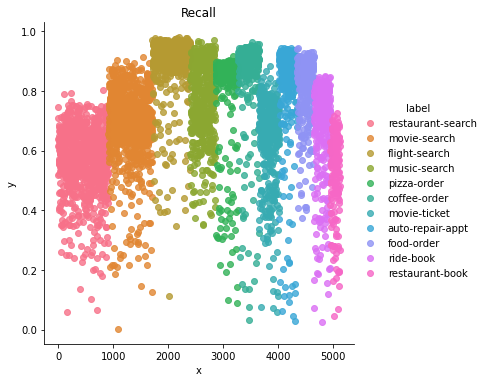

In [238]:
# graphing evaluation
recalls = pd.DataFrame(list(zip(eval_recall, eval_label)), columns=['y', 'label'])
recalls['x'] = recalls.index
print(recalls.head(5))
recall_graph = sns.lmplot(data=recalls, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_recalls = plt.gca()
ax_recalls.set_title("Recall")

          y              label  x
0  0.587559  restaurant-search  0
1  0.677470  restaurant-search  1
2  0.710925  restaurant-search  2
3  0.610559  restaurant-search  3
4  0.493466  restaurant-search  4


[Text(0.5, 6.79999999999999, 'i-th utterance'),
 Text(18.53611111111111, 0.5, 'F1 score')]

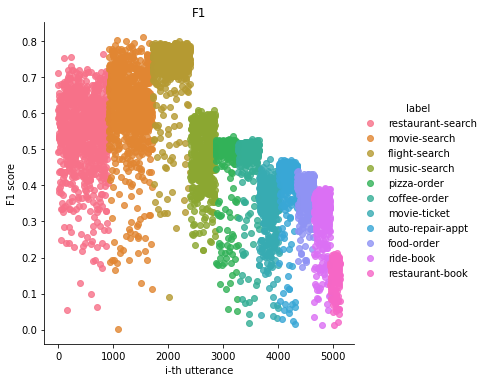

In [239]:
f1 = pd.DataFrame(list(zip(eval_f1, eval_label)), columns=['y', 'label'])
f1['x'] = f1.index
print(f1.head(5))
f1_graph = sns.lmplot(data=f1, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_f1 = plt.gca()
ax_f1.set_title("F1")
ax_f1.set(xlabel = 'i-th utterance', ylabel = 'F1 score')

          y              label  x
0  0.587559  restaurant-search  0
1  0.677470  restaurant-search  1
2  0.710925  restaurant-search  2
3  0.610559  restaurant-search  3
4  0.493466  restaurant-search  4


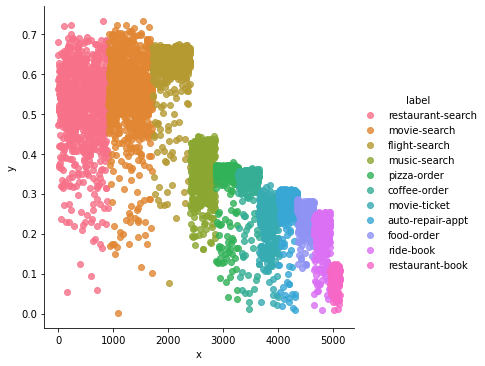

In [240]:
precision = pd.DataFrame(list(zip(eval_precision, eval_label)), columns=['y', 'label'])
precision['x'] = precision.index
print(f1.head(5))
f1_graph = sns.lmplot(data=precision, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)